In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def coth(a):
    if a>0: return (1+tf.math.exp(-2*a))/(1-tf.math.exp(-2*a))
    if a<0: return (tf.math.exp(2*a)+1)/(tf.math.exp(2*a)-1)
    if a==0: return 0

def tanh(a):
    if a>0: return (1-tf.math.exp(-2*a))/(1+tf.math.exp(-2*a))
    if a<0: return (tf.math.exp(2*a)-1)/(tf.math.exp(2*a)+1)
    if a==0: return 0

In [3]:
data=100
layer=10
n_ini=1.0
n_fin=0.1
dn=-0.1
m2=-1
lam=1
c_reg1=0.003
c_reg2=0.0001

<tf.Variable 'Variable:0' shape=(10,) dtype=float64, numpy=
array([ 0.65595989, -0.13527195,  2.08026842,  2.68564308,  0.12677432,
        1.10686058,  1.96952213,  3.90770574,  6.99767558,  9.35013625])>
tf.Tensor(
[ 3.01490951  3.02722263  3.04978824  3.09134316  3.16854751  3.31437385
  3.59861219  4.18820179  5.58607614 10.29821491], shape=(10,), dtype=float64)


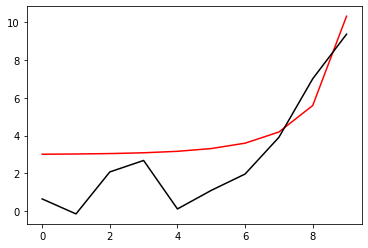

In [50]:
h=tf.zeros(layer)
h_in=[]
#h_in=[3.0205426, 3.022307 , 3.0291433, 3.04402  , 3.0732646, 3.131582 ,
# 3.2585216, 3.5762587, 4.59116  , 9.752249]
for i in range (layer):
#   midd=np.float64(10.0)
#    h_in.append(midd)
#    midd=3*coth(3*((i-layer)*dn)).numpy()
#    h_in.append(midd)
    mu=1/(1-i/10)
    h_inn=np.float64(np.random.normal(mu, 1))
    h_in.append(h_inn)
h=tf.Variable(h_in)
print(h)

h_real=tf.zeros(layer)
middd=[]
for i in range (layer):
    midd=3*coth(3*((i-layer)*dn)).numpy()
    middd.append(midd)
h_real=tf.constant(middd)
print(h_real)
plt.plot(h_real, 'r-')
plt.plot(h.numpy(), 'k-')
plt.show()

In [51]:
m2=tf.constant(np.float64(-1.0))
m2_2=tf.Variable(np.float64(np.random.uniform(-1.5, -0.5)))
print(m2_2)

lam=tf.constant(np.float64(1.0))
lam2=tf.Variable(np.float64(np.random.uniform(0.5, 1.5)))
print(lam2)

<tf.Variable 'Variable:0' shape=() dtype=float64, numpy=-0.685864191309126>
<tf.Variable 'Variable:0' shape=() dtype=float64, numpy=0.9707067171763504>


In [7]:
phi=tf.Variable(tf.zeros(1))
pi=tf.Variable(tf.zeros(1))

def F_func(m, la, a,b):
    return 2*b/n_fin-m*a-la*(a**3)

def t_func(a):
    return 0.5*(tf.math.tanh(100*(a-0.1))-tf.math.tanh(100*(a+0.1))+2)

def t_func2(a):
    return 0.5*(tanh(100*(a-0.1))-tanh(100*(a+0.1))+2)

In [8]:
def LP2(hh, m, la, phi, pi):
    for j in range (layer):
        phi1=phi+dn*pi
        pi1 =phi*m*dn+(1-dn*hh[j])*pi+dn*la*(phi1**3)
        phi=phi1
        pi=pi1
    return phi, pi
def NN_func_p(hh, m, la):
    Positive=[]
    while len(Positive)<data:
        phi1=np.random.uniform(0.0, 1.5, 10000)
        pi1=np.random.uniform(-0.2, 0.2, 10000)
        phi_1, pi_1=LP2(hh, m, la, phi1, pi1)
        for i in range (10000):
            if len(Positive)>=100: break
            if tf.math.abs(F_func(m, la, phi_1[i], pi_1[i]))<0.1: Positive.append([phi1[i], pi1[i]]), print(len(Positive))
            else: continue
    return Positive
def NN_func_n(hh, m, la):
    Negative=[]
    while len(Negative)<data:
        phi1=np.random.uniform(0.0, 1.5, 200)
        pi1=np.random.uniform(-0.2, 0.2, 200)
        phi_1, pi_1 = LP2(hh, m, la, phi1, pi1)
        for i in range (200):
            if len(Negative)>=100: break
            if tf.math.abs(F_func(m, la, phi_1[i], pi_1[i]))>=0.1: Negative.append([phi1[i], pi1[i]])
            else: continue
    return Negative
def NN_func_01(hh, m, la, list1):
    PP=[]
    NN=[]
    for i in range (data):
        phi=list1[i][0]
        pi=list1[i][1]
        if tf.math.abs(LP2(hh, m, la, phi, pi)[1])<0.1: PP.append([phi, pi])
        else: NN.append([phi, pi])
    return PP, NN

In [9]:
Positive=NN_func_p(h_real, m2, lam)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100


In [10]:
Negative=NN_func_n(h_real, m2, lam)

In [11]:
[Positive0, Positive1]=NN_func_01(h, m2_2, lam2, Positive)
[Negative0, Negative1]=NN_func_01(h, m2_2, lam2, Negative)

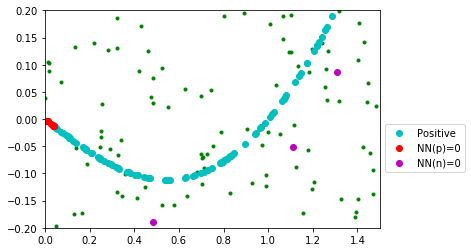

In [12]:
x_data1=[v[0] for v in Positive0]
y_data1=[v[1] for v in Positive0]
x_data2=[v[0] for v in Positive1]
y_data2=[v[1] for v in Positive1]
x_data3=[v[0] for v in Negative0]
y_data3=[v[1] for v in Negative0]
x_data4=[v[0] for v in Negative1]
y_data4=[v[1] for v in Negative1]
plt.plot(x_data4, y_data4, 'g.')
plt.plot(x_data2, y_data2, 'co', label='Positive')
plt.plot(x_data1, y_data1, 'ro', label='NN(p)=0')
plt.plot(x_data3, y_data3, 'mo', label='NN(n)=0')
plt.xlim(0.0, 1.5)
plt.ylim(-0.2, 0.2)
plt.legend(bbox_to_anchor=(1, 0.5))
plt.show()

# Error function

$E=\sum_{data} \left\vert y(\bar{x}^{(1)}) - \bar{y} \right\vert+E_{reg}(W)$
, $E_{reg}=c_{reg}^{(1)}\sum_{n=1}^{N-1}(\eta^{(n)})^{4}(h(\eta^{(n+1)})-h(\eta^{(n)}))^{2}+c_{reg}^{(2)}(h(\eta^{(N)})-1/\eta^{(N)})^{2}$

In [13]:
def Error_func(hh, m, la):
    phi0=np.array([v[0] for v in Positive])
    pi0=np.array([v[1] for v in Positive])
    phi1=np.array([v[0] for v in Negative])
    pi1=np.array([v[1] for v in Negative])
    phi_0, pi_0=LP2(hh, m, la, phi0, pi0)
    phi_1, pi_1=LP2(hh, m, la, phi1, pi1)
    PPlist=t_func(pi_0)
    NNlist=t_func(pi_1)
    sum_p=sum(PPlist)
    sum_n=data-sum(NNlist)

    inside=0
    for k in range (layer-1):
        second=((n_ini+k*dn)**4)*((hh[k+1]-hh[k])**2)
        inside=inside+second
    E_reg1=c_reg1*inside
    E_reg2=c_reg2*((hh[layer-1]-1/n_fin)**2)
    return E_reg1+E_reg2+sum_p+sum_n

In [14]:
print(Error_func(h_real, m2, lam))
print(Error_func(h, m2_2, lam2))

tf.Tensor(0.041417274750460996, shape=(), dtype=float64)
tf.Tensor(94.6357648204983, shape=(), dtype=float64)


In [29]:
def run():
    with tf.GradientTape() as g:
        loss=Error_func(h, m2_2, lam2) #돌리기전에 Error함수 수정 잊지말것
        gradients=g.gradient(loss, [h, m2_2, lam2])
    optimizer.apply_gradients(zip(gradients, [h, m2_2, lam2]))

100 55.03881635177626 -0.6231438425240121 0.9427312847410219
[ 0.74914749 -0.04183578  2.1737594   2.77925829  0.2205785   1.20080328
  2.03638505  3.90786854  6.9282083   9.26796692]


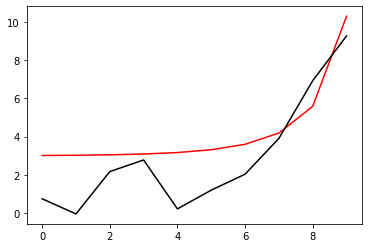

200 54.036222636967054 -0.6233836097965924 0.9349208084915576
[ 0.75424449 -0.0371397   2.17791492  2.78326412  0.224801    1.2054594
  2.04317236  3.9223644   6.93291977  9.2704405 ]


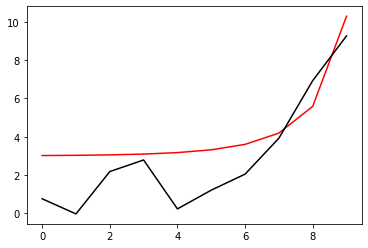

300 54.036181915984216 -0.6233460215177504 0.9349460900674099
[ 0.75426682 -0.03697365  2.1777024   2.78298345  0.22471896  1.2050895
  2.04248869  3.92037949  6.93208724  9.26996882]


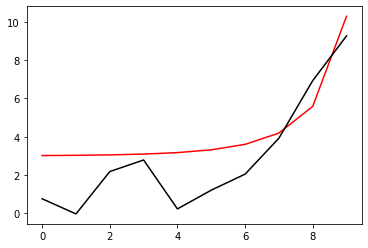

400 54.03614732170027 -0.6233171340919981 0.9349100436838558
[ 0.75431416 -0.03675316  2.17746235  2.78266054  0.224638    1.2046617
  2.04168951  3.91803392  6.93109626  9.26940577]


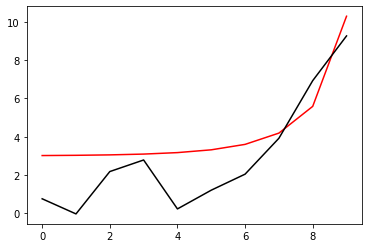

500 54.03610800666221 -0.623278039118158 0.9348605664077668
[ 0.75438605 -0.03648082  2.17719816  2.78230023  0.2245606   1.2041845
  2.0407932   3.91538839  6.92997558  9.26877012]


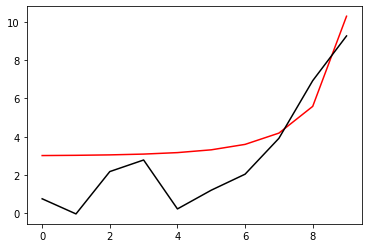

600 54.03606428646072 -0.6232326083265542 0.9348027918240716
[ 0.75447448 -0.03616573  2.17690365  2.78189667  0.22447911  1.20365169
  2.03979366  3.91244199  6.92873033  9.26806707]


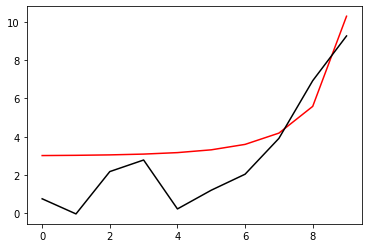

700 54.036016544962074 -0.623182429735487 0.9347389848530836
[ 0.75457693 -0.03581108  2.17657694  2.7814482   0.2243911   1.20306206
  2.0386915   3.90920538  6.9273682   9.2673027 ]


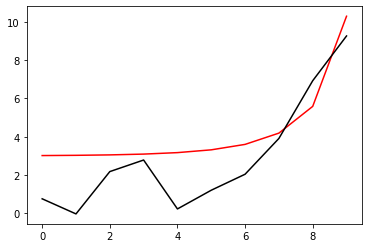

800 54.03596511487111 -0.6231281466731229 0.9346700457488611
[ 0.75469335 -0.03541737  2.17621786  2.7809547   0.22429639  1.20241633
  2.0374898   3.90569316  6.92589761  9.26648331]


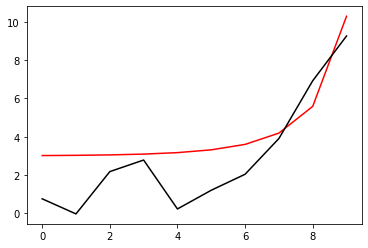

900 54.03591028481336 -0.6230701178805494 0.9345964683519675
[ 0.75482444 -0.03498409  2.17582651  2.78041622  0.22419539  1.2017154
  2.0361918   3.90191961  6.92432668  9.26561503]


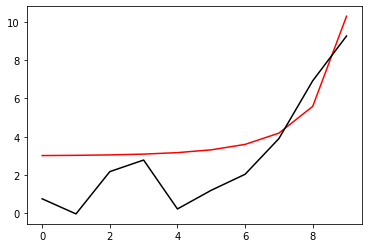

1000 54.03585231033772 -0.6230086322841648 0.9345186504729899
[ 0.75497117 -0.03451029  2.17540289  2.77983262  0.22408858  1.20095995
  2.03480032  3.89789787  6.9226631   9.26470386]


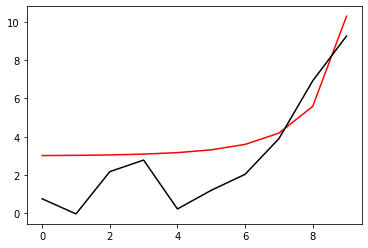

1100 54.03579142053218 -0.6229439608227918 0.9344369676429267
[ 0.75513466 -0.03399475  2.17494683  2.77920349  0.22397648  1.20015038
  2.03331775  3.89364005  6.92091427  9.26375569]


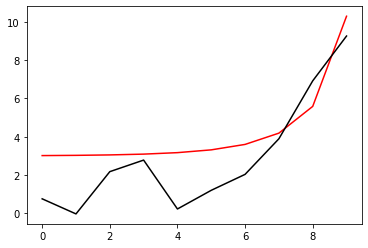

1200 54.035727821762634 -0.622876368806968 0.9343517900378119
[ 0.75531612 -0.03343603  2.17445802  2.77852824  0.22385954  1.19928686
  2.0317461   3.88915755  6.9190874   9.26277643]


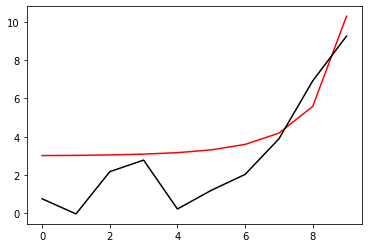

1300 54.03566169966339 -0.6228061206301283 0.9342634886361458
[ 0.75551685 -0.03283249  2.173936    2.77780605  0.22373826  1.19836935
  2.03008715  3.8844613   6.91718964  9.26177207]


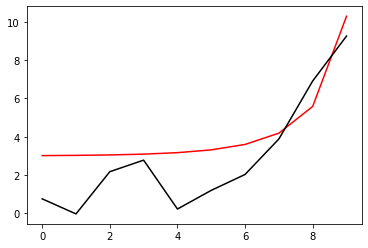

1400 54.03559322003669 -0.622733482599015 0.9341724388571908
[ 0.75573827 -0.03218232  2.17338019  2.77703594  0.22361311  1.19739767
  2.02834243  3.8795619   6.91522815  9.2607487 ]


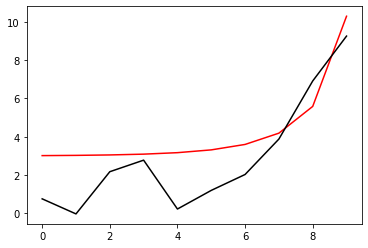

1500 54.03552252906028 -0.622658724844512 0.9340790230054162
[ 0.7559819  -0.03148352  2.17278993  2.77621678  0.22348456  1.19637144
  2.02651331  3.87446975  6.91321015  9.25971255]


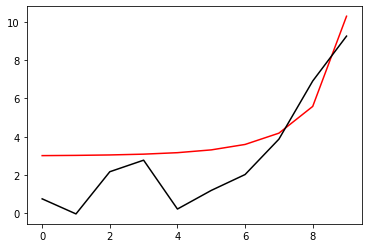

1600 54.035449753063105 -0.6225821225898763 0.9339836318820615
[ 0.75624931 -0.03073393  2.17216445  2.7753473   0.22335308  1.19529018
  2.02460098  3.86919511  6.91114294  9.25867002]


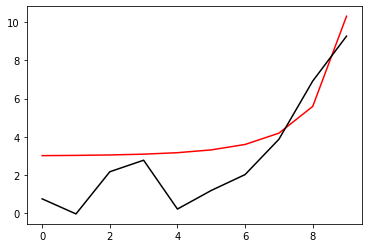

1700 54.03537499804451 -0.6225039569259412 0.9338866657551983
[ 0.7565422  -0.02993123  2.17150286  2.77442606  0.22321917  1.19415328
  2.0226065   3.86374816  6.90903391  9.25762768]


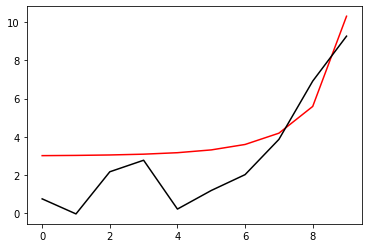

1800 54.03529834906267 -0.6224245151896208 0.933788534811374
[ 0.75686235 -0.02907293  2.17080422  2.7734515   0.2230833   1.19295997
  2.02053078  3.85813898  6.90689058  9.25659224]


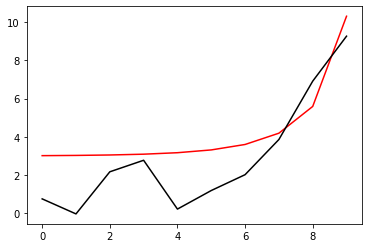

1900 54.0352198695857 -0.622344091010289 0.9336896591714533
[ 0.75721161 -0.02815641  2.17006746  2.77242191  0.22294598  1.19170938
  2.01837459  3.85237758  6.90472057  9.25557062]


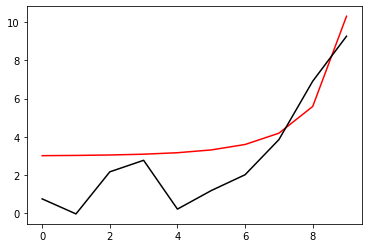

2000 54.03513960087586 -0.6222629840685933 0.9335904685277955
[ 0.75759192 -0.02717886  2.16929144  2.77133545  0.22280771  1.1904005
  2.01613857  3.8464739   6.90253157  9.25456988]


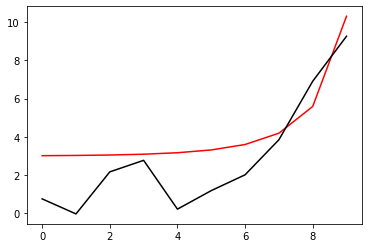

2100 54.035057561462764 -0.6221814995994708 0.9334914014436635
[ 0.75800533 -0.02613734  2.16847492  2.77019013  0.22266899  1.18903221
  2.0138232   3.84043774  6.90033141  9.25359724]


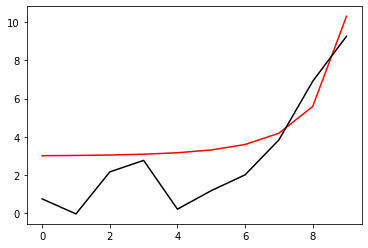

2200 54.0349737467477 -0.6220999476629777 0.9333929043454179
[ 0.75845393 -0.02502874  2.16761655  2.76898381  0.22253036  1.18760324
  2.01142882  3.83427876  6.89812793  9.25266007]


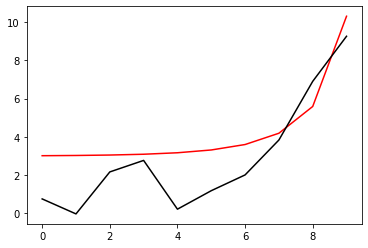

2300 54.034888128772764 -0.6220186422015056 0.9332954302317016
[ 0.75893991 -0.02384979  2.1667149   2.76771421  0.22239233  1.1861122
  2.00895558  3.82800642  6.89592904  9.25176585]


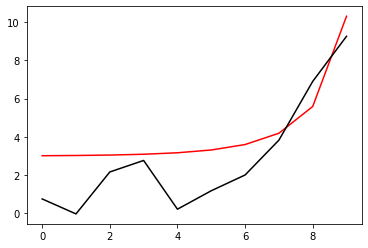

2400 54.03480065617884 -0.6219378998990248 0.9331994371201392
[ 0.75946553 -0.02259708  2.16576844  2.7663789   0.22225545  1.18455754
  2.00640346  3.82162994  6.89374266  9.25092216]


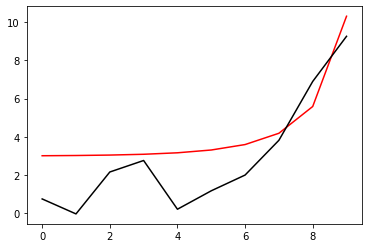

2500 54.03471125437103 -0.6218580388565987 0.9331053862503688
[ 0.76003312 -0.021267    2.16477552  2.76497529  0.22212026  1.18293759
  2.00377225  3.81515822  6.89157668  9.25013667]


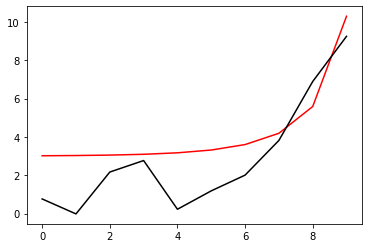

2600 54.03461982589967 -0.6217793770981365 0.9330137400619439
[ 0.76064509 -0.01985581  2.1637344   2.76350063  0.22198734  1.1812505
  2.00106153  3.80859978  6.88943892  9.2494171 ]


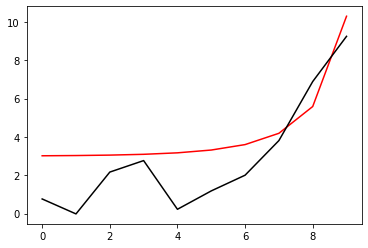

2700 54.03452625106299 -0.621702230920941 0.9329249599664601
[ 0.76130389 -0.01835959  2.16264321  2.761952    0.22185725  1.17949429
  1.99827062  3.80196268  6.88733713  9.24877119]


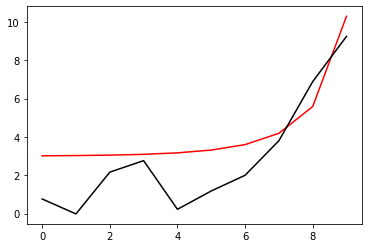

2800 54.034430388727735 -0.6216269131068969 0.9328395039350195
[ 0.76201204 -0.01677426  2.16149998  2.76032632  0.22173059  1.1776668
  1.99539862  3.79525446  6.88527887  9.24820668]


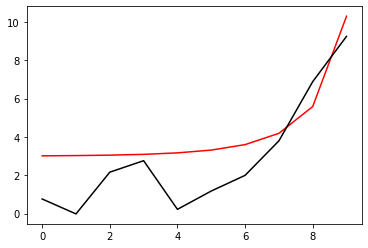

2900 54.03433207736029 -0.6215537310119823 0.9327578239245667
[ 0.76277213 -0.01509556  2.16030261  2.75862031  0.22160796  1.1757657
  1.99244434  3.78848204  6.88327156  9.24773128]


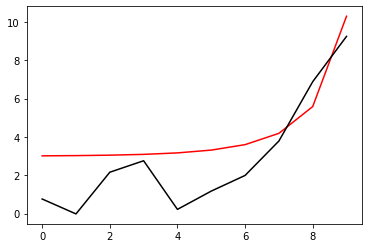

3000 54.03423113625539 -0.6214829845541198 0.9326803631697617
[ 0.76358678 -0.01331907  2.15904888  2.75683054  0.22148999  1.17378849
  1.98940631  3.78165164  6.88132236  9.24735261]


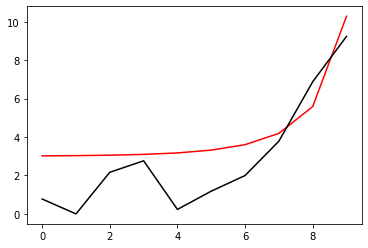

3100 54.034127366944006 -0.621414964122079 0.9326075533706099
[ 0.76445866 -0.01144017  2.15773645  2.75495336  0.22137733  1.17173248
  1.98628274  3.7747687   6.87943815  9.2470782 ]


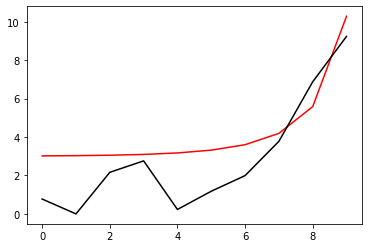

3200 54.03402055475774 -0.621349948431166 0.9325398118101192
[ 0.76539048 -0.0094541   2.15636282  2.75298495  0.22127063  1.16959478
  1.98307152  3.76783778  6.87762547  9.24691544]


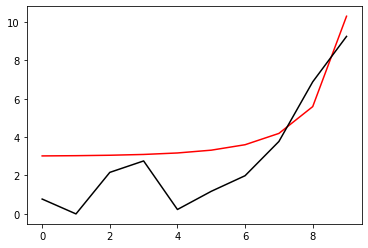

3300 54.033910470524006 -0.6212882023546612 0.9324775384405386
[ 7.66384981e-01 -7.35589297e-03  2.15492539e+00  2.75092126e+00
  2.21170612e-01  1.16737234e+00  1.97977017e+00  3.76086249e+00
  6.87589047e+00  9.24687154e+00]


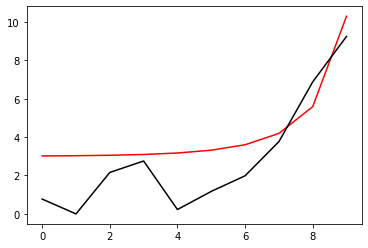

3400 54.03379687236256 -0.6212299747633118 0.9324211129812081
[ 7.67444933e-01 -5.14040199e-03  2.15342138e+00  2.74875805e+00
  2.21077991e-01  1.16506186e+00  1.97637586e+00  3.75384540e+00
  6.87423890e+00  9.24695349e+00]


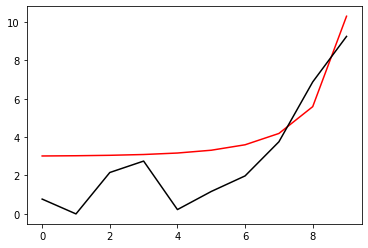

3500 54.03367950755124 -0.6211754964084939 0.9323708920754866
[ 7.68573122e-01 -2.80230029e-03  2.15184790e+00  2.74649088e+00
  2.20993533e-01  1.16265988e+00  1.97288535e+00  3.74678793e+00
  6.87267600e+00  9.24716806e+00]


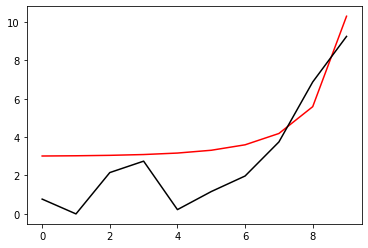

3600 54.03355811442911 -0.6211249778878091 0.932327206558431
[ 7.69772352e-01 -3.36070050e-04  2.15020186e+00  2.74411505e+00
  2.20918042e-01  1.16016269e+00  1.96929501e+00  3.73969033e+00
  6.87120648e+00  9.24752171e+00]


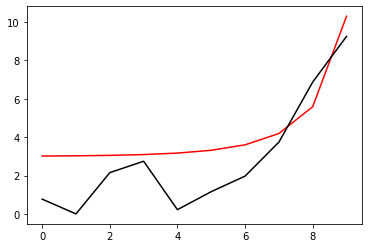

3700 54.03343242430215 -0.6210786077346229 0.9322903588906108
[7.71045432e-01 2.26399839e-03 2.14848007e+00 2.74162566e+00
 2.20852367e-01 1.15756638e+00 1.96560077e+00 3.73255154e+00
 6.86983451e+00 9.24802063e+00]


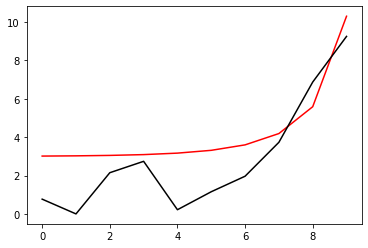

3800 54.033302163319846 -0.6210365506752384 0.9322606208163744
[7.72395173e-01 5.00380981e-03 2.14667914e+00 2.73901759e+00
 2.20797410e-01 1.15486684e+00 1.96179815e+00 3.72536920e+00
 6.86856362e+00 9.24867065e+00]


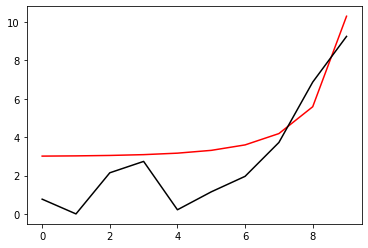

3900 54.033167054291305 -0.6209989460987314 0.9322382313066804
[7.73824383e-01 7.88946755e-03 2.14479553e+00 2.73628544e+00
 2.20754128e-01 1.15205971e+00 1.95788221e+00 3.71813955e+00
 6.86739673e+00 9.24947724e+00]


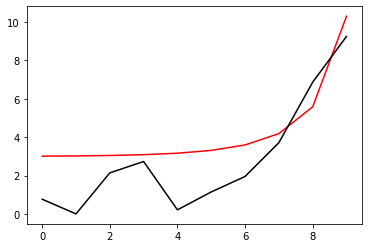

4000 54.03302681841204 -0.6209659067846911 0.9322233948469327
[0.77533586 0.01092728 2.14282554 2.7334236  0.22072355 1.14914044
 1.95384755 3.71085738 6.86633607 9.25044553]


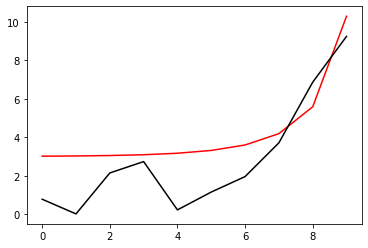

4100 54.032881176877716 -0.6209375179329902 0.9322162801287349
[0.77693239 0.01412375 2.1407653  2.7304262  0.22070677 1.14610424
 1.94968833 3.70351607 6.8653832  9.25158021]


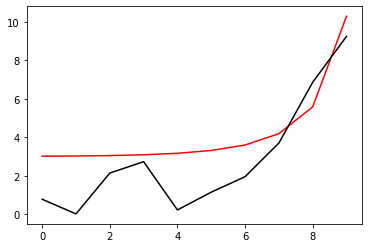

4200 54.032729852365094 -0.6209138365369073 0.9322170192007412
[0.77861674 0.01748561 2.13861074 2.7272871  0.22070497 1.14294612
 1.94539825 3.6961075  6.86453897 9.25288563]


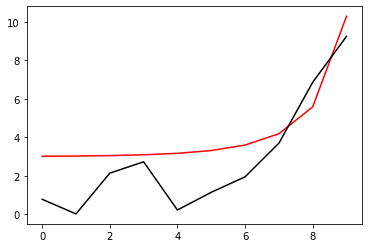

4300 54.03257257036643 -0.620894891136324 0.9322257071275611
[0.78039166 0.02101978 2.13635767 2.72399992 0.22071943 1.13966087
 1.94097055 3.68862212 6.86380356 9.2543657 ]


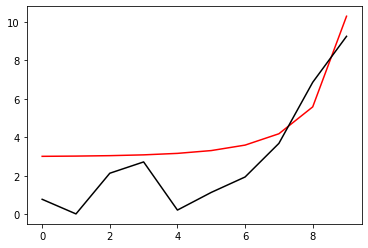

4400 54.03240906037025 -0.6208806819810253 0.9322424021966753
[0.78225986 0.02473343 2.13400168 2.720558   0.22075152 1.13624307
 1.93639804 3.68104894 6.86317641 9.25602396]


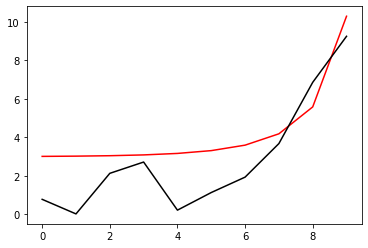

4500 54.03223905688746 -0.6208711816253928 0.9322671267015091
[0.78422404 0.02863393 2.1315382  2.71695441 0.22080274 1.13268711
 1.93167308 3.67337558 6.86265634 9.2578636 ]


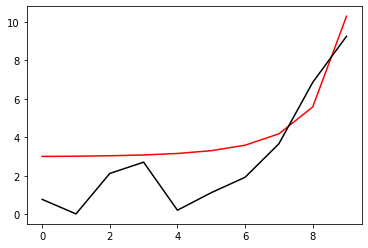

4600 54.032062300330196 -0.6208663359649194 0.9322998683141619
[0.78628687 0.03272889 2.12896249 2.71318195 0.22087471 1.12898719
 1.92678765 3.66558836 6.86224149 9.25988742]


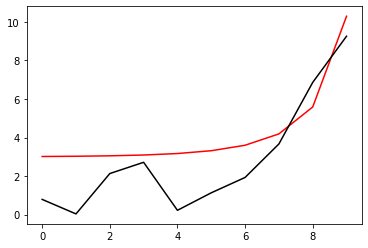

4700 54.03187853775543 -0.6208660657122463 0.9323405820440956
[0.78845098 0.03702613 2.12626964 2.70923316 0.22096918 1.12513734
 1.92173332 3.65767236 6.8619294  9.26209793]


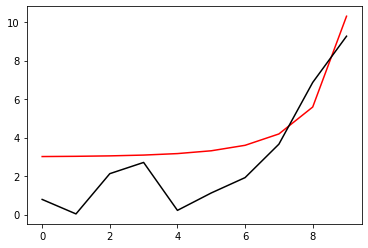

4800 54.03168752349364 -0.6208702682961382 0.932389192759784
[0.79071899 0.04153373 2.12345457 2.70510028 0.22108806 1.12113142
 1.91650131 3.64961152 6.86171707 9.26449735]


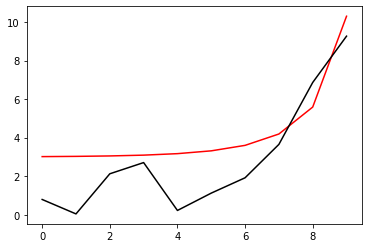

4900 54.031489019685345 -0.6208788201514746 0.932445598229601
[0.79309347 0.04626    2.12051201 2.70077527 0.22123345 1.11696314
 1.91108251 3.6413888  6.86160098 9.26708767]


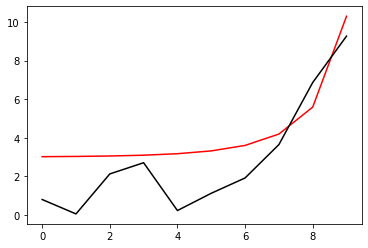

5000 54.031282796754994 -0.6208915793526811 0.9325096726170624
[0.79557699 0.05121348 2.11743657 2.69624981 0.22140759 1.11262609
 1.90546752 3.63298628 6.86157717 9.26987068]


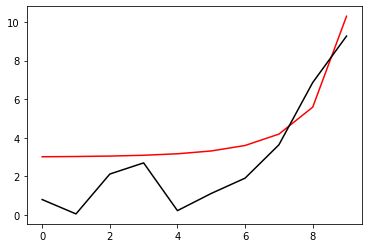

In [53]:
optimizer=tf.optimizers.Adam(learning_rate=0.001)
for i in range (1, 5001):
    run()
    if i%100==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

100 54.0299152793184 -0.6214393530932452 0.9335458099847161
[0.81320799 0.08623781 2.09319208 2.6632976  0.22394106 1.0856213
 1.88098671 3.61392364 6.85722565 9.29340167]


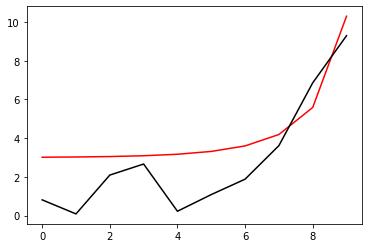

200 54.02797398993225 -0.6214109164469882 0.9339092508325038
[0.83763872 0.13527452 2.05279182 2.61240702 0.22544375 1.04196755
 1.83960588 3.57832932 6.84031256 9.32218247]


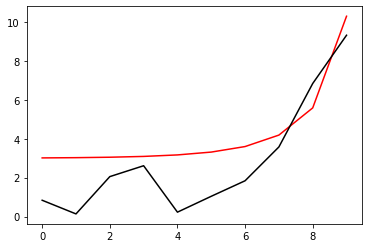

300 54.02593313029595 -0.6213933237082563 0.9343326184185817
[0.86577496 0.18942225 2.00680591 2.55624467 0.23013601 0.99372959
 1.79312389 3.53707382 6.81882082 9.35577287]


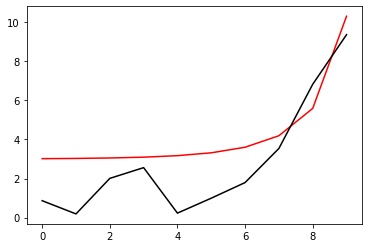

400 54.02394314858688 -0.621391452953251 0.9347970751931467
[0.89533837 0.24543312 1.95850975 2.49792877 0.23875446 0.94418466
 1.74470891 3.49311025 6.79413872 9.39195449]


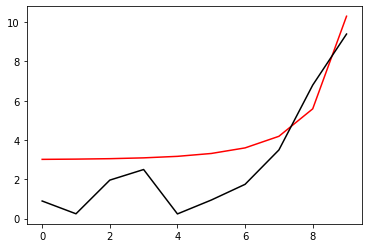

500 54.02206108887852 -0.6214098033102419 0.9352941293899738
[0.92520666 0.30187977 1.90956666 2.43879035 0.25150684 0.89479895
 1.69578364 3.44791056 6.76717342 9.42965123]


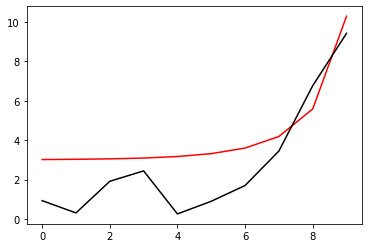

600 54.02030797479041 -0.6214512096778785 0.9358203330503835
[0.95480533 0.35801836 1.86094507 2.37951039 0.26824074 0.84632318
 1.64704883 3.40226928 6.73854123 9.46824612]


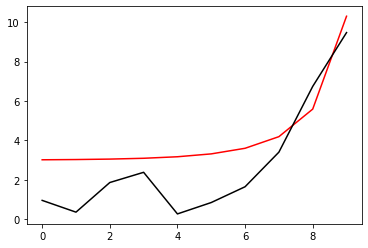

700 54.01868941366907 -0.6215173218786051 0.9363742283930191
[0.9838466  0.41341922 1.81326216 2.32048555 0.28857938 0.79918679
 1.59887214 3.35664298 6.70868359 9.50735069]


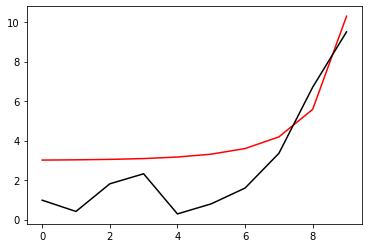

800 54.0172042146222 -0.621609093477948 0.9369552500225745
[1.01219345 0.46781423 1.76693882 2.26197418 0.31202305 0.75366878
 1.55146402 3.31131628 6.67794047 9.54670608]


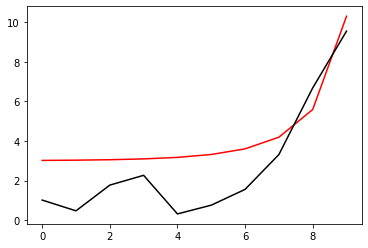

900 54.015848241255256 -0.6217272321707223 0.9375633788286172
[1.03978184 0.52102397 1.7222773  2.20416275 0.33802449 0.70998113
 1.5049665  3.2664907  6.64659753 9.58613314]


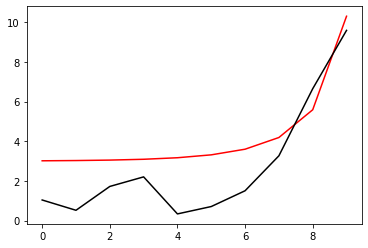

1000 54.01461618594442 -0.6218725926578715 0.938199104188402
[1.06657273 0.57291918 1.67950303 2.14719916 0.36604397 0.66831384
 1.45950236 3.22233588 6.61491763 9.62550427]


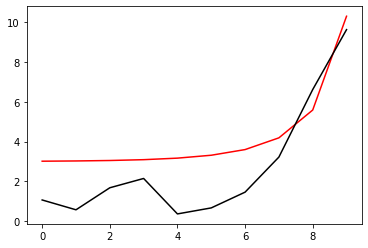

1100 54.01350238793896 -0.6220464798166945 0.9388634676255404
[1.09252114 0.62339837 1.63878802 2.09121086 0.39558821 0.62886212
 1.41520486 3.17902113 6.58316183 9.66472521]


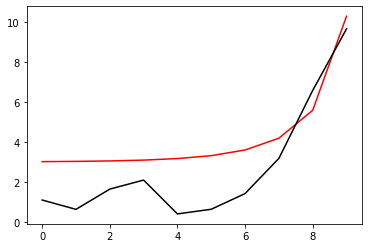

1200 54.01250118498647 -0.6222508203148408 0.9395580490823707
[1.11755563 0.67237387 1.60026416 2.03631536 0.42623578 0.59184387
 1.37223631 3.13673483 6.55160122 9.70371969]


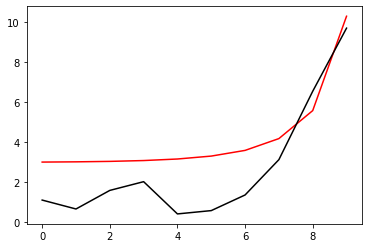

1300 54.011607009189156 -0.6224881508436714 0.9402847975631538
[1.14156626 0.71976269 1.56403054 1.98262648 0.45765005 0.55751058
 1.33079852 3.09569376 6.52051788 9.74241253]


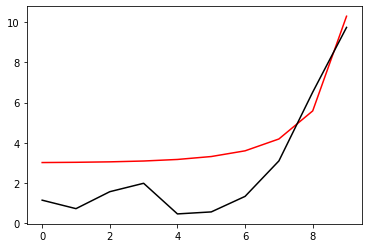

1400 54.01081431544613 -0.6227613676834675 0.9410456376179325
[1.16440126 0.76548081 1.53015702 1.93025721 0.48957921 0.52615065
 1.29113418 3.05614148 6.49019203 9.78070832]


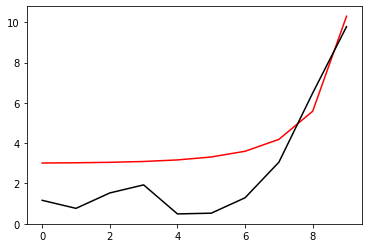

1500 54.01011739222861 -0.623073209916004 0.9418418400373019
[1.18587419 0.80944058 1.49868557 1.87931968 0.52184222 0.49808303
 1.2535175  3.01833382 6.46087303 9.81846574]


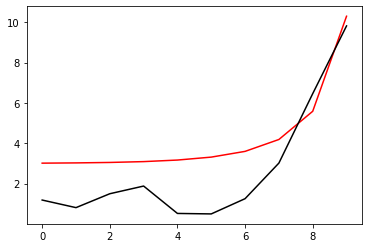

1600 54.00951011704117 -0.6234255351980437 0.9426732600796753
[1.20578324 0.8515514  1.46963032 1.82992218 0.55430105 0.47363872
 1.2182328  2.98251122 6.43273679 9.85547235]


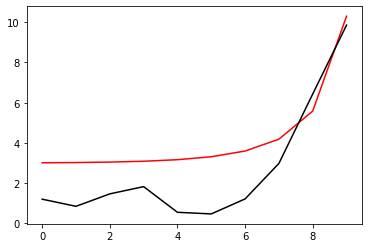

1700 54.008985751709254 -0.6238185870768803 0.943537703132698
[1.22394144 0.89172374 1.44297754 1.78216387 0.58682355 0.45313093
 1.18554362 2.94886291 6.40584044 9.89143002]


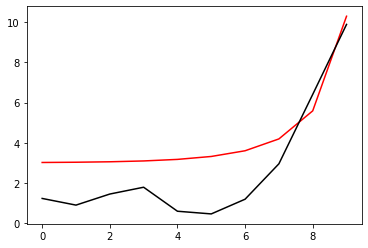

1800 54.00853688278463 -0.6242505662496357 0.9444307726419205
[1.2402122  0.92987554 1.41868628 1.73612882 0.6192465  0.43681882
 1.15565952 2.91749308 6.38009223 9.92596259]


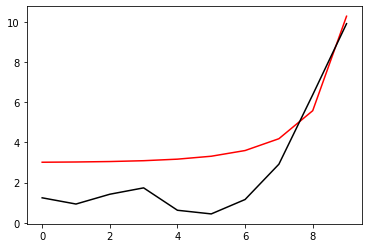

1900 54.00815556577054 -0.6247177736765722 0.9453464424277884
[1.25454036 0.9659395  1.39669024 1.69188128 0.651351   0.42487411
 1.12871117 2.88840173 6.35525383 9.95865091]


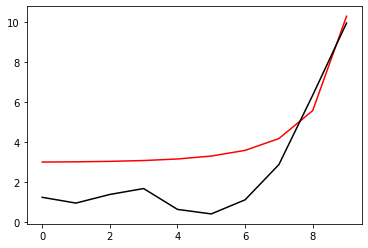

2000 54.00783364113076 -0.625215341211749 0.9462782517793439
[1.26696886 0.99986907 1.37690071 1.64946383 0.68285901 0.41735975
 1.10474176 2.86148764 6.3309787  9.98908724]


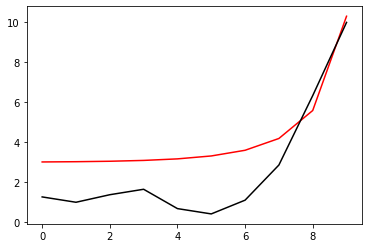

2100 54.00756311512451 -0.6257382543810435 0.9472206637353117
[ 1.27763597  1.03164186  1.35921015  1.60889896  0.71345125  0.41422537
  1.08371619  2.83657121  6.30687285 10.01693016]


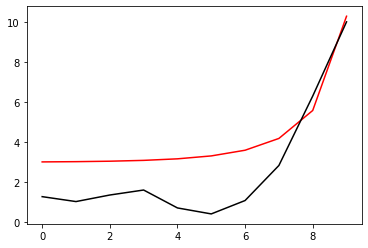

2200 54.00733648982039 -0.6262822454775464 0.9481700470547448
[ 1.28675544  1.0612603   1.34349584  1.57019312  0.74279852  0.41531749
  1.06554245  2.81342709  6.28255482 10.04194134]


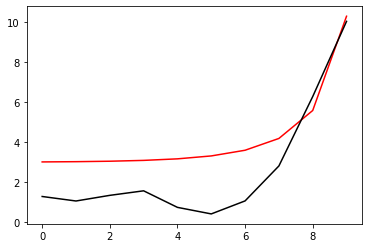

2300 54.007146976426185 -0.6268442750922484 0.9491249939965171
[ 1.29458697  1.08875013  1.32962328  1.53334155  0.77059518  0.42039901
  1.05009667  2.79181564  6.2576975  10.06399654]


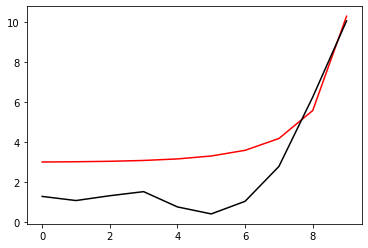

2400 54.006988587193874 -0.6274225751756446 0.950086038143126
[ 1.30140561  1.11415787  1.31744933  1.49833273  0.79658651  0.42917141
  1.03724492  2.77150627  6.2320465  10.08307494]


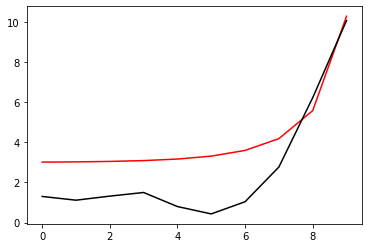

2500 54.00685613748192 -0.6280164034574953 0.9510550436799444
[ 1.3074761   1.13754801  1.30682523  1.46515152  0.82058569  0.44129545
  1.02685848  2.75229145  6.20541995 10.09923692]


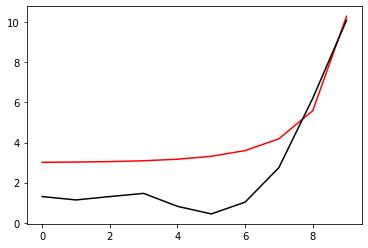

2600 54.00674519640047 -0.6286256948768013 0.9520345453568771
[ 1.31303501  1.15900026  1.29759972  1.43378095  0.84248077  0.45640844
  1.01882208  2.73399264  6.17769807 10.11259972]


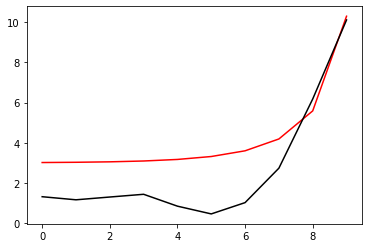

2700 54.006652015049376 -0.6292507427388921 0.9530272166245144
[ 1.31828083  1.17860706  1.28962207  1.40420281  0.86223338  0.47413756
  1.01303623  2.71646095  6.14880926 10.12331655]


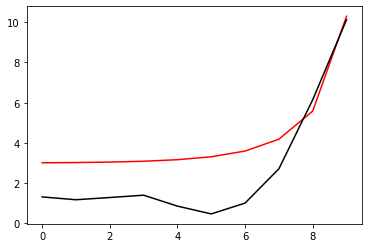

2800 54.006573448903694 -0.6298919709216685 0.9540355314080342
[ 1.32337063  1.19647123  1.28274528  1.37639743  0.87987182  0.49410987
  1.00941549  2.69957471  6.11871679 10.13156119]


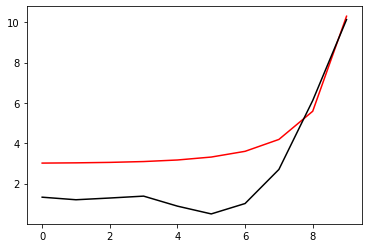

2900 54.006506881808384 -0.6305498057701161 0.9550616092806898
[ 1.32842151  1.21270378  1.27682921  1.35034304  0.89548094  0.51595971
  1.00788415  2.68323548  6.087408   10.13751794]


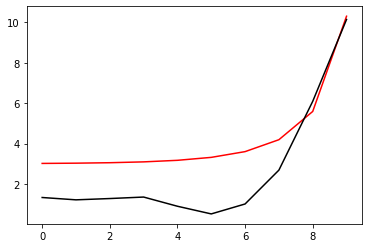

3000 54.00645015424551 -0.631224628898549 0.9561071983578998
[ 1.33351502  1.22742179  1.27174338  1.32601497  0.90919028  0.53933416
  1.00837081  2.66736381  6.05488615 10.14137555]


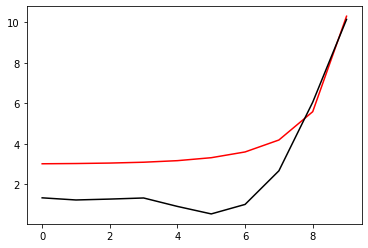

3100 54.00640149670896 -0.6319167833884839 0.9571737425961181
[ 1.33870298  1.24074632  1.26736955  1.30338498  0.92116206  0.56389734
  1.01080292  2.65189511  6.02116492 10.14332393]


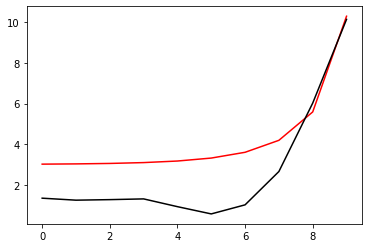

3200 54.00635946860749 -0.6326266075585103 0.9582624871730536
[ 1.34401368  1.25280044  1.2636037   1.28242076  0.93157982  0.58933369
  1.01510188  2.63677626  5.98626469 10.14355222]


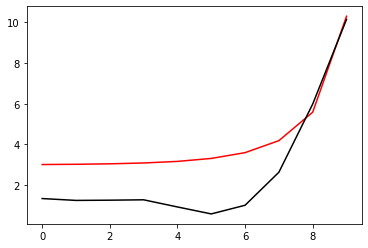

3300 54.00632290310793 -0.6333544765677651 0.9593745881530502
[ 1.34945762  1.26370735  1.26035745  1.26308577  0.9406382   0.6153507
  1.02117933  2.62196291  5.95021038 10.14224742]


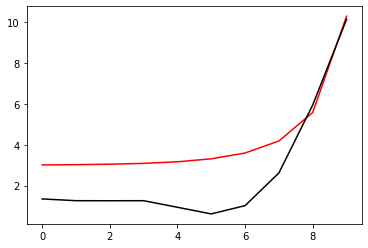

3400 54.00629085827602 -0.6341008390865208 0.960511205568003
[ 1.35503258  1.27358865  1.25755875  1.24533943  0.94853436  0.64168096
  1.02893472  2.60741753  5.91303018 10.13959305]


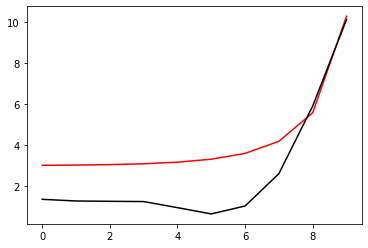

3500 54.00626257468041 -0.63486624239284 0.9616735699160344
[ 1.36072762  1.28256276  1.25515192  1.22913754  0.95546107  0.66808379
  1.03825421  2.59310815  5.87475499 10.13576754]


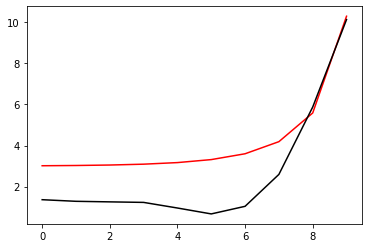

3600 54.006237439361264 -0.6356513438639145 0.9628630200278873
[ 1.3665263   1.29074354  1.25309698  1.21443293  0.96160156  0.69434624
  1.04901088  2.57900752  5.83541812 10.13094232]


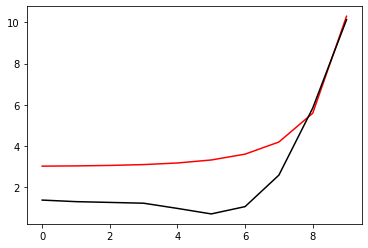

3700 54.0062149558052 -0.6364569098380881 0.9640810152780862
[ 1.37240897  1.2982392   1.25136838  1.20117632  0.96712584  0.72028356
  1.06106584  2.56509266  5.7950552  10.1252797 ]


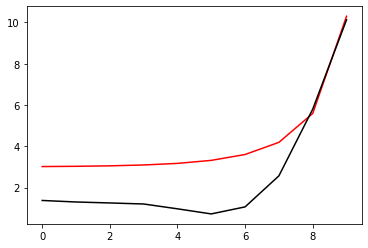

3800 54.00619471938207 -0.6372838044367882 0.9653291276712126
[ 1.37835463  1.3051513   1.24995326  1.1893172   0.97218848  0.74573916
  1.07427024  2.55134459  5.75370415 10.11893073]


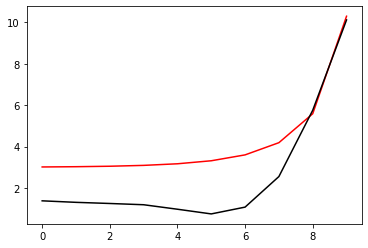

3900 54.00617639759012 -0.6381329714854909 0.9666090200399761
[ 1.38434206  1.3115741   1.24884933  1.17880469  0.97692758  0.77058404
  1.08846776  2.5377481   5.71140514 10.1120332 ]


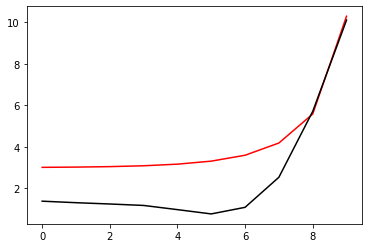

4000 54.00615971442395 -0.6390054125109056 0.9679224160931752
[ 1.39035086  1.31759406  1.24806263  1.16958836  0.98146456  0.79471576
  1.10349743  2.52429141  5.66820044 10.10470998]


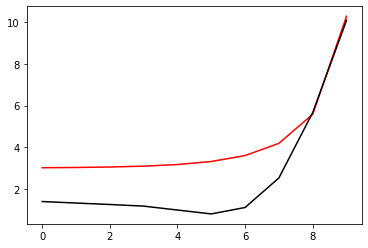

4100 54.0061444381985 -0.6399021632306253 0.9692710669067333
[ 1.39636207  1.32328954  1.24760509  1.16161886  0.98590476  0.81805706
  1.11919651  2.51096584  5.6241342  10.0970678 ]


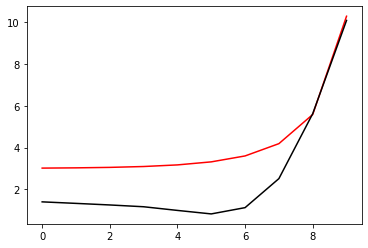

4200 54.00613037221221 -0.6408242702368003 0.9706567170882247
[ 1.40235868  1.32873073  1.24749238  1.1548484   0.99033853  0.84055414
  1.13540337  2.49776525  5.57925217 10.08919651]


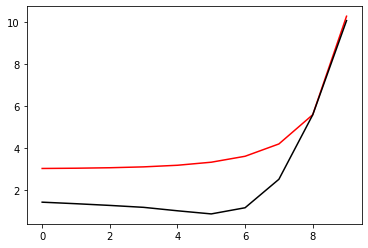

4300 54.006117347698066 -0.6417727688773708 0.9720810725535318
[ 1.40832601  1.33397972  1.24774173  1.14923103  0.9948426   0.86217473
  1.15196011  2.48468544  5.53360134 10.08116904]


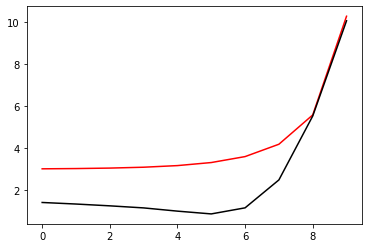

4400 54.006105218579116 -0.6427486627587543 0.97354577079786
[ 1.41425194  1.33909075  1.24837024  1.14472276  0.99948163  0.88290595
  1.16871506  2.47172335  5.48722948 10.0730418 ]


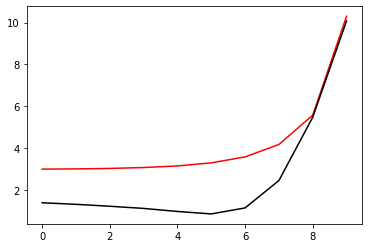

4500 54.00609385761607 -0.6437529048795141 0.9750523537900447
[ 1.42012703  1.34411057  1.2493934   1.14128142  1.00430977  0.90275213
  1.18552488  2.4588763   5.44018469 10.06485564]


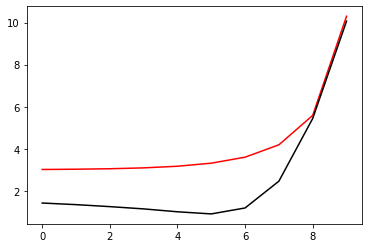

4600 54.006083153600365 -0.6447863801617912 0.9766022431690814
[ 1.42594455  1.3490789   1.25082403  1.13886648  1.0093722   0.92173255
  1.20225641  2.44614111  5.39251494 10.05663729]


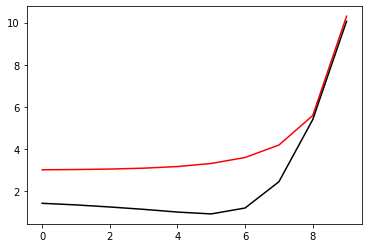

4700 54.00607300930917 -0.6458498890565739 0.9781967172340074
[ 1.43170038  1.35402901  1.25267148  1.13743868  1.01470639  0.93987912
  1.21878821  2.43351338  5.34426756 10.04840109]


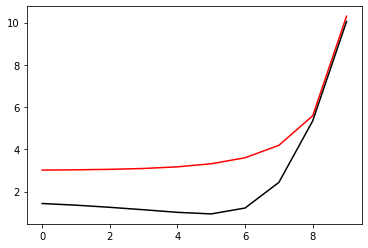

4800 54.00606333999676 -0.6469441319251538 0.979836889229885
[ 1.43739284  1.3589883   1.25494128  1.13695967  1.0203433   0.95723423
  1.23501181  2.42098673  5.29548877 10.04015104]


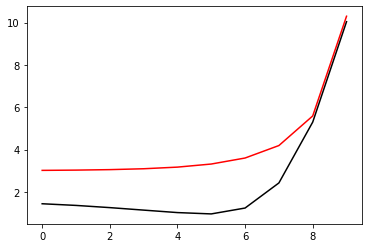

4900 54.006054072248084 -0.6480696940012676 0.9815236865741036
[ 1.44302247  1.36397896  1.25763497  1.13739158  1.02630819  0.97384852
  1.25083264  2.4085523   5.24622326 10.03188295]


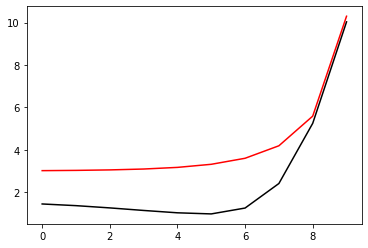

5000 54.006045143064505 -0.6492270308755311 0.9832578308718029
[ 1.44859171  1.36901862  1.26075013  1.13869661  1.03262135  0.98977891
  1.26617069  2.39619834  5.19651384 10.02358659]


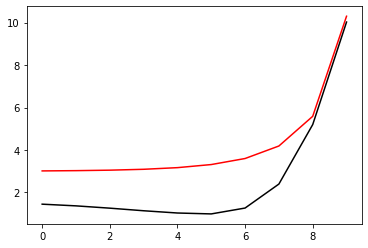

5100 54.006036499089184 -0.6504164545808043 0.9850398187806243
[ 1.45410454  1.37412092  1.26428068  1.14083672  1.03929854  1.00508658
  1.28096093  2.38391006  5.14640108 10.01524778]


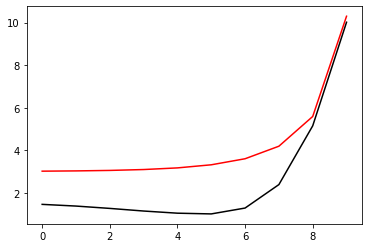

5200 54.00602809590744 -0.6516381203871859 0.9868699040258355
[ 1.4595662   1.37929612  1.26821715  1.14377333  1.04635128  1.01983524
  1.29515342  2.37166973  5.09592309 10.00685037]


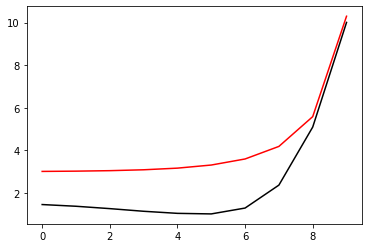

5300 54.00602066144905 -0.6527989148364526 0.9885949635720392
[1.46484585 1.38444163 1.27210036 1.14710424 1.05234656 1.0328696
 1.30728063 2.35996662 5.04991522 9.99908491]


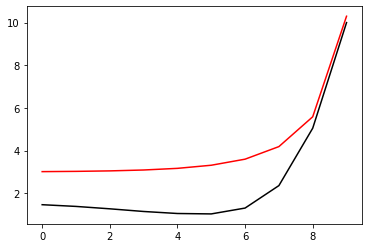

5400 54.0060138072236 -0.6538643276367078 0.9902056777216542
[1.46894613 1.38914157 1.27605355 1.15087256 1.05858943 1.04505852
 1.3184261  2.34943617 5.00791474 9.99129951]


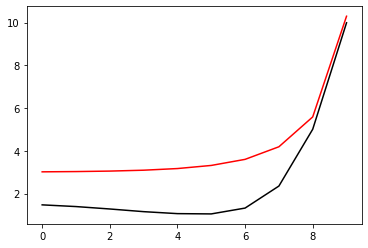

5500 54.0060071062946 -0.6549737793777305 0.9918669964755484
[1.47338523 1.39381077 1.28033706 1.15510054 1.06520798 1.05674184
 1.32898066 2.33869111 4.96509723 9.98357485]


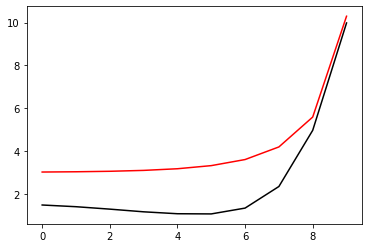

5600 54.006000452504146 -0.6561168109182479 0.9935787033630852
[1.47790113 1.39852703 1.28491521 1.15984527 1.07230021 1.06814846
 1.33909031 2.32787518 4.92158755 9.9758449 ]


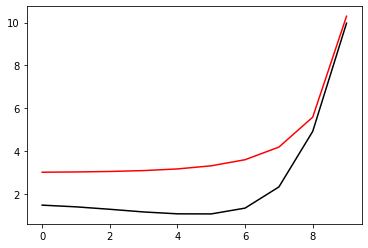

5700 54.00599384107338 -0.6572921695798292 0.9953386981241102
[1.48245022 1.40331936 1.28977099 1.16510127 1.07982249 1.0793644
 1.34876673 2.31698863 4.87743228 9.96807393]


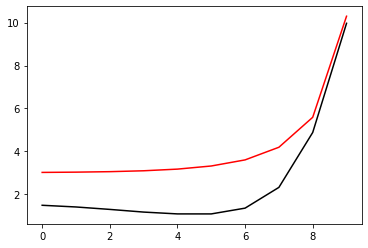

5800 54.005987270828754 -0.6584992131477607 0.9971460031080994
[1.48702626 1.40820072 1.2948952  1.1708467  1.08773494 1.09044592
 1.35801565 2.30601738 4.83267472 9.96024312]


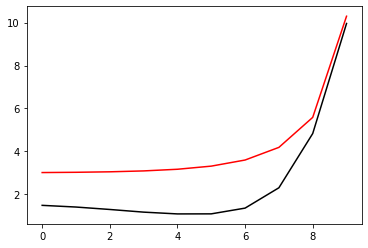

5900 54.00598198913623 -0.6596853750229444 0.9988710388353994
[1.49178689 1.41314777 1.29987294 1.17666656 1.0947279  1.100401
 1.36581906 2.2953896  4.79061777 9.95327195]


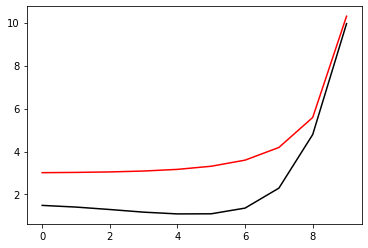

6000 54.00597583105242 -0.6606968702894138 1.0004370458032192
[1.49494198 1.41748399 1.30460814 1.1824966  1.10159628 1.1097098
 1.37286951 2.2862786  4.75333184 9.94635054]


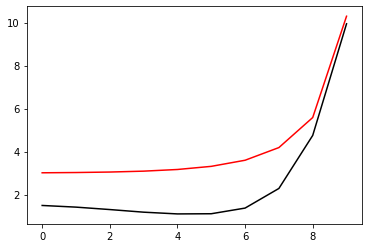

6100 54.005970482276474 -0.6617673437965681 1.0020395164613805
[1.4986903  1.4217896  1.30954999 1.18845998 1.10875052 1.11875931
 1.37951514 2.27683987 4.7152664  9.93958282]


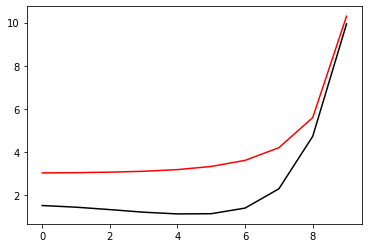

6200 54.00596512318859 -0.6628688486622624 1.0036883761775621
[1.50256555 1.42616755 1.3146647  1.19468084 1.1163188  1.12782556
 1.38597061 2.26722145 4.67644453 9.93272244]


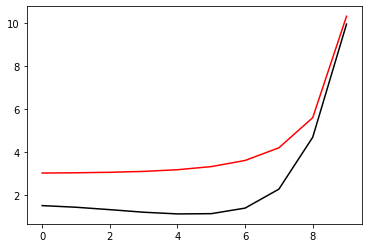

6300 54.005959762292754 -0.6639998102396928 1.0053812417190668
[1.50651633 1.43063745 1.31994807 1.20117751 1.12424126 1.13697219
 1.39226648 2.25743496 4.63689883 9.92574589]


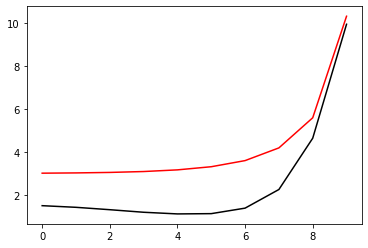

6400 54.00595440926976 -0.6651594155459014 1.00711688216124
[1.51053514 1.43520387 1.32539972 1.2079452  1.13247029 1.14622552
 1.39841908 2.24747884 4.59666187 9.91864974]


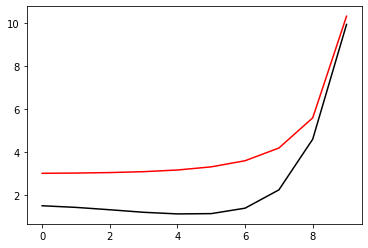

6500 54.00594967514889 -0.6663352340192945 1.0088430896110423
[1.51503987 1.43990139 1.33068795 1.21460342 1.14001247 1.15482568
 1.40384003 2.2377771  4.55797569 9.91279203]


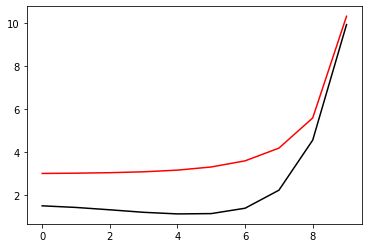

6600 54.00594501609192 -0.6672737713393779 1.0102816123320404
[1.51760683 1.44389799 1.33550194 1.22094755 1.14693821 1.16264907
 1.40856692 2.22955942 4.5243326  9.90610671]


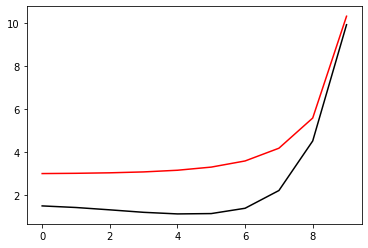

6700 54.0059407268096 -0.6682740639976051 1.0117788438983624
[1.52090443 1.4478094  1.34040467 1.22720879 1.15404923 1.17036257
 1.41317685 2.22120733 4.49030564 9.90015072]


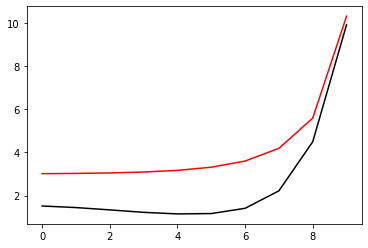

6800 54.005936426651495 -0.6693020302418463 1.0133171118811004
[1.52434618 1.45181373 1.34540768 1.23358067 1.16148206 1.17820997
 1.4177895  2.2126436  4.45551928 9.89406944]


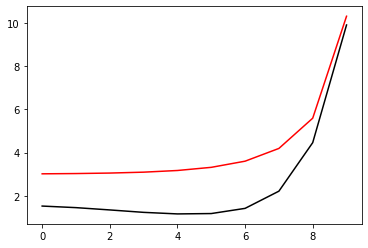

6900 54.005932124500625 -0.670355971740081 1.0148941912306895
[1.5278756  1.4559135  1.35052082 1.24010254 1.16918532 1.18623899
 1.4224352  2.20389173 4.41999693 9.88784375]


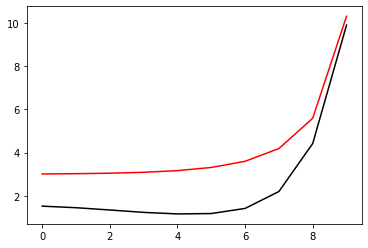

7000 54.00592782996813 -0.6714351071560057 1.0165088899463106
[1.53148558 1.46010557 1.35574886 1.24678304 1.17711807 1.19445587
 1.42712236 2.19496019 4.38376436 9.88147978]


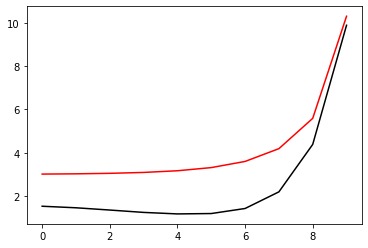

7100 54.00598796865919 -0.6723382204926469 1.018337264084889
[1.53544912 1.46452632 1.36131507 1.25377795 1.18549522 1.20306288
 1.43208816 2.18613859 4.34715662 9.87532706]


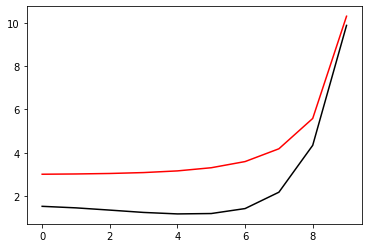

7200 54.005920237995596 -0.6734178357089626 1.0194775548741577
[1.53802737 1.46817228 1.36537821 1.25933653 1.19117653 1.2092485
 1.43523088 2.17877095 4.31770242 9.87014875]


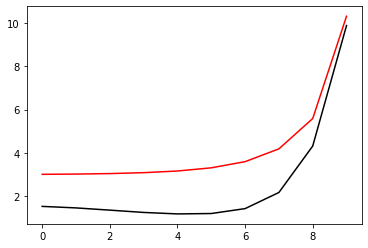

7300 54.00591696530249 -0.674300115243117 1.0207959019768549
[1.54081862 1.47154469 1.36977573 1.26506111 1.19763205 1.21593495
 1.43889314 2.17174036 4.28816956 9.86503005]


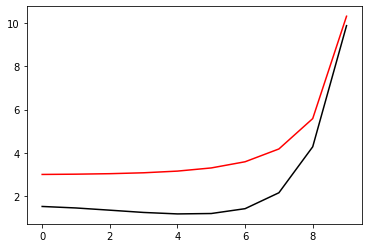

7400 54.00591368122409 -0.6752075526805392 1.0221534033374982
[1.5438131  1.47503624 1.37422889 1.27080618 1.20430902 1.22273862
 1.44260975 2.16449656 4.25792171 9.85984979]


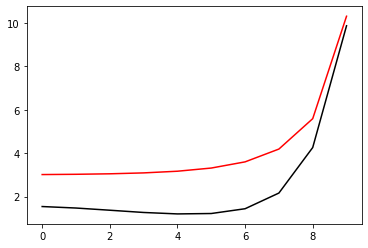

7500 54.00591039230031 -0.6761380563909603 1.0235453868146092
[1.54689275 1.47862399 1.37876817 1.27664488 1.21120141 1.2297342
 1.44643566 2.15708086 4.22696328 9.85453299]


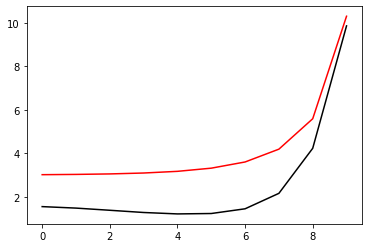

7600 54.00590710595443 -0.6770909774178054 1.024970846862463
[1.55005135 1.48229739 1.38339952 1.28259591 1.21827761 1.23692335
 1.45037365 2.14950457 4.19531361 9.84908445]


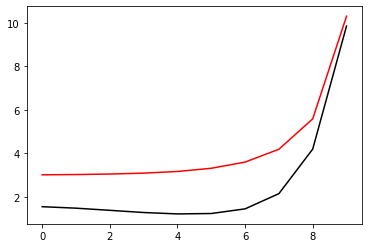

7700 54.00590382992808 -0.6780656291032202 1.026428747398798
[1.55328464 1.48605221 1.38812438 1.28866447 1.22551972 1.24429842
 1.45442341 2.14177887 4.16299562 9.84351275]


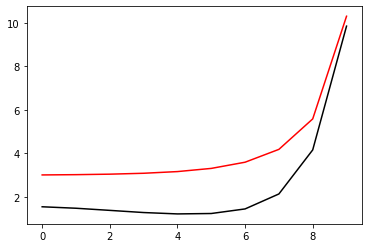

7800 54.00590353540157 -0.6789915465921165 1.0279176667915784
[1.5571996  1.49000218 1.3926307  1.29437147 1.23205307 1.25104743
 1.45804922 2.13437088 4.13220022 9.83915609]


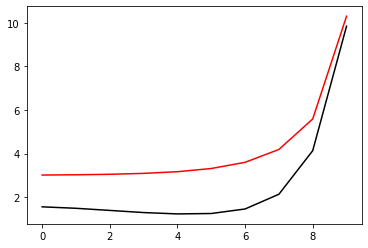

7900 54.0058982378731 -0.679793753739434 1.0290137269514037
[1.55891221 1.49295262 1.3965412  1.299586   1.23799529 1.25718252
 1.46142363 2.12836727 4.10580601 9.83387624]


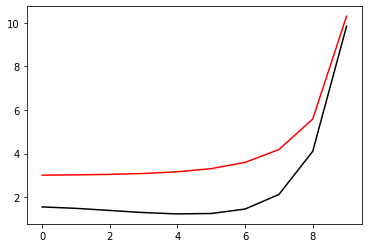

8000 54.00589573071208 -0.680593857189907 1.0302105464017441
[1.5615384  1.49598068 1.40045025 1.30465798 1.24391145 1.26322819
 1.46476488 2.1222721  4.07915583 9.829422  ]


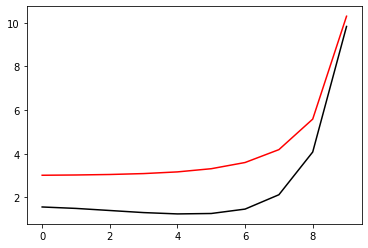

8100 54.00589321909772 -0.6814152390793619 1.031438961743335
[1.56425826 1.49912622 1.40443022 1.30978315 1.24999538 1.26942236
 1.46820659 2.1160204  4.05185946 9.82487103]


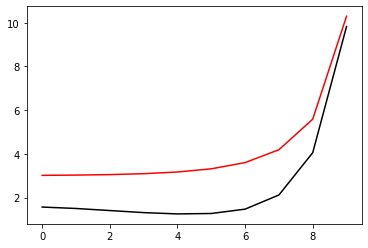

8200 54.00589070864706 -0.6822566735335062 1.0326973401628334
[1.56704852 1.50235357 1.40849493 1.31500014 1.25623514 1.27578644
 1.4717655  2.10963251 4.02393015 9.82020287]


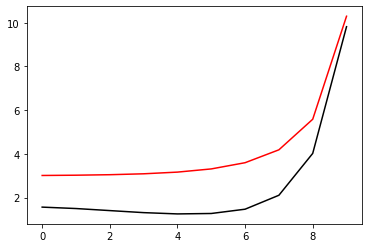

8300 54.00588820533985 -0.6831175434398336 1.0339847354794052
[1.56990621 1.50565492 1.41264357 1.32031837 1.26261713 1.28231537
 1.47544005 2.10311881 3.99538713 9.81542293]


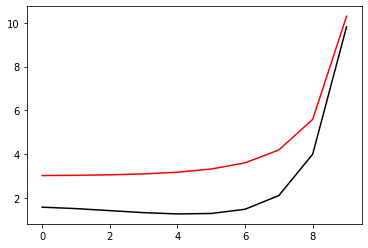

8400 54.00588745824999 -0.6840292563452995 1.0352635938437669
[1.57336726 1.50920222 1.41688242 1.32564038 1.26894371 1.28883907
 1.47919179 2.09679763 3.96711683 9.8115184 ]


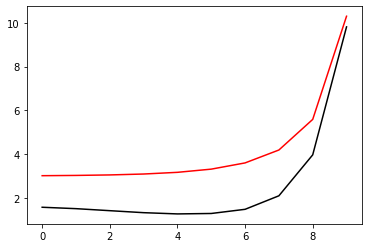

8500 54.00588382555469 -0.6846845781859042 1.0363272768670095
[1.57506992 1.51185353 1.42021218 1.33002175 1.27397156 1.29403372
 1.48203111 2.09147435 3.94355142 9.80688757]


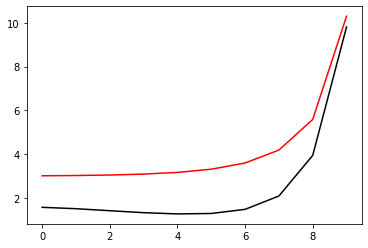

8600 54.00588191393742 -0.6853890824729006 1.0373817281079454
[1.57737476 1.5144835  1.42362304 1.33445241 1.27920907 1.29942306
 1.48512663 2.08635565 3.91999838 9.80303603]


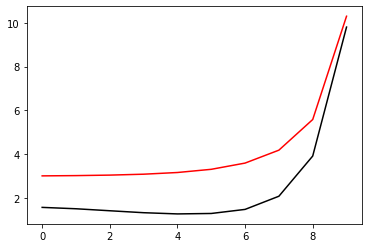

8700 54.00587999944586 -0.6861135412961586 1.0384649327894093
[1.57978326 1.51724537 1.42709703 1.33891969 1.28456037 1.30491973
 1.48829399 2.08109406 3.89587013 9.79912521]


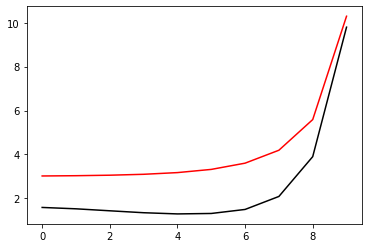

8800 54.00587808582777 -0.6868559225573435 1.0395749321876446
[1.58225226 1.52008278 1.43065364 1.34347199 1.29004099 1.31056097
 1.49156521 2.07571774 3.87117609 9.79511251]


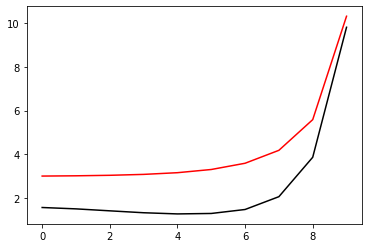

8900 54.005876177714384 -0.687615650324462 1.0407108316285483
[1.58478023 1.5229867  1.43428849 1.34811775 1.29564421 1.31634346
 1.49493916 2.07023552 3.84593289 9.79100021]


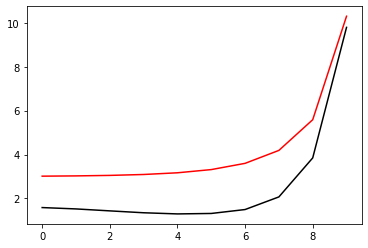

9000 54.00589423928131 -0.6885161630216959 1.041782915634309
[1.58768077 1.52592641 1.4377353  1.3524893  1.30089824 1.32183616
 1.49814465 2.06479197 3.8209909  9.7877568 ]


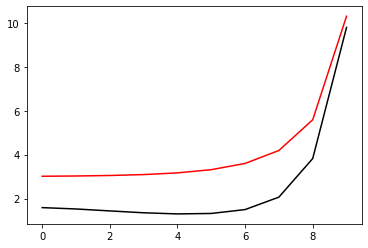

9100 54.005872869715844 -0.6889857115002033 1.0427612846971483
[1.58932109 1.52837342 1.44087698 1.35648818 1.30555714 1.32662703
 1.50094708 2.0605122  3.8005113  9.78368024]


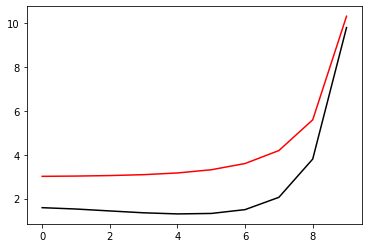

9200 54.00587143340612 -0.6895993354206902 1.043676694034663
[1.59133533 1.53064219 1.44380862 1.36029893 1.31011168 1.33134584
 1.50375883 2.05625839 3.77997787 9.7803911 ]


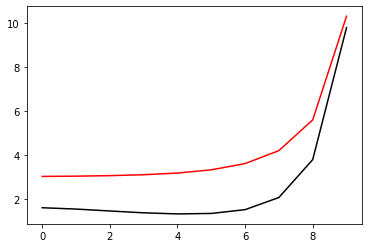

9300 54.00586999430943 -0.6902298111731731 1.0446191984794524
[1.59343867 1.53303884 1.44680436 1.36414378 1.31475099 1.33615194
 1.50662713 2.05188092 3.75893571 9.77705809]


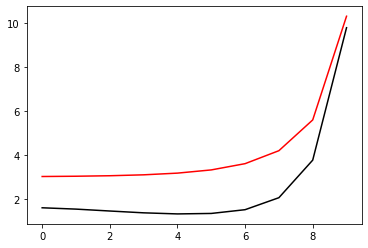

9400 54.00586855518274 -0.690876245260774 1.0455855543789923
[1.59559401 1.53550301 1.44987907 1.36806896 1.31949924 1.34108126
 1.50958388 2.04740548 3.73739156 9.77363656]


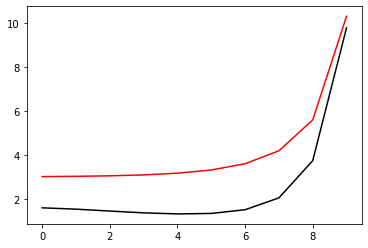

9500 54.00586711952832 -0.691538127188039 1.0465749772346442
[1.59780077 1.5380266  1.45302615 1.3720807  1.32435453 1.34613168
 1.51262847 2.04283904 3.71535933 9.77012694]


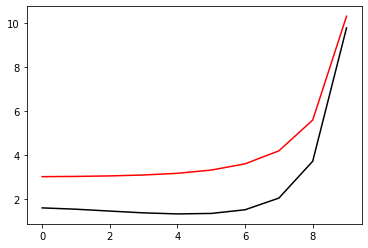

9600 54.00589636643488 -0.6923526514483274 1.0474451832418208
[1.59998299 1.54052289 1.45613434 1.37606809 1.32919201 1.35117752
 1.51563859 2.03807703 3.6927691  9.76644721]


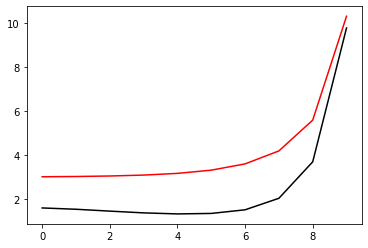

9700 54.005864603633896 -0.6927484802432421 1.048382971003639
[1.60185304 1.54277882 1.45880462 1.37935397 1.33304139 1.35518934
 1.51808527 2.03460028 3.67531307 9.76379681]


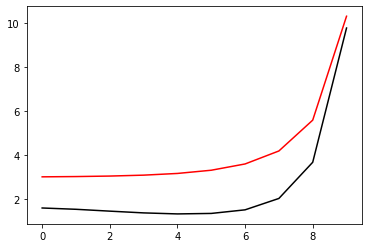

9800 54.00586353545539 -0.6932743151276125 1.049170341001987
[1.60355778 1.54469323 1.46131559 1.3826311  1.33698236 1.35929694
 1.52061109 2.03109385 3.65761376 9.76096501]


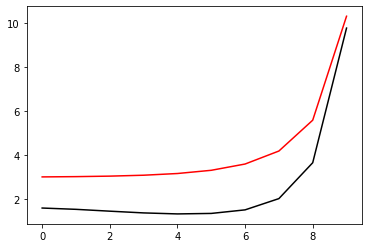

9900 54.00586246526604 -0.6938173590904567 1.0499819775229584
[1.60537427 1.54674981 1.46387499 1.38591743 1.34096646 1.36345185
 1.52316091 2.0274699  3.63947407 9.75813738]


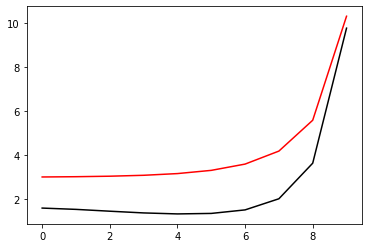

10000 54.00586139416719 -0.6943745528903474 1.0508147880859784
[1.60723523 1.54886884 1.46650934 1.38927541 1.34504226 1.36771117
 1.52578482 2.02376136 3.62089127 9.75523485]


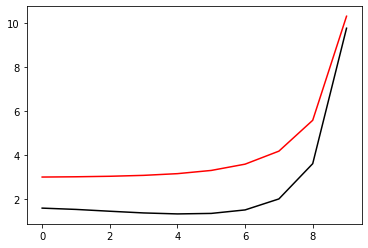

In [54]:
optimizer=tf.optimizers.Adam(learning_rate=0.00075)
for i in range (1, 10001):
    run()
    if i%100==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

200 54.00586056533471 -0.694877013542209 1.0515689226791651
[1.60906224 1.55109969 1.46910161 1.39222351 1.34810869 1.37051428
 1.52715125 2.02059755 3.60870943 9.74879648]


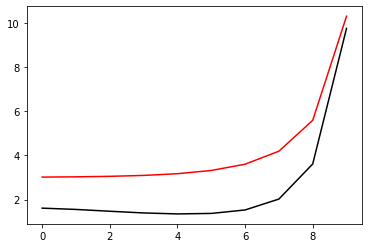

400 54.00585970089414 -0.6953284267524179 1.0522407345474896
[1.61034433 1.55263499 1.47121168 1.39511603 1.35170007 1.37438458
 1.52972599 2.01787083 3.59248973 9.74674494]


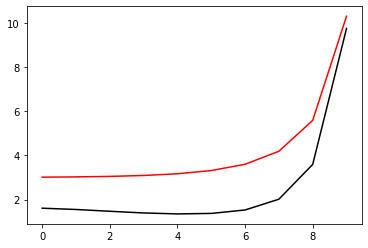

600 54.0058585876366 -0.6959375791125195 1.0531506934401478
[1.61238691 1.55489301 1.47401016 1.3987576  1.35620687 1.3792134
 1.53287049 2.0140542  3.57122328 9.74421149]


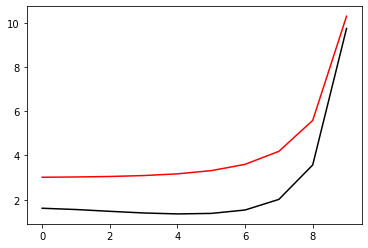

800 54.00585729005721 -0.6966768221378181 1.0542554355046472
[1.61488129 1.55768932 1.47744341 1.40313619 1.36159422 1.38497085
 1.53660766 2.00938321 3.545829   9.74092993]


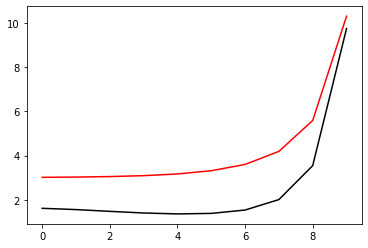

1000 54.00585585962098 -0.6975294671751969 1.0555296610520362
[1.61774681 1.56092625 1.4814331  1.4081973  1.36778079 1.39155778
 1.54087088 2.00396911 3.51692593 9.7368799 ]


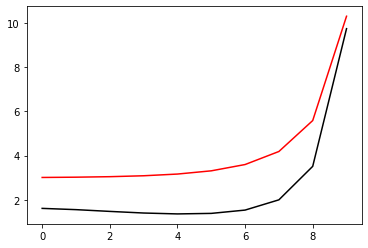

1200 54.005854571246076 -0.6983329135099218 1.0567303499310516
[1.62044942 1.5639956  1.4852185  1.41298571 1.37360482 1.39771315
 1.54478294 1.99877714 3.48983805 9.73312614]


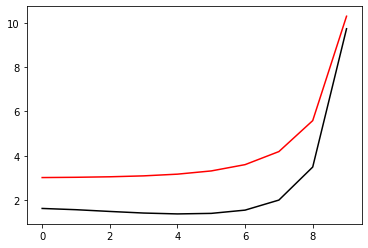

1400 54.00585335758898 -0.6991229651946619 1.0579110222048607
[1.62307248 1.56696857 1.48893158 1.41773585 1.37940008 1.4038307
 1.54867026 1.99368116 3.46325699 9.72940593]


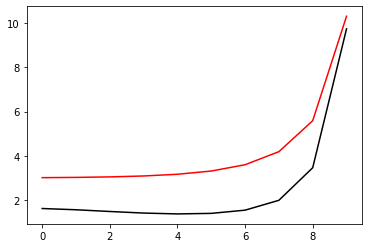

1600 54.005875342860264 -0.6998606908914323 1.0593132392207143
[1.62607591 1.57036072 1.49310763 1.42300994 1.38579415 1.41057358
 1.55301111 1.98829315 3.43470012 9.72535164]


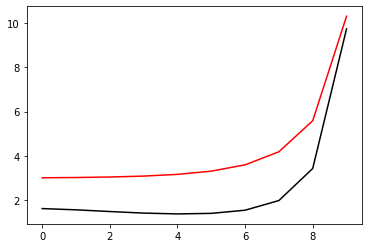

1800 54.00585110486813 -0.7006988727386911 1.0602659534974896
[1.62832747 1.57294881 1.49636232 1.42717471 1.39087038 1.41591012
 1.55632373 1.98358482 3.41073693 9.72172971]


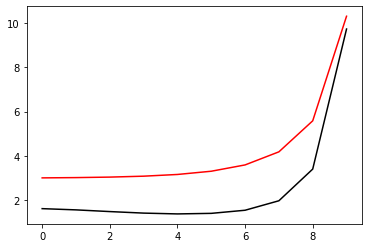

2000 54.005850091282134 -0.7014613711209444 1.0614052297019052
[1.63086901 1.57583278 1.49994368 1.43173925 1.39642826 1.42176423
 1.56004562 1.97875433 3.38541224 9.71795906]


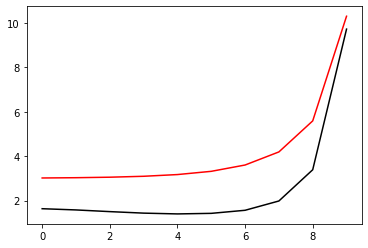

2200 54.00584915085284 -0.7022100789405225 1.0625222481926826
[1.63342753 1.57872314 1.50345644 1.43614953 1.4017703  1.4273877
 1.56361143 1.97404332 3.3607842  9.7142832 ]


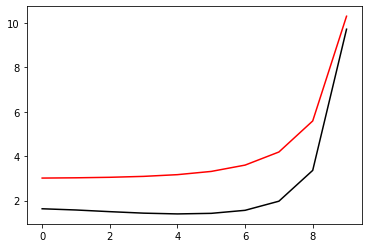

2400 54.00584835145977 -0.702868572380499 1.0635078121716803
[1.63555661 1.58116661 1.50657115 1.44015568 1.40664506 1.43252023
 1.56690592 1.9699653  3.33883231 9.71090404]


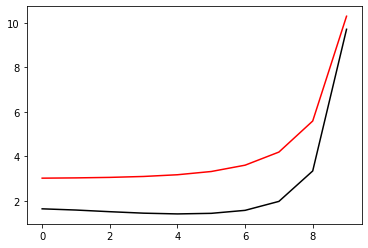

2600 54.00584754440821 -0.7035718283935061 1.064558493513042
[1.63789994 1.58382846 1.509872   1.44435018 1.41174855 1.43790592
 1.57036826 1.96562789 3.31559132 9.70734398]


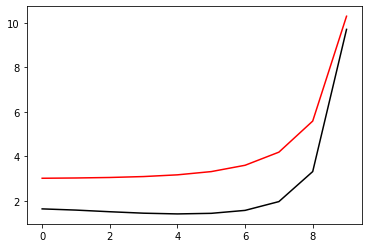

2800 54.00584686526731 -0.7041945509647268 1.0654891259277874
[1.63997238 1.58620489 1.51281721 1.44805861 1.4162342  1.44263346
 1.57340982 1.9618311  3.29507034 9.70418003]


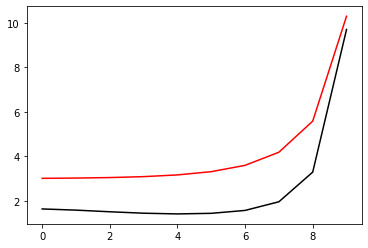

3000 54.0058462441582 -0.7047904958518827 1.066379191768058
[1.64195928 1.58844396 1.51559952 1.45161674 1.42056753 1.44720813
 1.57637484 1.95823267 3.27535573 9.70115992]


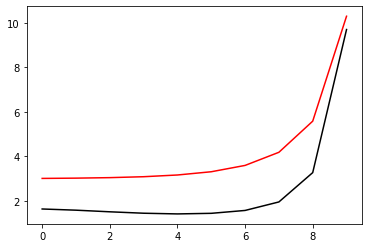

3200 54.005845620743166 -0.7054205498169271 1.0673198139333884
[1.64405759 1.59082668 1.51855108 1.45536127 1.42512166 1.45202593
 1.57950991 1.95444714 3.25458064 9.69795035]


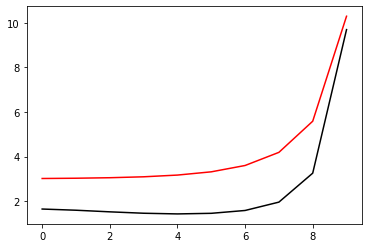

3400 54.005845127425026 -0.7059443804864357 1.0681030074022262
[1.64579954 1.59281691 1.52102403 1.45848084 1.42889262 1.45600702
 1.58210299 1.95133722 3.23732592 9.69527116]


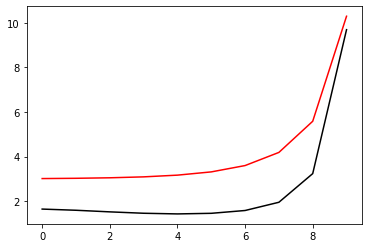

3600 54.00584464726967 -0.7064785736236893 1.0689009807333683
[1.6475827  1.59483178 1.52351505 1.46165361 1.43275918 1.46010004
 1.58478497 1.94818264 3.21968741 9.69255997]


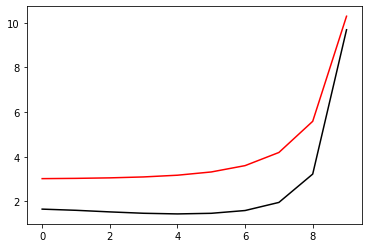

3800 54.00584468065363 -0.7070456175941288 1.069705662366225
[1.64963434 1.59697117 1.5259973  1.46472504 1.43647789 1.46404236
 1.58733487 1.94490368 3.20188012 9.68998965]


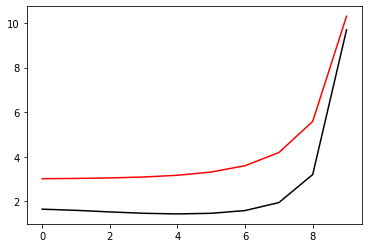

4000 54.005843816883235 -0.7074735857089487 1.0703873256788343
[1.65089452 1.59859724 1.52818214 1.46756115 1.43992432 1.46768619
 1.58977361 1.94236562 3.18692579 9.68747632]


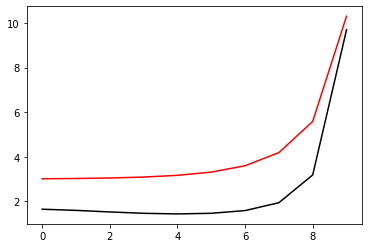

4200 54.005843447638505 -0.7079503354578908 1.071099449360641
[1.65248487 1.60039733 1.53040533 1.4703837  1.44336401 1.47133611
 1.59218665 1.93960227 3.17120646 9.68505728]


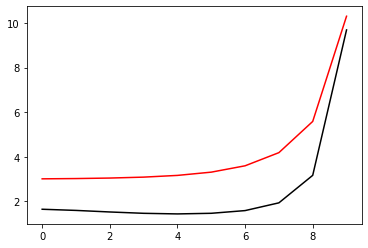

4400 54.00584311695115 -0.7084016892605701 1.071775268481641
[1.6540089  1.60214974 1.53253117 1.47302899 1.44656107 1.47472613
 1.59442381 1.93699385 3.15642709 9.68277901]


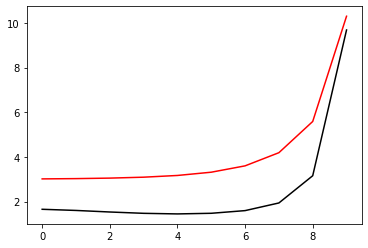

4600 54.005842833334306 -0.7088048053696061 1.0723757623651358
[1.6553288  1.60362795 1.53440604 1.47544798 1.44950804 1.47785006
 1.59650397 1.93469484 3.14310223 9.68069269]


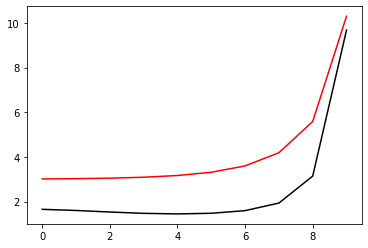

4800 54.005842549879944 -0.709229876828226 1.073010658126358
[1.65674581 1.605233   1.53638813 1.47795986 1.45256757 1.48110262
 1.59866956 1.93226847 3.12910535 9.67853784]


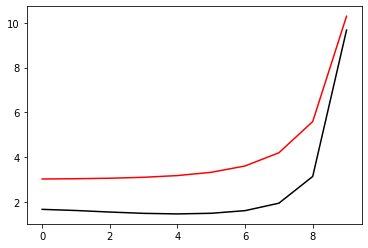

5000 54.005842315883434 -0.7095998636828026 1.0735633413710566
[1.65797128 1.60664379 1.538137   1.48014766 1.45520611 1.48390034
 1.60053046 1.93016998 3.11699243 9.67663543]


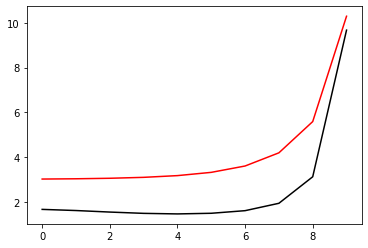

5200 54.00584210045827 -0.7099559298600188 1.074095091021744
[1.65916175 1.60797623 1.5397834  1.48225718 1.45778211 1.4866365
 1.60235916 1.9281582  3.10525498 9.67482905]


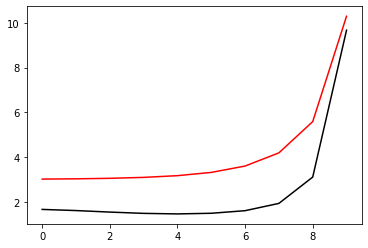

5400 54.00584188550565 -0.7103309047078122 1.074654218542352
[1.66040957 1.60938996 1.5415291  1.48446764 1.46047351 1.48950175
 1.60427756 1.92604667 3.09293333 9.67293239]


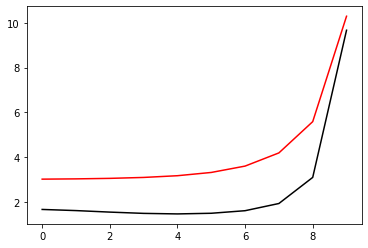

5600 54.005841718081065 -0.7106374012193375 1.0751129404971007
[1.66142553 1.61055561 1.54297863 1.48628562 1.46266265 1.49182229
 1.60582831 1.92432805 3.08290347 9.67134646]


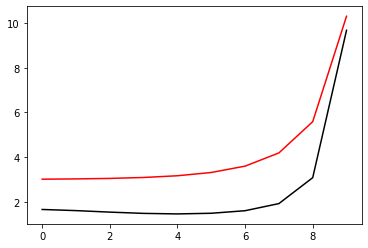

5800 54.00584155590718 -0.7109483098197884 1.075577242766854
[1.66246484 1.6117232  1.54441604 1.48812083 1.46490646 1.49420939
 1.60743061 1.92258964 3.07266871 9.66977545]


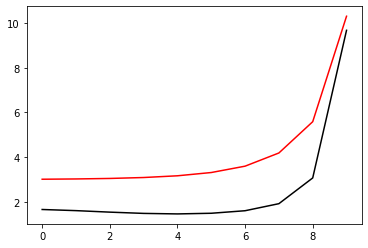

6000 54.00584772216142 -0.7112170247369884 1.0761412140430116
[1.66367424 1.61300866 1.54594956 1.49003678 1.46723491 1.49670159
 1.60913479 1.92085344 3.06212921 9.66839806]


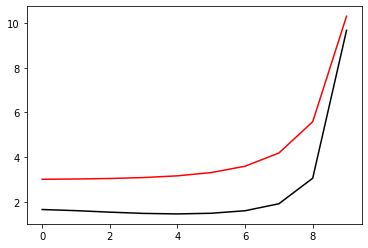

6200 54.0058412716451 -0.7115358660393784 1.0764547616845928
[1.66441616 1.61394487 1.5471684  1.49159258 1.46911138 1.4986799
 1.61043341 1.91932042 3.05342119 9.66677239]


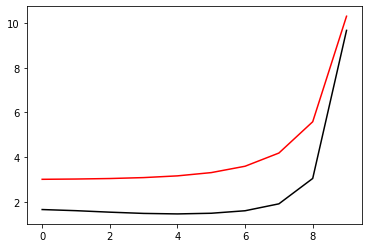

6400 54.005841149033095 -0.7118085304225629 1.0768619542582327
[1.66532717 1.61496976 1.54842901 1.49319896 1.47107659 1.50077325
 1.61184362 1.91780914 3.04445473 9.66539769]


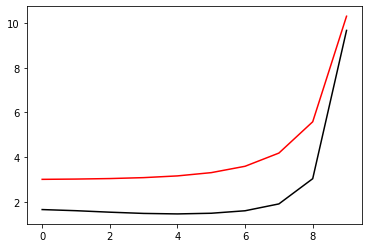

6600 54.005841501552815 -0.7120751621252593 1.0773062678043632
[1.66653707 1.61613854 1.54969191 1.49471164 1.47289571 1.50271382
 1.6131258  1.91621873 3.03547634 9.66423576]


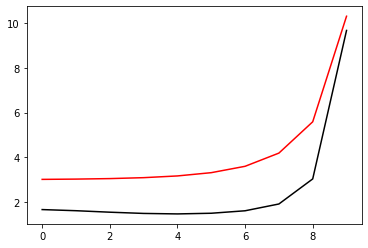

6800 54.0058409382953 -0.7123138755100633 1.0776166548663604
[1.66700536 1.6168787  1.55079341 1.49618395 1.4746921  1.50461825
 1.61443453 1.91502117 3.02791969 9.66281278]


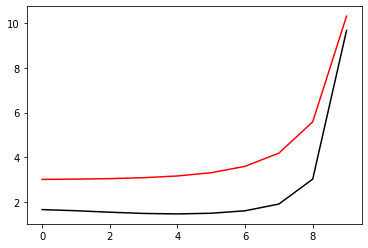

7000 54.00584084529164 -0.7125538670640402 1.0779750475325423
[1.66780655 1.6177816  1.55190389 1.49759545 1.47641901 1.50646037
 1.61567946 1.91370117 3.02003502 9.6616057 ]


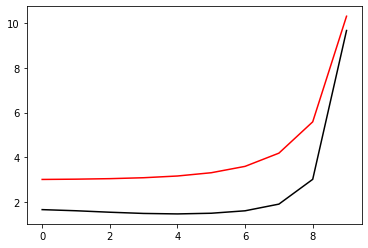

7200 54.00584076678057 -0.7127904875427856 1.0783240668411107
[1.66863555 1.61872213 1.55298992 1.49891402 1.47800639 1.50815205
 1.6168105  1.91240209 3.01249357 9.66048104]


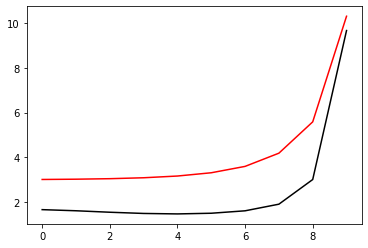

7400 54.00584068952135 -0.7129873646676368 1.0786224249978646
[1.66924619 1.61941786 1.5539297  1.50015508 1.47952023 1.50975896
 1.61790796 1.91132679 3.00586452 9.65938794]


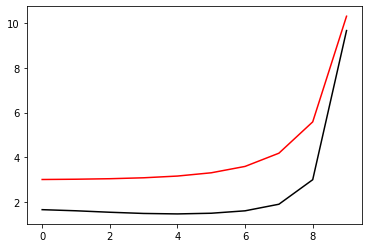

7600 54.00584061878651 -0.7131992429258844 1.078938826843528
[1.66995289 1.62021548 1.55491116 1.50139981 1.48104224 1.51138478
 1.61900994 1.91016929 2.998909   9.6583247 ]


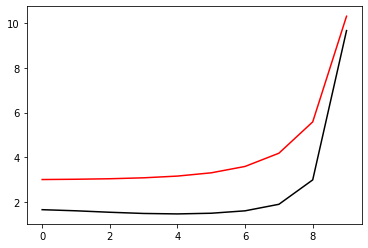

7800 54.00584055784488 -0.7133928058951872 1.079227634221365
[1.6705919  1.62096731 1.55583273 1.50253063 1.48239832 1.51282695
 1.61998268 1.90911367 2.99264172 9.65733096]


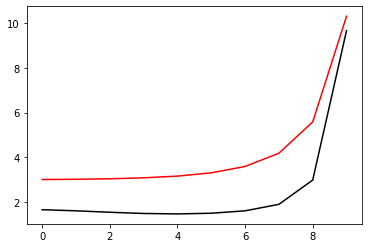

8000 54.005840503835614 -0.7135706654584363 1.0794934847044768
[1.67118642 1.62161661 1.55664507 1.50359177 1.48369928 1.51421139
 1.62092381 1.90814782 2.98677772 9.65642409]


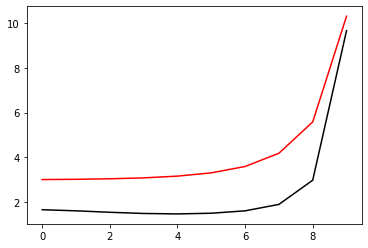

8200 54.00584044990068 -0.7137583381731011 1.0797736540583296
[1.67181175 1.6223232  1.55751504 1.50469343 1.48504496 1.51565051
 1.62190203 1.9071291  2.98062186 9.65548423]


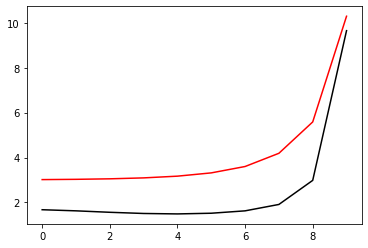

8400 54.00584040670753 -0.7139171661486637 1.0800109523946868
[1.67233431 1.62292873 1.55827086 1.50563285 1.4861684  1.51684242
 1.62270813 1.90626886 2.97547302 9.65465469]


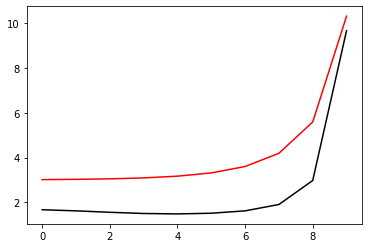

8600 54.00584036541049 -0.7140754417388046 1.0802472631887485
[1.67286504 1.62351904 1.55899434 1.50656406 1.48731364 1.51806436
 1.62353926 1.90541245 2.97027101 9.65386171]


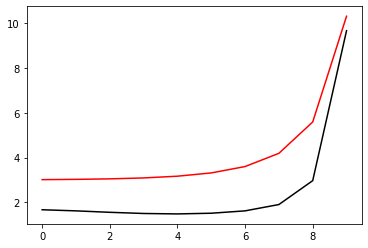

8800 54.0058403305789 -0.7142453621408112 1.080499371724782
[1.67368708 1.62424465 1.55971347 1.5073922  1.48830403 1.51912614
 1.62423597 1.90447528 2.96506868 9.65328698]


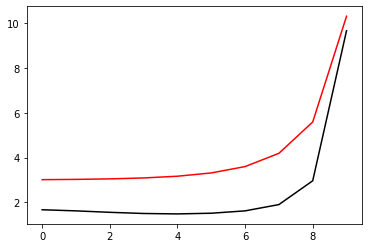

9000 54.00584029388834 -0.7143715345712855 1.0806894178182398
[1.67384672 1.62463708 1.56037995 1.50831052 1.48942609 1.52031394
 1.62506762 1.90381523 2.9606163  9.65234667]


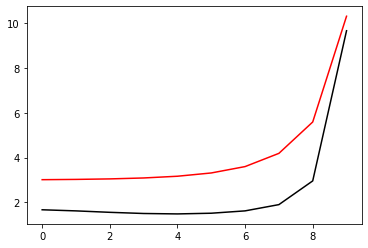

9200 54.00584026229283 -0.7145121490156426 1.080899380750057
[1.67431695 1.62516468 1.56102645 1.50913441 1.4904389  1.5213975
 1.6258061  1.90305777 2.95599863 9.65164627]


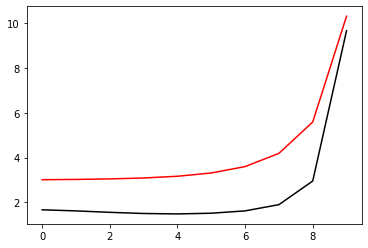

9400 54.005840233898375 -0.7146473243930487 1.0811017699937842
[1.67478254 1.62571723 1.56166819 1.5098992  1.49135239 1.52237134
 1.62646227 1.90232503 2.95167096 9.6509828 ]


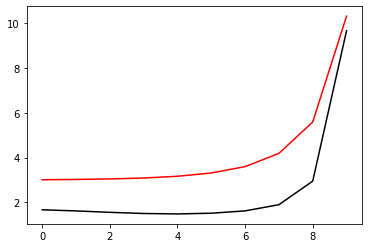

9600 54.005840209735005 -0.7147647788087319 1.0812766211332505
[1.67515492 1.62611757 1.56220658 1.51062468 1.49224258 1.52331729
 1.62711215 1.90170117 2.94776591 9.65035195]


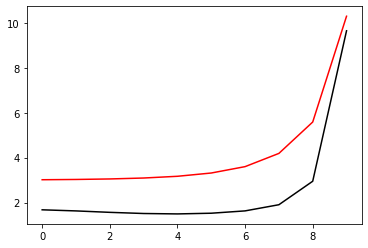

9800 54.0058401856018 -0.7148895196877779 1.0814628826316555
[1.67557133 1.6265865  1.56278215 1.51135474 1.49313822 1.52427747
 1.62776816 1.90103227 2.94367146 9.64973272]


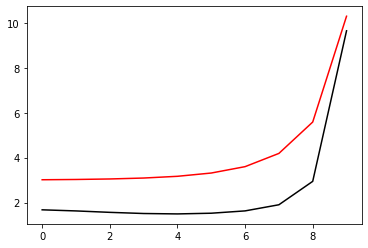

10000 54.00584016548573 -0.7149999618785904 1.0816277449237979
[1.67593172 1.62701387 1.56331488 1.51200421 1.49390897 1.52509557
 1.62832284 1.90044128 2.94011715 9.64915309]


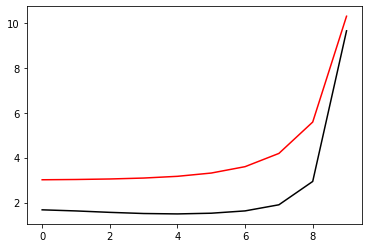

10200 54.00584014702977 -0.7151048844803218 1.0817844704477237
[1.67628587 1.62739838 1.56378711 1.51262484 1.49467656 1.52591427
 1.62888266 1.89988019 2.93665733 9.64862805]


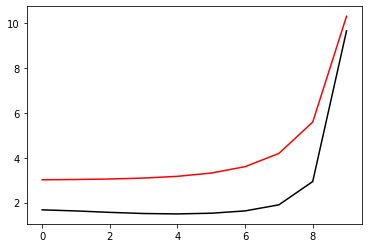

10400 54.00584337978635 -0.7152691100745739 1.0819116328796703
[1.67681921 1.62784757 1.56425074 1.51317943 1.49535904 1.52666404
 1.62940435 1.89931148 2.93319497 9.64839232]


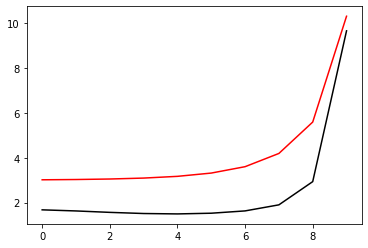

10600 54.0058401144159 -0.7153058764293431 1.0820845965097792
[1.67695076 1.62815854 1.56473075 1.5138093  1.49610575 1.52743766
 1.62992158 1.89880781 2.93011782 9.64759873]


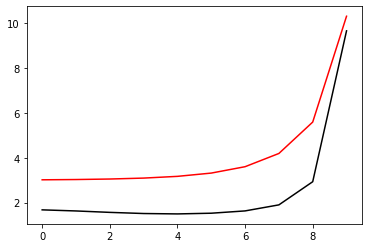

10800 54.00584010025527 -0.7153994879356984 1.0822243694989289
[1.67726528 1.62850785 1.56515629 1.51435667 1.49678366 1.52816383
 1.63041863 1.89830852 2.92703697 9.64713709]


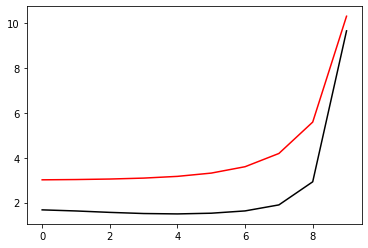

11000 54.00584009072798 -0.7154923602106654 1.0823675692263048
[1.6776262  1.62891876 1.56559194 1.51485454 1.49737471 1.52879627
 1.63084124 1.89779776 2.92408929 9.64672683]


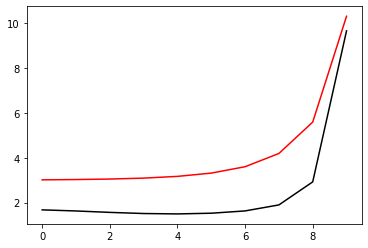

11200 54.00584007627772 -0.7155710473951026 1.0824805426260644
[1.67783361 1.62915513 1.56595881 1.51536867 1.4980061  1.52946532
 1.63130703 1.89739625 2.92145578 9.64625672]


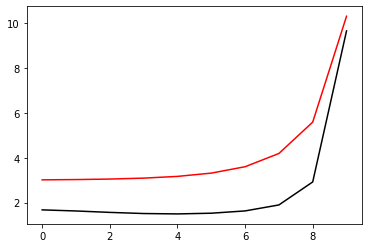

11400 54.005840065402495 -0.7156546019962576 1.0826052986172274
[1.67811326 1.62946856 1.56634192 1.51585592 1.49860738 1.53011174
 1.63175055 1.89695215 2.91870778 9.64584712]


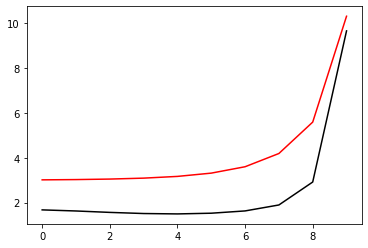

11600 54.00584005620543 -0.7157299761426028 1.0827179458023615
[1.67835742 1.62976491 1.56671157 1.51629809 1.49912683 1.53066267
 1.63212448 1.89655201 2.91629736 9.6454481 ]


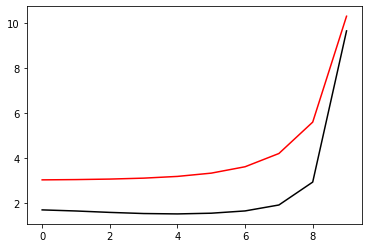

11800 54.005840047856935 -0.7158004797899261 1.0828231200361185
[1.67859685 1.63001844 1.56702302 1.51671632 1.49964816 1.53121888
 1.63250647 1.89617851 2.91396372 9.64509747]


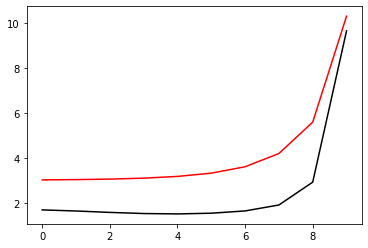

12000 54.005840091051304 -0.715880778560406 1.0829587816830162
[1.6790413  1.63034252 1.56731515 1.51704776 1.50006036 1.53168546
 1.63284409 1.89582787 2.91173543 9.64513876]


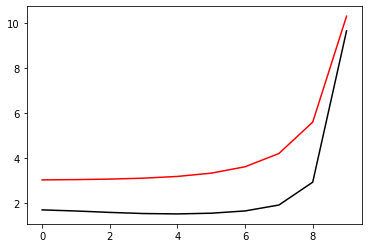

12200 54.00584003309245 -0.7159360643383609 1.083025580812621
[1.67904449 1.63053183 1.56766156 1.51751547 1.5006096  1.5322438
 1.63320724 1.89546094 2.90956081 9.64440093]


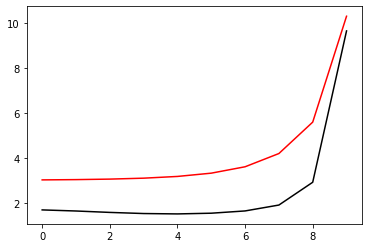

12400 54.005840026686116 -0.7159990165800368 1.0831195636230346
[1.679257   1.63076577 1.56794465 1.51788211 1.50106772 1.53273587
 1.63354532 1.89512756 2.90748194 9.64409535]


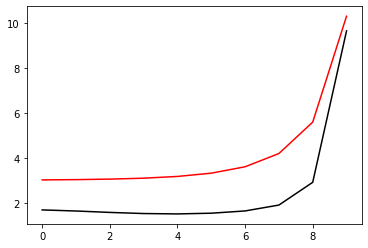

12600 54.00584002094494 -0.7160636959111589 1.083217386446458
[1.67952335 1.63106828 1.56824095 1.51820032 1.50143948 1.53313443
 1.63380758 1.89477385 2.90550773 9.64383921]


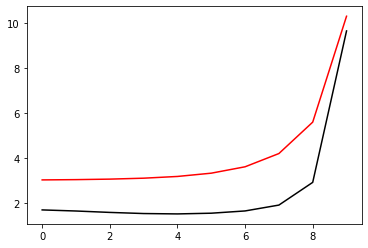

12800 54.00584001590628 -0.7161139900886255 1.0832912403350587
[1.67963699 1.63119998 1.56848445 1.51856144 1.50188481 1.53360451
 1.6341391  1.89452047 2.90375202 9.64350078]


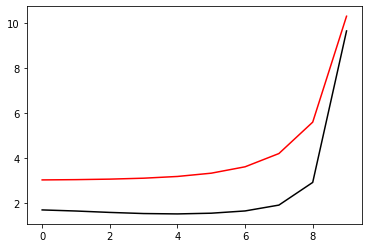

13000 54.00584001105924 -0.7161692889849263 1.0833738028995523
[1.6798229  1.63140679 1.56873558 1.51888218 1.50228442 1.53403597
 1.63443621 1.89422821 2.90192596 9.64323504]


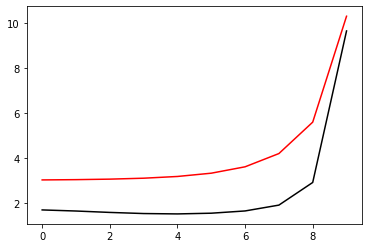

13200 54.005840006827796 -0.716222346643511 1.0834527377237482
[1.67999642 1.63163215 1.56900124 1.51918042 1.5026292  1.53440215
 1.6346828  1.8939461  2.90026409 9.64296117]


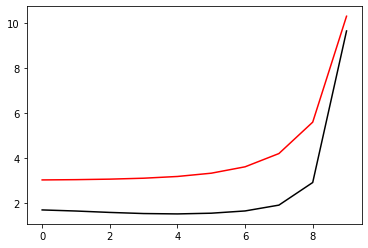

13400 54.00584000308446 -0.7162680466217686 1.0835212639814866
[1.68014953 1.6317794  1.56919839 1.51946579 1.50298712 1.5347823
 1.6349466  1.89370782 2.89872275 9.64272355]


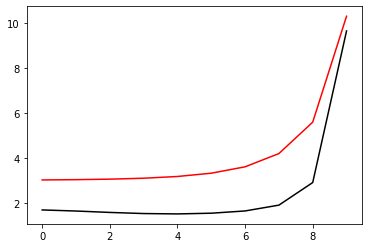

13600 54.00583999939752 -0.7163169136632308 1.0835942226322663
[1.68031348 1.63196255 1.56942132 1.51974906 1.50333883 1.53516307
 1.63520954 1.89345028 2.89710875 9.64249007]


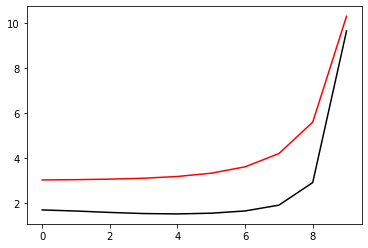

13800 54.005839996355824 -0.7163603580389116 1.0836590811386224
[1.68045145 1.63213494 1.56964133 1.52000653 1.50363252 1.53547157
 1.63541806 1.89322175 2.89574182 9.64224776]


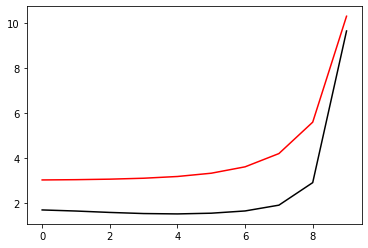

14000 54.00583999356421 -0.7164008685008467 1.0837195814111948
[1.68059125 1.63227912 1.56981436 1.52024537 1.50393696 1.53579727
 1.63564266 1.8930084  2.8943887  9.64205283]


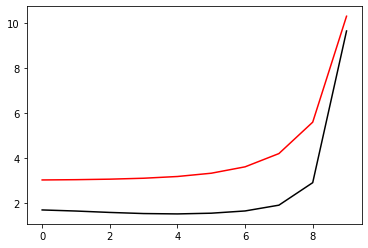

14200 54.005866835638095 -0.7165769386978645 1.0836455275861359
[1.68069455 1.63236688 1.56991737 1.52038881 1.50413357 1.53601948
 1.63576722 1.89268814 2.89289822 9.6418024 ]


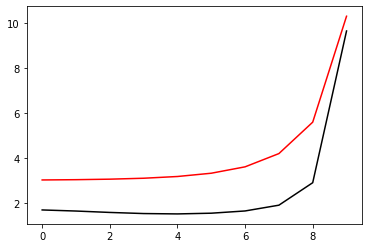

14400 54.00583998859624 -0.7164799377424003 1.0838376600567678
[1.68085017 1.63258092 1.57019269 1.52071209 1.50449176 1.53638818
 1.63604719 1.89259305 2.89183617 9.64164112]


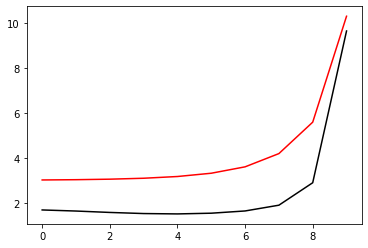

14600 54.00583998649341 -0.7165154125073041 1.0838906074841337
[1.68097201 1.63271019 1.57034596 1.5209177  1.50475548 1.5366722
 1.63624314 1.89240617 2.89065175 9.64147477]


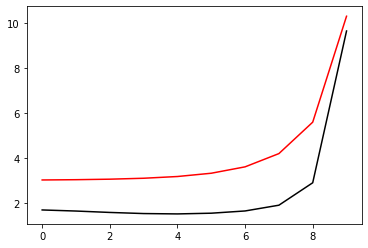

14800 54.00584069880809 -0.7165844938173543 1.0839431802127326
[1.68135913 1.63292399 1.57043568 1.52096042 1.50480358 1.53673853
 1.63626005 1.89212427 2.88951677 9.64157502]


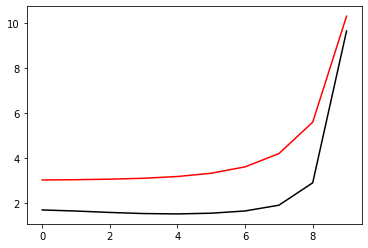

15000 54.005839982822096 -0.7165832564655666 1.0839919157117646
[1.68119438 1.63296818 1.57066969 1.52131968 1.50523244 1.53717886
 1.63659011 1.89205047 2.8884631  9.64111926]


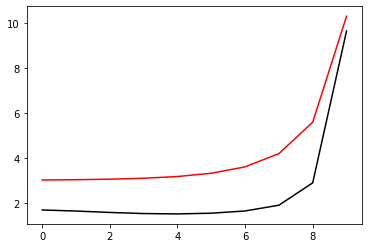

In [55]:
optimizer=tf.optimizers.Adam(learning_rate=0.0005)
for i in range (1, 15001):
    run()
    if i%200==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

200 54.005839980038544 -0.7167704807901106 1.084274502747115
[1.68198118 1.63392333 1.57171874 1.52234909 1.50611041 1.53773105
 1.6365668  1.89105027 2.88587993 9.63742248]


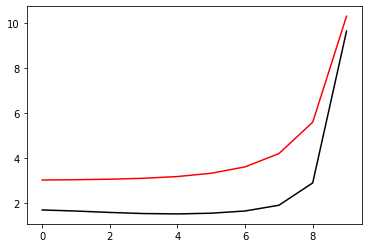

400 54.00583997724195 -0.7167679047823363 1.0842681949733903
[1.68177483 1.63374864 1.57170118 1.52251223 1.50640883 1.53808596
 1.63685778 1.89105824 2.88520931 9.63766044]


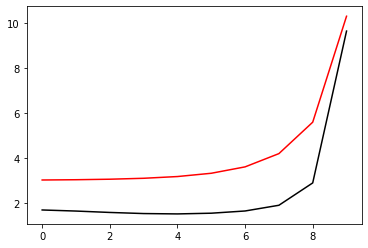

600 54.00583997615062 -0.7167731769318253 1.0842756634570672
[1.68178905 1.63371263 1.57166395 1.52255653 1.50656016 1.53829919
 1.63702449 1.89095583 2.88442265 9.63821498]


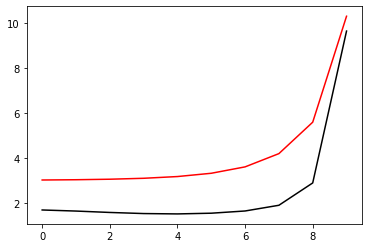

800 54.00583997517593 -0.7167827627229533 1.0842898883342533
[1.68183118 1.63373088 1.57166456 1.52258995 1.50667977 1.53849578
 1.63719186 1.89084108 2.88355867 9.63874949]


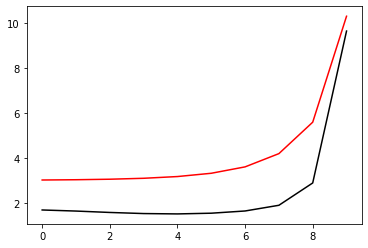

1000 54.00583997427352 -0.7167961582891706 1.0843098407090166
[1.68188232 1.63377307 1.57169994 1.52264397 1.50679639 1.53869004
 1.63737457 1.89073677 2.88265034 9.63916457]


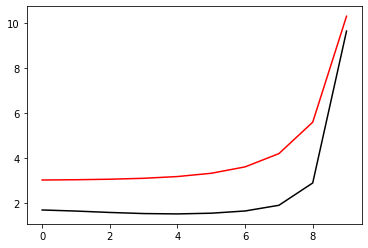

1200 54.00584000870372 -0.7168113657349113 1.0843458890069688
[1.68207183 1.63390969 1.57176001 1.52266154 1.50682265 1.53876418
 1.63745409 1.89058814 2.88179905 9.63951293]


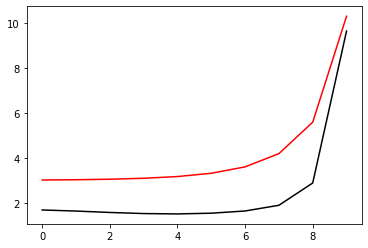

1400 54.00583997282724 -0.7168282280909585 1.0843576918878939
[1.68199425 1.63389037 1.57183042 1.52280325 1.50702169 1.53901199
 1.6376883  1.8905751  2.88107025 9.63950948]


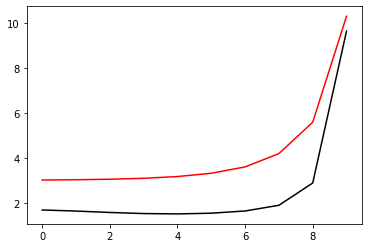

1600 54.00583997219116 -0.7168450542149355 1.0843827954304104
[1.68205558 1.63395018 1.57189468 1.5228882  1.50714222 1.53916957
 1.63783777 1.89050931 2.88032604 9.63957747]


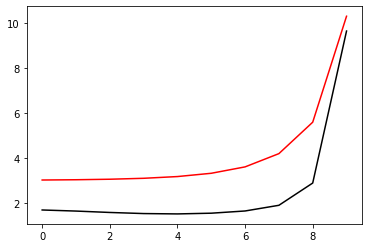

1800 54.005839971637734 -0.7168635548061186 1.084410380757216
[1.68212305 1.6340422  1.57198908 1.52297488 1.50723762 1.53928525
 1.63794151 1.89043274 2.87966845 9.63956916]


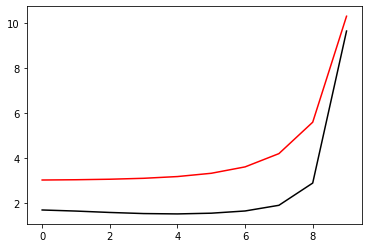

2000 54.00583997112916 -0.7168783709220681 1.0844325372068095
[1.68216951 1.63407586 1.57204419 1.52307153 1.50736751 1.53943499
 1.6380707  1.89038249 2.87905571 9.63953819]


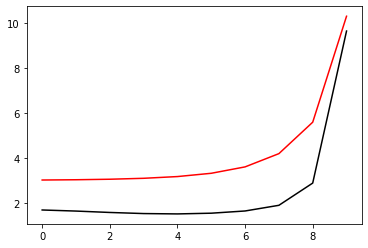

2200 54.00584067944107 -0.7169170485772018 1.0844360594843314
[1.68221276 1.63412084 1.572097   1.52314234 1.50746568 1.53955426
 1.63816728 1.89029844 2.87840049 9.63948402]


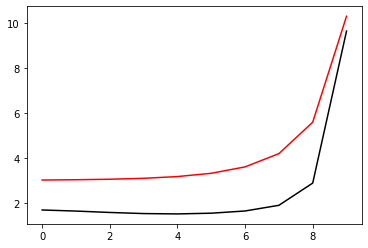

2400 54.00583997022583 -0.7169110726848495 1.0844813908302586
[1.68227814 1.6342034  1.57220036 1.52325511 1.50758443 1.53967948
 1.63826881 1.89025342 2.87790336 9.63942361]


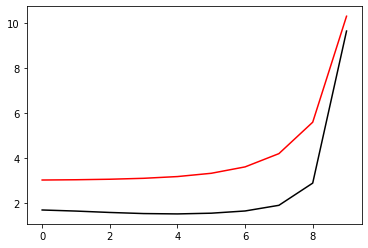

2600 54.00583996984382 -0.7169255903007967 1.084503036725182
[1.68233106 1.63425335 1.57225559 1.5233357  1.50769479 1.53980354
 1.63836547 1.89019396 2.87737091 9.63937659]


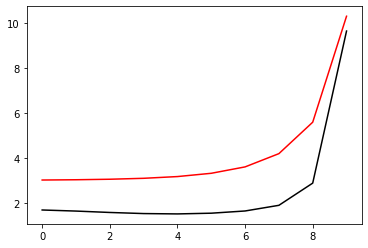

2800 54.005839969842505 -0.7169452105557588 1.0845337479188157
[1.68249724 1.63439513 1.57232288 1.52335693 1.50770478 1.53981768
 1.63836348 1.89007422 2.87686447 9.63939147]


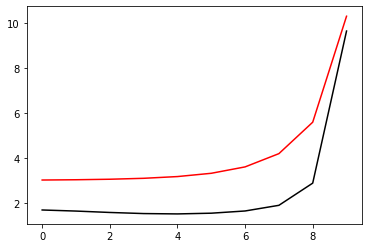

3000 54.005839969174424 -0.7169544519760372 1.0845461367798288
[1.68242622 1.63436382 1.5723937  1.52350459 1.50789168 1.54001507
 1.63852243 1.89006748 2.87640989 9.63923345]


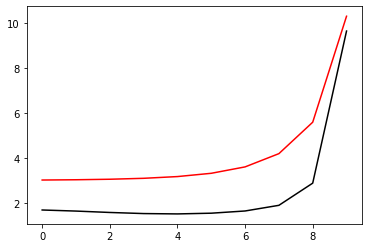

3200 54.00583996888427 -0.716967516013178 1.0845656355355193
[1.68247251 1.63441137 1.57244722 1.52357593 1.50798861 1.54012445
 1.6386034  1.89000797 2.87594743 9.63918549]


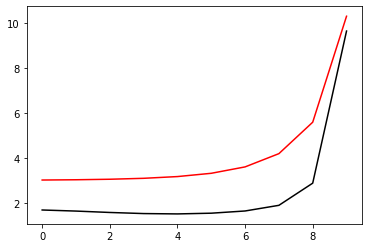

3400 54.005839968860634 -0.71698227931995 1.0845889415465915
[1.68253131 1.63450517 1.57253394 1.52364112 1.50805009 1.54018943
 1.63864502 1.8899299  2.87552322 9.63911895]


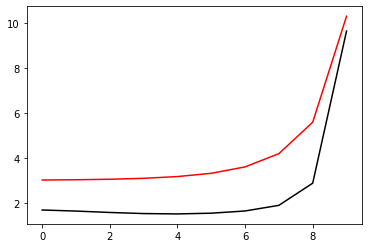

3600 54.005839968389076 -0.7169926094965082 1.084603107089251
[1.68255477 1.63450699 1.57256764 1.52372521 1.50816227 1.54030725
 1.63873301 1.88988926 2.8751332  9.63904946]


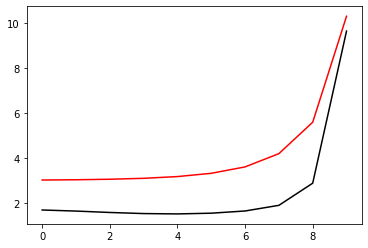

3800 54.005839968171166 -0.7170040904681974 1.0846202445324051
[1.68259499 1.6345492  1.57261583 1.52378797 1.50824689 1.54040334
 1.6388027  1.88983358 2.87473155 9.63900689]


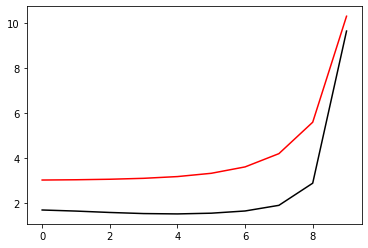

4000 54.00583996797424 -0.7170167560096995 1.084639188447693
[1.68263146 1.63461544 1.57269537 1.52385624 1.50831062 1.54046844
 1.63884524 1.8897698  2.8743748  9.63893012]


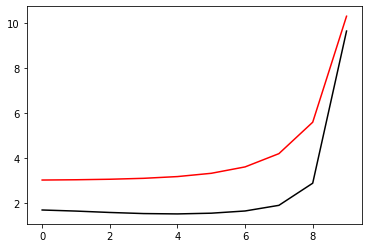

4200 54.00583996780546 -0.7170257714435876 1.0846526195782211
[1.68266586 1.6346316  1.57271993 1.52391799 1.50839831 1.54056107
 1.63891188 1.88972632 2.87403657 9.63888592]


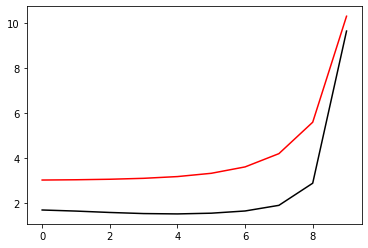

4400 54.00583996764261 -0.7170357828934498 1.0846675637759133
[1.68270075 1.63466856 1.57276239 1.52397269 1.50847176 1.54064514
 1.63897251 1.88967614 2.8736873  9.63884964]


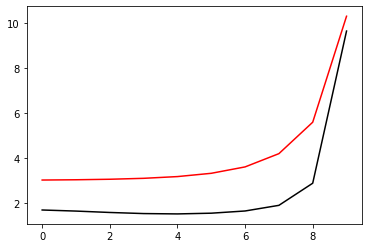

4600 54.00583996749612 -0.7170466921420312 1.084683866559322
[1.68273022 1.63472139 1.57283336 1.52403724 1.50852955 1.54070181
 1.63900865 1.88962063 2.87338595 9.63877196]


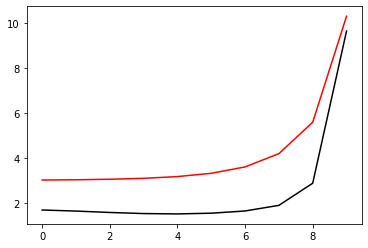

4800 54.005839967373156 -0.7170545092985994 1.0846955270600034
[1.6827617  1.63473971 1.57285274 1.52408592 1.5086031  1.54078033
 1.63906435 1.8895811  2.87309464 9.63874079]


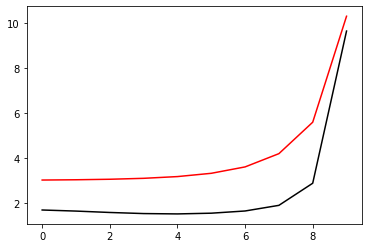

5000 54.00583996725313 -0.7170630845319116 1.0847083306707623
[1.68279163 1.63477137 1.57288899 1.52413248 1.50866603 1.5408532
 1.63911696 1.88953727 2.87279375 9.63871179]


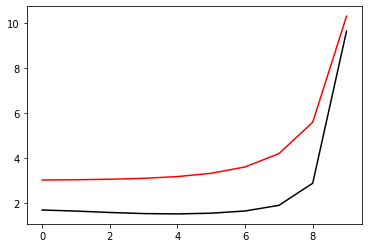

5200 54.00583996714436 -0.7170725034036836 1.0847224651755236
[1.68281689 1.63481545 1.57295058 1.52419038 1.50871729 1.54090283
 1.63914854 1.8894889  2.87253324 9.63864228]


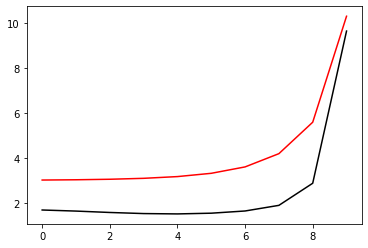

5400 54.00583996705228 -0.7170793777020604 1.0847326567328501
[1.68284468 1.63483319 1.57296742 1.52423098 1.50878063 1.54097121
 1.63919697 1.88945364 2.8722779  9.63861803]


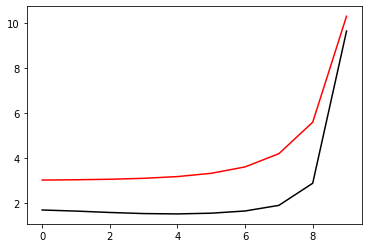

5600 54.005840419320876 -0.7171101198287629 1.084732678340774
[1.68307991 1.63494454 1.57300626 1.52423616 1.50878366 1.54099116
 1.63923384 1.88947374 2.87218605 9.6389206 ]


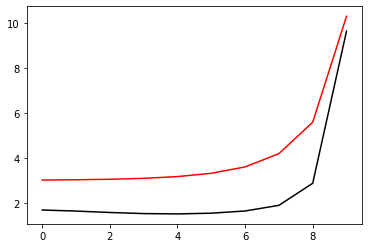

5800 54.00583996688325 -0.7170948262353141 1.0847557374380121
[1.68289267 1.63489485 1.57304887 1.52432393 1.50888197 1.54107788
 1.63926988 1.88937424 2.8717965  9.63852945]


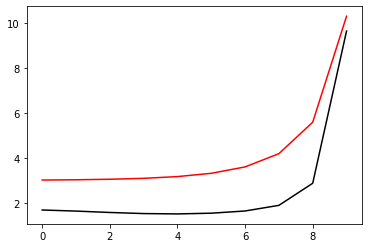

6000 54.00583996681539 -0.7171008462413256 1.0847647098939646
[1.68291639 1.63491382 1.57306616 1.52435606 1.50893435 1.54113659
 1.63931141 1.88934268 2.87157304 9.63851241]


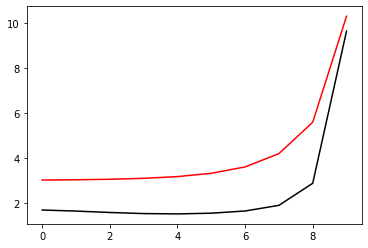

6200 54.00584010232273 -0.7171225275153776 1.0847758402650831
[1.68311744 1.63503078 1.57306615 1.52428517 1.50883356 1.54103068
 1.63920473 1.8892095  2.87133845 9.63857453]


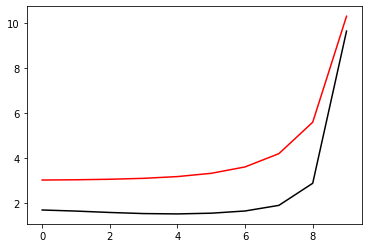

6400 54.005839966690914 -0.7171141440831924 1.084784572201409
[1.68295824 1.63496569 1.57313446 1.52443745 1.50902351 1.54122894
 1.63937424 1.88927416 2.87115946 9.63843359]


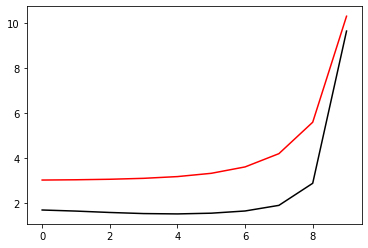

6600 54.005839966640515 -0.717119406055793 1.084792420258277
[1.68297836 1.63498355 1.57315159 1.52446415 1.5090671  1.54127971
 1.63941051 1.88924641 2.87096361 9.63842144]


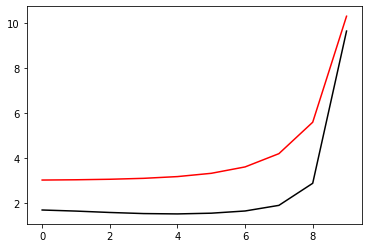

6800 54.00583996705339 -0.7171269762427421 1.084805352034964
[1.68301718 1.63505432 1.57320415 1.52448517 1.50907617 1.54128877
 1.6394108  1.88919877 2.87078243 9.63839629]


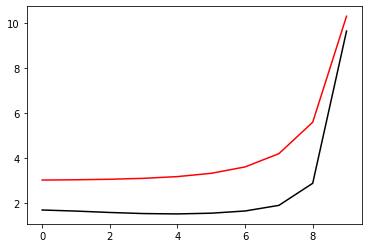

7000 54.00583996654926 -0.7171308276626414 1.0848094775166648
[1.68301473 1.63502747 1.57320882 1.52453444 1.50914536 1.54135966
 1.6394645  1.88918733 2.87060839 9.63835266]


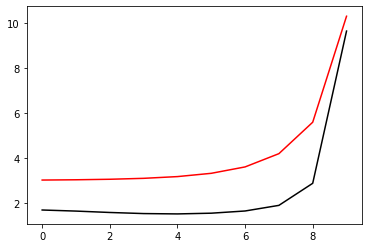

7200 54.00583996651173 -0.7171354357861256 1.0848163531590223
[1.68303188 1.63504378 1.57322536 1.52455742 1.50918167 1.54140356
 1.63949645 1.88916314 2.87043636 9.63834382]


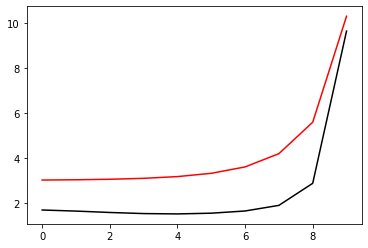

7400 54.00583996647561 -0.7171416711767522 1.0848257280912266
[1.68304635 1.63507809 1.57327294 1.52459437 1.50920833 1.54142806
 1.63951056 1.88913057 2.87028081 9.63829351]


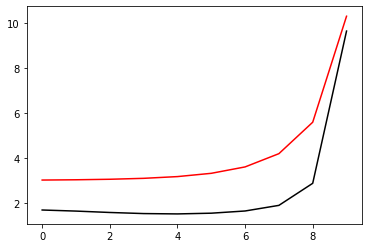

7600 54.00583996644516 -0.7171452266862655 1.0848309738884994
[1.68306337 1.63508111 1.57327348 1.52461757 1.50925    1.54147274
 1.6395427  1.88911227 2.87013177 9.63828426]


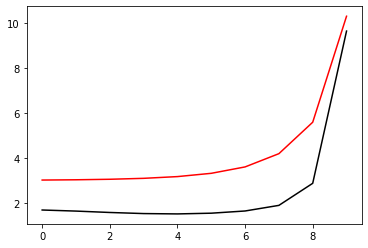

7800 54.005843266245535 -0.7172070115372454 1.084804377083797
[1.68331806 1.63515633 1.5732344  1.5245189  1.50913577 1.54137543
 1.63948388 1.8891009  2.87015209 9.63867133]


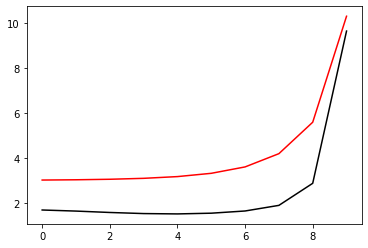

8000 54.005839966390354 -0.7171544506358379 1.0848447541916546
[1.68309125 1.63511855 1.5733243  1.52467386 1.5093086  1.54153394
 1.63958419 1.88906461 2.86985033 9.6382284 ]


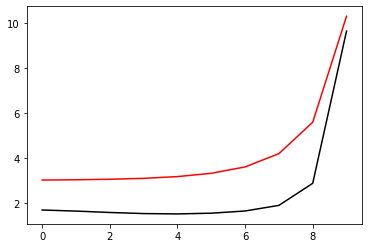

8200 54.00583996636886 -0.7171576546918854 1.0848495282955868
[1.68310522 1.63512758 1.57332971 1.52468915 1.50933971 1.54157034
 1.63961043 1.8890475  2.86971977 9.63822612]


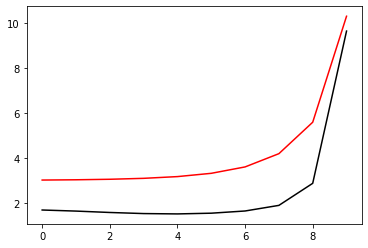

8400 54.00583996921402 -0.7171633536909306 1.0848619882808652
[1.68316395 1.63520576 1.57336545 1.52468354 1.50931846 1.54154901
 1.63958824 1.88900455 2.8696074  9.63824523]


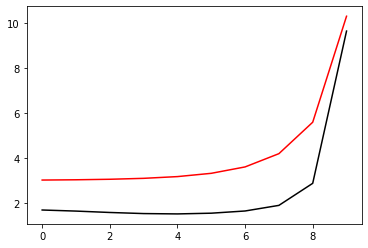

8600 54.005839966329 -0.7171655111039478 1.084861262463582
[1.68312972 1.63515818 1.5733705  1.52473823 1.50939225 1.54162351
 1.63964623 1.8890069  2.86947908 9.63817709]


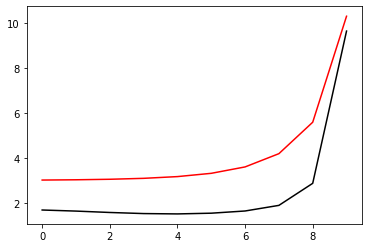

8800 54.0058399663133 -0.7171683449714316 1.0848654886332656
[1.68314114 1.63516765 1.57337834 1.52475074 1.50941641 1.54165422
 1.639669   1.88899191 2.86936455 9.63817706]


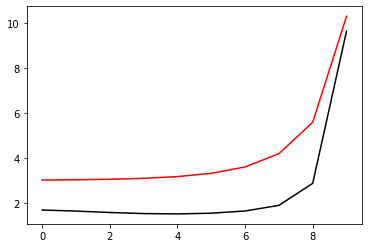

9000 54.00583996629924 -0.7171731678097688 1.0848727041861257
[1.68315055 1.6351988  1.57342044 1.52477763 1.50943038 1.54166544
 1.63967376 1.88896661 2.86925927 9.63813549]


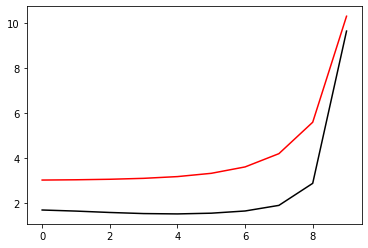

9200 54.00583996628434 -0.7171751295797739 1.0848756210769697
[1.68316253 1.63519372 1.57341277 1.52479347 1.5094631  1.54170002
 1.63969903 1.88895666 2.86915906 9.63813207]


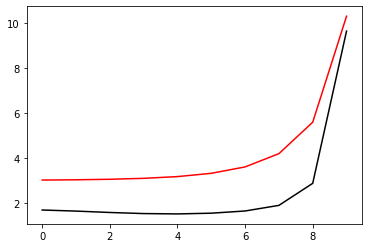

9400 54.00584059324167 -0.71715720409722 1.084899562927208
[1.68319326 1.63522325 1.5734414  1.52482483 1.50950295 1.54174659
 1.63973969 1.8889647  2.86908045 9.63815485]


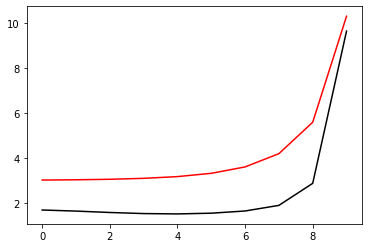

9600 54.00583996626116 -0.7171816273061675 1.084885333104385
[1.68318068 1.6352222  1.57345297 1.52483288 1.50950017 1.54173892
 1.6397252  1.88892317 2.86896893 9.63809022]


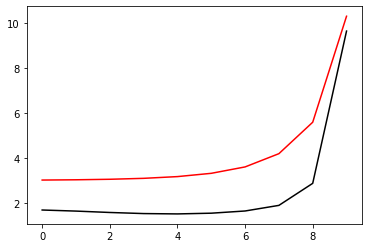

9800 54.00583996625187 -0.71718343835789 1.084888025260367
[1.68319068 1.6352247  1.57344992 1.52484097 1.5095234  1.54176602
 1.63974496 1.88891334 2.86888202 9.63809412]


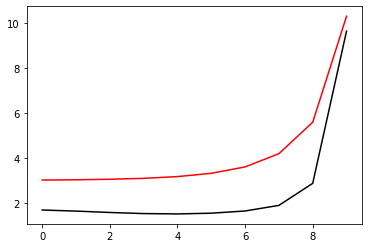

10000 54.00583996760301 -0.7171919523745006 1.0849024264217364
[1.68338377 1.63533531 1.57343899 1.52475312 1.50940019 1.54163564
 1.63962377 1.8888094  2.86879152 9.63818507]


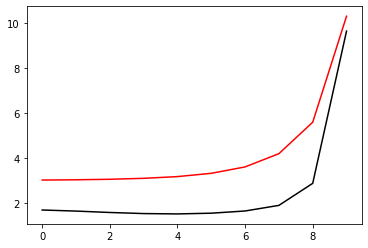

10200 54.00583996623492 -0.7171890803680566 1.0848964563874692
[1.68320699 1.6352478  1.57348287 1.52487761 1.50955791 1.54179966
 1.63976709 1.88888434 2.86871915 9.63805358]


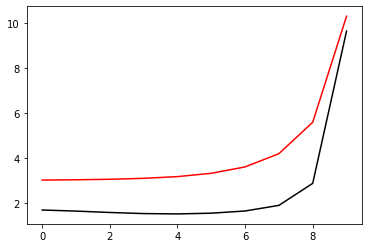

10400 54.00583996622849 -0.7171906197836425 1.0848987468594506
[1.68321482 1.63525158 1.57348251 1.52488238 1.50957517 1.54182234
 1.63978394 1.88887584 2.86864429 9.63806042]


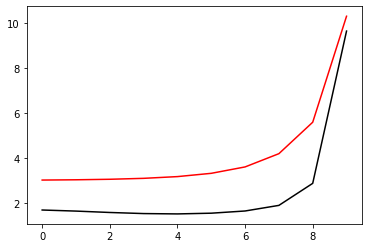

10600 54.00583997046744 -0.7171979595544201 1.0849062113986963
[1.68326663 1.63532348 1.57350902 1.52486339 1.50953694 1.54178273
 1.63974767 1.88883651 2.86858151 9.63808346]


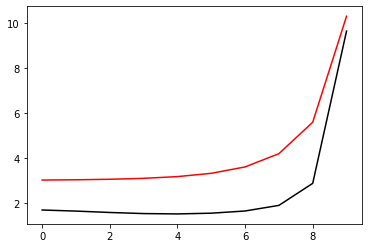

10800 54.00583996621623 -0.7171955358942623 1.0849060920113718
[1.68322926 1.6352713  1.57351045 1.52491483 1.50960613 1.54185162
 1.63980306 1.88885062 2.86850329 9.63802348]


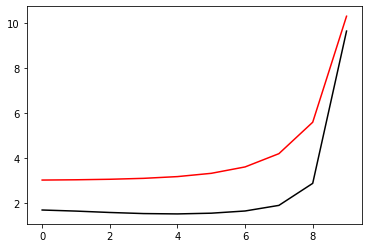

11000 54.005839966211674 -0.717196820932213 1.0849080050766864
[1.68323563 1.63527484 1.57351078 1.52491814 1.50961958 1.5418709
 1.63981787 1.8888436  2.86843858 9.63803168]


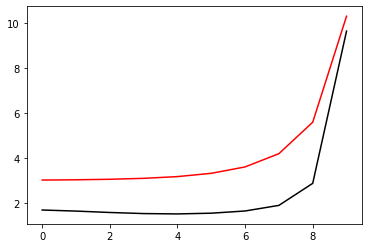

11200 54.00583996626151 -0.7172007109655226 1.0849134725119913
[1.68324303 1.63530961 1.57354827 1.52493187 1.50961829 1.54186706
 1.63981162 1.88882254 2.86837606 9.63800209]


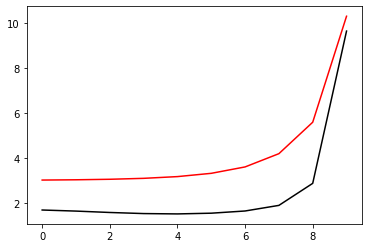

11400 54.0058399662029 -0.7172010524874392 1.0849143261514103
[1.68324838 1.63529145 1.57353384 1.52494606 1.50964745 1.5418967
 1.63983439 1.88882178 2.86831687 9.63799938]


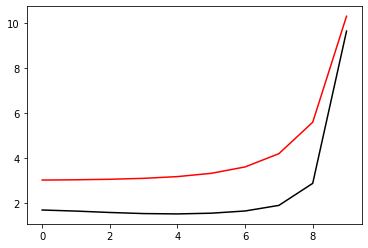

11600 54.005839966208114 -0.7172020538684704 1.0849160035335266
[1.68325357 1.63529482 1.57353495 1.52494865 1.50965761 1.54191286
 1.6398475  1.88881617 2.86826115 9.63800826]


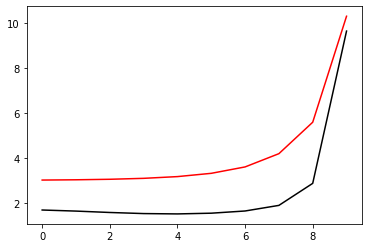

11800 54.0058399661972 -0.7172051356074673 1.0849204692879655
[1.6832581  1.6353124  1.5735644  1.52497008 1.50966583 1.54191623
 1.6398471  1.88880064 2.86820621 9.63797097]


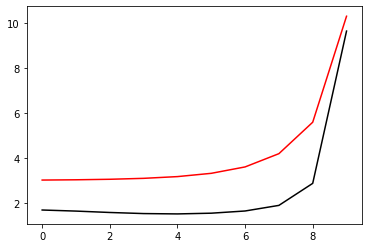

12000 54.005839966193484 -0.7172057772242627 1.0849213788481595
[1.68326471 1.63530885 1.57355408 1.52497249 1.50968252 1.54193558
 1.63986155 1.88879709 2.86815617 9.63797983]


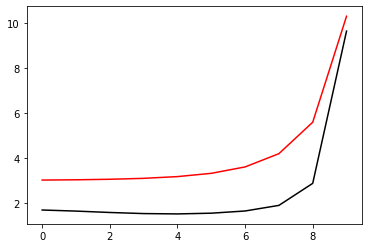

12200 54.00583998250799 -0.7172118527092604 1.0849410617308763
[1.68352028 1.63541681 1.57352001 1.52485338 1.50952439 1.54177251
 1.63971996 1.88870379 2.86813906 9.63817059]


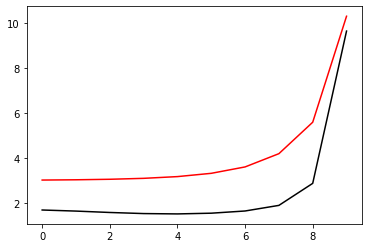

12400 54.00583996618898 -0.7172092821769589 1.0849266199429939
[1.68327396 1.63532404 1.57357711 1.52499597 1.50970158 1.54195365
 1.63987326 1.8887792  2.86806057 9.63795218]


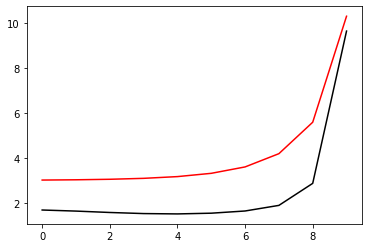

12600 54.00583996618692 -0.7172098300945383 1.0849274289720996
[1.68327862 1.63532389 1.57357175 1.52499513 1.50971216 1.54196885
 1.63988498 1.88877594 2.86801794 9.63796367]


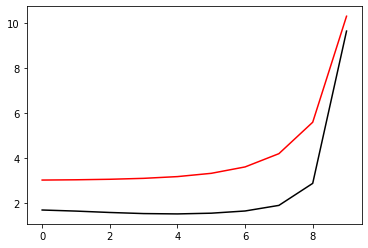

12800 54.00583996732087 -0.7172145100808586 1.0849326607429148
[1.68330323 1.63537796 1.57360106 1.52498654 1.50968605 1.54194078
 1.63985898 1.88874879 2.86797911 9.63796309]


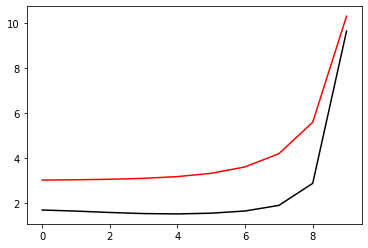

13000 54.005839966183686 -0.7172128893172444 1.0849320005730725
[1.68328723 1.63533634 1.57359012 1.52501626 1.50973077 1.54198518
 1.63989517 1.88876028 2.86793495 9.63793751]


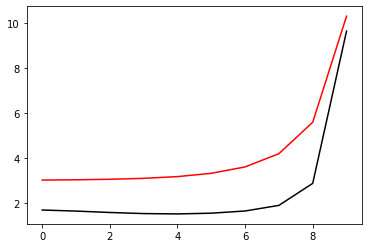

13200 54.00583996618237 -0.7172133270713319 1.084932649492746
[1.68329055 1.63533693 1.57358722 1.52501474 1.50973739 1.54199736
 1.63990527 1.88875777 2.86789875 9.63794974]


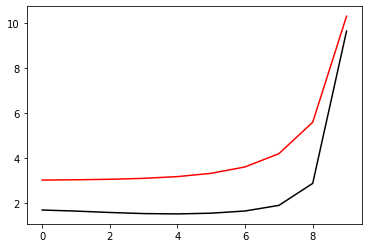

13400 54.00583996618502 -0.7172161410059035 1.0849368490486113
[1.68329319 1.63536073 1.5736204  1.52502991 1.50973656 1.54199249
 1.63989883 1.88874301 2.86786104 9.63791706]


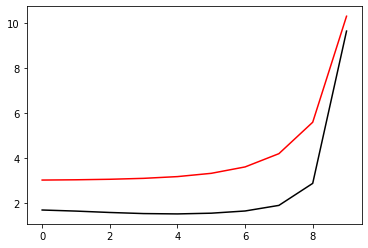

13600 54.005839966180176 -0.7172160651416328 1.084936740402853
[1.68329842 1.63534781 1.57360306 1.52503392 1.5097551  1.54201184
 1.63991359 1.8887436  2.86782654 9.6379241 ]


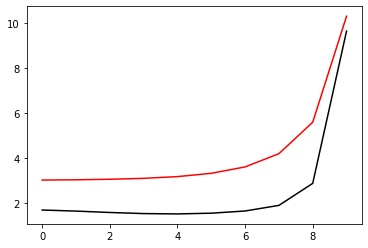

13800 54.005839966182045 -0.7172163348721433 1.0849372462075413
[1.6833009  1.63534839 1.573601   1.52503214 1.50975928 1.54202176
 1.63992255 1.88874197 2.86779613 9.63793675]


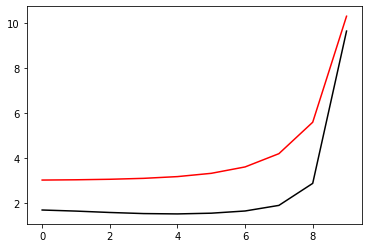

14000 54.00583996618021 -0.717218961800677 1.0849411086486922
[1.68330334 1.63536561 1.57363057 1.52505123 1.50976253 1.54201901
 1.63991742 1.88872861 2.86776161 9.63789866]


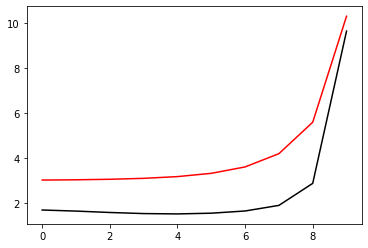

14200 54.005839966177845 -0.7172188936385863 1.0849409629000084
[1.68330805 1.6353583  1.57361556 1.5250501  1.5097759  1.54203439
 1.63992903 1.8887287  2.86773267 9.63791081]


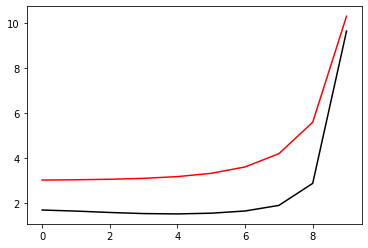

14400 54.005840027755426 -0.7172254564378209 1.0849348335648792
[1.6833037  1.63535223 1.57360704 1.52504142 1.50977219 1.54203637
 1.63993075 1.88872152 2.86770091 9.63791771]


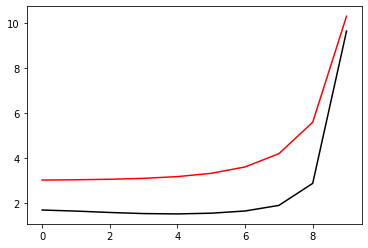

14600 54.00583996617803 -0.7172214063962606 1.0849447285819265
[1.68331231 1.6353727  1.57363918 1.5250664  1.50978268 1.54204059
 1.63993264 1.88871603 2.86767666 9.63788753]


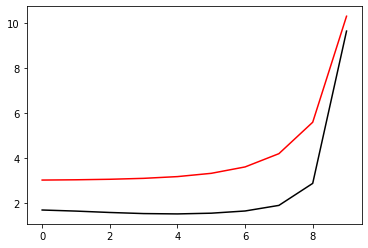

14800 54.00583996617639 -0.7172212648632164 1.0849445027420956
[1.68331615 1.63536712 1.57362599 1.52506344 1.50979314 1.54205366
 1.63994267 1.88871636 2.86765215 9.63790109]


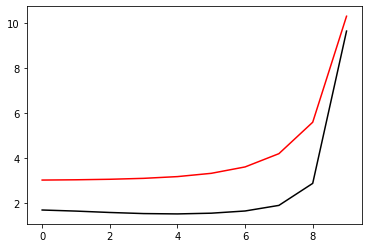

15000 54.005841261320306 -0.717263032986563 1.0849363812280728
[1.68358044 1.63543246 1.57354278 1.52489535 1.50959073 1.54185837
 1.63979221 1.88865621 2.86774005 9.63825387]


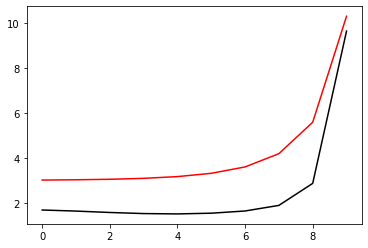

In [56]:
optimizer=tf.optimizers.Adam(learning_rate=0.0005)
for i in range (1, 15001):
    run()
    if i%200==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

200 54.00583996779722 -0.7172357046528911 1.0849686610532012
[1.68362155 1.63554573 1.57362591 1.52494652 1.50962131 1.54186915
 1.63977477 1.88859446 2.86761028 9.63799852]


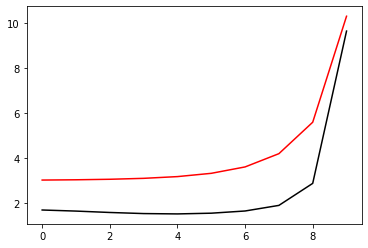

400 54.00583996624918 -0.7172299831780509 1.084958043308379
[1.68337443 1.63545192 1.57368309 1.52507161 1.50977551 1.54202952
 1.63991244 1.88866897 2.86756557 9.63779528]


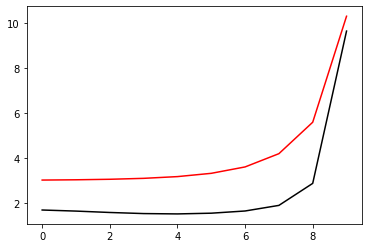

600 54.005839966182094 -0.7172283792946648 1.0849552008368903
[1.6833359  1.63540754 1.57367929 1.52510444 1.50981819 1.54207144
 1.63994733 1.88868489 2.86754351 9.63776764]


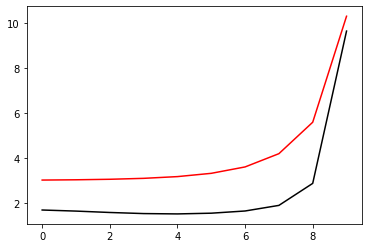

800 54.005839966177945 -0.7172278097742913 1.084954290641844
[1.68333507 1.6353952  1.57366606 1.52510674 1.50983049 1.54208359
 1.63995624 1.88868585 2.86752661 9.6377861 ]


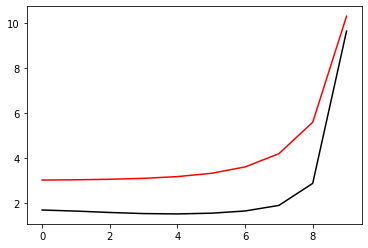

1000 54.00583996617643 -0.71722742787638 1.0849537102038858
[1.68333577 1.63539131 1.5736579  1.52510246 1.50983467 1.54209069
 1.63996141 1.88868488 2.86751084 9.6378117 ]


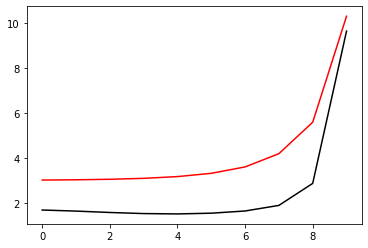

1200 54.00583996617562 -0.7172271155869641 1.0849532400557997
[1.68333577 1.63538933 1.57365328 1.52509805 1.50983522 1.54209575
 1.63996619 1.88868422 2.86749615 9.63783647]


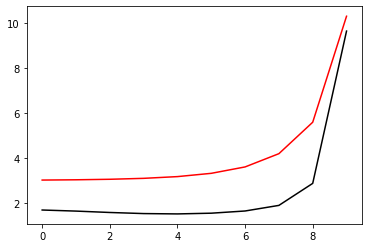

1400 54.005839966175095 -0.7172268597899684 1.0849528559057053
[1.68333549 1.63538801 1.57365038 1.52509459 1.50983422 1.54209908
 1.63997086 1.88868438 2.86748292 9.63785799]


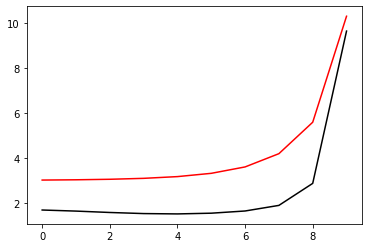

1600 54.005839966174825 -0.7172266577590007 1.0849525528190997
[1.68333519 1.63538705 1.57364839 1.52509199 1.50983279 1.54210103
 1.63997523 1.88868544 2.8674714  9.63787537]


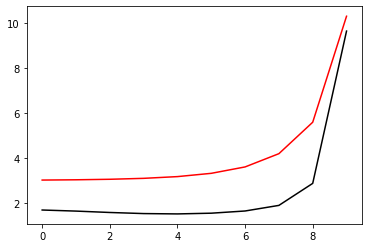

1800 54.00583996617465 -0.7172265060452907 1.0849523253619273
[1.68333497 1.63538638 1.57364698 1.52509003 1.50983138 1.54210206
 1.63997906 1.8886873  2.86746166 9.63788852]


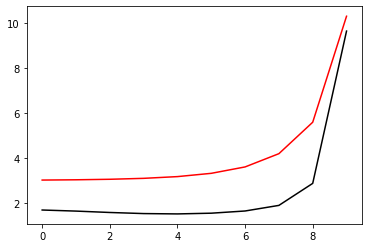

2000 54.005839966174534 -0.7172264007495802 1.084952163577147
[1.68333484 1.63538592 1.57364597 1.52508857 1.50983015 1.54210253
 1.63998223 1.88868968 2.86745363 9.63789787]


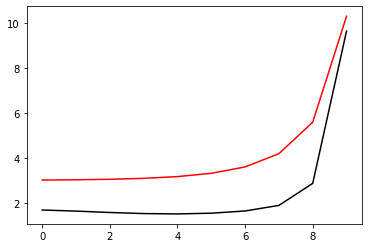

2200 54.005839966177085 -0.7172284864417335 1.0849552885003089
[1.68333548 1.63540273 1.5736739  1.52510397 1.50982874 1.54209359
 1.63997251 1.88867979 2.8674386  9.63786221]


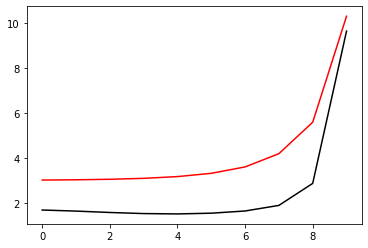

2400 54.005839966174875 -0.7172279833252144 1.084954533946677
[1.68333848 1.63539253 1.57365733 1.52510246 1.50983995 1.542105
 1.63998079 1.88868292 2.86742669 9.63787172]


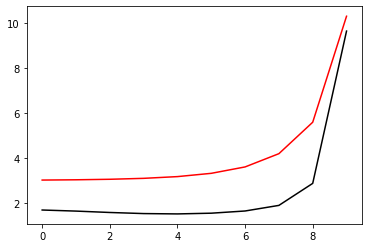

2600 54.005851916611405 -0.7171397955355479 1.0850383367173504
[1.68355384 1.6355564  1.57378771 1.52521439 1.50994806 1.54221842
 1.64010464 1.88882606 2.86759737 9.63811669]


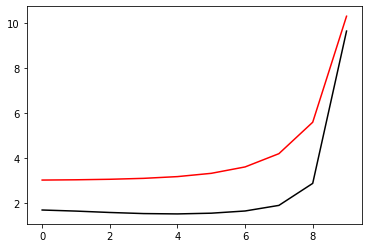

2800 54.00583996617623 -0.7172296137240609 1.0849569904784833
[1.6833402  1.63540278 1.57367561 1.52511443 1.5098423  1.54210493
 1.63997861 1.88867491 2.86740164 9.63784943]


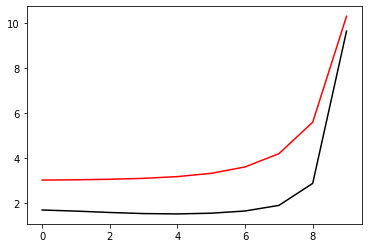

3000 54.005839966174996 -0.7172291195999579 1.0849562300100741
[1.68334243 1.63539665 1.57366207 1.52510896 1.509849   1.54211424
 1.63998568 1.88867693 2.86739124 9.63786423]


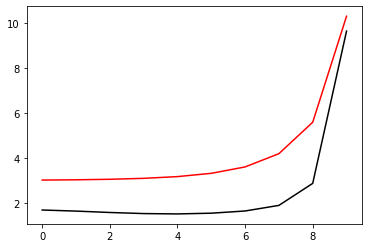

3200 54.00584129515534 -0.7172147389267413 1.085012130049072
[1.68370733 1.63552599 1.57361766 1.52496495 1.50966419 1.54193841
 1.63986668 1.88867521 2.86758758 9.63836513]


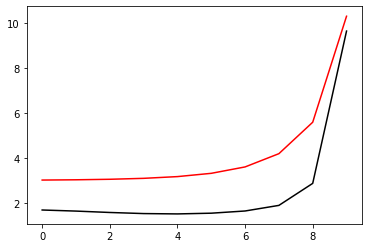

3400 54.005839966176694 -0.717230945853445 1.0849589737153469
[1.68334431 1.63540747 1.57368243 1.52512407 1.50985197 1.54211296
 1.63998256 1.88866744 2.86736643 9.63783654]


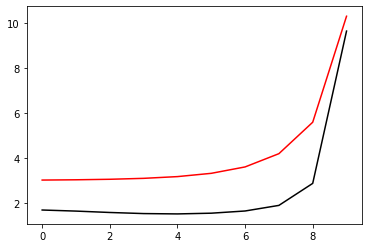

3600 54.005839966175344 -0.7172303722609086 1.084958100719368
[1.68334635 1.6354014  1.5736684  1.52511711 1.5098582  1.54212252
 1.63998979 1.88866955 2.86735682 9.63785354]


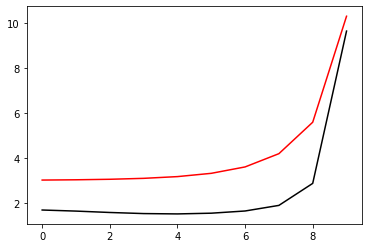

3800 54.00583996617646 -0.7172299968143973 1.0849574599910317
[1.68334607 1.63539943 1.57366379 1.52511148 1.50985616 1.54212592
 1.63999455 1.88867158 2.86735111 9.6378694 ]


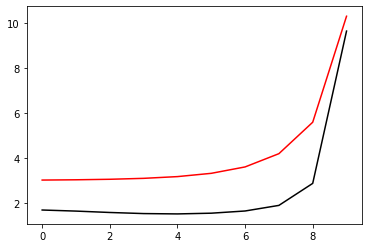

4000 54.005839966177675 -0.7172319549269381 1.0849604877228503
[1.68334653 1.63541461 1.57369076 1.52512706 1.50985497 1.54211827
 1.63998616 1.88866143 2.86733688 9.63783419]


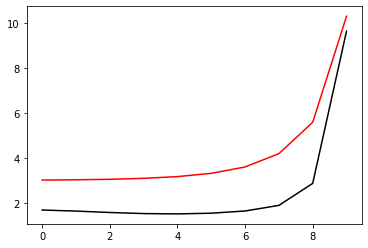

4200 54.00583996617562 -0.7172312713770204 1.0849594435351173
[1.68334919 1.63540489 1.573673   1.52512263 1.50986409 1.5421289
 1.63999447 1.8886647  2.86732817 9.63784893]


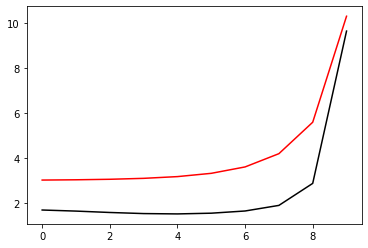

4400 54.00584110300521 -0.717258252722133 1.0849311926918734
[1.68332405 1.63537698 1.57364163 1.52509006 1.50983552 1.54210554
 1.63997238 1.88864066 2.86729776 9.63783951]


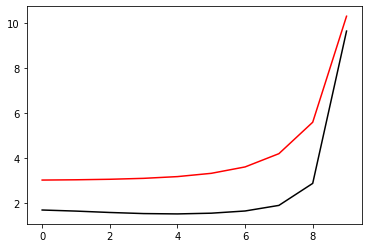

4600 54.00583996617712 -0.7172325362171749 1.084961344899353
[1.68334968 1.63541393 1.57368967 1.52513174 1.50986312 1.54212681
 1.6399924  1.88865844 2.86731058 9.63783265]


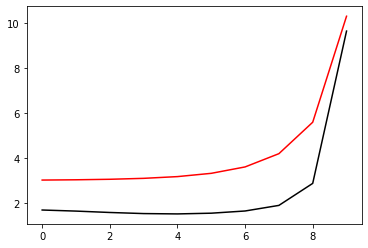

4800 54.005839966175756 -0.7172318803813986 1.084960352060342
[1.68335153 1.63540703 1.573675   1.52512541 1.50986894 1.5421352
 1.63999923 1.88866142 2.867304   9.63784891]


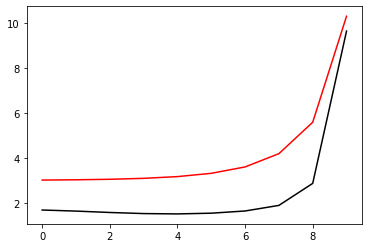

5000 54.00584019850579 -0.7172266091485237 1.0849846884747687
[1.68364117 1.63554758 1.57366253 1.5250187  1.5097162  1.54197325
 1.63985939 1.88858182 2.86733584 9.63804661]


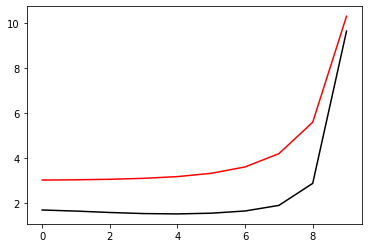

5200 54.00583996617692 -0.7172331190541518 1.0849622111022252
[1.6833528  1.63541403 1.57368874 1.52513637 1.50987093 1.54213399
 1.63999722 1.88865535 2.86728734 9.63782943]


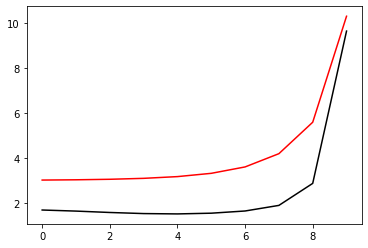

5400 54.005839966175955 -0.7172324808221441 1.0849612480602202
[1.68335372 1.63540917 1.57367726 1.52512847 1.5098737  1.54214081
 1.640003   1.8886581  2.86728248 9.63784723]


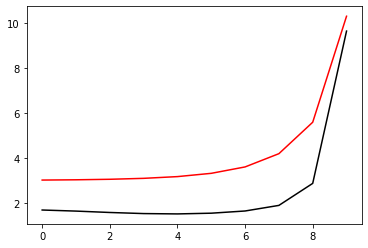

5600 54.005839982238996 -0.7172408897287106 1.0849677655783454
[1.68349743 1.63550171 1.57366396 1.52504323 1.50975418 1.54201457
 1.63989027 1.88858201 2.86727488 9.63793036]


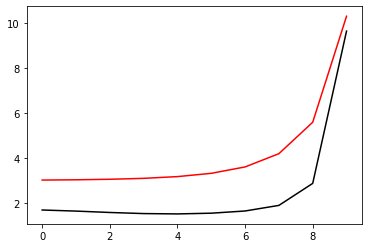

5800 54.00583996617697 -0.7172335952635847 1.0849629186885952
[1.68335503 1.63541513 1.57368905 1.52513877 1.509876   1.54213975
 1.64000137 1.88865273 2.86726754 9.63782899]


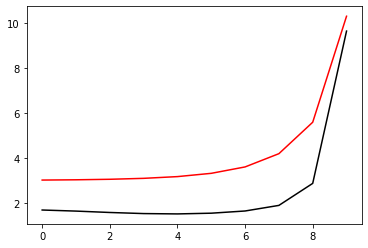

6000 54.00583996617612 -0.7172329530101652 1.0849619526881542
[1.68335546 1.63541089 1.57367902 1.52513074 1.50987722 1.54214542
 1.64000657 1.88865562 2.86726422 9.63784692]


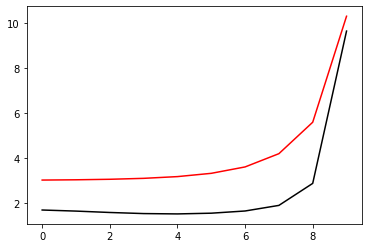

6200 54.00583996640149 -0.7172359488693906 1.0849677451305535
[1.68339046 1.63547226 1.57370284 1.52510903 1.50983401 1.54209934
 1.63996713 1.88863129 2.86726709 9.63786682]


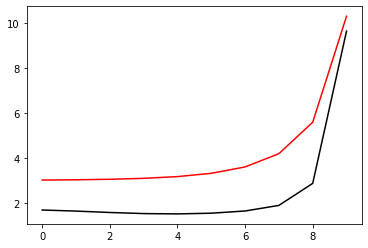

6400 54.005839966177035 -0.7172340287503728 1.0849635639813047
[1.68335709 1.63541614 1.57368923 1.52514093 1.50988087 1.54214493
 1.64000489 1.88865033 2.86724999 9.63782814]


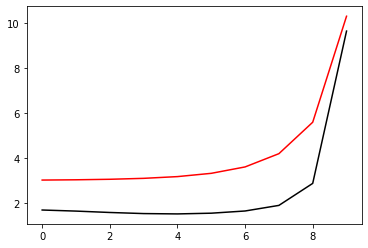

6600 54.00583996617632 -0.7172333837413873 1.084962595475704
[1.68335704 1.63541245 1.57368066 1.52513285 1.50988047 1.54214956
 1.64000961 1.8886533  2.86724802 9.63784631]


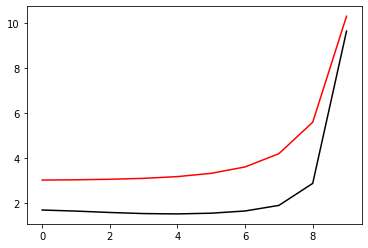

6800 54.00583996620812 -0.717235874400863 1.0849662619333864
[1.68336641 1.63545386 1.57371205 1.52512983 1.50985791 1.54212332
 1.63998621 1.88863624 2.86724267 9.63783173]


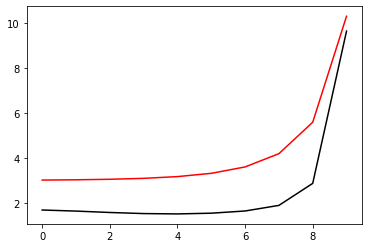

7000 54.00583996617716 -0.7172344137633638 1.0849641376067436
[1.68335874 1.63541728 1.57368997 1.52514274 1.5098846  1.54214918
 1.64000783 1.8886482  2.86723484 9.63782756]


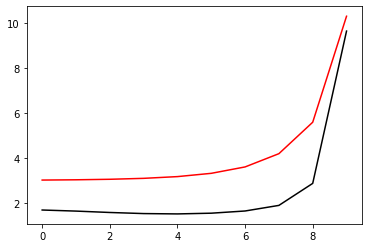

7200 54.005839966176474 -0.7172337608018434 1.0849631582363293
[1.68335839 1.63541383 1.57368217 1.52513477 1.50988324 1.54215304
 1.64001222 1.88865131 2.86723402 9.63784569]


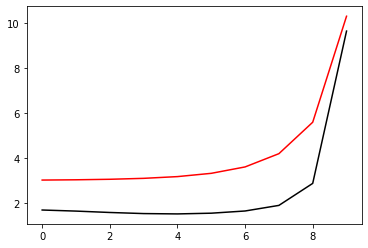

7400 54.00583996618781 -0.7172357704373524 1.0849661072380685
[1.68335912 1.63544017 1.5737124  1.52514045 1.5098711  1.542137
 1.63999782 1.88864014 2.86722873 9.6378227 ]


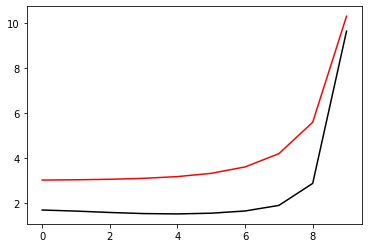

7600 54.00583996617717 -0.7172346333949204 1.0849644643460654
[1.6833599  1.63541782 1.57368982 1.52514326 1.50988711 1.54215269
 1.6400106  1.88864701 2.86722299 9.63782953]


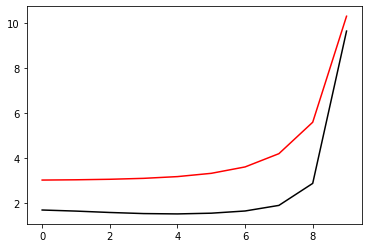

7800 54.0058399661766 -0.7172339837962645 1.084963488789259
[1.68335927 1.63541462 1.57368287 1.52513562 1.50988483 1.54215562
 1.64001458 1.88865031 2.86722348 9.63784702]


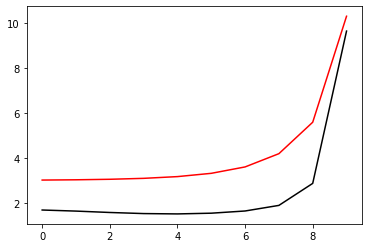

8000 54.00583996617985 -0.717235740833852 1.084966140055223
[1.68335875 1.63543027 1.57370943 1.52514828 1.50988066 1.54214589
 1.64000488 1.88864126 2.86721579 9.63781564]


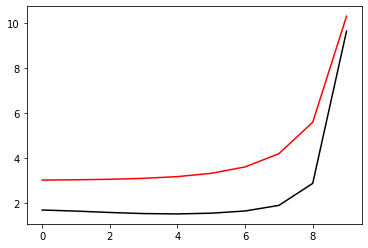

8200 54.00583996617729 -0.7172348497077201 1.0849647863236487
[1.683361   1.63541839 1.5736898  1.52514381 1.50988954 1.54215592
 1.64001293 1.88864583 2.8672125  9.63783046]


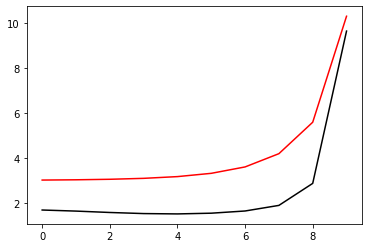

8400 54.0058399687858 -0.7172328848194721 1.0849651261598219
[1.6833614  1.63541671 1.5736849  1.52513783 1.50988769 1.54215929
 1.6400179  1.88865058 2.86721539 9.63784894]


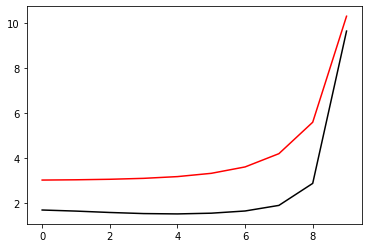

8600 54.00583996617963 -0.7172360313911011 1.0849665894874214
[1.68336019 1.63542905 1.57370933 1.52515227 1.50988506 1.5421495
 1.6400073  1.88863992 2.86720512 9.63781178]


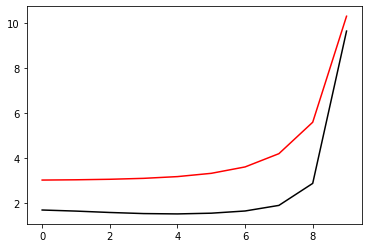

8800 54.00583996617743 -0.7172351735365236 1.0849652696605325
[1.68336211 1.63541956 1.57369115 1.5251457  1.50989215 1.5421585
 1.64001439 1.88864398 2.86720243 9.63782842]


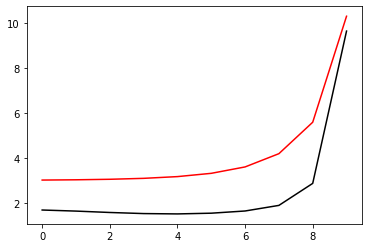

9000 54.00583996618265 -0.7172345711297676 1.0849642134439232
[1.68336107 1.63541651 1.57368498 1.52513831 1.50988861 1.5421603
 1.64001796 1.88864742 2.86720438 9.63784574]


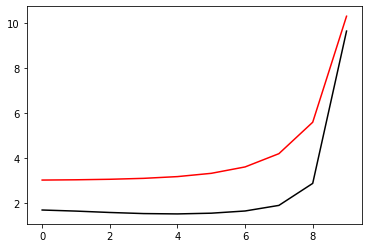

9200 54.00583996617992 -0.7172363015101589 1.0849669946703566
[1.68336097 1.63543075 1.57371099 1.52515305 1.50988634 1.54215143
 1.64000869 1.88863838 2.86719623 9.63781125]


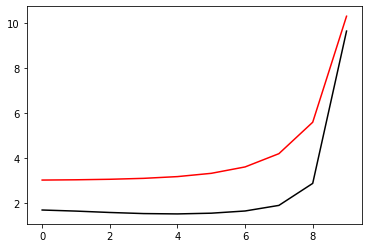

9400 54.005839966177604 -0.7172354200621298 1.0849656377521355
[1.68336294 1.63542049 1.57369229 1.52514708 1.50989381 1.54216047
 1.64001592 1.88864271 2.86719397 9.63782747]


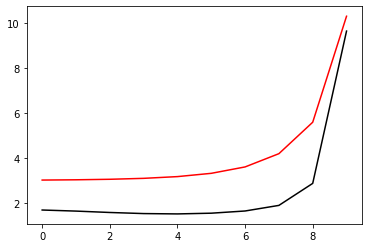

9600 54.00583997346516 -0.7172369384408678 1.084962424885863
[1.68335977 1.63541528 1.57368393 1.52513751 1.50988811 1.54216002
 1.64001724 1.88864414 2.86719432 9.63784269]


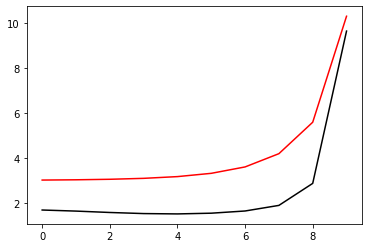

9800 54.005839966179586 -0.7172364359045132 1.084967180408408
[1.68336192 1.63542983 1.57370993 1.52515458 1.50988907 1.54215417
 1.64001077 1.88863778 2.86718868 9.63781119]


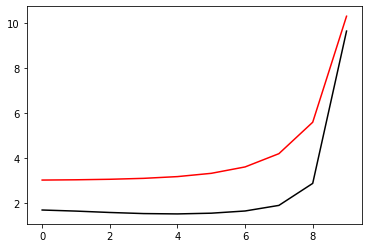

10000 54.00583996617767 -0.7172355697061522 1.0849658608564592
[1.68336357 1.63542099 1.57369265 1.52514765 1.50989511 1.54216228
 1.64001733 1.88864192 2.86718725 9.63782804]


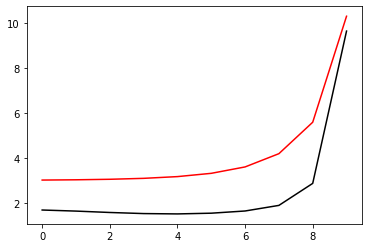

10200 54.00584029916297 -0.7172240985923677 1.0849827544310182
[1.68349187 1.63548193 1.5737116  1.52514397 1.50988717 1.5421644
 1.64004028 1.88870164 2.86730612 9.63804492]


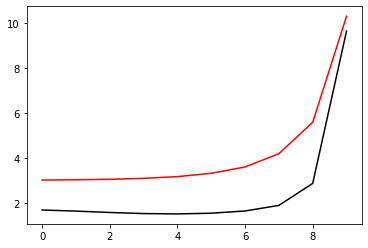

10400 54.00583996617942 -0.7172365576813955 1.0849673476847124
[1.68336281 1.63542907 1.57370891 1.52515606 1.50989153 1.54215639
 1.64001239 1.88863726 2.86718247 9.63781065]


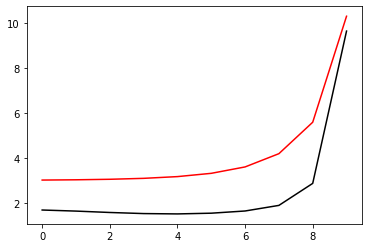

10600 54.00583996617775 -0.7172357052540139 1.0849660629994593
[1.68336411 1.63542145 1.57369303 1.52514823 1.50989628 1.54216377
 1.6400184  1.88864121 2.86718167 9.63782816]


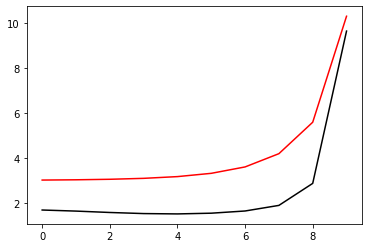

10800 54.00584508831153 -0.7173050926867428 1.0849224735857295
[1.68359058 1.63546274 1.57361483 1.52500401 1.50973007 1.54201365
 1.63992098 1.8886446  2.86735161 9.6382445 ]


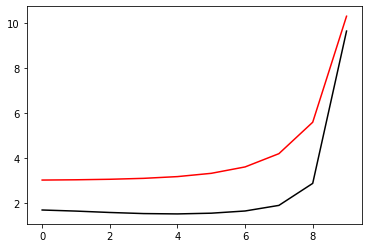

11000 54.0058399661791 -0.7172365615076421 1.084967350052443
[1.6833636  1.63542794 1.57370666 1.52515613 1.50989359 1.54215885
 1.64001439 1.88863728 2.86717735 9.63781237]


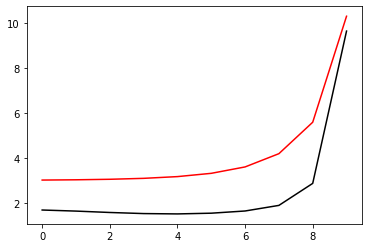

11200 54.00583996617774 -0.717235733223836 1.08496610431244
[1.68336441 1.63542147 1.57369265 1.52514783 1.50989669 1.54216509
 1.64001974 1.88864114 2.86717754 9.63783024]


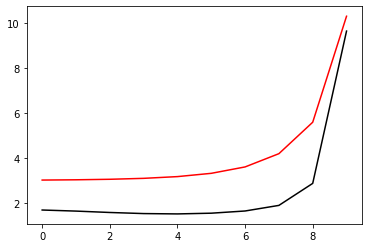

11400 54.00583999896942 -0.7172453230182014 1.0849705204732671
[1.68353729 1.6355208  1.57367553 1.52505437 1.50976628 1.54202651
 1.6398952  1.88855758 2.86717249 9.63792367]


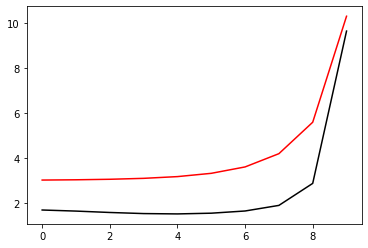

11600 54.00583996617869 -0.7172364931782623 1.0849672453518833
[1.68336465 1.63542607 1.57370254 1.52515568 1.5098966  1.54216196
 1.64001676 1.88863765 2.86717264 9.6378148 ]


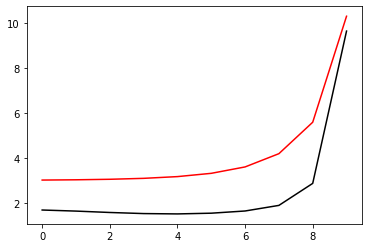

11800 54.00583996617769 -0.7172357062704503 1.0849660634321283
[1.68336462 1.63542124 1.57369178 1.52514685 1.50989685 1.54216649
 1.64002118 1.88864133 2.86717409 9.63783332]


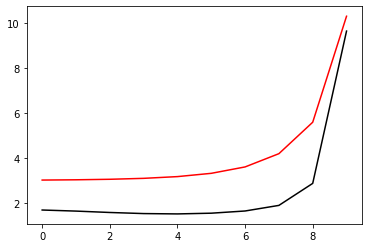

12000 54.00583996621762 -0.7172382471389577 1.084970326762273
[1.68338549 1.63547285 1.57371889 1.52513359 1.50986341 1.54212995
 1.6399895  1.88862142 2.86717666 9.63783662]


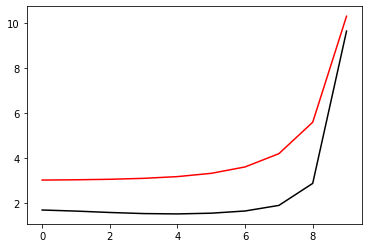

12200 54.00583996617849 -0.717236463408981 1.0849671983461096
[1.68336539 1.63542513 1.57369994 1.52515495 1.50989877 1.5421643
 1.64001833 1.88863763 2.86716861 9.63781717]


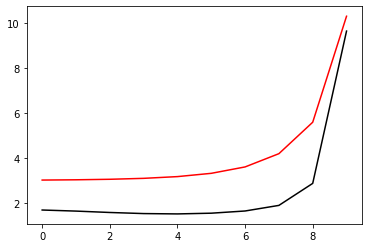

12400 54.005839966177675 -0.7172357028447827 1.0849660578792597
[1.6833648  1.63542115 1.57369128 1.52514627 1.50989705 1.54216764
 1.64002227 1.88864128 2.86717104 9.63783568]


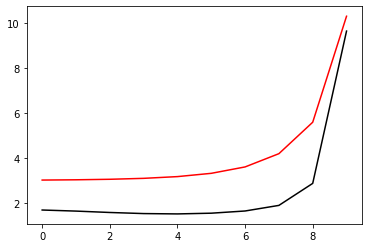

12600 54.00583996620118 -0.7172379533322742 1.084969314551624
[1.683368   1.63545435 1.57372361 1.52514878 1.50988011 1.54214652
 1.64000332 1.88862769 2.86716826 9.63781378]


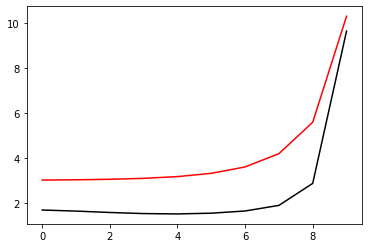

12800 54.00583996617854 -0.7172365605681901 1.0849673425006447
[1.68336599 1.63542525 1.57369958 1.52515523 1.50990032 1.54216593
 1.64001928 1.88863698 2.86716429 9.63781697]


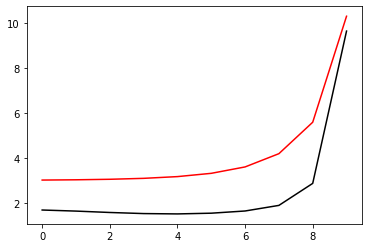

13000 54.00583996617774 -0.7172358033676814 1.0849662078387354
[1.6833652  1.63542151 1.57369159 1.52514669 1.50989785 1.54216878
 1.64002305 1.88864065 2.86716711 9.63783565]


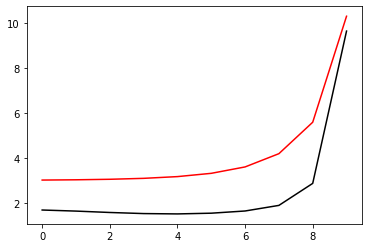

13200 54.005839966202956 -0.7172376710041355 1.0849693562297018
[1.68336629 1.63544928 1.57372282 1.52515216 1.50988473 1.54215144
 1.64000757 1.88862943 2.86716454 9.63781186]


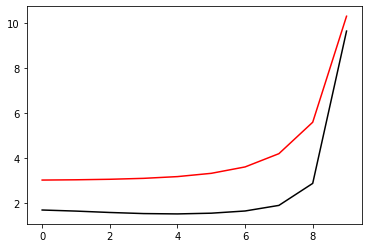

13400 54.0058399661785 -0.7172365797362612 1.0849673705841596
[1.68336627 1.63542519 1.5736991  1.5251549  1.50990086 1.54216705
 1.64002029 1.88863684 2.8671612  9.63781848]


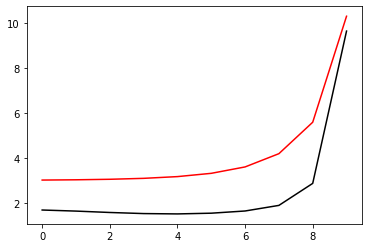

13600 54.00583996617776 -0.7172358268480062 1.0849662427355464
[1.68336535 1.63542157 1.57369152 1.52514658 1.509898   1.54216943
 1.64002385 1.88864061 2.86716459 9.63783681]


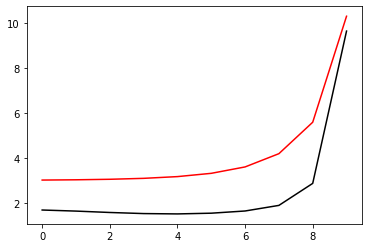

13800 54.00583996618565 -0.7172377461317745 1.084969274428123
[1.6833649  1.63544386 1.57372263 1.52515662 1.5098891  1.54215522
 1.64001057 1.88863016 2.86716025 9.63780632]


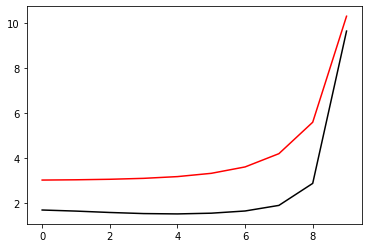

14000 54.005839966178556 -0.7172366872989964 1.0849675309216358
[1.68336671 1.63542552 1.57369936 1.52515548 1.50990196 1.54216806
 1.64002079 1.88863621 2.86715779 9.63781767]


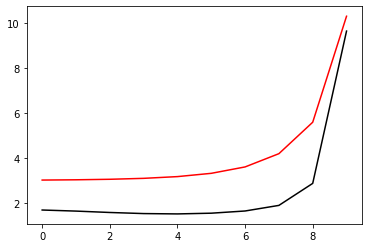

14200 54.005839966177824 -0.7172359325389911 1.0849664005536128
[1.68336571 1.63542197 1.57369199 1.52514719 1.50989881 1.5421703
 1.64002433 1.88863997 2.86716132 9.63783616]


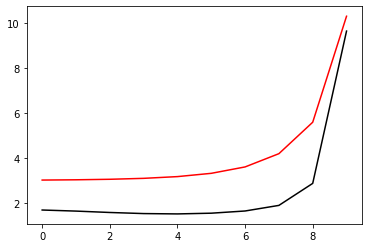

14400 54.00583996618378 -0.7172375745292356 1.0849689889752638
[1.68336474 1.63544034 1.57371947 1.52515687 1.50989136 1.5421581
 1.64001311 1.88863118 2.86715778 9.6378088 ]


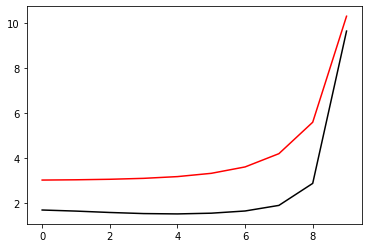

14600 54.00583996617843 -0.7172365790110925 1.0849673685155228
[1.68336664 1.63542496 1.57369809 1.52515411 1.50990161 1.54216879
 1.64002186 1.8886368  2.86715667 9.63782156]


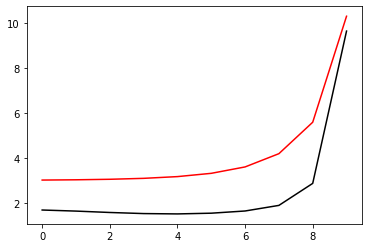

14800 54.005840169042614 -0.7172242474908758 1.0849778214246513
[1.68337728 1.63543327 1.57370291 1.52515782 1.50990966 1.54218196
 1.64003672 1.88865241 2.86717281 9.63785099]


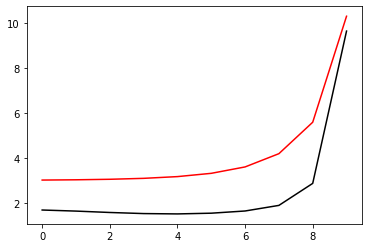

15000 54.00583996618007 -0.717237367331516 1.0849685605409398
[1.68336544 1.63543252 1.57371295 1.52516019 1.50989693 1.54216269
 1.64001688 1.88863308 2.86715528 9.6378076 ]


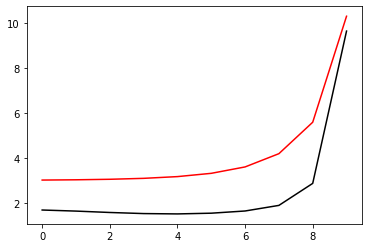

In [57]:
optimizer=tf.optimizers.Adam(learning_rate=0.0005)
for i in range (1, 15001):
    run()
    if i%200==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

200 54.00583996619857 -0.7172174812765378 1.0849390258985858
[1.68332992 1.63535561 1.57357923 1.52500873 1.50975941 1.54206388
 1.63999359 1.88873392 2.8674435  9.63827751]


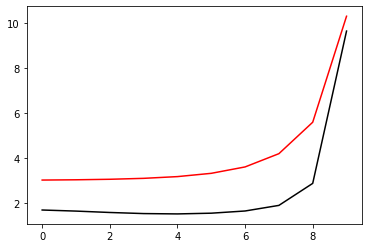

400 54.005839966184645 -0.7172178306907061 1.0849393590268321
[1.68330946 1.63535189 1.57359579 1.52502505 1.50977095 1.54207223
 1.64000145 1.88874624 2.86746449 9.63819522]


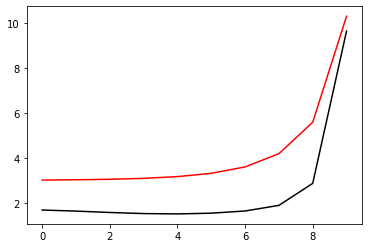

600 54.005839966180716 -0.7172187085328999 1.0849406695174213
[1.68331178 1.63535541 1.57360264 1.52503274 1.50977328 1.54206849
 1.63999711 1.88875136 2.86748885 9.63812649]


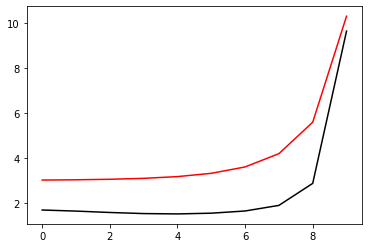

800 54.005839966178144 -0.717219573384621 1.0849419654791388
[1.68331454 1.63535939 1.57360842 1.5250393  1.50977697 1.54206608
 1.63999164 1.88875366 2.86751004 9.63806577]


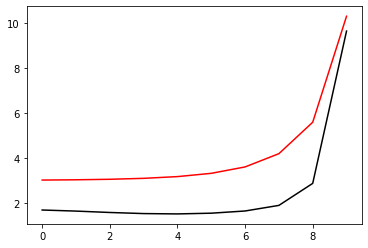

1000 54.00583996617664 -0.7172203531969803 1.0849431332576955
[1.68331698 1.63536283 1.57361339 1.52504519 1.50978142 1.54206556
 1.63998626 1.88875285 2.86752582 9.63801764]


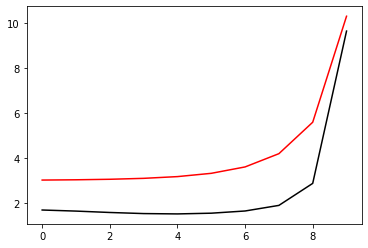

1200 54.00583996654394 -0.7172240705952947 1.084947718725438
[1.68333394 1.63540816 1.57364509 1.52504565 1.50976251 1.54203711
 1.63995455 1.88872999 2.86753051 9.63797205]


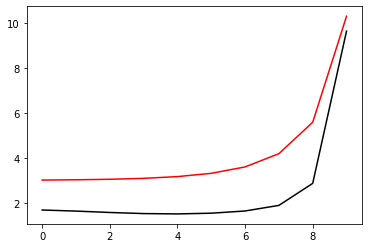

1400 54.00583996617513 -0.7172229865556203 1.0849470738990379
[1.68332288 1.63537431 1.57363333 1.52506874 1.50979738 1.54206737
 1.63997408 1.88873684 2.86752426 9.63793409]


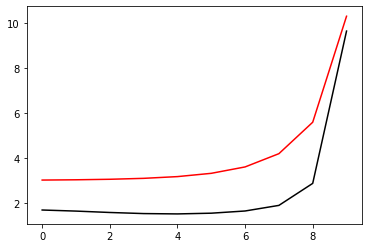

1600 54.005839966174946 -0.7172231448979108 1.084947302871326
[1.68332472 1.635374   1.57363039 1.52506742 1.5098026  1.5420744
 1.63997524 1.88873217 2.86752072 9.63792988]


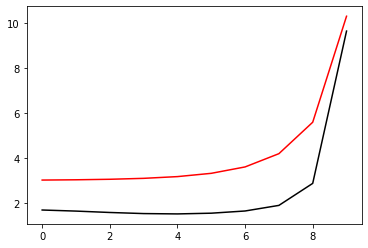

1800 54.00583996617648 -0.7172252902649582 1.0849505407846385
[1.68332601 1.63539011 1.57365722 1.5250831  1.50980386 1.54206934
 1.63996547 1.88871755 2.86750794 9.63789012]


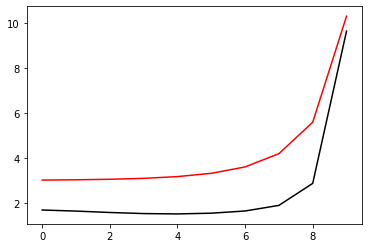

2000 54.00583996617481 -0.7172250272104292 1.0849501203613863
[1.68332952 1.63538152 1.57364246 1.52508277 1.5098163  1.54208207
 1.63997247 1.88871535 2.86749725 9.63789497]


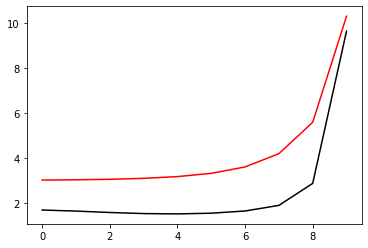

2200 54.00584042503041 -0.717216076459422 1.0849810142297263
[1.68363211 1.63551745 1.57363318 1.52498737 1.50968151 1.54194282
 1.63985834 1.88866492 2.86756981 9.63815453]


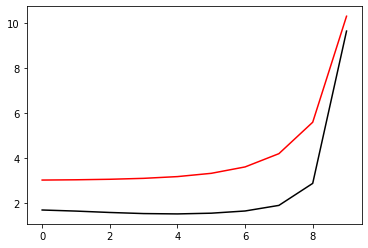

2400 54.00583996617536 -0.7172268294958575 1.084952817757713
[1.68333278 1.63539038 1.57365812 1.52509702 1.50982431 1.54208698
 1.63997104 1.88870028 2.86747054 9.63786911]


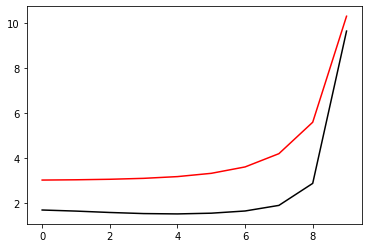

2600 54.00583996617468 -0.7172265445929382 1.084952384910495
[1.68333459 1.63538692 1.57364887 1.52509192 1.50982964 1.54209581
 1.63997699 1.8886989  2.86745955 9.63788273]


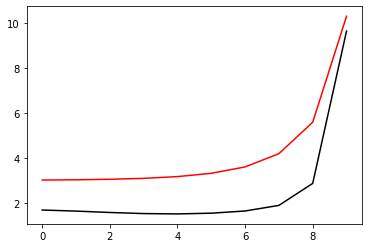

2800 54.00583996640707 -0.7172289179456504 1.0849570946534834
[1.6833539  1.63543521 1.57367673 1.52508383 1.50980404 1.54206759
 1.63995092 1.8886773  2.8674501  9.63788161]


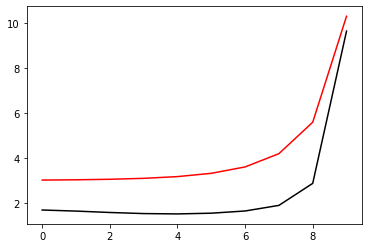

3000 54.0058399661751 -0.7172280227339628 1.0849545954984452
[1.6833379  1.6353933  1.57365976 1.52510403 1.50983787 1.54210076
 1.63997767 1.88868794 2.86743202 9.63786384]


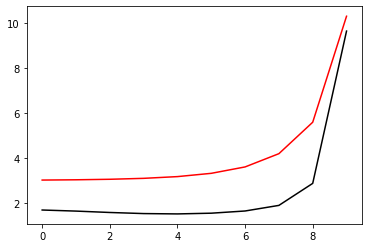

3200 54.00583996617469 -0.7172277143134969 1.0849541285503888
[1.6833386  1.63539112 1.57365369 1.52509842 1.50983917 1.54210699
 1.63998307 1.88868799 2.86742267 9.637879  ]


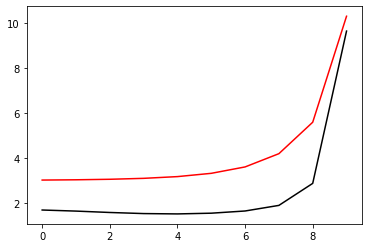

3400 54.00583996617712 -0.7172295358687962 1.0849569060189461
[1.68333887 1.63540611 1.57367893 1.52511137 1.50983738 1.54210057
 1.63997565 1.88867752 2.86740768 9.63785014]


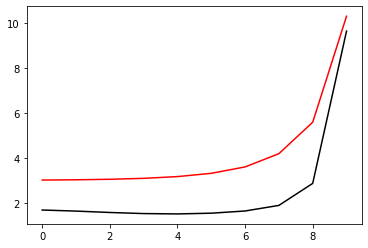

3600 54.005839966174996 -0.7172289846661467 1.0849560291786637
[1.68334184 1.63539628 1.57366195 1.5251085  1.50984735 1.54211197
 1.63998439 1.8886796  2.8673965  9.6378631 ]


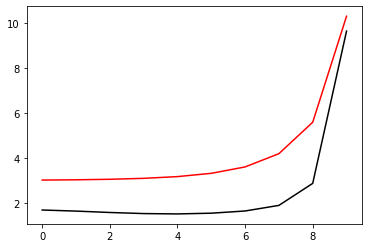

3800 54.00584031837804 -0.7172521105026298 1.0849554421925898
[1.68357195 1.63547889 1.57360472 1.52496723 1.50966729 1.54192706
 1.6398235  1.88857841 2.86740403 9.63804423]


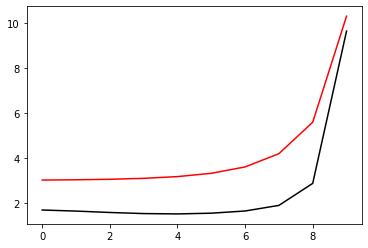

4000 54.00583996617581 -0.7172302837384663 1.0849579770507651
[1.68334391 1.63540303 1.57367428 1.52511884 1.50985129 1.54211408
 1.63998465 1.88867198 2.86737282 9.63784699]


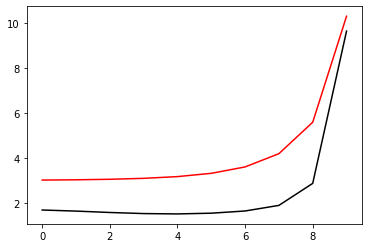

4200 54.00583996617507 -0.7172298020082841 1.0849572481523606
[1.68334505 1.63539906 1.57366436 1.52511206 1.50985439 1.54212123
 1.6399907  1.88867367 2.86736461 9.63786349]


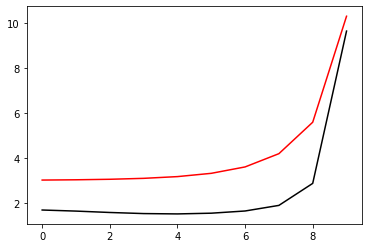

4400 54.00583996682718 -0.717233242242669 1.0849611013466232
[1.68336161 1.63544758 1.57369302 1.5251023  1.50982517 1.5420889
 1.63996169 1.8886518  2.86735561 9.63785852]


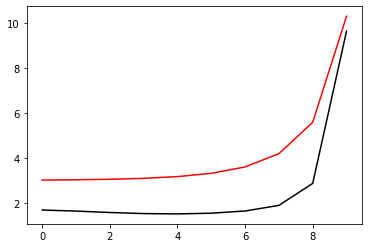

4600 54.00583996617577 -0.717231122369291 1.0849592237977985
[1.68334771 1.63540501 1.57367503 1.5251235  1.50986061 1.5421235
 1.63999051 1.88866638 2.86734172 9.63784407]


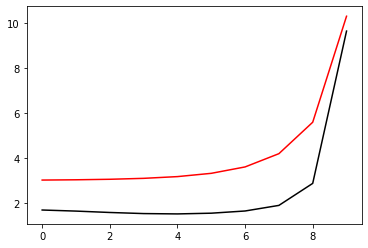

4800 54.00583996617521 -0.7172306323167337 1.084958487328933
[1.683348   1.63540208 1.57366769 1.52511643 1.50986077 1.54212891
 1.63999581 1.88866838 2.86733557 9.63786128]


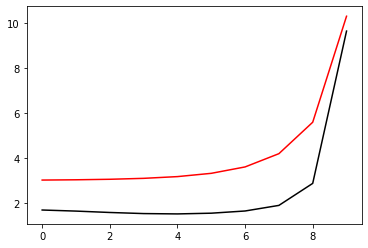

5000 54.00583996621483 -0.7172329543269869 1.0849617104244866
[1.68335008 1.63543161 1.57369882 1.5251211  1.50984763 1.54211213
 1.6399805  1.88865517 2.86732557 9.63783887]


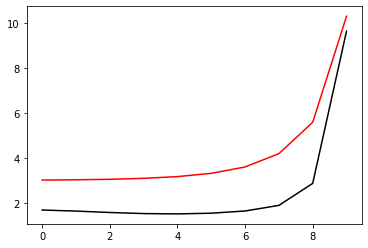

5200 54.00583996617589 -0.7172318108753512 1.0849602504035276
[1.68335046 1.63540726 1.57367691 1.52512679 1.50986671 1.54213077
 1.63999562 1.8886622  2.8673153  9.63784326]


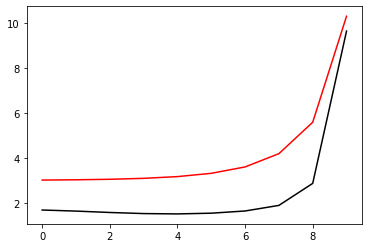

5400 54.005839966175415 -0.7172313024297257 1.0849594879855002
[1.68335036 1.63540455 1.57367046 1.52511993 1.50986564 1.54213498
 1.64000039 1.8886646  2.86731101 9.63786014]


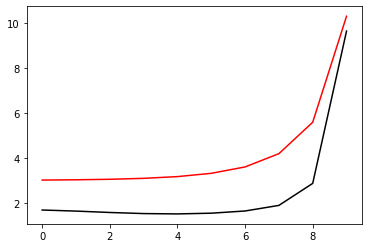

5600 54.00583996617972 -0.71723320796334 1.0849623043233876
[1.68335019 1.63542147 1.57369794 1.52513256 1.50986166 1.54212584
 1.63999112 1.88865475 2.86729952 9.63782903]


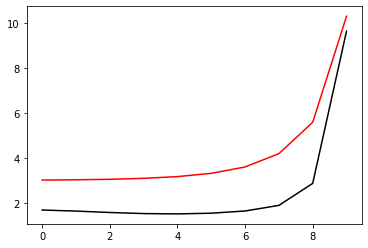

5800 54.005839966176005 -0.7172324014939466 1.084961131081324
[1.68335285 1.6354092  1.57367848 1.52512944 1.50987196 1.54213715
 1.64000012 1.88865881 2.8672922  9.63784272]


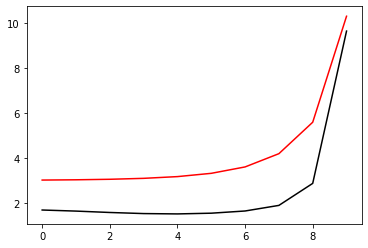

6000 54.00585285310394 -0.7173242207580964 1.0848663269657344
[1.68328767 1.63533288 1.57359348 1.52504022 1.50978539 1.54205548
 1.63992071 1.88858047 2.86721335 9.63779006]


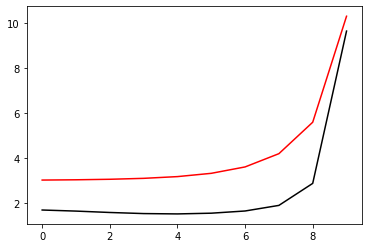

6200 54.005839966177476 -0.7172335142389777 1.0849628161703944
[1.68335309 1.6354173  1.5736938  1.52513775 1.50987065 1.54213469
 1.63999776 1.88865325 2.86727796 9.63782779]


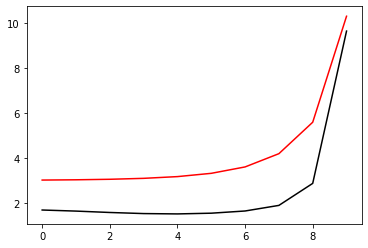

6400 54.00583996617611 -0.717232821370683 1.084961756926682
[1.68335468 1.63541055 1.5736793  1.52513088 1.50987575 1.54214253
 1.64000423 1.88865644 2.86727305 9.63784444]


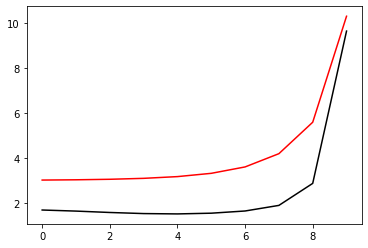

6600 54.00583998058095 -0.7172410589451373 1.0849685245024239
[1.68352589 1.63550683 1.57365975 1.52503595 1.5097447  1.54200371
 1.63987924 1.88857115 2.86726265 9.63793819]


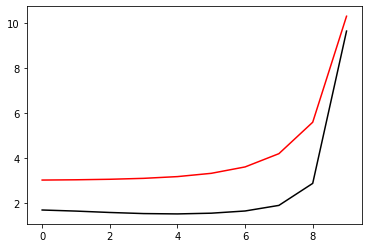

6800 54.00583996617706 -0.7172338072141259 1.0849632354630485
[1.68335578 1.63541593 1.57368995 1.52513983 1.50987752 1.54214167
 1.64000284 1.88865169 2.86725955 9.63782874]


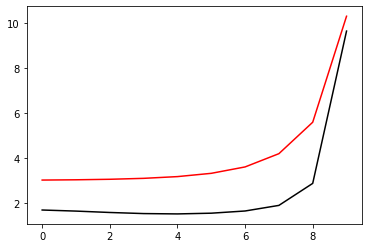

7000 54.005839966176204 -0.7172331547709595 1.0849622538660937
[1.68335617 1.63541164 1.57367989 1.52513182 1.50987864 1.54214714
 1.64000793 1.88865467 2.86725677 9.63784652]


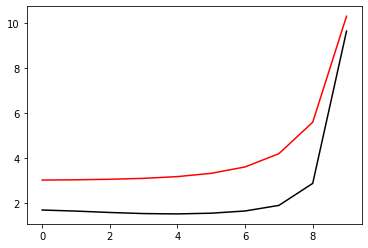

7200 54.005839966262506 -0.7172351846839812 1.084966055138976
[1.68336561 1.63545139 1.57370825 1.52512717 1.50985619 1.54212183
 1.63998546 1.88863838 2.86725175 9.63783594]


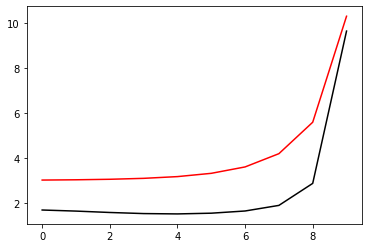

7400 54.00583996617689 -0.7172340438215279 1.0849635847925343
[1.68335771 1.63541579 1.57368776 1.52514012 1.50988222 1.5421473
 1.64000692 1.88865027 2.86724395 9.63783143]


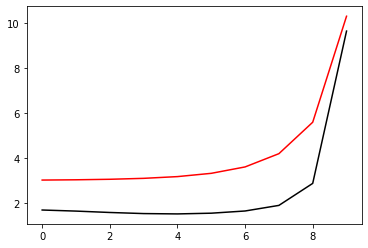

7600 54.00583996617628 -0.7172334148721771 1.084962639145213
[1.68335732 1.63541251 1.57368037 1.52513245 1.50988071 1.54215088
 1.64001121 1.88865336 2.86724311 9.637849  ]


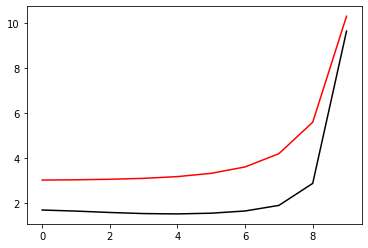

7800 54.00583996617953 -0.7172350475907209 1.0849651503952884
[1.68335686 1.63542701 1.57370524 1.52514445 1.50987706 1.54214226
 1.64000254 1.88864483 2.86723481 9.63782002]


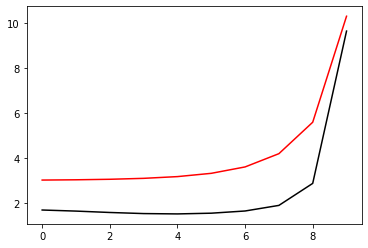

8000 54.005839966176865 -0.7172342227386208 1.0849638499377325
[1.68335904 1.63541597 1.57368657 1.5251398  1.50988522 1.54215181
 1.64001033 1.88864914 2.86723099 9.63783497]


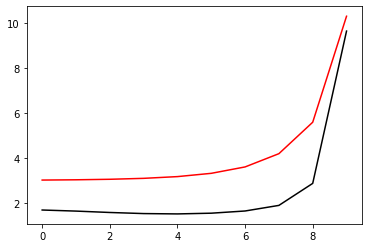

8200 54.00584105389481 -0.7172195164802001 1.0850117481376593
[1.68365595 1.63552016 1.57364845 1.52502074 1.50973446 1.54200963
 1.63991503 1.88865056 2.8673967  9.6382454 ]


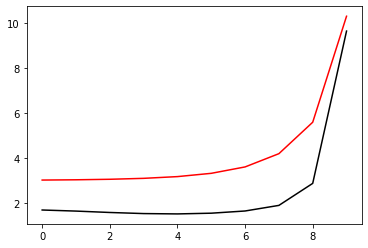

8400 54.00583996617796 -0.7172350796214473 1.0849651399949343
[1.68335927 1.6354216  1.57369806 1.52514739 1.50988462 1.54214934
 1.64000797 1.88864501 2.86722201 9.63782112]


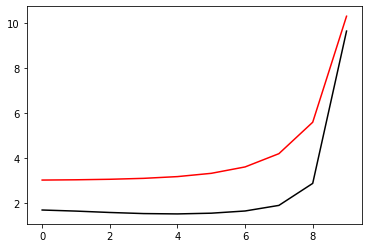

8600 54.00583996617687 -0.7172343415974353 1.0849640262107745
[1.68335994 1.63541617 1.57368581 1.52513924 1.50988693 1.5421553
 1.64001327 1.88864843 2.86722054 9.63783889]


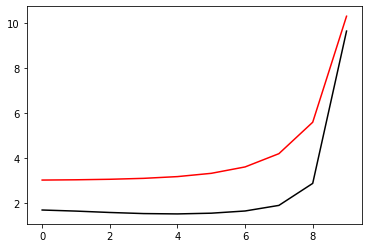

8800 54.00583997122795 -0.717239710844283 1.0849681393594426
[1.6834065  1.63548112 1.57370207 1.52510677 1.5098325  1.54209845
 1.63996491 1.8886199  2.86722811 9.63787484]


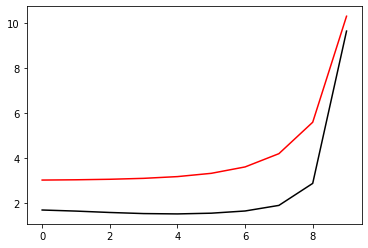

9000 54.00583996617771 -0.717235212211904 1.0849653311314817
[1.68336099 1.63542064 1.57369484 1.52514784 1.50988917 1.54215396
 1.64001118 1.88864419 2.86721102 9.63782268]


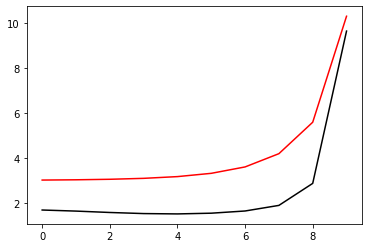

9200 54.0058399661769 -0.7172345063861221 1.084964271631043
[1.68336077 1.63541667 1.57368587 1.52513943 1.50988846 1.54215815
 1.64001561 1.88864751 2.86721107 9.63784096]


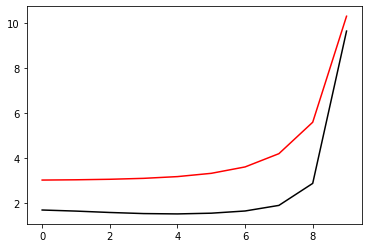

9400 54.00583996623263 -0.7172368231407015 1.084967446966836
[1.6833654  1.63545149 1.57371691 1.52513982 1.50987011 1.54213616
 1.63999598 1.88863323 2.86720705 9.63782244]


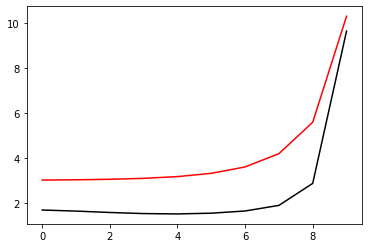

9600 54.00583996617772 -0.717235378985927 1.0849655782853074
[1.68336211 1.63542079 1.57369399 1.52514813 1.50989187 1.54215722
 1.64001349 1.88864319 2.86720163 9.63782381]


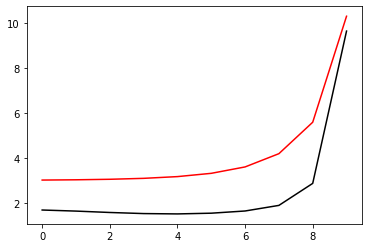

9800 54.00583996617701 -0.717234682117878 1.0849645336954916
[1.6833615  1.63541728 1.57368632 1.52514001 1.50988982 1.5421604
 1.64001749 1.88864659 2.86720276 9.63784194]


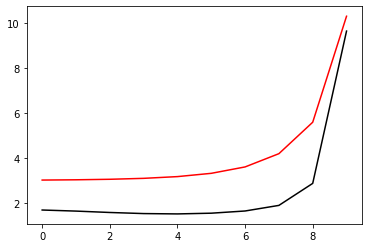

10000 54.0058399661926 -0.7172366620895997 1.0849677599199419
[1.68336192 1.63544353 1.57371868 1.52514786 1.50987841 1.54214419
 1.64000271 1.88863527 2.86719826 9.6378149 ]


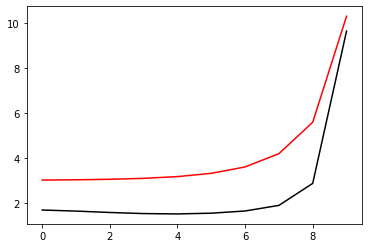

10200 54.00583996617784 -0.717235619483378 1.0849659369330311
[1.68336303 1.63542158 1.57369475 1.52514946 1.50989404 1.54215939
 1.64001482 1.88864184 2.86719339 9.63782274]


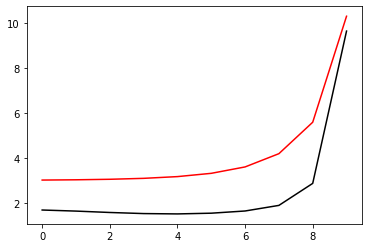

10400 54.00583996617718 -0.7172349167795671 1.084964884006003
[1.6833623  1.63541815 1.57368736 1.52514135 1.50989155 1.54216231
 1.64001873 1.88864528 2.86719498 9.63784091]


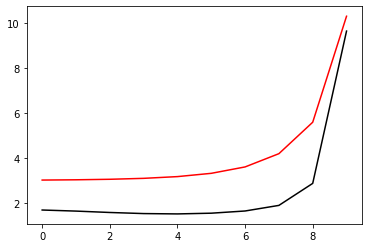

10600 54.005839966191544 -0.7172366636419851 1.0849677551435168
[1.68336197 1.63544038 1.57371647 1.5251493  1.50988208 1.54214857
 1.64000629 1.88863553 2.86719059 9.63781524]


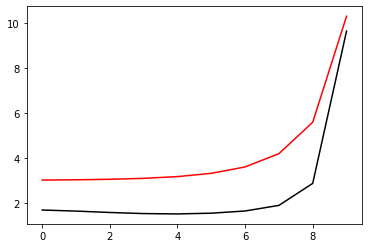

10800 54.00583996617782 -0.7172356842117422 1.084966032870372
[1.68336355 1.63542168 1.57369428 1.5251491  1.50989491 1.54216139
 1.64001673 1.88864154 2.86718715 9.63782516]


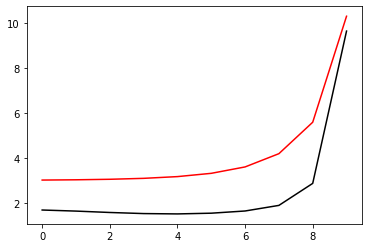

11000 54.00583996618272 -0.717234922766803 1.0849650437230498
[1.68336271 1.63541844 1.57368745 1.52514138 1.50989201 1.54216363
 1.64002034 1.88864523 2.86718981 9.63784282]


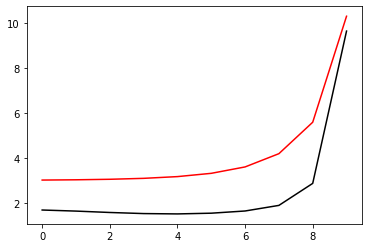

11200 54.00583996618012 -0.7172366795537 1.0849675583349028
[1.6833623  1.63543203 1.57371253 1.52515529 1.50988926 1.54215456
 1.64001096 1.88863652 2.86718293 9.63780992]


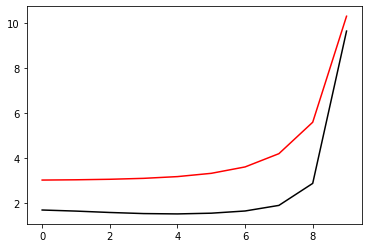

11400 54.00583996617784 -0.7172357836730843 1.084966180577717
[1.68336417 1.63542185 1.57369392 1.52514915 1.50989643 1.54216337
 1.64001802 1.88864093 2.86718145 9.63782612]


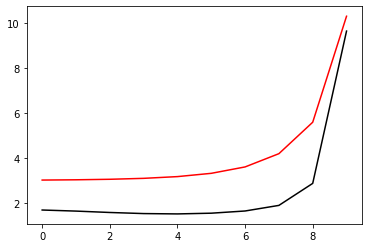

11600 54.00584349858423 -0.7171867413560892 1.085013073112327
[1.68341703 1.63547083 1.57373861 1.52519191 1.50994263 1.54221474
 1.6400715  1.88869538 2.86723659 9.63789686]


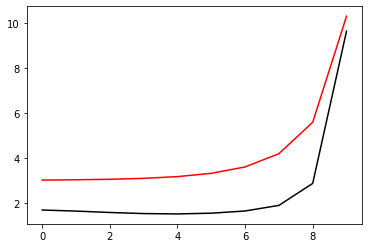

11800 54.00583996617944 -0.7172366543837396 1.084967490823071
[1.68336325 1.63542948 1.57370908 1.52515612 1.50989233 1.54215779
 1.64001356 1.88863683 2.86717759 9.63781132]


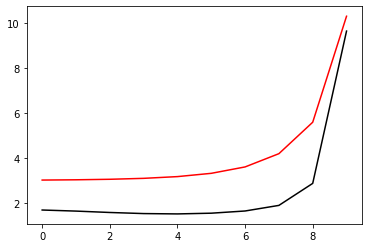

12000 54.00583996617782 -0.717235796666417 1.0849661993589965
[1.68336449 1.63542177 1.57369329 1.52514854 1.50989691 1.54216485
 1.64001945 1.88864087 2.86717727 9.63782863]


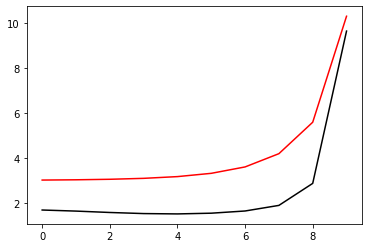

12200 54.00584048953063 -0.7172625098579951 1.0849611461226882
[1.68363939 1.63552461 1.57364197 1.52500443 1.50970895 1.54197174
 1.63985565 1.88854993 2.8672188  9.63805763]


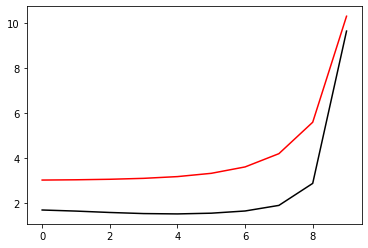

12400 54.00583996617891 -0.7172366089541306 1.0849674205787307
[1.68336446 1.63542715 1.57370478 1.52515659 1.50989591 1.54216107
 1.64001598 1.88863708 2.86717253 9.63781267]


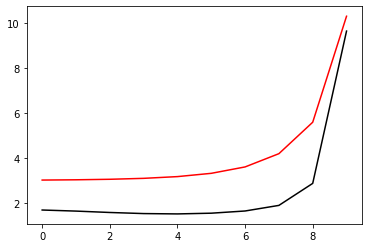

12600 54.00583996617779 -0.7172358000313509 1.0849662037343417
[1.68336479 1.63542165 1.57369258 1.52514782 1.50989738 1.54216639
 1.6400208  1.8886408  2.86717343 9.63783115]


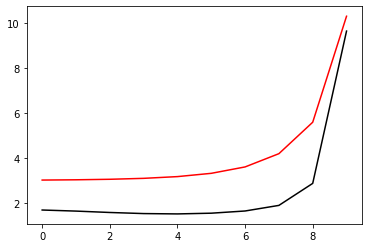

12800 54.005839975009316 -0.717237271875641 1.0849750486550649
[1.68343869 1.63550041 1.5737077  1.52510871 1.50983387 1.54210005
 1.63996518 1.88861105 2.86719145 9.63789167]


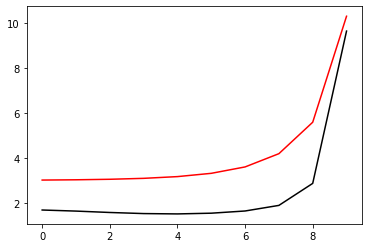

13000 54.0058399661786 -0.7172365055852246 1.0849672622708737
[1.68336516 1.63542562 1.5737012  1.52515549 1.50989802 1.54216352
 1.64001788 1.8886375  2.86716907 9.63781633]


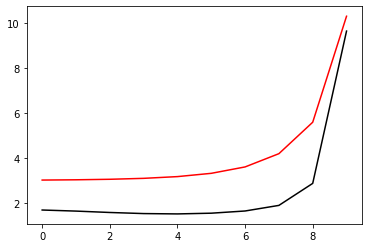

13200 54.005839966177696 -0.7172357331962682 1.0849661033714189
[1.68336482 1.6354213  1.57369163 1.52514669 1.50989717 1.54216738
 1.640022   1.88864118 2.8671712  9.63783472]


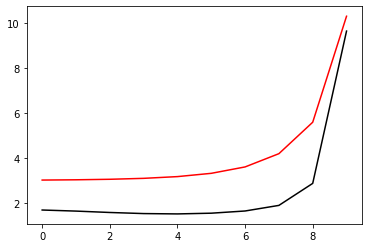

13400 54.00583996623718 -0.7172375167205058 1.0849693480976903
[1.68336925 1.63545498 1.57372138 1.52514661 1.50987904 1.54214591
 1.64000308 1.88862821 2.86717004 9.6378187 ]


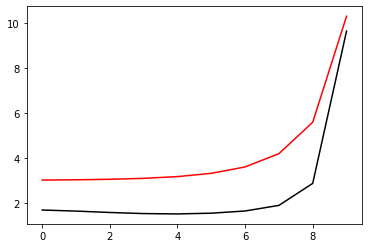

13600 54.00583996617835 -0.7172363954426741 1.08496709559922
[1.6833656  1.63542456 1.57369843 1.52515384 1.50989927 1.54216554
 1.64001949 1.88863797 2.86716649 9.6378202 ]


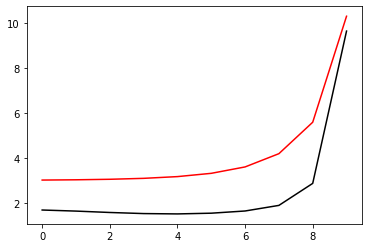

13800 54.00583996617763 -0.7172356506230442 1.08496597848663
[1.68336477 1.63542091 1.57369071 1.52514553 1.50989669 1.54216807
 1.64002309 1.88864171 2.86716974 9.63783816]


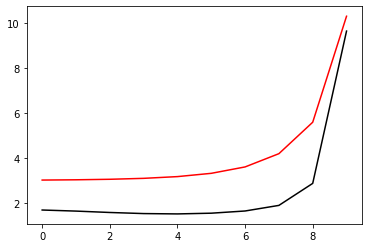

14000 54.00583996618111 -0.7172372299021355 1.0849684096415246
[1.68336389 1.63543585 1.57371602 1.52515692 1.50989179 1.54215805
 1.64001338 1.88863345 2.86716496 9.63780917]


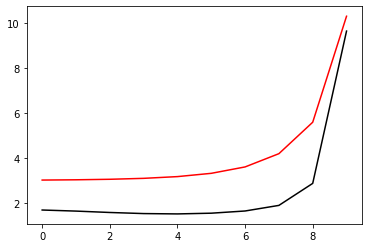

14200 54.00583996617819 -0.7172362887175834 1.0849669346956023
[1.68336584 1.63542378 1.57369632 1.52515207 1.50989986 1.54216727
 1.64002093 1.88863841 2.8671643  9.63782415]


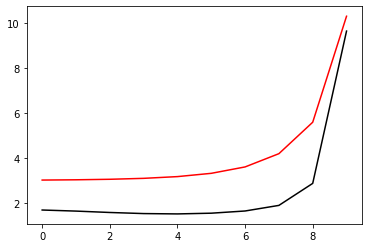

14400 54.00584865566151 -0.7171710248270271 1.08505962359412
[1.68362186 1.63553878 1.57372315 1.52513209 1.50986864 1.54215454
 1.64005526 1.88875907 2.86742526 9.63829362]


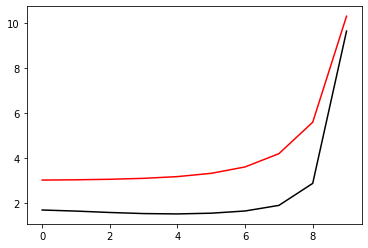

14600 54.00583996617956 -0.7172370851789494 1.0849681384762278
[1.68336517 1.63543018 1.57370963 1.52515921 1.50989691 1.54216229
 1.64001665 1.88863461 2.86716147 9.63780914]


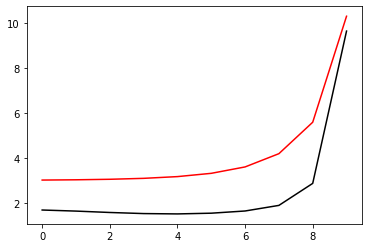

14800 54.00583996617811 -0.7172362265653593 1.084966840999797
[1.68336601 1.63542334 1.57369505 1.52515085 1.50990017 1.5421686
 1.64002204 1.8886386  2.86716223 9.63782716]


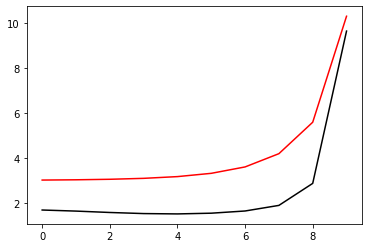

15000 54.00584011984526 -0.7172525639569577 1.0849689726112919
[1.68357757 1.63551866 1.57365256 1.52502188 1.50972891 1.54198849
 1.63986077 1.88853042 2.86715475 9.63795272]


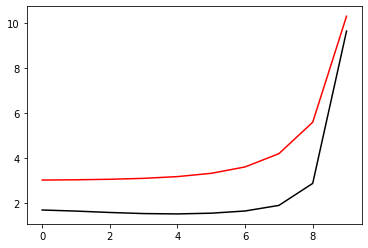

In [58]:
optimizer=tf.optimizers.Adam(learning_rate=0.0005)
for i in range (1, 15001):
    run()
    if i%200==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

200 54.005839967722736 -0.7172503232100693 1.0849904509593031
[1.68365621 1.63560716 1.57370449 1.52503691 1.50972557 1.54197861
 1.63984982 1.88852083 2.86714732 9.63790786]


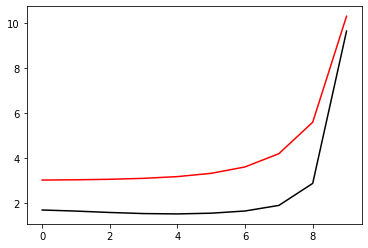

400 54.00583996626948 -0.7172446618680942 1.0849800009967239
[1.68342432 1.6355117  1.57375531 1.52515605 1.50987255 1.54213094
 1.63998047 1.88859238 2.86710884 9.63771411]


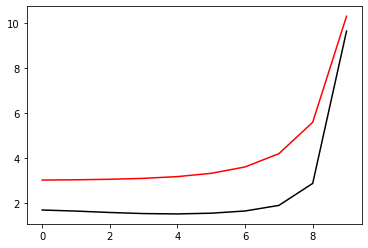

600 54.00583996619151 -0.7172427312516034 1.0849766445243465
[1.6833829  1.63546396 1.57374959 1.52518922 1.50991645 1.54217382
 1.64001621 1.8886105  2.8670937  9.63768482]


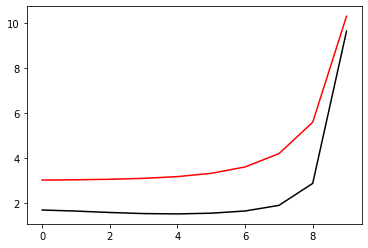

800 54.005839966185725 -0.717241813718177 1.084975203413828
[1.68338067 1.63544877 1.57373375 1.52519057 1.5099285  1.54218545
 1.6400247  1.88861331 2.86708558 9.63770393]


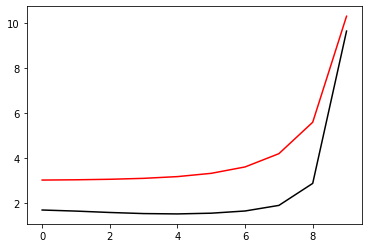

1000 54.00583996618356 -0.7172410565693415 1.084974060394355
[1.68338043 1.63544294 1.5737228  1.52518406 1.50993118 1.54219093
 1.64002856 1.88861401 2.86708027 9.63773198]


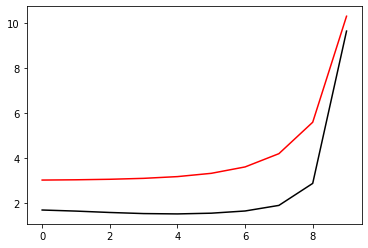

1200 54.005839966182144 -0.717240325832512 1.0849729647952924
[1.68337925 1.6354392  1.57371563 1.52517685 1.50992938 1.54219381
 1.64003165 1.88861515 2.86707754 9.63776008]


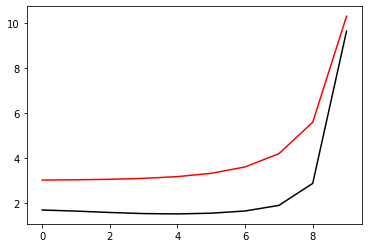

1400 54.005839966181114 -0.7172396069248523 1.0849718888479698
[1.68337756 1.63543606 1.57371023 1.52517037 1.50992537 1.54219444
 1.6400344  1.88861731 2.86707772 9.6377855 ]


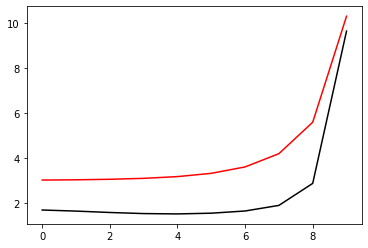

1600 54.0058399661803 -0.7172388988928636 1.0849708300463932
[1.68337565 1.63543317 1.5737057  1.52516457 1.50992044 1.54219316
 1.64003664 1.88862064 2.86708102 9.63780708]


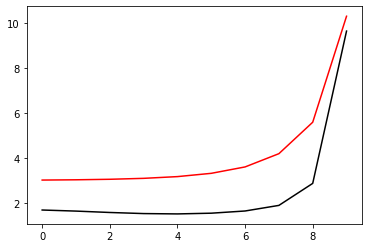

1800 54.00583996617965 -0.7172382009387426 1.0849697868560673
[1.68337365 1.63543041 1.57370162 1.52515925 1.50991517 1.54219048
 1.64003814 1.88862507 2.86708751 9.63782456]


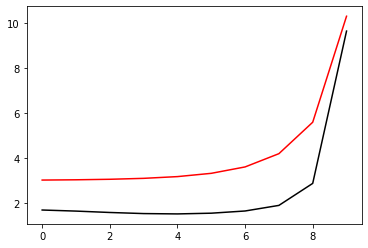

2000 54.005839966179046 -0.7172375106551594 1.084968755517718
[1.68337161 1.63542775 1.57369783 1.52515424 1.50990977 1.54218681
 1.64003874 1.88863035 2.86709706 9.63783823]


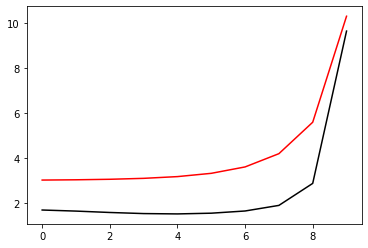

2200 54.00583996625437 -0.717240554474134 1.0849736286421077
[1.68341251 1.63548824 1.57371898 1.5251311  1.50986311 1.54213422
 1.63999469 1.88860861 2.86711415 9.63786436]


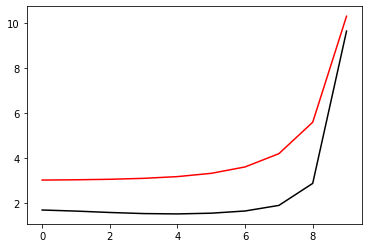

2400 54.00583996617973 -0.7172381178522251 1.0849696684185137
[1.68337105 1.63543148 1.57370739 1.52516351 1.50990956 1.54217846
 1.64003124 1.88862979 2.86710471 9.63781658]


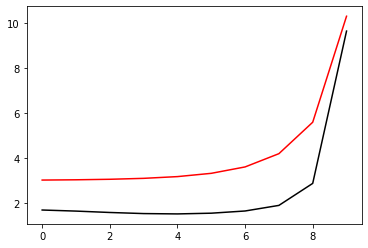

2600 54.00583996617888 -0.7172373100954846 1.084968457363432
[1.68337031 1.6354272  1.57369844 1.52515508 1.50990797 1.54218061
 1.64003352 1.88863415 2.86711176 9.63783233]


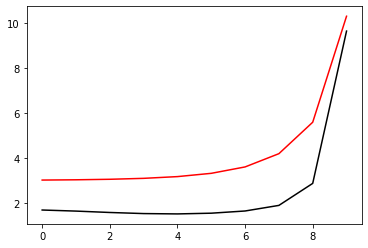

2800 54.00583996618572 -0.7172390453305599 1.0849710783698403
[1.68337051 1.63545117 1.5737264  1.52516011 1.50989584 1.54216417
 1.64001829 1.88862436 2.86711334 9.63780942]


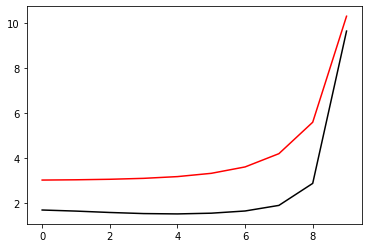

3000 54.00583996617942 -0.7172378288637963 1.0849692350386533
[1.68337069 1.63542981 1.57370428 1.52516148 1.50990975 1.54217772
 1.64002913 1.88863163 2.86711396 9.63781636]


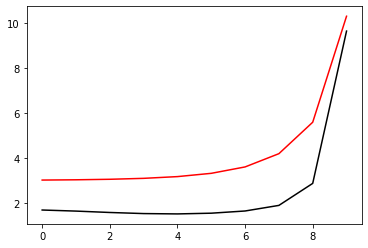

3200 54.005839966782865 -0.7172363940519237 1.084968666338552
[1.6833701  1.6354267  1.57369745 1.52515377 1.50990692 1.54217976
 1.64003242 1.88863627 2.86712143 9.63783425]


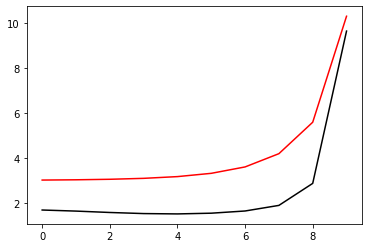

3400 54.00583996618098 -0.7172383905443167 1.0849701088166985
[1.68336894 1.63543679 1.57371766 1.52516538 1.50990394 1.54217098
 1.64002334 1.88862864 2.86711826 9.63780485]


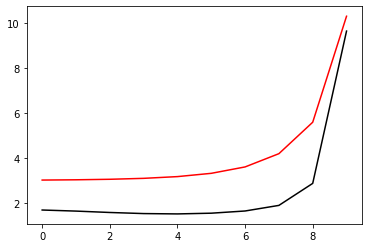

3600 54.00583996617904 -0.7172374542246216 1.0849686741970888
[1.68337003 1.63542803 1.57370096 1.5251581  1.50990848 1.54217757
 1.64002885 1.88863312 2.86712113 9.63782144]


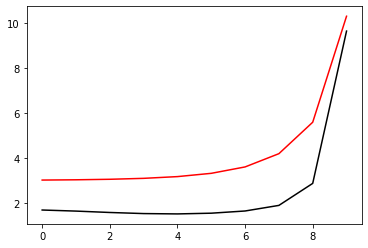

3800 54.005840076144395 -0.7172339423899753 1.0849868808883745
[1.68354656 1.63552861 1.5736878  1.52507109 1.50978614 1.54204764
 1.63991313 1.88855931 2.86712856 9.63792679]


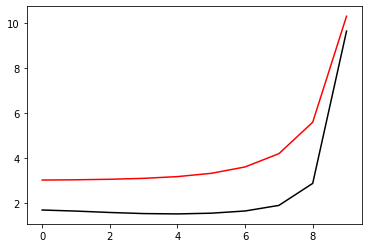

4000 54.005839966179785 -0.717237940129479 1.0849694061827444
[1.68336963 1.63543143 1.57370885 1.52516381 1.5099071  1.54217364
 1.64002525 1.88863072 2.86712271 9.63780909]


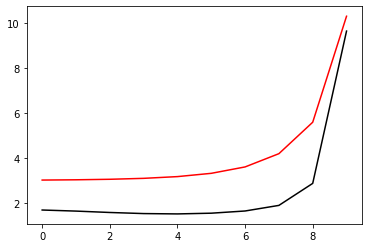

4200 54.00583996617871 -0.7172370869930577 1.0849681248200043
[1.68336928 1.63542643 1.57369804 1.52515472 1.50990662 1.54217734
 1.64002911 1.88863469 2.86712707 9.63782756]


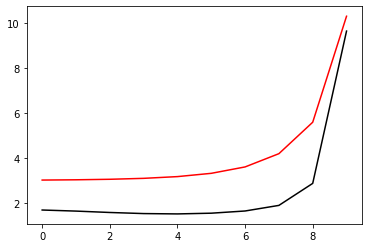

4400 54.00583996618731 -0.7172388009610537 1.0849708508692115
[1.68337129 1.63545478 1.57372546 1.5251558  1.50989112 1.54215881
 1.64001268 1.88862357 2.86712735 9.63781043]


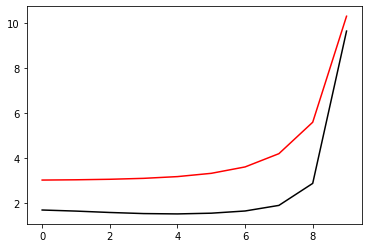

4600 54.00583996617921 -0.7172375426911126 1.0849688080299216
[1.68336963 1.63542877 1.57370321 1.5251601  1.50990777 1.54217518
 1.64002645 1.88863233 2.86712662 9.63781568]


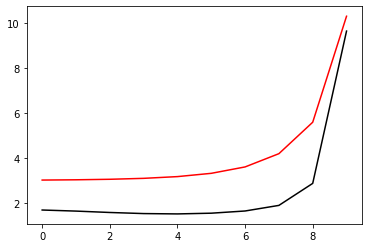

4800 54.00584033404088 -0.7172211332157349 1.084983165398296
[1.68338446 1.63544086 1.57371136 1.52516737 1.5099201  1.54219251
 1.64004526 1.88865219 2.86714829 9.63784986]


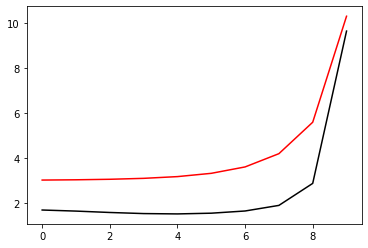

5000 54.00583996618043 -0.7172380859292007 1.0849696245203944
[1.68336826 1.63543457 1.57371494 1.52516423 1.5099032  1.54216972
 1.64002198 1.8886296  2.86712833 9.63780545]


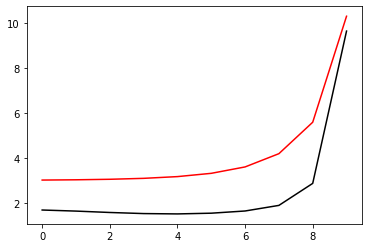

5200 54.00583996617881 -0.717237162930981 1.0849682390620972
[1.68336913 1.63542688 1.5736994  1.52515627 1.50990671 1.5421758
 1.64002729 1.88863398 2.86713081 9.63782303]


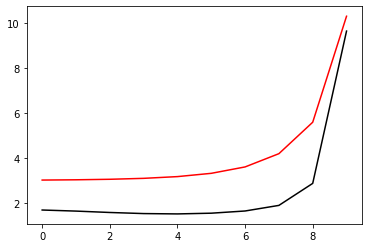

5400 54.00583998827683 -0.7172448594260078 1.0849710166174904
[1.68346341 1.63550586 1.57370087 1.52509966 1.50982407 1.54208951
 1.63995247 1.88858909 2.86714249 9.63789089]


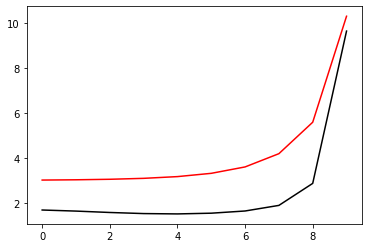

5600 54.00583996617946 -0.7172376367768811 1.0849689510712357
[1.68336897 1.63542989 1.57370637 1.52516189 1.50990604 1.54217248
 1.64002426 1.88863179 2.86713101 9.63781141]


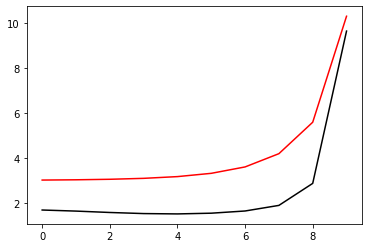

5800 54.00583996617848 -0.717236805805623 1.084967704783575
[1.68336842 1.63542533 1.57369653 1.52515286 1.50990477 1.54217575
 1.64002801 1.88863579 2.86713525 9.63782992]


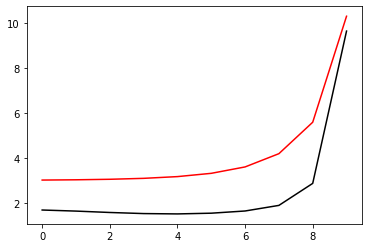

6000 54.00583996618368 -0.7172383740287294 1.084970150866096
[1.68336759 1.63544606 1.57372325 1.52515894 1.50989464 1.54216206
 1.64001574 1.88862712 2.86713438 9.63780783]


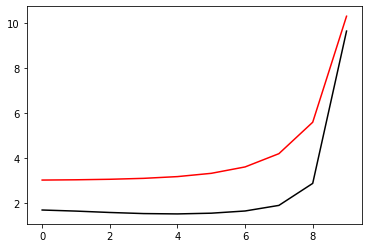

6200 54.00583996617896 -0.7172372636920606 1.084968390892182
[1.68336889 1.63542758 1.57370137 1.52515813 1.5099063  1.54217391
 1.64002556 1.88863351 2.86713401 9.63781831]


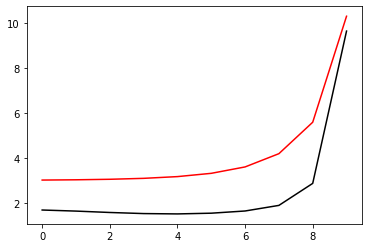

6400 54.00584008603501 -0.7172500629472021 1.0849652257128302
[1.68358585 1.6355181  1.57371265 1.52512637 1.50986276 1.54214278
 1.64002937 1.88870398 2.86731469 9.63816416]


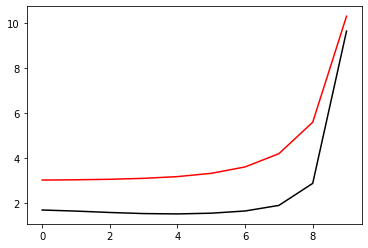

6600 54.00583996617999 -0.7172378120345109 1.0849692222935456
[1.68336792 1.63543257 1.57371205 1.52516311 1.50990286 1.54216914
 1.64002164 1.8886309  2.86713461 9.63780719]


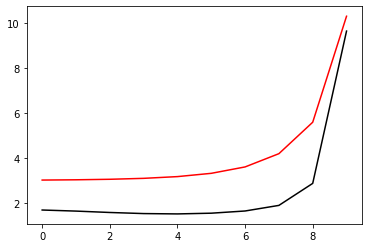

6800 54.00583996617863 -0.7172369252182194 1.0849678838814054
[1.68336845 1.63542593 1.57369801 1.5251546  1.5099052  1.54217459
 1.64002655 1.88863511 2.86713718 9.63782523]


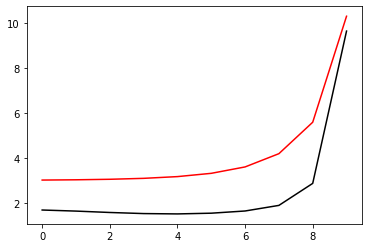

7000 54.00583997097549 -0.7172418440435437 1.08497132110342
[1.68341398 1.63548775 1.57371252 1.52512265 1.50985267 1.54212007
 1.63998053 1.88860949 2.8671497  9.63786328]


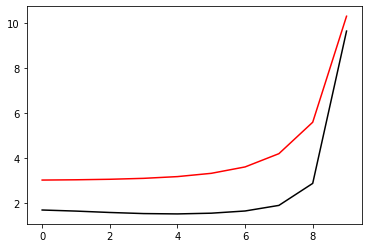

7200 54.005839966179174 -0.7172374014453025 1.0849685990373612
[1.68336848 1.63542874 1.57370443 1.52516025 1.50990515 1.54217166
 1.64002373 1.8886329  2.86713666 9.63781367]


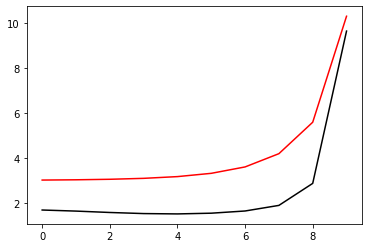

7400 54.00583996617832 -0.7172365901818091 1.084967382714076
[1.68336778 1.63542449 1.57369535 1.52515138 1.5099033  1.54217455
 1.64002735 1.88863688 2.86714096 9.63783202]


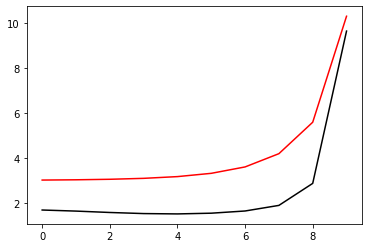

7600 54.00583996618574 -0.7172381964282628 1.0849697048703573
[1.68336653 1.63544172 1.57372137 1.52516022 1.50989584 1.5421628
 1.64001644 1.88862856 2.86713856 9.63780622]


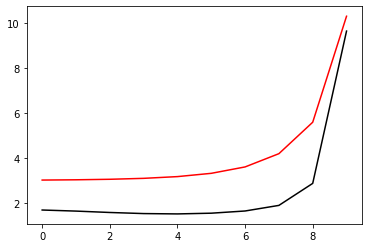

7800 54.005839966178826 -0.7172371002988939 1.0849681466847418
[1.68336844 1.63542689 1.57370035 1.52515703 1.50990542 1.54217303
 1.64002489 1.88863426 2.86713869 9.63781954]


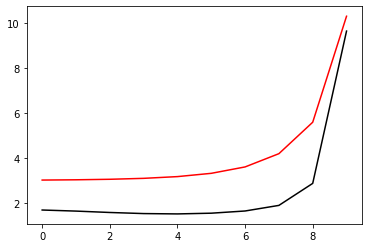

8000 54.00584522724108 -0.7173044175216042 1.0849196888813122
[1.68351338 1.63543666 1.57362557 1.52503685 1.50977355 1.54205672
 1.63994996 1.88863663 2.86726785 9.63813673]


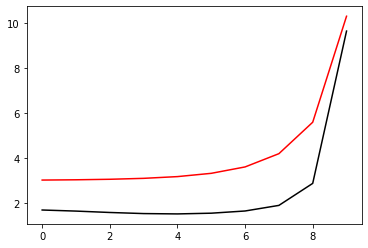

8200 54.00583996618001 -0.7172377402425089 1.0849691187258372
[1.68336755 1.63543244 1.57371211 1.52516287 1.50990206 1.54216805
 1.64002074 1.88863122 2.86713841 9.63780664]


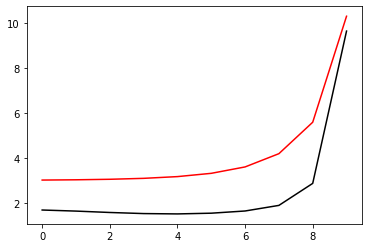

8400 54.005839966178556 -0.717236854852091 1.0849677789272782
[1.68336816 1.63542568 1.5736978  1.52515433 1.50990469 1.54217377
 1.64002579 1.88863539 2.86714055 9.63782481]


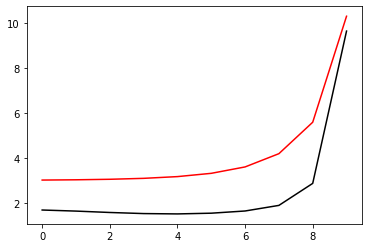

8600 54.00583996669759 -0.7172412296481546 1.0849760375781548
[1.68350163 1.63552292 1.57369709 1.52508465 1.5098028  1.54206598
 1.63993125 1.88857711 2.86715125 9.63791024]


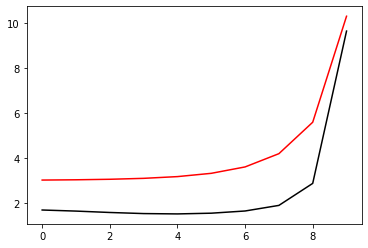

8800 54.00583996617949 -0.7172375352235723 1.0849688008559097
[1.68336816 1.63542988 1.5737072  1.52516199 1.50990433 1.54216985
 1.64002202 1.88863219 2.86713899 9.63780925]


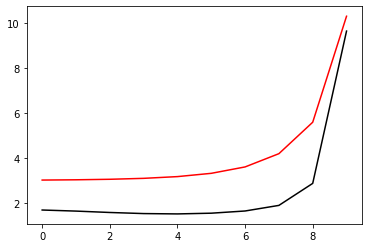

9000 54.00583996617839 -0.7172367002235733 1.0849675474567104
[1.68336791 1.63542498 1.57369641 1.52515274 1.50990401 1.54217402
 1.6400262  1.88863608 2.86714206 9.63782812]


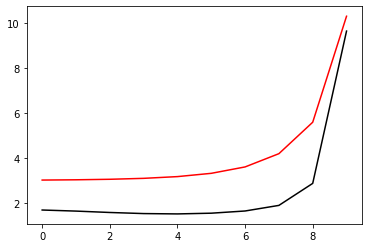

9200 54.00583996896133 -0.7172385505802499 1.084974113447323
[1.6834074  1.63548954 1.57372038 1.52512965 1.50985871 1.54212581
 1.63998561 1.88861363 2.8671538  9.63785452]


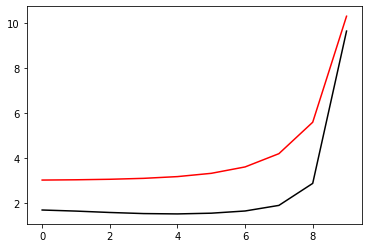

9400 54.00583996617928 -0.7172374213525666 1.084968629417934
[1.68336832 1.63542894 1.5737051  1.52516089 1.50990497 1.54217068
 1.64002265 1.8886327  2.86713948 9.63781112]


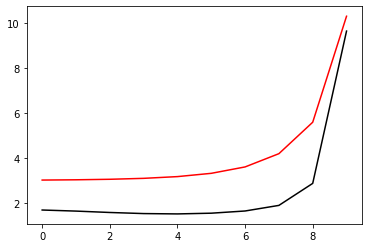

9600 54.005839966178335 -0.7172366072021754 1.0849674082955085
[1.68336773 1.63542458 1.57369566 1.52515181 1.50990346 1.54217408
 1.6400265  1.88863656 2.86714303 9.63783003]


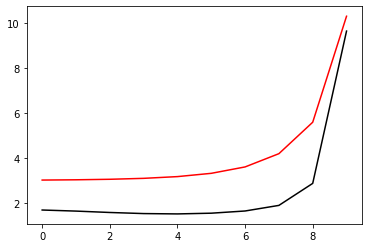

9800 54.005839966291454 -0.7172388133062484 1.0849715514524894
[1.68338229 1.63547234 1.57372631 1.52514368 1.50987442 1.54214124
 1.63999781 1.88861818 2.86714494 9.63782336]


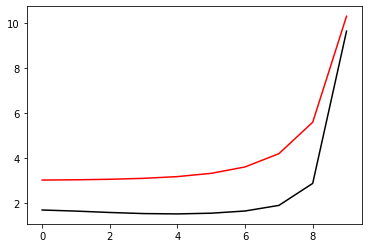

10000 54.005839966179195 -0.717237367530772 1.0849685482790834
[1.68336835 1.63542852 1.57370421 1.52516042 1.50990527 1.54217093
 1.64002275 1.88863288 2.86713997 9.63781204]


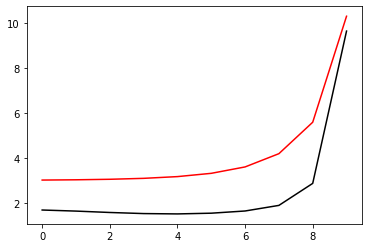

10200 54.005839966178286 -0.7172365639768307 1.0849673436426202
[1.68336763 1.6354244  1.57369534 1.52515142 1.50990323 1.54217405
 1.6400265  1.88863672 2.86714369 9.63783086]


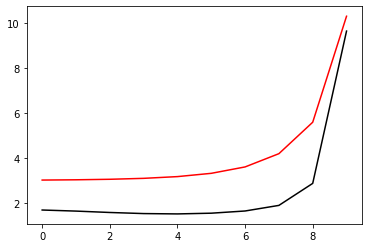

10400 54.00583996625046 -0.717238959090753 1.0849706426140746
[1.68337624 1.63546501 1.5737256  1.52514702 1.50987906 1.54214618
 1.64000207 1.88862052 2.86714387 9.63781782]


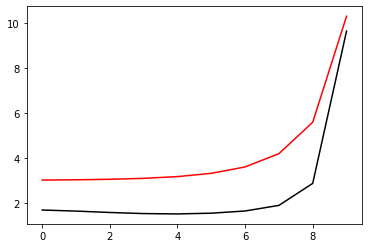

10600 54.005839966179074 -0.717237267413915 1.084968398145703
[1.68336824 1.63542801 1.57370316 1.52515942 1.50990497 1.54217111
 1.64002311 1.88863342 2.86714088 9.63781396]


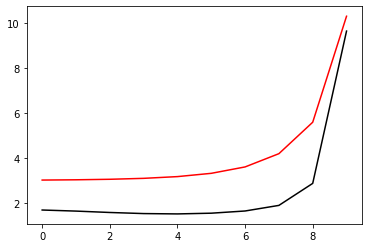

10800 54.005839966178215 -0.7172364734828375 1.0849672083799784
[1.68336741 1.63542404 1.57369474 1.52515064 1.50990257 1.54217382
 1.64002668 1.8886373  2.86714495 9.6378325 ]


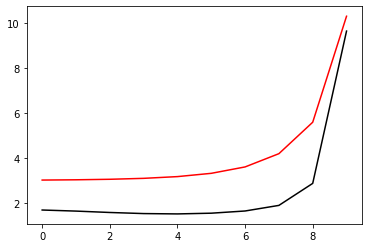

11000 54.00583996620374 -0.7172382364591436 1.0849702059927462
[1.68336798 1.63545076 1.57372523 1.52515584 1.50988936 1.54215647
 1.64001128 1.88862665 2.86714409 9.63780975]


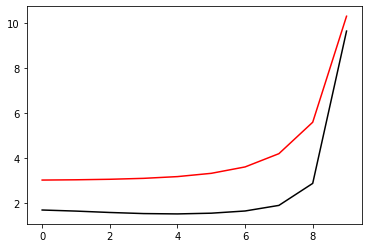

11200 54.00583996617889 -0.7172371342775904 1.084968198408061
[1.68336815 1.63542725 1.57370157 1.52515806 1.50990487 1.54217149
 1.64002352 1.88863408 2.86714199 9.63781658]


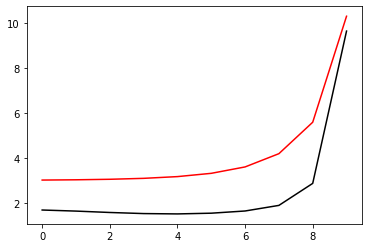

11400 54.00583996617812 -0.7172363559469156 1.0849670325290584
[1.68336713 1.63542356 1.57369394 1.52514962 1.50990176 1.54217358
 1.64002687 1.888638   2.86714654 9.63783473]


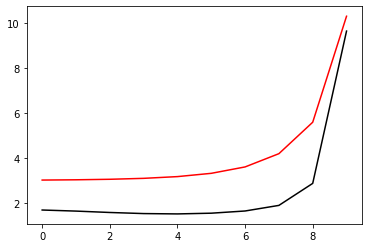

11600 54.00583996618283 -0.717238078902839 1.0849695907328634
[1.68336609 1.63544091 1.57372147 1.52516054 1.50989519 1.54216172
 1.64001563 1.88862905 2.86714292 9.63780493]


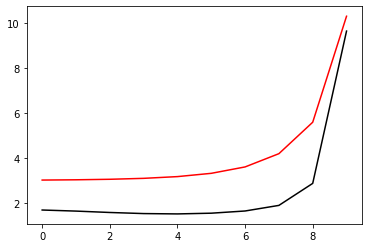

11800 54.005839966178776 -0.7172370238983328 1.0849680327711937
[1.68336811 1.63542663 1.57370018 1.5251568  1.50990483 1.54217202
 1.64002397 1.88863457 2.86714266 9.63781887]


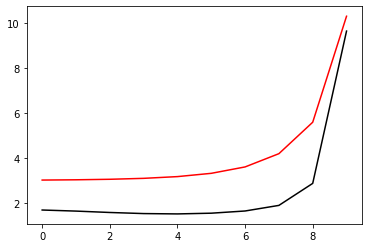

12000 54.00583996686247 -0.7172355851194417 1.0849675596098793
[1.68336757 1.63542383 1.57369391 1.52514939 1.50990175 1.54217414
 1.64002779 1.88863922 2.86714836 9.63783738]


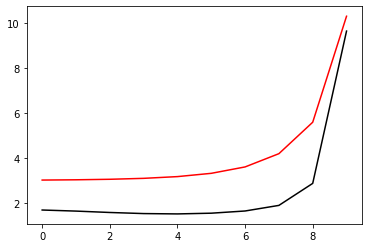

12200 54.0058399661805 -0.717237754747946 1.0849691514571522
[1.6833665  1.63543465 1.57371554 1.525162   1.5098989  1.54216511
 1.64001857 1.88863104 2.86714309 9.63780616]


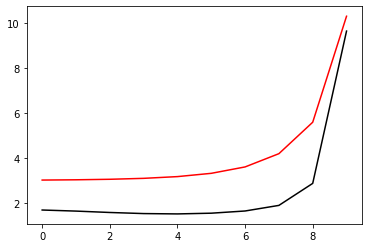

12400 54.00583996617858 -0.7172368324736004 1.0849677460556266
[1.68336785 1.63542571 1.57369831 1.52515481 1.50990414 1.54217237
 1.64002461 1.88863554 2.86714421 9.637823  ]


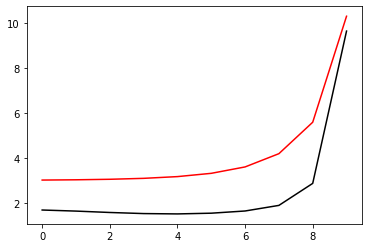

12600 54.00584056337097 -0.7172269887714406 1.0850045746640633
[1.68368119 1.63554985 1.57367044 1.52503785 1.509748   1.54201749
 1.63990852 1.88860674 2.86726929 9.63816577]


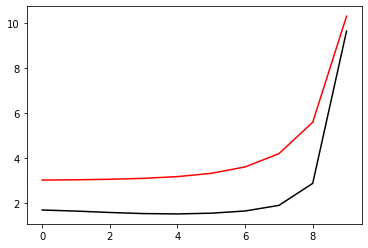

12800 54.00583996617961 -0.7172374876423638 1.0849687328012165
[1.68336732 1.63543056 1.57370905 1.52516162 1.50990196 1.54216776
 1.64002071 1.88863255 2.86714333 9.63780897]


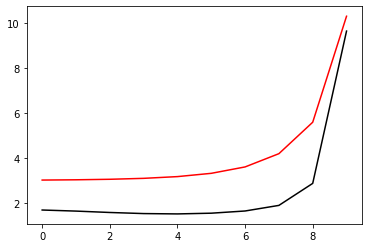

13000 54.00583996617838 -0.7172366343712573 1.084967449437294
[1.68336756 1.63542479 1.57369645 1.5251527  1.5099033  1.54217279
 1.64002533 1.88863655 2.86714575 9.63782735]


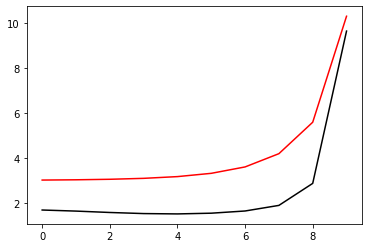

13200 54.0058399722442 -0.7172420212383639 1.0849710066843803
[1.68341964 1.63549155 1.57371177 1.52511894 1.50984746 1.54211453
 1.63997609 1.88860897 2.86715859 9.63786854]


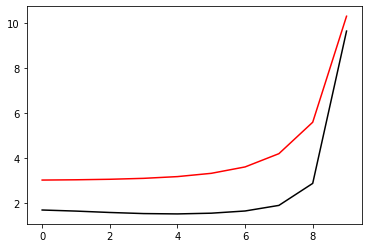

13400 54.00583996617911 -0.7172372491479703 1.0849683719457062
[1.68336783 1.63542827 1.57370412 1.5251596  1.50990375 1.54216985
 1.64002233 1.88863369 2.86714352 9.63781308]


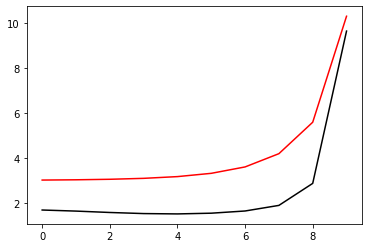

13600 54.00583996617819 -0.7172364422886685 1.0849671619855936
[1.68336724 1.63542395 1.57369478 1.52515067 1.50990224 1.5421731
 1.64002612 1.88863757 2.86714714 9.63783172]


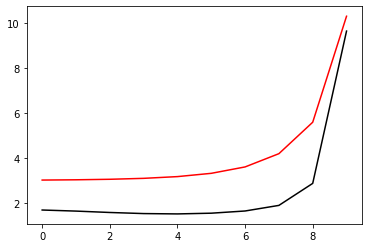

13800 54.005839966204725 -0.7172382737448928 1.084969684662288
[1.68336686 1.63544728 1.57372282 1.5251559  1.50989053 1.54215775
 1.64001241 1.88862781 2.86714567 9.63780959]


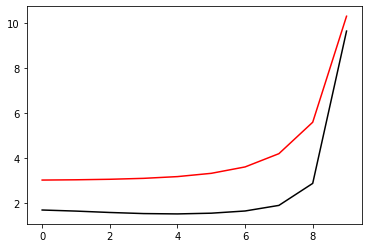

14000 54.00583996617876 -0.7172369966308751 1.0849679924779112
[1.68336788 1.63542664 1.57370045 1.52515684 1.50990418 1.5421713
 1.6400236  1.88863483 2.86714435 9.63781857]


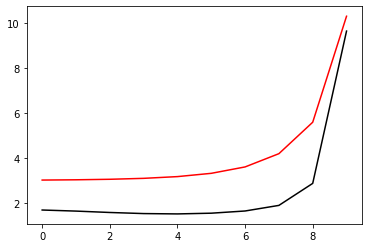

14200 54.0058399692191 -0.7172376447307246 1.0849654189303137
[1.68336538 1.63542165 1.57369177 1.52514721 1.50989939 1.5421716
 1.6400254  1.88863739 2.86714777 9.63783509]


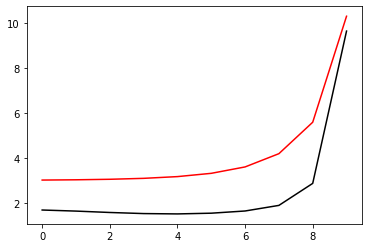

14400 54.00583996618053 -0.717237759351191 1.0849691649033097
[1.68336658 1.63543449 1.57371537 1.52516222 1.5098992  1.54216519
 1.64001849 1.88863106 2.8671436  9.63780503]


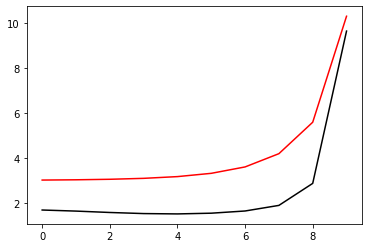

14600 54.00583996617856 -0.7172368387036997 1.0849677553728623
[1.68336787 1.63542573 1.57369833 1.52515485 1.50990422 1.54217239
 1.6400245  1.88863547 2.86714458 9.63782241]


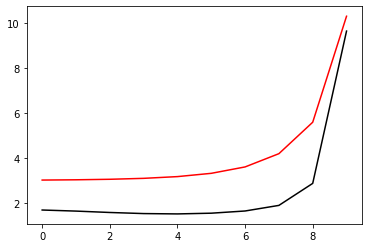

14800 54.005840261356205 -0.7172610158883564 1.0849710453221046
[1.68365561 1.63551983 1.57363702 1.52500236 1.50971144 1.54198073
 1.63987242 1.88857253 2.86723882 9.6381394 ]


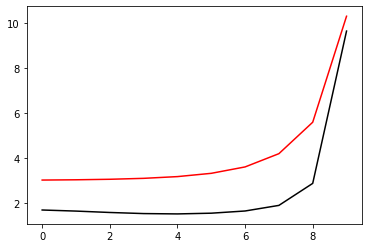

15000 54.005839966179714 -0.717237543218588 1.0849688176072492
[1.68336739 1.63543089 1.57370964 1.52516208 1.50990211 1.54216772
 1.64002049 1.88863221 2.86714309 9.63780757]


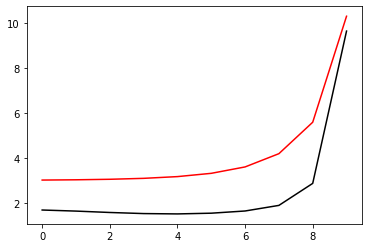

In [59]:
optimizer=tf.optimizers.Adam(learning_rate=0.0005)
for i in range (1, 15001):
    run()
    if i%200==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

200 54.00583996622836 -0.7172390538383082 1.0849715404148281
[1.68341345 1.63546311 1.57370365 1.52513461 1.50986841 1.54213112
 1.63998799 1.88861389 2.86715255 9.63784638]


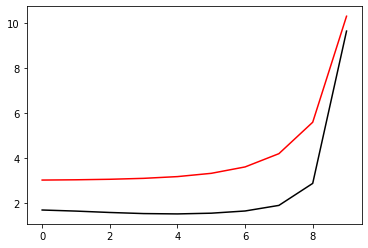

400 54.005839966179856 -0.717237540169501 1.0849688341532744
[1.68336877 1.63543373 1.57370875 1.52515855 1.509901   1.54216604
 1.64001778 1.88863084 2.86714584 9.63781147]


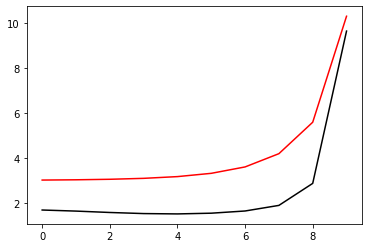

600 54.005839966178755 -0.7172369599327569 1.0849679382180908
[1.68336773 1.63542664 1.57370035 1.52515627 1.50990423 1.54217148
 1.64002272 1.88863415 2.8671461  9.63781939]


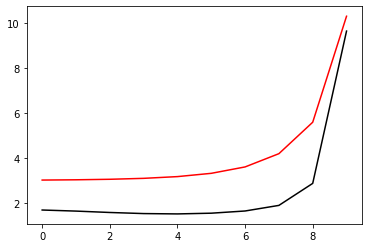

800 54.005839966178186 -0.717236426414829 1.084967138339691
[1.6833671  1.6354239  1.57369485 1.52515076 1.50990225 1.54217297
 1.64002535 1.88863692 2.86714887 9.63783167]


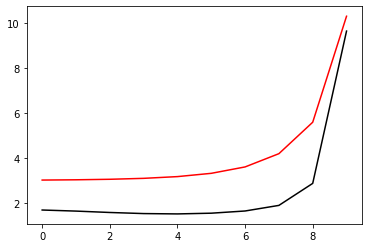

1000 54.00583996617778 -0.7172358796388414 1.0849663207541165
[1.68336589 1.63542166 1.57369091 1.5251457  1.50989836 1.54217231
 1.64002731 1.88864037 2.86715407 9.63784349]


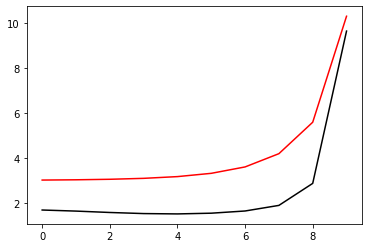

1200 54.00583996617739 -0.7172353208042487 1.0849654857502056
[1.68336439 1.6354195  1.57368756 1.52514119 1.50989388 1.54217002
 1.64002845 1.88864456 2.86716184 9.63785362]


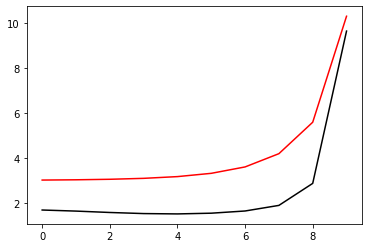

1400 54.00583996628347 -0.7172371458827704 1.0849690055554462
[1.68337316 1.63545717 1.57371629 1.52513879 1.50987226 1.54214297
 1.64000498 1.88863083 2.86716561 9.63783848]


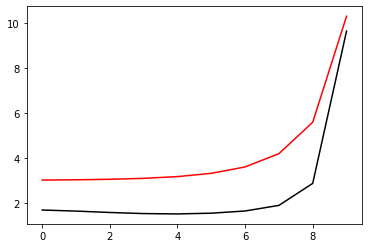

1600 54.005839966178044 -0.7172360822861351 1.0849666277885195
[1.68336485 1.63542345 1.57369652 1.52515074 1.5098959  1.54216457
 1.64002263 1.88864228 2.86716415 9.6378302 ]


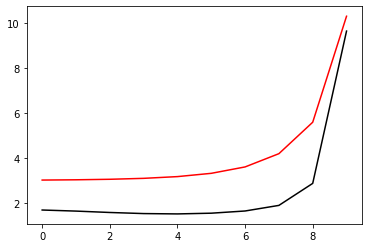

1800 54.005839966177454 -0.7172353945453384 1.084965595767315
[1.68336416 1.63541996 1.57368912 1.52514322 1.50989413 1.54216677
 1.64002501 1.88864576 2.86716929 9.63784462]


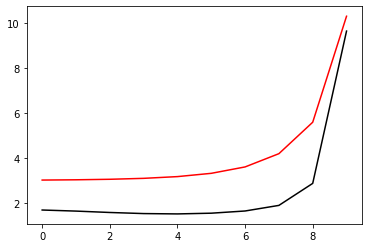

2000 54.005839966180964 -0.7172369587498777 1.0849679167593504
[1.68336341 1.63543436 1.57371337 1.52515422 1.5098896  1.54215703
 1.64001499 1.88863756 2.86716602 9.63781535]


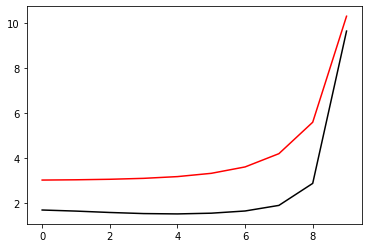

2200 54.00583996617796 -0.7172360308268005 1.0849665494646332
[1.6833652  1.63542281 1.57369475 1.52514989 1.50989755 1.54216584
 1.6400218  1.88864207 2.86716651 9.63782863]


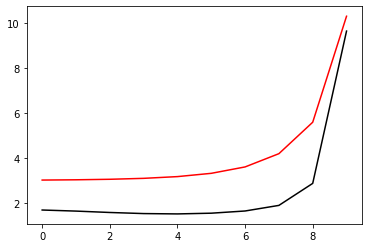

2400 54.00584091668116 -0.717270545280406 1.0849557614792138
[1.68364541 1.63551352 1.57363935 1.5250097  1.50972119 1.54199196
 1.63988657 1.88859333 2.86727011 9.63814931]


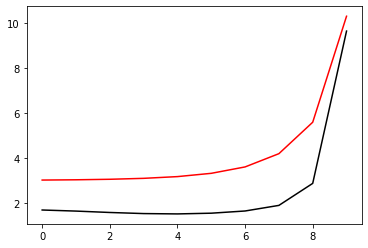

2600 54.0058399661789 -0.7172366802145499 1.0849675290563092
[1.68336487 1.6354275  1.57370485 1.52515625 1.50989607 1.54216227
 1.64001805 1.88863842 2.86716511 9.63781513]


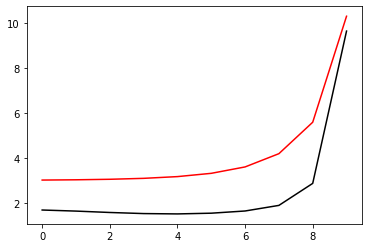

2800 54.00583996617781 -0.7172358781236481 1.0849663202358397
[1.68336517 1.63542195 1.57369272 1.52514787 1.50989763 1.54216731
 1.64002251 1.88864192 2.86716709 9.63783266]


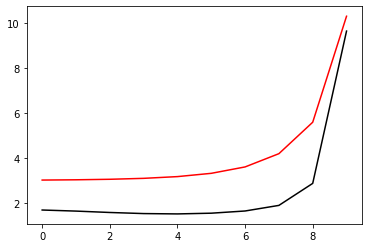

3000 54.00583996735602 -0.7172394617918486 1.0849698752473524
[1.68338937 1.63547439 1.57371628 1.52513039 1.50986048 1.54212736
 1.63998773 1.88862008 2.86717071 9.63784107]


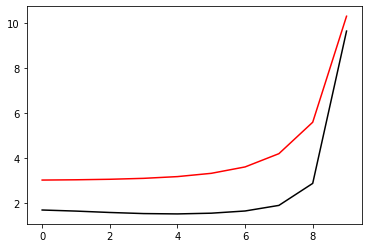

3200 54.00583996617858 -0.7172365973347472 1.0849673983333685
[1.68336589 1.63542567 1.57370052 1.52515551 1.50989947 1.54216536
 1.64001959 1.88863795 2.86716269 9.6378169 ]


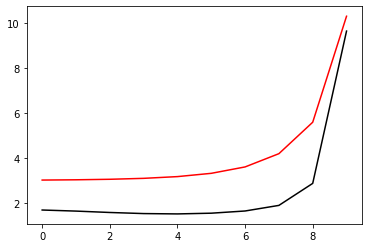

3400 54.005839966177774 -0.7172358317045059 1.0849662502917259
[1.68336528 1.63542165 1.57369182 1.52514689 1.50989781 1.54216862
 1.64002336 1.88864143 2.86716563 9.63783533]


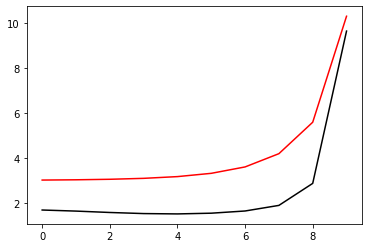

3600 54.005839966189036 -0.7172376334371728 1.0849688513675126
[1.68336494 1.63544419 1.5737201  1.52515334 1.50988726 1.5421542
 1.64001031 1.88863165 2.86716316 9.63781186]


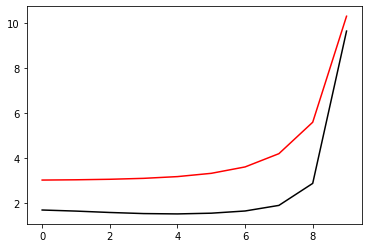

3800 54.005839966178364 -0.7172364639438472 1.0849671971186836
[1.68336615 1.63542463 1.57369791 1.52515363 1.50990035 1.54216726
 1.64002098 1.88863802 2.86716113 9.63782135]


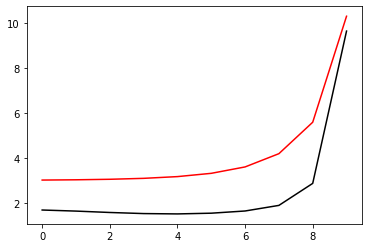

4000 54.00583997424896 -0.717233411263932 1.084968397981733
[1.68336741 1.63542346 1.57369311 1.52514791 1.50989946 1.54217147
 1.6400266  1.88864405 2.86716747 9.63784142]


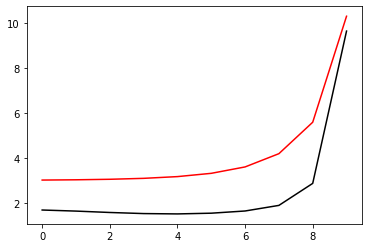

4200 54.00583996617989 -0.7172371990142823 1.0849683081000725
[1.68336497 1.63543195 1.57371193 1.52515878 1.50989577 1.54216183
 1.64001649 1.88863429 2.86715942 9.63780911]


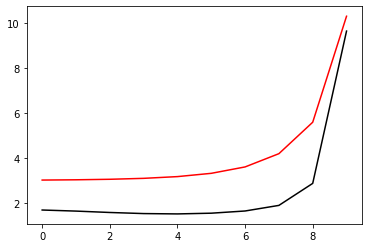

4400 54.00583996617816 -0.7172363086446135 1.084966963789212
[1.6833662  1.63542371 1.57369566 1.52515148 1.50990046 1.54216879
 1.64002235 1.8886385  2.86716003 9.63782625]


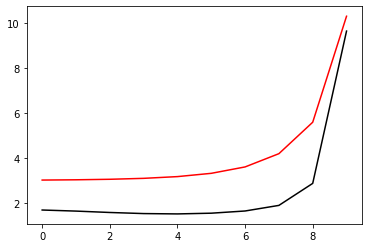

4600 54.00584001230548 -0.7172359163489948 1.0849813520291884
[1.68357749 1.63553897 1.57368539 1.52506118 1.50977124 1.54203067
 1.63989935 1.88856058 2.8671689  9.63794764]


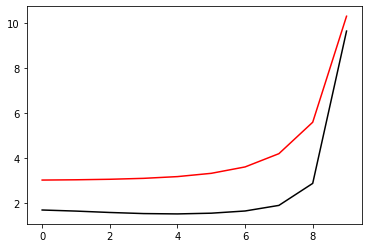

4800 54.00583996617901 -0.7172369484714153 1.0849679249918227
[1.68336614 1.63542784 1.57370476 1.52515825 1.50989969 1.54216542
 1.64001924 1.88863546 2.86715737 9.63781288]


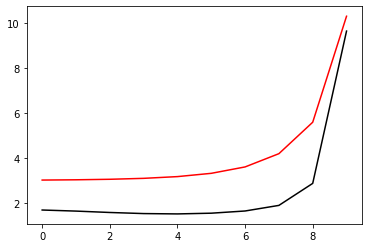

5000 54.00583996617798 -0.7172361378776898 1.084966707844998
[1.68336606 1.63542287 1.57369378 1.52514936 1.50989989 1.5421698
 1.64002356 1.88863924 2.86715965 9.63783136]


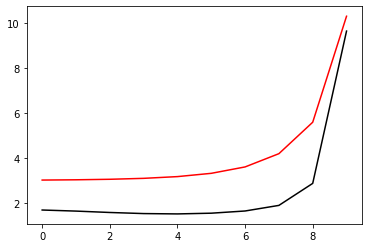

5200 54.00583996661302 -0.7172387979185751 1.0849695822356644
[1.68337683 1.63546417 1.57372097 1.52514182 1.50987393 1.54214087
 1.63999816 1.88862245 2.86715982 9.63782398]


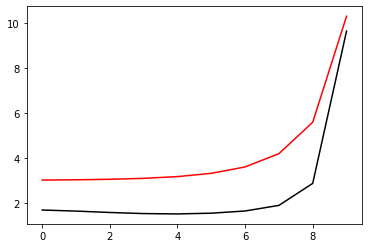

5400 54.005839966178655 -0.7172367432608404 1.0849676153275807
[1.6833666  1.63542599 1.57370048 1.52515609 1.50990134 1.54216761
 1.64002091 1.88863628 2.8671563  9.63781776]


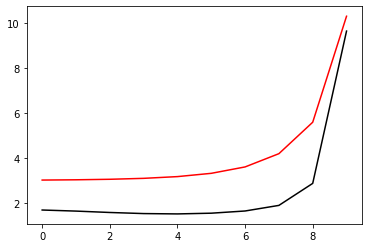

5600 54.00583996617786 -0.7172359753476341 1.084966464727604
[1.68336581 1.63542215 1.57369232 1.52514756 1.50989898 1.54217029
 1.64002452 1.88864007 2.86715988 9.63783592]


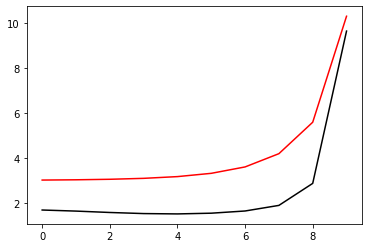

5800 54.00583996618302 -0.717237630393369 1.0849688946899052
[1.68336482 1.63543843 1.57371837 1.52515799 1.50989298 1.54215949
 1.64001422 1.88863154 2.8671556  9.63780748]


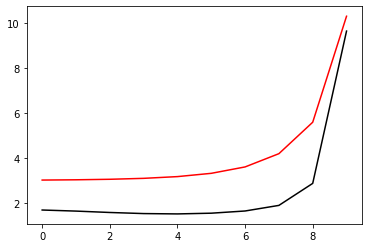

6000 54.005839966178456 -0.7172365996992912 1.0849673991923856
[1.68336681 1.63542499 1.57369794 1.52515403 1.50990193 1.54216932
 1.64002229 1.88863684 2.86715508 9.63782186]


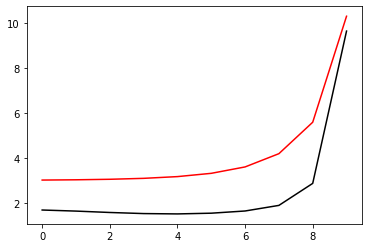

6200 54.00584431467511 -0.7172981781339559 1.084923300039295
[1.6835207  1.63544505 1.57363424 1.52504517 1.50978116 1.54206362
 1.639957   1.88864703 2.86728891 9.63814127]


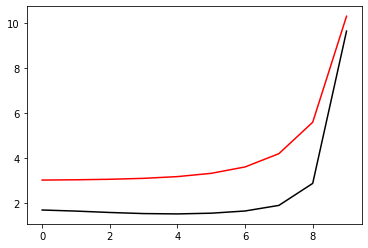

6400 54.0058399661796 -0.717237261126409 1.0849683988572145
[1.68336601 1.63543057 1.57370972 1.52515998 1.50989875 1.54216462
 1.64001844 1.8886337  2.86715348 9.63780945]


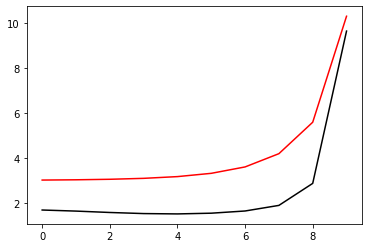

6600 54.00583996617821 -0.7172363993296141 1.0849670987636244
[1.68336667 1.63542396 1.57369564 1.5251516  1.50990144 1.54217041
 1.64002356 1.88863777 2.86715498 9.63782743]


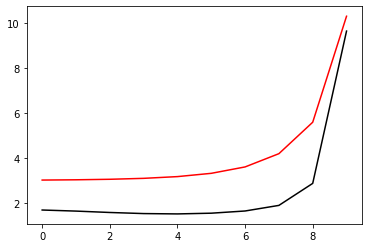

6800 54.00583996656101 -0.7172411118940065 1.0849755323184005
[1.68348184 1.63551434 1.57369498 1.52508473 1.50980413 1.54206815
 1.63993446 1.8885834  2.86716593 9.6379072 ]


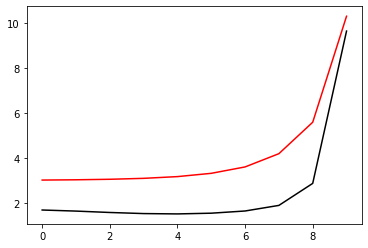

7000 54.00583996617918 -0.7172371484328666 1.0849682232782634
[1.68336688 1.63542839 1.57370536 1.52515977 1.50990165 1.54216685
 1.6400199  1.88863419 2.86715183 9.63781097]


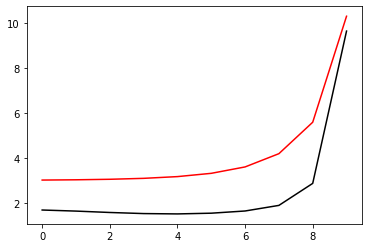

7200 54.00583996617816 -0.7172363333340024 1.0849669996793097
[1.68336668 1.6354236  1.57369472 1.52515061 1.50990141 1.54217119
 1.64002419 1.88863796 2.86715422 9.63782982]


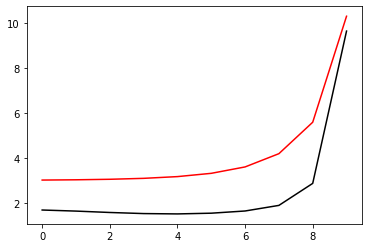

7400 54.005839968761734 -0.7172384360501806 1.08497385547111
[1.68341261 1.63549141 1.57371688 1.52512395 1.509852   1.54211895
 1.63998039 1.88861404 2.86716743 9.63786372]


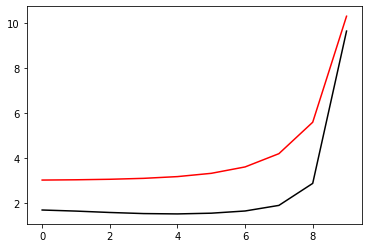

7600 54.00583996617901 -0.7172370842615086 1.0849681263381488
[1.68336715 1.63542771 1.57370368 1.52515895 1.50990242 1.54216797
 1.6400208  1.88863446 2.86715069 9.63781277]


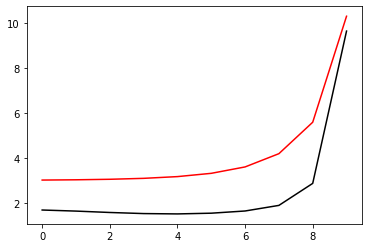

7800 54.00583996617808 -0.717236285829872 1.0849669284911494
[1.68336665 1.63542338 1.57369419 1.52514995 1.50990115 1.54217157
 1.64002476 1.88863823 2.86715364 9.63783156]


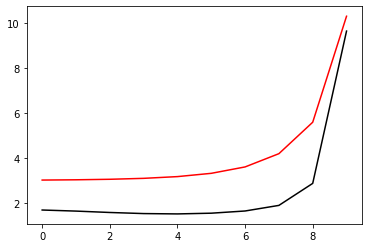

8000 54.00583996636003 -0.7172388114444508 1.0849701284104483
[1.68337576 1.63546411 1.57372277 1.52514368 1.50987562 1.54214267
 1.63999943 1.88862142 2.86715358 9.63782109]


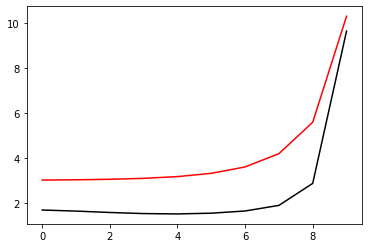

8200 54.0058399661788 -0.7172369517798401 1.0849679268645114
[1.68336723 1.6354268  1.5737016  1.52515747 1.50990275 1.54216891
 1.64002168 1.88863508 2.86715045 9.63781612]


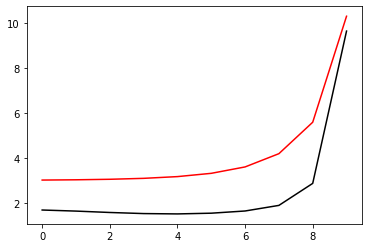

8400 54.005839966178 -0.7172361738090105 1.0849667609051405
[1.68336644 1.6354229  1.5736933  1.52514882 1.50990042 1.54217164
 1.6400253  1.88863891 2.86715416 9.63783444]


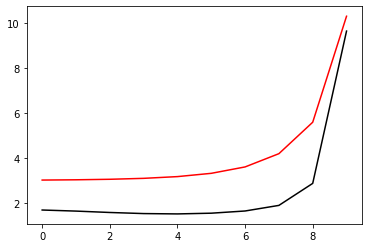

8600 54.005839966190514 -0.7172379384780193 1.0849692726934013
[1.68336554 1.63544352 1.57372144 1.52515666 1.50989098 1.54215792
 1.64001287 1.88862975 2.86715193 9.63780924]


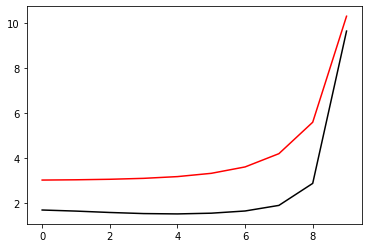

8800 54.005839966178605 -0.7172367811547283 1.084967670564658
[1.68336722 1.63542578 1.57369928 1.52515548 1.50990283 1.5421699
 1.64002265 1.88863591 2.86715071 9.63782016]


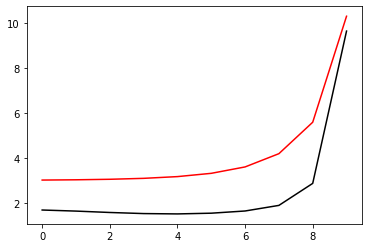

9000 54.005839966403656 -0.7172356389437786 1.0849669257928911
[1.6833665  1.63542268 1.57369258 1.52514778 1.50989977 1.54217197
 1.64002626 1.88864022 2.86715569 9.63783824]


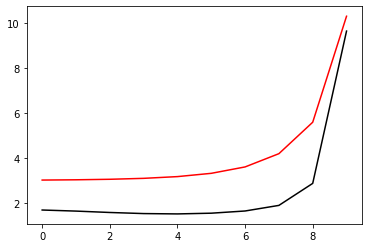

9200 54.00583996618059 -0.7172376418892926 1.0849689589847613
[1.68336581 1.63543463 1.57371572 1.52516126 1.50989729 1.54216312
 1.64001699 1.88863169 2.86714959 9.63780547]


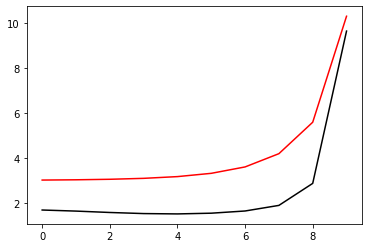

9400 54.005839966178485 -0.7172367038013747 1.0849675541381112
[1.68336734 1.63542526 1.57369792 1.52515428 1.50990314 1.54217092
 1.64002337 1.88863618 2.86715003 9.63782242]


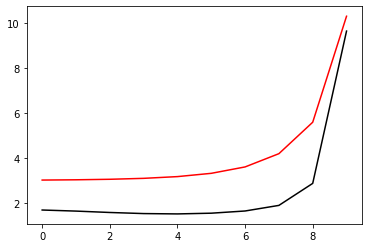

9600 54.005845691435695 -0.7171860844359433 1.0850429637890888
[1.68371092 1.6355864  1.5737417  1.52513339 1.50986117 1.54214507
 1.64004956 1.8887622  2.86744138 9.63835566]


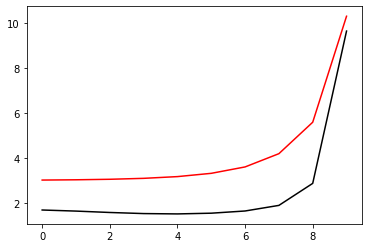

9800 54.00583996617983 -0.7172374818013736 1.0849687321016332
[1.68336663 1.63543147 1.57371106 1.52516157 1.5099001  1.5421657
 1.64001901 1.88863254 2.8671481  9.63780694]


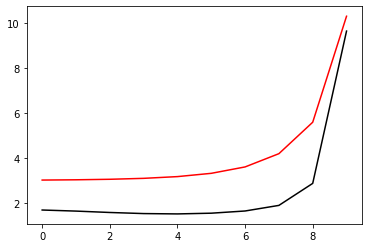

10000 54.00583996617838 -0.7172366086110364 1.0849674113626677
[1.68336731 1.63542477 1.57369675 1.52515301 1.50990293 1.54217166
 1.64002418 1.88863659 2.86714957 9.6378253 ]


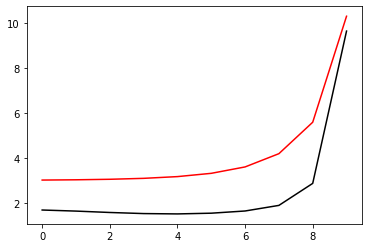

10200 54.005839984572546 -0.7172427789058929 1.0849881063754137
[1.68366762 1.63554584 1.57364712 1.52499975 1.50969963 1.54196102
 1.63984449 1.88853566 2.86719325 9.63806615]


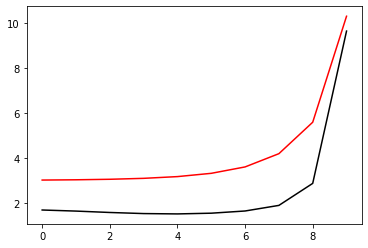

10400 54.00583996617995 -0.7172376156804272 1.0849689271048195
[1.6833671  1.63543155 1.5737114  1.52516343 1.50990163 1.54216594
 1.64001872 1.88863179 2.86714644 9.6378038 ]


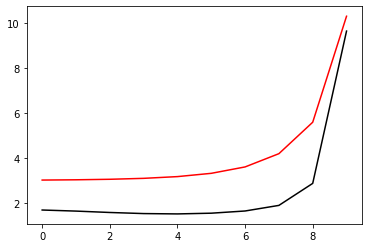

10600 54.005839966178485 -0.7172367453427617 1.0849676156545998
[1.68336767 1.63542529 1.57369757 1.52515414 1.50990405 1.54217215
 1.64002389 1.88863564 2.86714757 9.63782292]


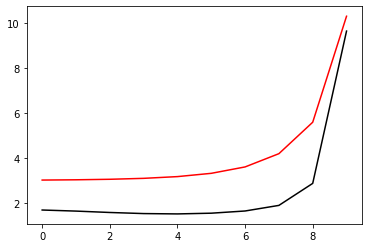

10800 54.00584678670194 -0.7173127964755395 1.0849119623318373
[1.68350856 1.63542696 1.57361258 1.52502194 1.50975825 1.54204252
 1.63993812 1.88863051 2.86727443 9.63814475]


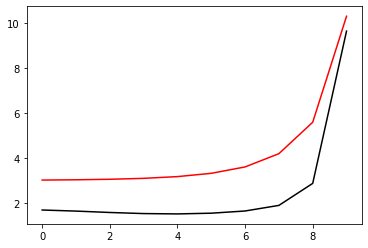

11000 54.00583996617993 -0.7172375408794432 1.0849688124754875
[1.68336666 1.63543194 1.57371178 1.52516174 1.50990002 1.54216587
 1.64001919 1.88863211 2.86714645 9.63780719]


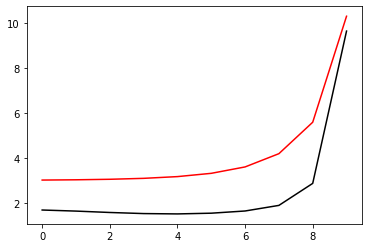

11200 54.005839966178435 -0.717236658842369 1.0849674864051202
[1.68336745 1.63542497 1.57369705 1.52515336 1.50990323 1.54217195
 1.64002443 1.88863628 2.86714797 9.63782516]


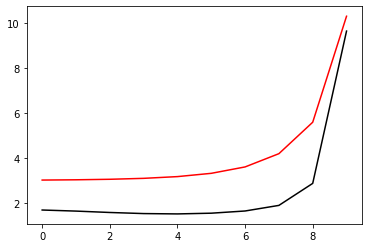

11400 54.005840010602114 -0.7172375983609088 1.0849849113322845
[1.68359459 1.63553506 1.57366985 1.5250401  1.50974787 1.5420078
 1.6398792  1.88854448 2.86715745 9.63796738]


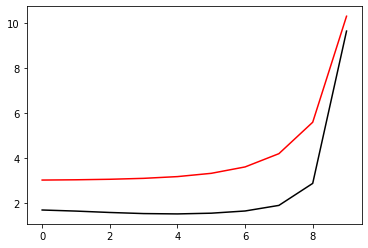

11600 54.00583996617944 -0.7172373670584807 1.0849685522585708
[1.68336723 1.63542967 1.57370753 1.52516105 1.50990205 1.5421676
 1.64002054 1.88863307 2.86714616 9.63780965]


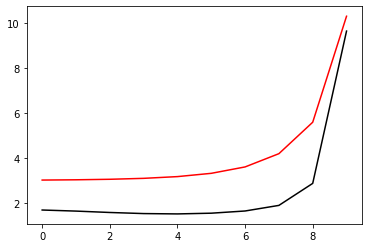

11800 54.0058399661783 -0.7172365304182824 1.0849672941000894
[1.68336727 1.63542438 1.57369582 1.52515195 1.50990267 1.5421723
 1.64002497 1.88863698 2.8671486  9.63782827]


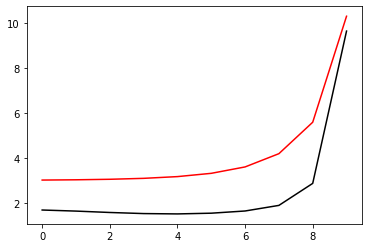

12000 54.005839970291696 -0.7172415037519314 1.0849712741346182
[1.68341008 1.63548636 1.57371165 1.5251205  1.5098497  1.54211698
 1.63997813 1.88861013 2.86715899 9.63786171]


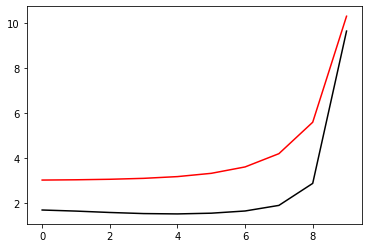

12200 54.005839966179046 -0.7172371716165756 1.0849682561032865
[1.6833676  1.63542795 1.57370366 1.52515913 1.5099033  1.54216937
 1.64002198 1.88863403 2.86714594 9.63781351]


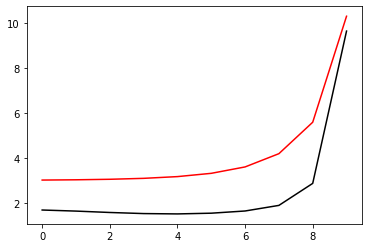

12400 54.005839966178144 -0.7172363699379362 1.0849670539452072
[1.683367   1.63542368 1.57369443 1.52515023 1.50990174 1.54217259
 1.64002576 1.8886379  2.86714946 9.63783214]


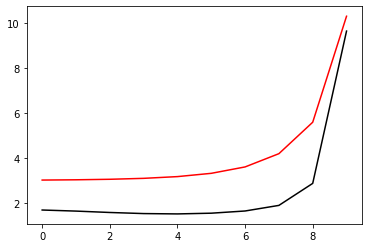

12600 54.005839966210374 -0.7172382815896603 1.084969668835434
[1.68336703 1.63544868 1.57372334 1.52515499 1.50988902 1.54215613
 1.64001109 1.88862757 2.8671481  9.63781022]


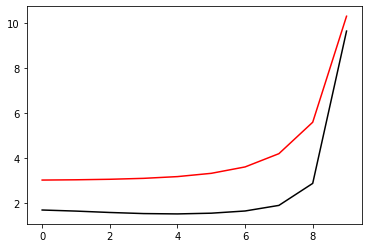

12800 54.00583996617875 -0.7172369658288357 1.0849679466709126
[1.68336769 1.63542657 1.57370053 1.52515685 1.50990383 1.54217066
 1.64002305 1.88863496 2.86714637 9.63781812]


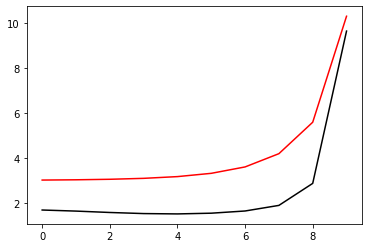

13000 54.005839966179714 -0.7172361621175843 1.0849668272919881
[1.68336667 1.63542298 1.57369314 1.52514858 1.50990064 1.54217262
 1.6400264  1.88863892 2.86715094 9.63783618]


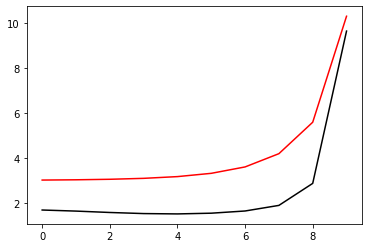

13200 54.00583996618091 -0.7172377207590175 1.0849691271428359
[1.6833661  1.63543551 1.5737164  1.52516121 1.50989763 1.54216392
 1.64001759 1.88863112 2.867146   9.63780578]


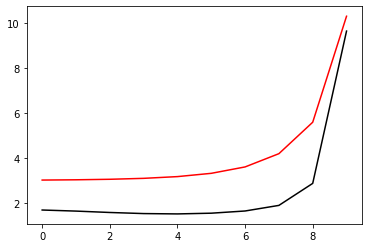

13400 54.00583996617856 -0.717236789781658 1.0849676824920234
[1.68336764 1.63542559 1.57369829 1.5251547  1.5099037  1.54217172
 1.64002407 1.88863577 2.86714668 9.63782237]


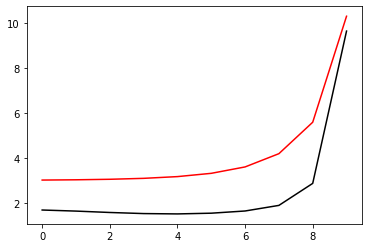

13600 54.00584125596802 -0.7172777518840607 1.0849585511425537
[1.68362973 1.63548774 1.57361075 1.52498122 1.5096951  1.54196993
 1.63986906 1.8885797  2.86726102 9.63818056]


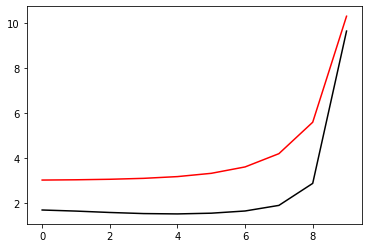

13800 54.00583996617968 -0.717237480800798 1.0849687261905054
[1.68336711 1.63543077 1.5737096  1.52516167 1.50990144 1.54216707
 1.64002007 1.88863252 2.86714523 9.63780809]


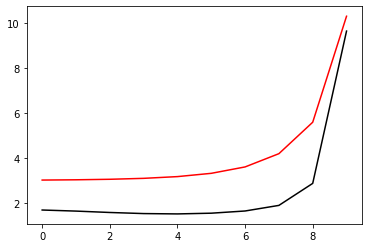

14000 54.00583996617838 -0.7172366222293249 1.0849674314309687
[1.68336746 1.63542477 1.57369653 1.52515279 1.50990318 1.54217239
 1.64002486 1.88863653 2.86714729 9.63782659]


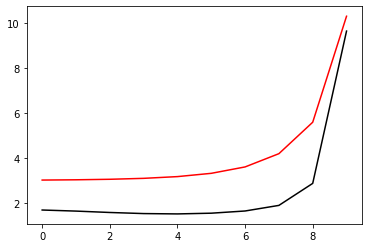

14200 54.00583996670758 -0.7172411431878118 1.0849741239635025
[1.6834483  1.6355015  1.57370219 1.52510194 1.50982698 1.54209316
 1.63995727 1.88859764 2.86716185 9.63789124]


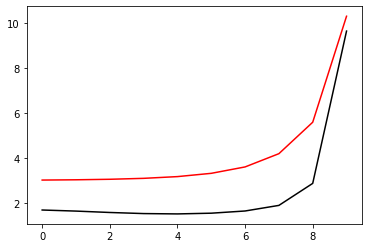

14400 54.005839966179124 -0.7172372226097318 1.0849683331088569
[1.68336753 1.63542836 1.5737046  1.52515965 1.50990303 1.542169
 1.6400217  1.88863379 2.86714557 9.63781286]


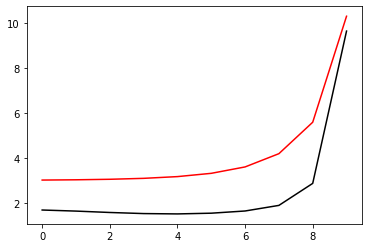

14600 54.00583996617817 -0.7172364130165926 1.0849671183793566
[1.68336708 1.63542386 1.57369478 1.52515067 1.509902   1.54217257
 1.64002564 1.88863767 2.8671489  9.63783138]


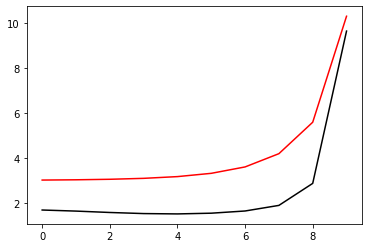

14800 54.00583996623547 -0.7172384594732041 1.0849698607684968
[1.68336921 1.63545398 1.5737237  1.52515165 1.50988528 1.54215249
 1.64000788 1.88862551 2.86714811 9.63781334]


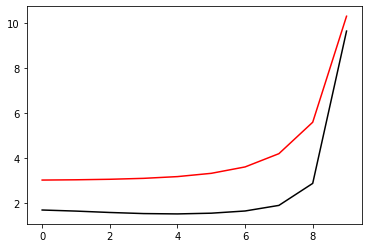

15000 54.00583996617878 -0.7172369973174372 1.084967994040491
[1.68336767 1.63542677 1.57370102 1.52515724 1.50990374 1.54217044
 1.64002289 1.88863483 2.86714619 9.63781755]


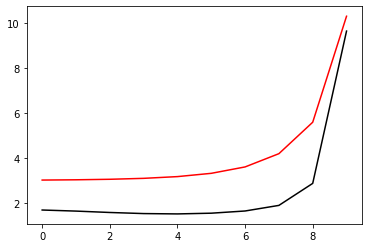

In [60]:
optimizer=tf.optimizers.Adam(learning_rate=0.0005)
for i in range (1, 15001):
    run()
    if i%200==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

200 54.00583996628552 -0.7172281187015627 1.0849554163425157
[1.68341008 1.63542084 1.57362478 1.52504114 1.50978221 1.54206913
 1.63996897 1.88866484 2.86730948 9.63813293]


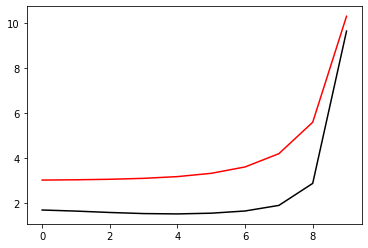

400 54.005839966178314 -0.7172267789068257 1.0849527981173313
[1.68334017 1.63539484 1.57364639 1.52507871 1.50982393 1.54211162
 1.64000621 1.88868923 2.86731056 9.6380494 ]


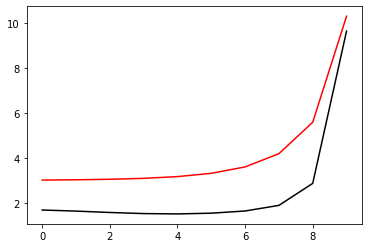

600 54.005839966176005 -0.7172267800984222 1.0849527318755392
[1.68333603 1.63538766 1.57364686 1.5250866  1.50983072 1.5421162
 1.64001044 1.88869548 2.86732078 9.63801433]


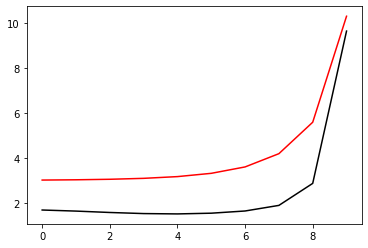

800 54.005839966175365 -0.7172269618107082 1.084952999992445
[1.68333726 1.63538753 1.57364641 1.52508824 1.50983247 1.54211572
 1.64000965 1.88869879 2.86733246 9.63798757]


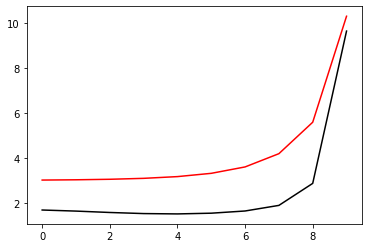

1000 54.005839966174946 -0.7172271369768498 1.0849532626284883
[1.68333821 1.63538829 1.57364697 1.525089   1.50983322 1.54211491
 1.64000805 1.88870109 2.86734372 9.63796467]


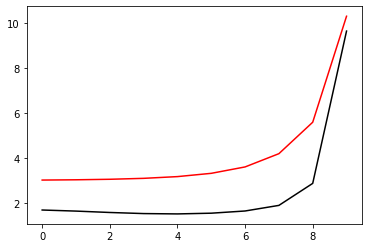

1200 54.00583996617475 -0.7172272779021797 1.0849534742832023
[1.68333884 1.63538901 1.57364774 1.52508975 1.50983363 1.5421141
 1.64000619 1.88870244 2.86735391 9.63794609]


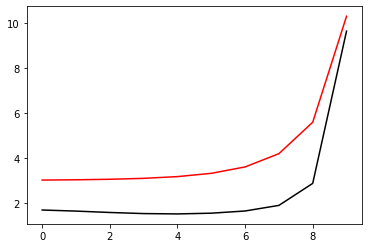

1400 54.0058399661746 -0.7172273773733863 1.0849536237864963
[1.68333922 1.63538953 1.57364843 1.52509045 1.50983394 1.54211336
 1.64000429 1.88870293 2.86736276 9.637932  ]


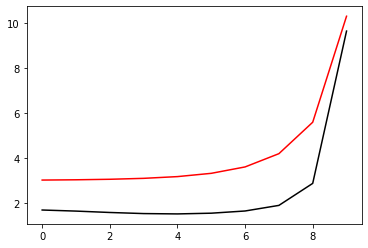

1600 54.00583996617456 -0.7172274357651385 1.0849537116686387
[1.6833394  1.63538984 1.57364893 1.52509101 1.50983421 1.54211271
 1.64000249 1.88870273 2.86737025 9.63792205]


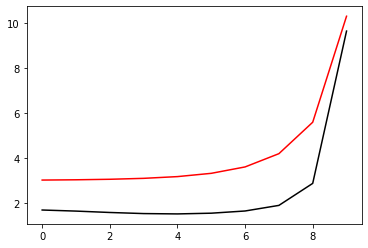

1800 54.00583996617851 -0.717229626093211 1.0849570970963998
[1.68334013 1.63541084 1.57367971 1.52510507 1.50983062 1.54210089
 1.63998806 1.88868997 2.86736658 9.63787888]


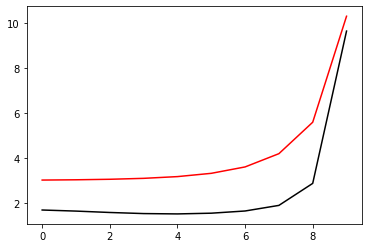

2000 54.005839966174804 -0.7172291264632672 1.0849562408349336
[1.68334293 1.63539702 1.5736619  1.52510706 1.5098452  1.54211361
 1.63999504 1.88869122 2.86736243 9.63787821]


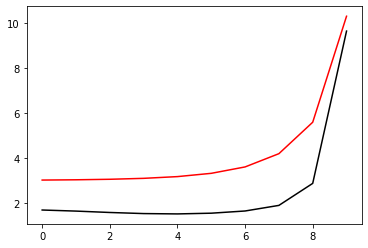

2200 54.00584270112151 -0.7172714370632508 1.0849130367909137
[1.68330583 1.63535635 1.5736176  1.52506209 1.50980465 1.54207661
 1.63995617 1.88864975 2.8673219  9.63784795]


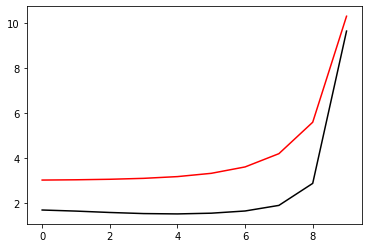

2400 54.00583996617622 -0.7172306707005892 1.08495856539134
[1.68334419 1.63540698 1.57367998 1.52511885 1.50984793 1.54211303
 1.63998929 1.88867921 2.86735037 9.63785076]


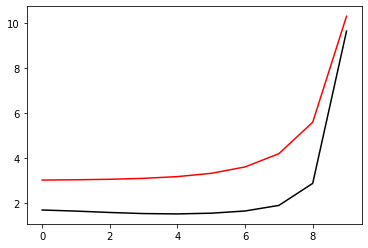

2600 54.00583996617509 -0.717230156688552 1.084957778503405
[1.6833463  1.63540063 1.57366634 1.52511383 1.509855   1.54212208
 1.63999506 1.88867957 2.86734468 9.63786326]


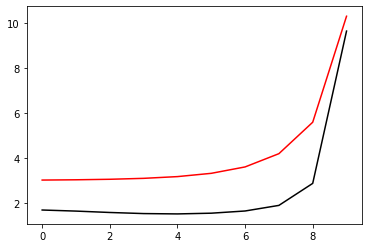

2800 54.00583999233783 -0.7172397989100474 1.0849643040143724
[1.68351926 1.63549436 1.57364238 1.52501395 1.50971883 1.54197779
 1.6398637  1.8885872  2.8673309  9.63795629]


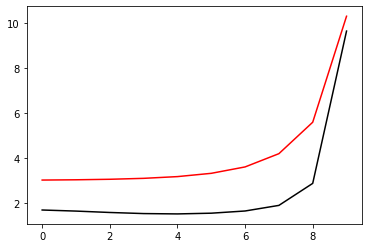

3000 54.005839966176 -0.7172314228448631 1.0849596757371434
[1.68334809 1.6354071  1.57367871 1.52512499 1.50985925 1.54212308
 1.63999295 1.88867023 2.86732847 9.63784345]


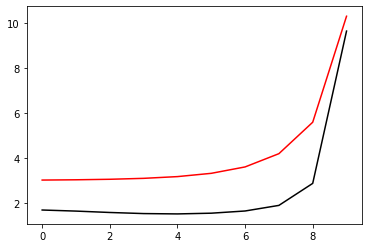

3200 54.00583996617531 -0.7172309062567527 1.0849588968538755
[1.68334891 1.63540324 1.57366922 1.52511801 1.50986173 1.54212967
 1.63999809 1.88867127 2.86732346 9.63785949]


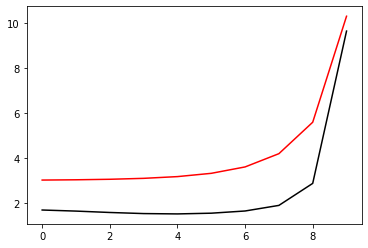

3400 54.005839966794504 -0.7172343298175108 1.0849627356190337
[1.68336914 1.63545413 1.57369706 1.5251066  1.50983076 1.54209554
 1.63996748 1.88864887 2.86731852 9.63785873]


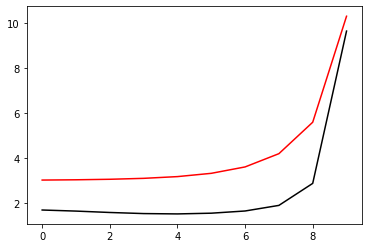

3600 54.00583996617609 -0.7172321254213601 1.0849607215371828
[1.68335116 1.63540883 1.57367956 1.52512901 1.50986732 1.54213115
 1.63999689 1.8886634  2.86730562 9.63784002]


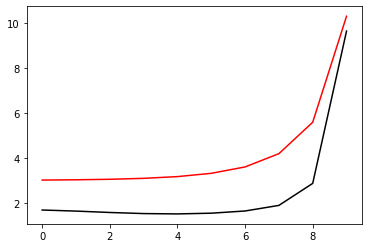

3800 54.00583996617551 -0.7172315912432448 1.0849599190943062
[1.68335127 1.63540571 1.57367203 1.52512179 1.50986729 1.54213618
 1.64000167 1.88866519 2.86730173 9.63785711]


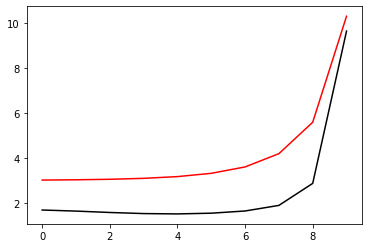

4000 54.00583996618239 -0.7172336569539187 1.0849630689962568
[1.68335258 1.63543295 1.57370286 1.52512786 1.50985571 1.54212077
 1.63998744 1.88865289 2.86729391 9.6378341 ]


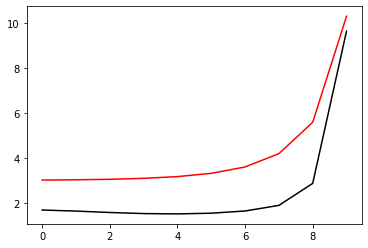

4200 54.0058399661762 -0.717232662098981 1.0849615211816301
[1.6833534  1.63541043 1.57368063 1.52513153 1.50987275 1.54213747
 1.64000075 1.88865888 2.86728536 9.6378398 ]


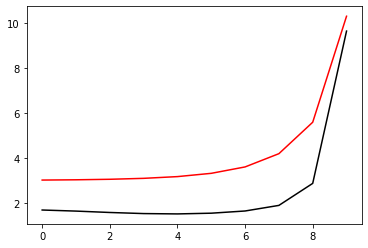

4400 54.005839966175714 -0.7172321169910849 1.0849607003510922
[1.68335312 1.63540761 1.57367415 1.52512452 1.5098713  1.54214126
 1.64000516 1.88866127 2.8672829  9.63785664]


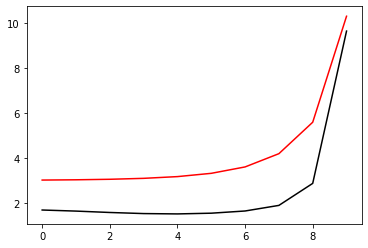

4600 54.00583996617909 -0.717233902850723 1.0849633552124025
[1.68335286 1.63542268 1.57370004 1.52513748 1.50986812 1.54213272
 1.63999633 1.88865189 2.86727282 9.6378259 ]


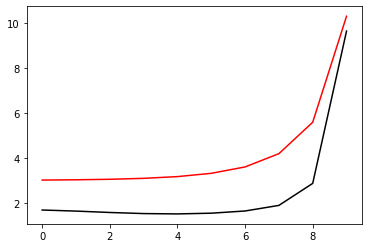

4800 54.0058399661763 -0.717233099754681 1.0849621733837505
[1.6833553  1.63541177 1.57368143 1.52513323 1.50987703 1.54214295
 1.64000447 1.88865572 2.86726728 9.6378404 ]


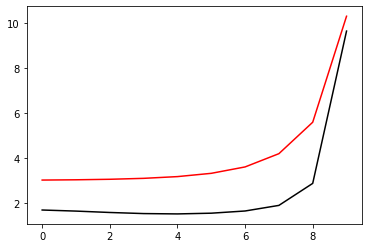

5000 54.005847091852104 -0.7171730211175943 1.0850409436330075
[1.68364457 1.63555974 1.57374116 1.52514535 1.50987625 1.54215784
 1.64006156 1.88879066 2.86752843 9.63830116]


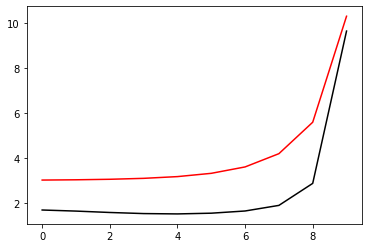

5200 54.005839966177675 -0.7172341624383872 1.0849637780057684
[1.68335552 1.63541919 1.57369596 1.52514189 1.50987602 1.54214017
 1.64000171 1.8886503  2.86725544 9.63782448]


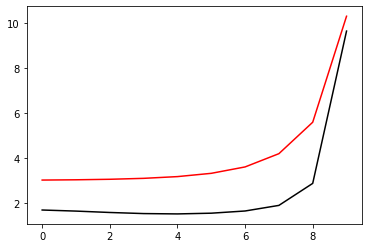

5400 54.00583996617641 -0.7172334491520165 1.08496269414741
[1.68335682 1.63541289 1.57368209 1.52513444 1.50988028 1.54214749
 1.64000775 1.88865346 2.86725182 9.6378416 ]


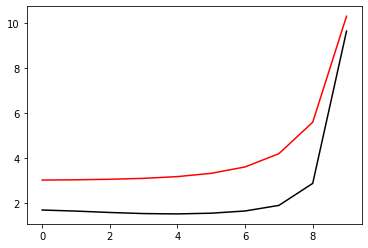

5600 54.00583998206464 -0.7172419037699449 1.0849695059894053
[1.6835294  1.635509   1.57366124 1.52503751 1.50974672 1.54200603
 1.63988041 1.88856661 2.86724186 9.63793601]


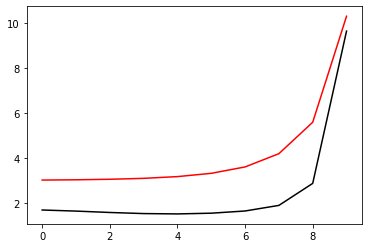

5800 54.00583996617734 -0.717234401736267 1.0849641236745509
[1.68335773 1.6354182  1.57369278 1.52514332 1.50988165 1.54214608
 1.64000594 1.88864879 2.86724024 9.63782558]


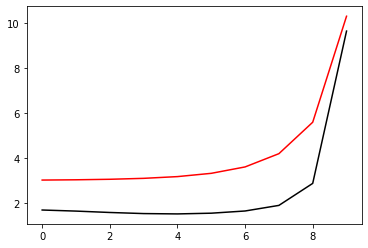

6000 54.005839966176524 -0.7172337195196122 1.0849630970949993
[1.68335804 1.63541377 1.57368253 1.52513514 1.50988264 1.54215138
 1.64001088 1.88865187 2.86723841 9.63784353]


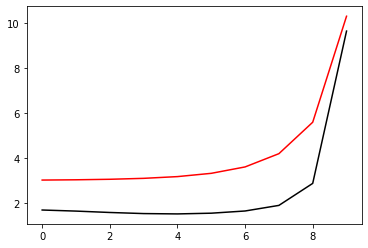

6200 54.00583996621177 -0.7172361536558011 1.0849667376956376
[1.68337113 1.63545768 1.57371034 1.52512723 1.50985614 1.54212196
 1.63998501 1.88863405 2.86723558 9.63783793]


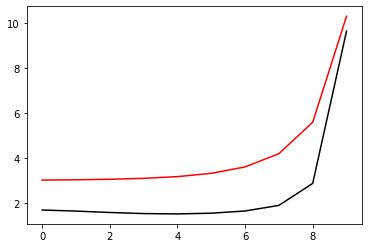

6400 54.005839966177206 -0.7172345634803106 1.0849643609333761
[1.68335931 1.63541782 1.57369049 1.52514337 1.50988567 1.54215079
 1.64000931 1.88864765 2.86722775 9.63782848]


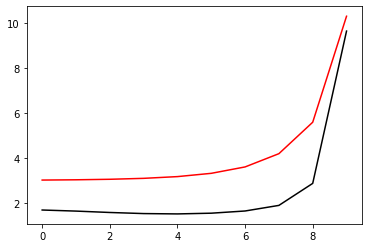

6600 54.005839966176545 -0.717233905393416 1.0849633740777953
[1.68335892 1.63541437 1.57368274 1.52513545 1.50988421 1.54215441
 1.64001354 1.88865085 2.86722762 9.63784614]


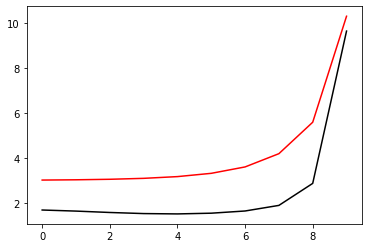

6800 54.00583996618325 -0.7172355961707376 1.0849660539943198
[1.68335827 1.63543219 1.57370994 1.52514585 1.50987807 1.5421437
 1.6400033  1.88864173 2.86722078 9.63781823]


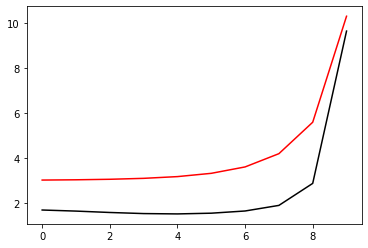

7000 54.0058399661772 -0.717234715688972 1.0849645863769886
[1.6833605  1.63541793 1.57368932 1.52514308 1.50988839 1.54215473
 1.64001222 1.88864666 2.86721688 9.63783118]


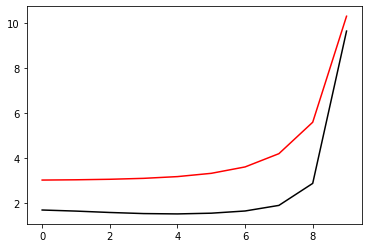

7200 54.00585297108764 -0.7173281126269774 1.0848676992263004
[1.68338814 1.63539249 1.57362984 1.52506497 1.50980685 1.54207941
 1.63994888 1.88860505 2.86721042 9.63789358]


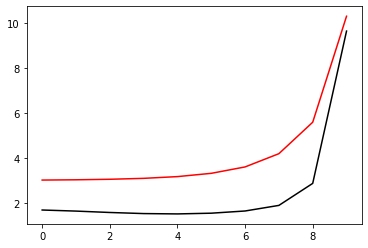

7400 54.00583996617858 -0.7172355823900483 1.0849658905048407
[1.68336009 1.63542478 1.57370293 1.52514999 1.50988581 1.54215084
 1.64000891 1.88864247 2.86720988 9.63781765]


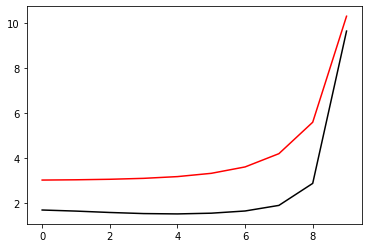

7600 54.005839966177156 -0.7172347905869032 1.0849646969922484
[1.68336125 1.63541794 1.57368836 1.52514236 1.50988986 1.54215773
 1.64001473 1.88864616 2.86720839 9.63783489]


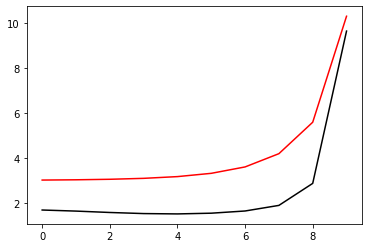

7800 54.00584006788412 -0.7172317286765589 1.0849820460083877
[1.68355108 1.63553359 1.57368512 1.52506112 1.50977095 1.54203038
 1.63990146 1.88857415 2.8672152  9.63794301]


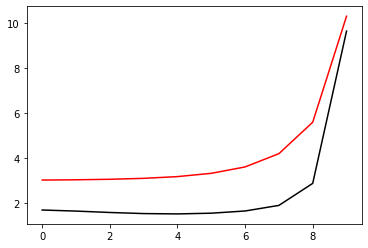

8000 54.00583996617817 -0.7172356836116048 1.0849660375263632
[1.68336184 1.63542311 1.57369911 1.52515115 1.50989061 1.54215524
 1.64001197 1.88864188 2.86720035 9.63781809]


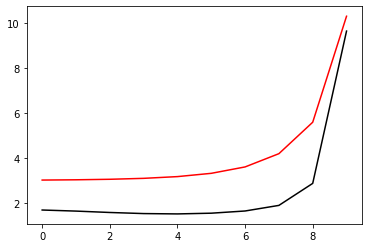

8200 54.0058399661772 -0.7172349339878785 1.0849649104610721
[1.68336201 1.63541835 1.5736883  1.52514247 1.50989135 1.54216034
 1.64001673 1.8886453  2.86720023 9.63783654]


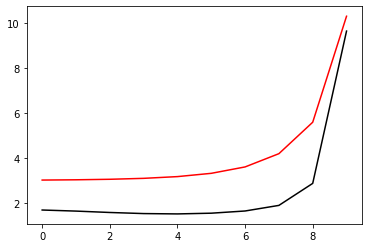

8400 54.00583996661903 -0.7172384006889837 1.084969318244515
[1.68339253 1.63547462 1.57370954 1.52512055 1.5098492  1.5421158
 1.63997883 1.88862254 2.8672054  9.63785544]


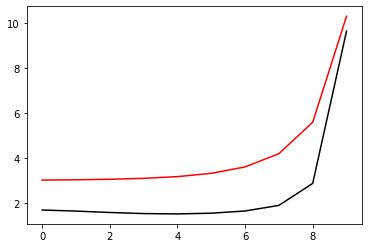

8600 54.00583996617797 -0.7172356867429915 1.0849660389047024
[1.6833628  1.63542225 1.57369639 1.52515026 1.50989305 1.54215853
 1.64001456 1.88864173 2.86719313 9.63782176]


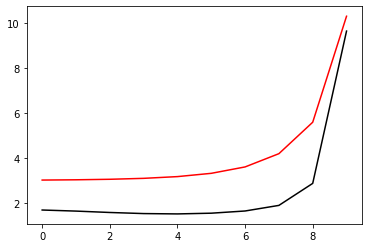

8800 54.00583996617717 -0.7172349644258871 1.0849649553571377
[1.68336237 1.63541837 1.57368781 1.52514187 1.50989173 1.5421621
 1.64001865 1.88864523 2.86719445 9.63783986]


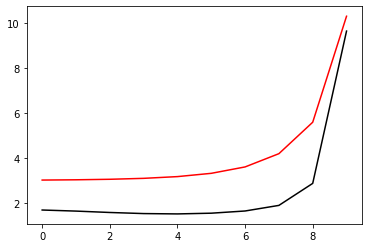

9000 54.00583996618863 -0.7172367652818441 1.084967533762216
[1.68336179 1.63543914 1.57371562 1.52514959 1.50988285 1.54214927
 1.64000686 1.88863584 2.86718994 9.63781497]


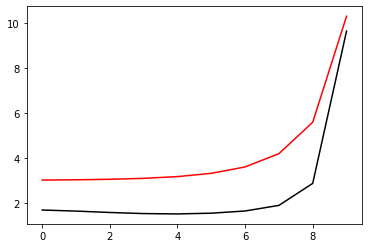

9200 54.005839966177795 -0.717235663604128 1.084966001925267
[1.68336355 1.63542156 1.57369399 1.52514882 1.5098949  1.54216156
 1.64001692 1.88864172 2.86718692 9.63782581]


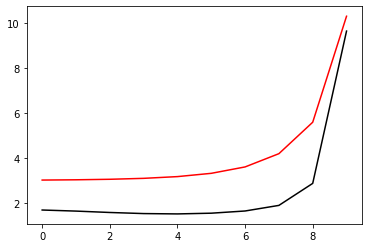

9400 54.00585952110003 -0.7173487293760631 1.0848484409719183
[1.68329672 1.63533629 1.57359537 1.52504336 1.50979105 1.54206232
 1.6399212  1.88855119 2.86710446 9.63777118]


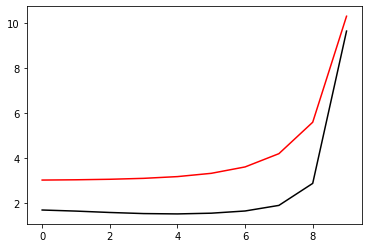

9600 54.00583996617911 -0.7172364192254136 1.0849671364829945
[1.6833629  1.63542793 1.5737067  1.52515472 1.50989183 1.54215742
 1.64001345 1.8886381  2.86718245 9.63781344]


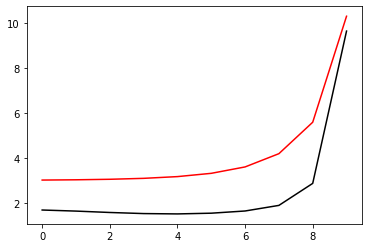

9800 54.00583996617764 -0.7172355838533347 1.0849658813524385
[1.68336391 1.63542092 1.573692   1.52514695 1.50989552 1.5421639
 1.64001903 1.88864203 2.86718232 9.63783098]


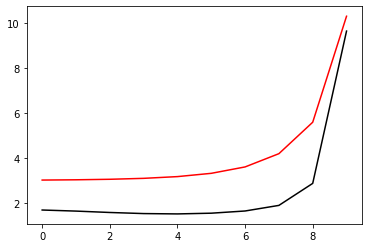

10000 54.00583999236857 -0.7172440610675933 1.0849694116713104
[1.68346506 1.63550114 1.57368852 1.52508219 1.50980305 1.54206729
 1.63993454 1.88858906 2.86718822 9.63790152]


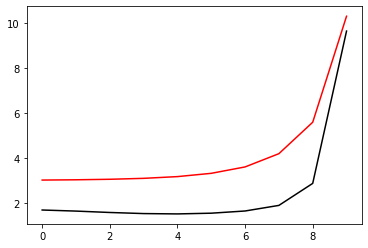

10200 54.00583996617843 -0.7172362624419564 1.0849669002422055
[1.68336424 1.63542484 1.57370042 1.52515408 1.50989592 1.54216138
 1.64001644 1.88863881 2.86717743 9.63781746]


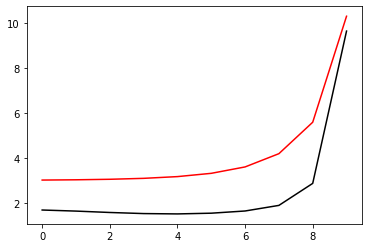

10400 54.00583996617756 -0.717235497489081 1.0849657514932913
[1.68336402 1.63542042 1.57369058 1.52514536 1.50989545 1.54216547
 1.64002069 1.88864245 2.86717908 9.63783575]


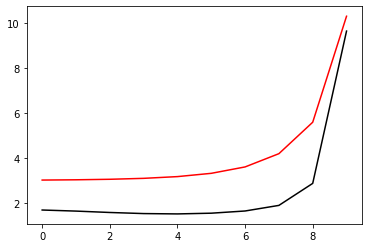

10600 54.00583996619784 -0.7172378553690342 1.084969338684965
[1.68337189 1.63546057 1.57372205 1.52514255 1.50987292 1.54213915
 1.63999722 1.88862609 2.86717677 9.63781995]


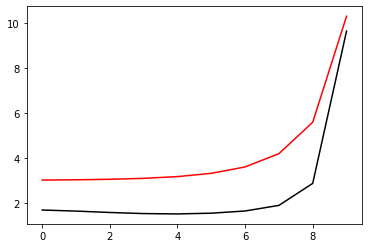

10800 54.00583996617843 -0.717236359771477 1.0849670431906466
[1.68336517 1.63542461 1.57369908 1.52515427 1.50989848 1.5421638
 1.64001782 1.88863814 2.86717198 9.6378173 ]


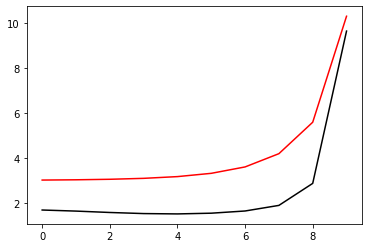

11000 54.005839966177604 -0.7172356083684236 1.08496591678944
[1.68336451 1.63542079 1.57369079 1.52514567 1.50989643 1.54216702
 1.64002174 1.88864171 2.86717423 9.63783603]


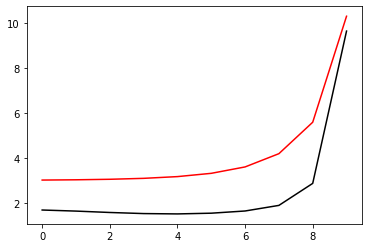

11200 54.00583996621909 -0.7172373741135973 1.0849690371875722
[1.68336587 1.63544888 1.57372073 1.52514961 1.50988252 1.54214938
 1.64000611 1.88863045 2.86717173 9.63781489]


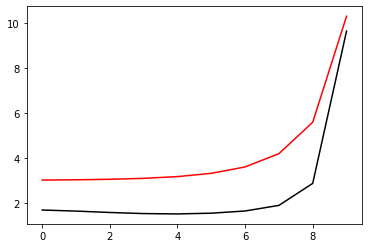

11400 54.005839966178286 -0.7172363196730764 1.084966982149716
[1.68336547 1.63542419 1.57369773 1.52515319 1.50989905 1.54216545
 1.64001938 1.88863824 2.86716837 9.63782075]


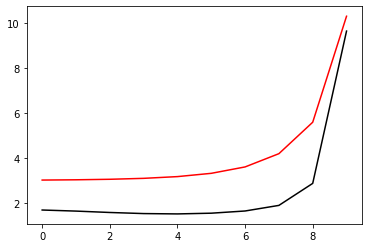

11600 54.00583996617762 -0.7172355856056797 1.084965869610261
[1.68336456 1.63542063 1.5736903  1.52514501 1.50989621 1.54216775
 1.64002292 1.88864199 2.86717162 9.63783877]


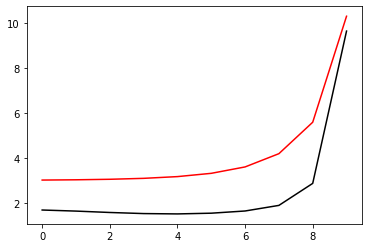

11800 54.00583996618045 -0.7172371386704496 1.0849682443370445
[1.68336387 1.63543412 1.57371448 1.52515724 1.50989251 1.54215859
 1.64001382 1.88863399 2.86716636 9.6378092 ]


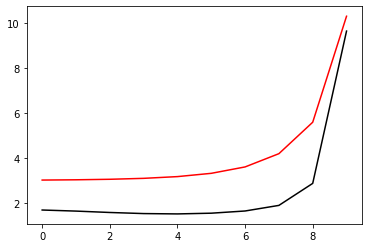

12000 54.00583996617812 -0.7172362161428519 1.0849668261383942
[1.68336568 1.63542346 1.57369577 1.52515148 1.50989952 1.54216709
 1.64002083 1.8886387  2.86716591 9.63782503]


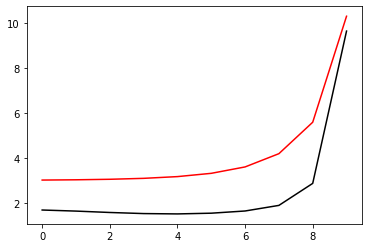

12200 54.005840310801744 -0.7172635699003587 1.084969653021225
[1.68364363 1.63550351 1.57364612 1.52503023 1.50975427 1.54203821
 1.63994781 1.88867383 2.86738046 9.63830222]


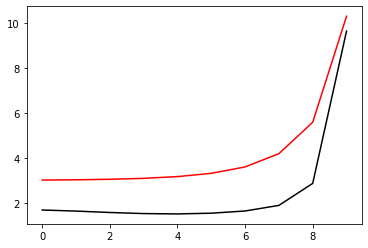

12400 54.005839966179565 -0.7172370873225661 1.0849681379602312
[1.68336524 1.63543001 1.5737094  1.52515943 1.50989716 1.54216229
 1.64001654 1.88863459 2.86716212 9.63780818]


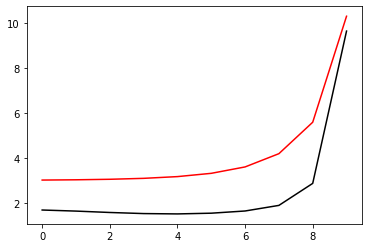

12600 54.00583996617811 -0.7172362295777412 1.084966845517543
[1.68336601 1.63542335 1.57369507 1.52515089 1.50990023 1.54216856
 1.64002188 1.88863851 2.86716274 9.63782662]


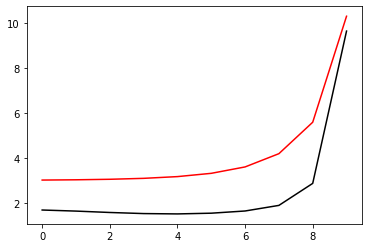

12800 54.00584042622667 -0.7172620918249736 1.0849653336394098
[1.68361983 1.63551421 1.57362991 1.52499095 1.50969477 1.54195664
 1.63983793 1.88852559 2.86718027 9.6380245 ]


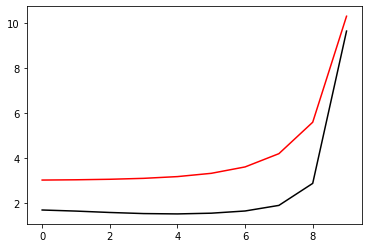

13000 54.005839966179366 -0.7172370993156956 1.0849681521199552
[1.6833659  1.63542912 1.57370754 1.5251598  1.50989909 1.54216402
 1.64001774 1.88863442 2.86715879 9.63780884]


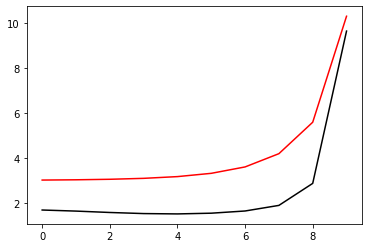

13200 54.0058399661781 -0.7172362625439582 1.0849668944360473
[1.68336625 1.63542341 1.5736949  1.52515077 1.50990069 1.5421695
 1.64002261 1.88863823 2.86716001 9.63782768]


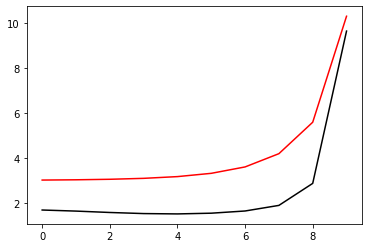

13400 54.00583997976905 -0.7172381363028906 1.084978357167586
[1.68353757 1.63553029 1.57368917 1.52507003 1.50978359 1.54204459
 1.63991168 1.88856731 2.86716582 9.63792596]


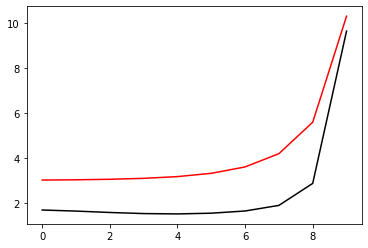

13600 54.00583996617903 -0.7172369637170208 1.0849679477496625
[1.68336622 1.63542781 1.5737047  1.52515849 1.50990003 1.54216558
 1.64001921 1.88863507 2.86715715 9.63781274]


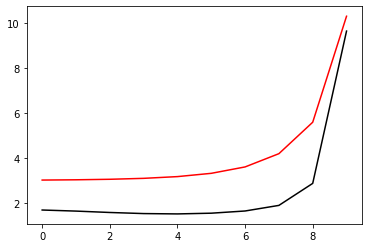

13800 54.00583996617799 -0.7172361556775735 1.0849667344046443
[1.68336611 1.63542293 1.57369387 1.52514951 1.50990008 1.54216994
 1.64002352 1.8886389  2.8671594  9.63783122]


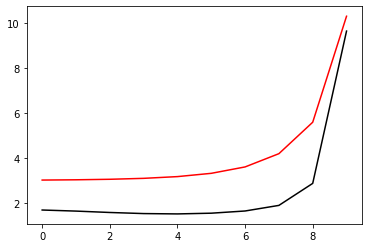

14000 54.0058399670462 -0.7172393355372032 1.08496992212881
[1.6833847  1.63547135 1.57371891 1.52513567 1.50986689 1.54213395
 1.6399924  1.88861942 2.86716215 9.63783411]


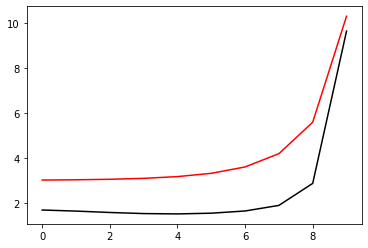

14200 54.00583996617869 -0.7172367790200428 1.0849676691863992
[1.68336657 1.63542623 1.57370105 1.5251565  1.50990124 1.54216739
 1.64002073 1.88863601 2.86715622 9.63781708]


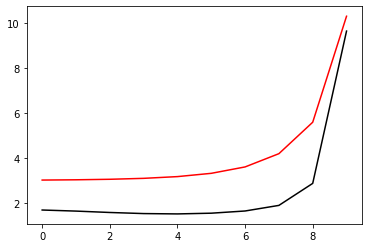

14400 54.005839966177874 -0.7172360062932819 1.084966510838998
[1.68336587 1.63542228 1.57369256 1.52514787 1.50989919 1.5421703
 1.64002441 1.88863982 2.86715963 9.63783527]


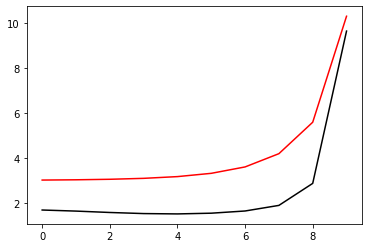

14600 54.00583996618333 -0.7172377156459889 1.084969043064468
[1.68336497 1.63544132 1.57371998 1.52515671 1.50989123 1.54215798
 1.64001299 1.88863089 2.86715618 9.63780858]


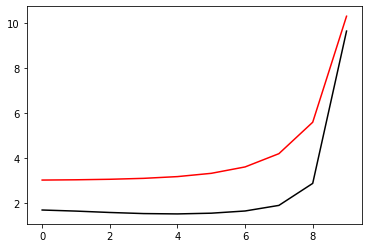

14800 54.00583996617845 -0.717236637082716 1.0849674552873747
[1.68336682 1.6354252  1.57369841 1.52515448 1.50990195 1.5421691
 1.64002209 1.88863665 2.86715501 9.63782097]


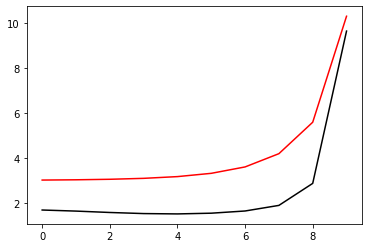

15000 54.005850271087084 -0.7173184713589876 1.0848824433947695
[1.68330479 1.63535375 1.57361914 1.52507153 1.50982207 1.54209406
 1.6399495  1.88856683 2.86708947 9.63777427]


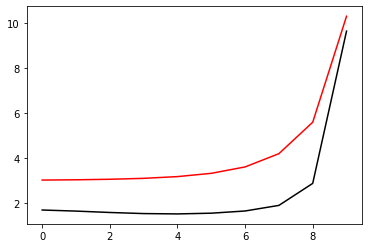

15200 54.005839966179806 -0.7172372983635397 1.0849684491322384
[1.68336572 1.63543139 1.57371107 1.52515987 1.50989785 1.54216386
 1.64001789 1.88863351 2.86715399 9.63780928]


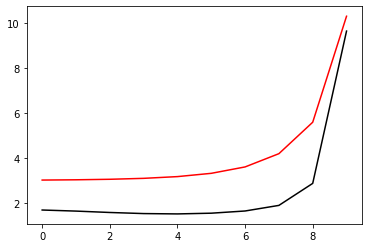

15400 54.005839966178215 -0.7172364187962316 1.0849671280035726
[1.68336665 1.63542407 1.57369593 1.52515192 1.50990145 1.54217015
 1.64002333 1.88863769 2.86715522 9.63782678]


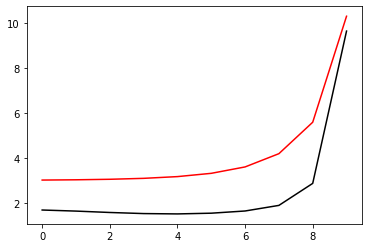

15600 54.00583999919029 -0.717246063910381 1.0849715680733958
[1.68352945 1.63552325 1.57368119 1.52506126 1.50977445 1.54203528
 1.63990235 1.8885572  2.86715244 9.63791661]


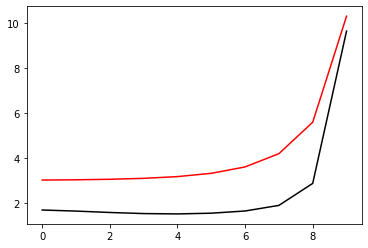

15800 54.005839966179245 -0.7172371856220809 1.084968280036656
[1.68336685 1.63542873 1.57370603 1.52516    1.5099014  1.54216668
 1.64001978 1.88863406 2.86715172 9.63781013]


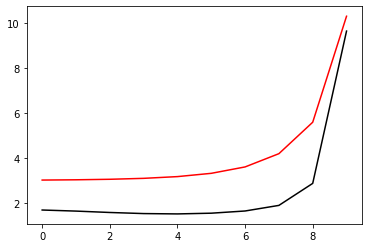

16000 54.00583996617816 -0.717236361994814 1.0849670425642794
[1.68336675 1.63542373 1.57369494 1.52515086 1.50990155 1.5421712
 1.64002416 1.88863784 2.86715395 9.63782911]


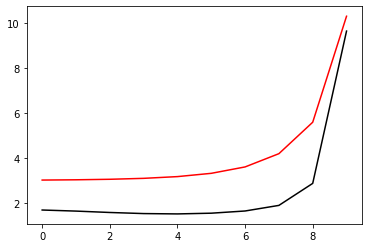

16200 54.00583996655475 -0.7172405688000175 1.0849748425612775
[1.68345348 1.63551311 1.57370989 1.52510329 1.50982508 1.54209059
 1.63995586 1.88859998 2.86717273 9.63789602]


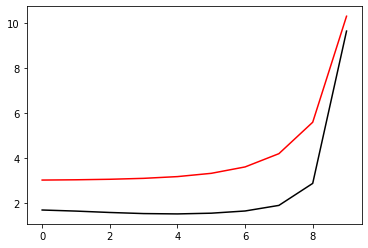

16400 54.005839966179366 -0.7172373064115856 1.0849684598510836
[1.68336724 1.63542905 1.57370649 1.5251612  1.50990262 1.54216711
 1.64001969 1.8886333  2.86714963 9.63780803]


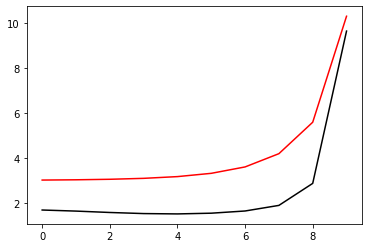

16600 54.005839966178264 -0.7172364836394557 1.084967224276094
[1.68336709 1.63542419 1.57369563 1.52515179 1.50990252 1.5421718
 1.64002412 1.88863698 2.86715164 9.63782739]


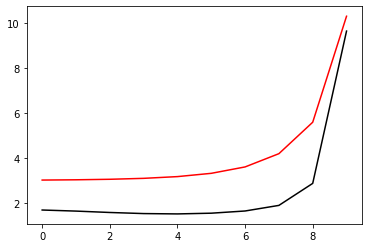

16800 54.00584000053241 -0.7172469227276773 1.0849737161036994
[1.68355388 1.63552359 1.57366745 1.52504077 1.50975046 1.54201066
 1.63987957 1.88853939 2.86714395 9.63793066]


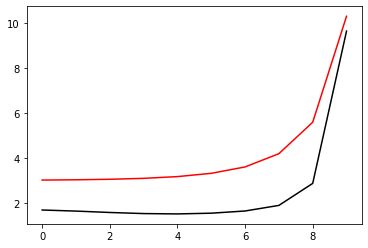

17000 54.00583996617935 -0.7172372923455942 1.0849684402005328
[1.68336699 1.63542935 1.57370715 1.52516074 1.50990157 1.54216691
 1.64001999 1.88863341 2.86714916 9.63780952]


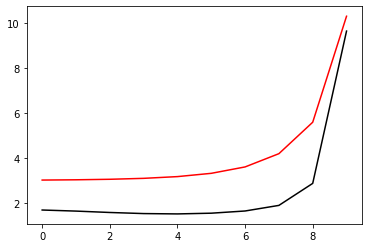

17200 54.00583996617822 -0.717236462137593 1.0849671921882924
[1.68336702 1.63542412 1.57369554 1.52515161 1.5099022  1.54217167
 1.64002444 1.88863726 2.86715136 9.63782823]


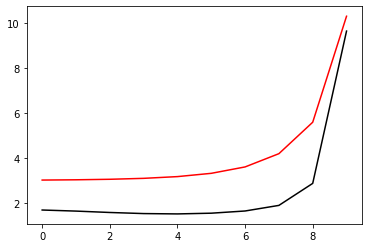

17400 54.00583997045097 -0.7172390682799583 1.0849762124209972
[1.68345381 1.63550545 1.57370356 1.52510161 1.50982575 1.54209177
 1.63995645 1.88859872 2.86716761 9.63789597]


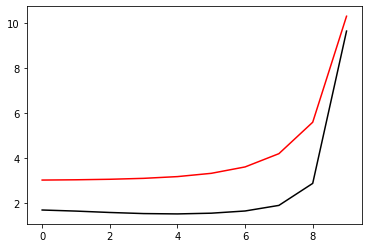

17600 54.0058399661791 -0.7172371525219021 1.0849682286066336
[1.68336721 1.63542816 1.5737045  1.52515936 1.50990234 1.54216813
 1.64002106 1.88863414 2.86714875 9.63781262]


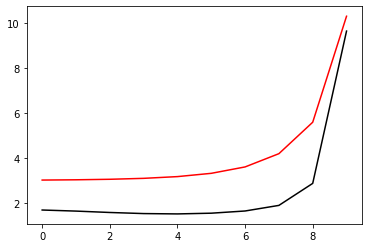

17800 54.00583996617811 -0.7172363450669534 1.0849670169901309
[1.68336683 1.63542361 1.57369453 1.52515035 1.5099015  1.54217188
 1.64002506 1.88863798 2.86715177 9.63783123]


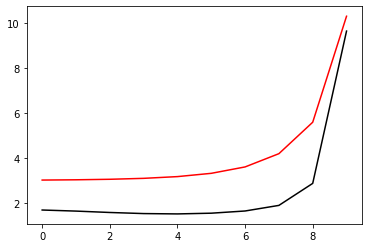

18000 54.00583996636221 -0.7172380652105357 1.0849705882446494
[1.68337442 1.63546163 1.57372408 1.5251475  1.5098802  1.5421473
 1.64000345 1.88862361 2.86715182 9.63781836]


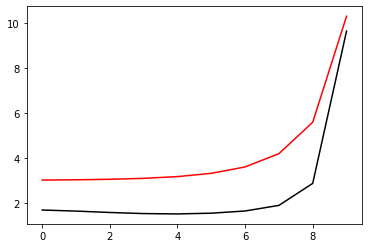

18200 54.00583996617882 -0.7172369802711847 1.0849679690850231
[1.68336745 1.63542683 1.57370141 1.52515742 1.5099032  1.5421696
 1.64002224 1.88863496 2.86714852 9.63781645]


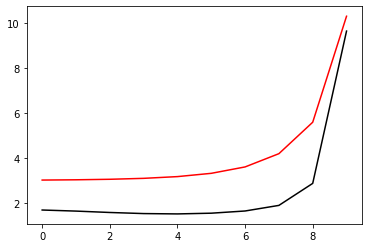

18400 54.005839966178016 -0.7172362019263091 1.0849668028561739
[1.68336657 1.635423   1.57369334 1.52514886 1.50990062 1.54217209
 1.64002575 1.88863882 2.8671525  9.63783477]


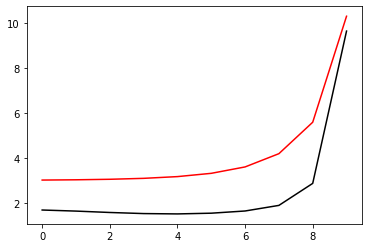

18600 54.005839966183515 -0.7172380067120164 1.0849694810143218
[1.68336568 1.63544193 1.57372183 1.52515921 1.50989328 1.54215968
 1.64001398 1.88862937 2.86714842 9.63780501]


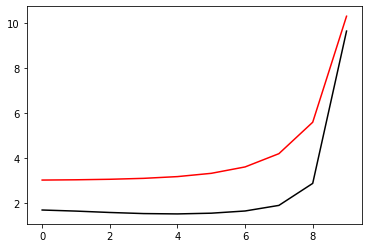

18800 54.00583996617871 -0.7172369221333352 1.084967881050412
[1.68336769 1.6354263  1.57369992 1.5251564  1.50990396 1.54217081
 1.64002297 1.88863508 2.86714743 9.63781828]


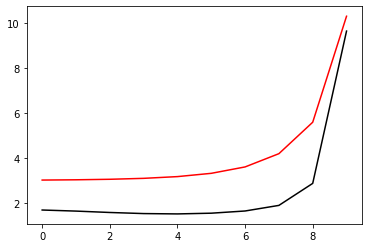

19000 54.00583996618032 -0.7172361188827564 1.084966776405536
[1.68336658 1.63542283 1.57369289 1.52514828 1.50990042 1.54217253
 1.64002629 1.88863902 2.867152   9.63783649]


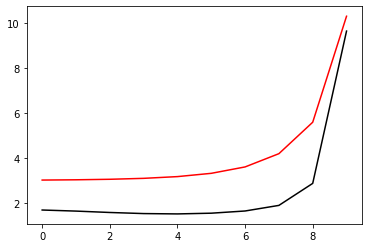

19200 54.005839966180694 -0.7172376990233367 1.0849690569769632
[1.68336588 1.63543545 1.57371644 1.52516102 1.50989716 1.54216339
 1.6400172  1.8886312  2.86714744 9.63780619]


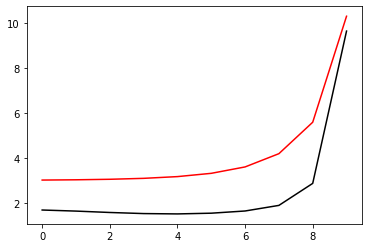

19400 54.00583996617853 -0.7172367545494203 1.0849676299258566
[1.6833675  1.63542546 1.57369819 1.52515457 1.50990344 1.54217134
 1.64002376 1.88863589 2.86714803 9.63782254]


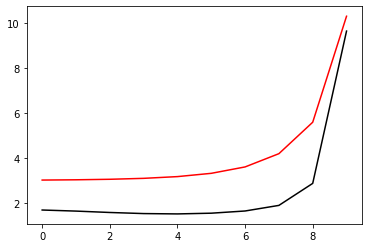

19600 54.00584163955182 -0.7172163560644553 1.0850210880510047
[1.6836712  1.63553546 1.57368037 1.52506634 1.50979188 1.54207665
 1.6399853  1.88870595 2.86739823 9.63833386]


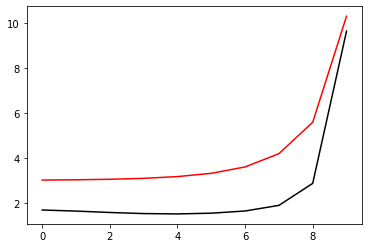

19800 54.00583996617986 -0.7172375297671013 1.0849688031020341
[1.68336683 1.63543155 1.57371114 1.52516197 1.50990062 1.54216613
 1.6400193  1.88863227 2.86714634 9.63780679]


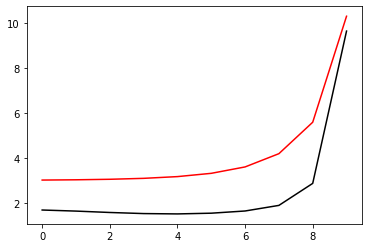

20000 54.00583996617841 -0.7172366568484556 1.0849674833633942
[1.68336747 1.63542495 1.57369696 1.52515329 1.5099033  1.54217205
 1.64002442 1.88863632 2.86714793 9.63782516]


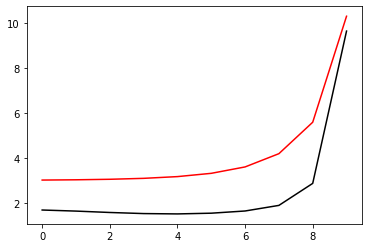

In [61]:
optimizer=tf.optimizers.Adam(learning_rate=0.0005)
for i in range (1, 20001):
    run()
    if i%200==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

200 54.00583996628949 -0.7172289010632107 1.0849566015968393
[1.68341371 1.63542517 1.5736287  1.52504417 1.50978571 1.54207271
 1.63996957 1.88866031 2.86729774 9.63811804]


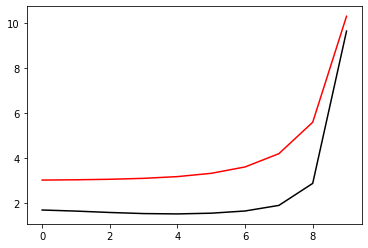

400 54.00583996617812 -0.7172275005223628 1.0849538780905394
[1.68334256 1.63539798 1.57365024 1.52508276 1.50982835 1.54211599
 1.64000771 1.88868507 2.86729809 9.63803514]


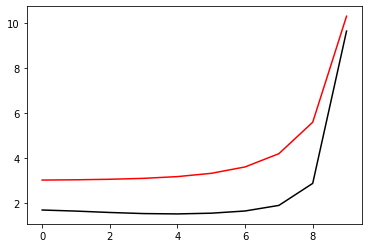

600 54.00583996617584 -0.7172274615301484 1.0849537500963145
[1.68333824 1.63539037 1.57365035 1.52509076 1.5098353  1.54212056
 1.64001214 1.88869132 2.8673077  9.63800211]


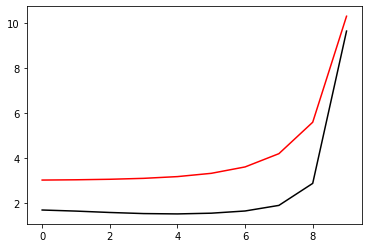

800 54.00583996617529 -0.7172276047650649 1.0849539604378098
[1.68333935 1.63539002 1.57364961 1.52509224 1.509837   1.54211997
 1.64001143 1.88869464 2.86731889 9.63797757]


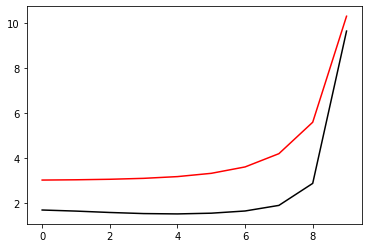

1000 54.00583996617497 -0.7172277412442547 1.084954165147413
[1.68334017 1.6353906  1.57364994 1.52509278 1.5098376  1.54211905
 1.64000989 1.888697   2.86732979 9.63795671]


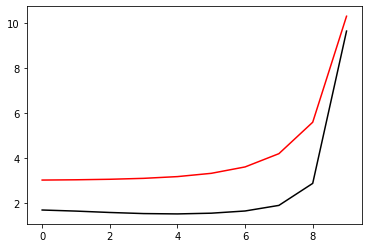

1200 54.00583996617477 -0.7172278439884127 1.0849543196794023
[1.68334067 1.63539116 1.5736505  1.52509328 1.50983779 1.54211812
 1.6400081  1.88869851 2.86733981 9.63793984]


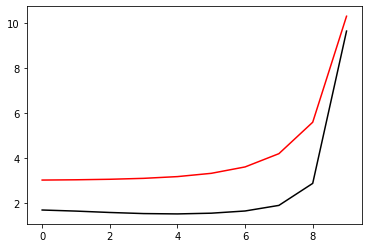

1400 54.00583996617466 -0.7172279063271875 1.0849544136587284
[1.68334093 1.63539153 1.57365099 1.52509373 1.50983786 1.54211721
 1.64000624 1.88869923 2.8673487  9.63792712]


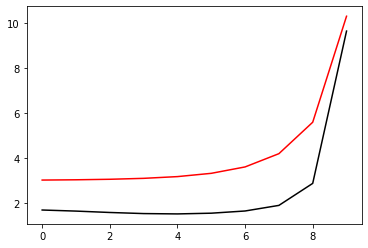

1600 54.00583996617456 -0.7172279287906712 1.0849544478470246
[1.68334099 1.6353917  1.57365129 1.52509406 1.50983786 1.54211638
 1.64000447 1.88869931 2.86735643 9.63791819]


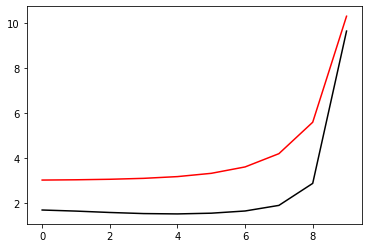

1800 54.00583996618017 -0.717230042938978 1.084957760630759
[1.68334153 1.63541212 1.57368162 1.52510795 1.50983415 1.5421045
 1.63999019 1.88868702 2.86735337 9.63787589]


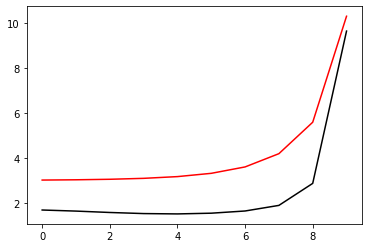

2000 54.005839966174904 -0.7172295429247977 1.0849568626018324
[1.68334429 1.63539857 1.57366384 1.52510956 1.5098483  1.54211686
 1.63999698 1.88868844 2.86734973 9.6378758 ]


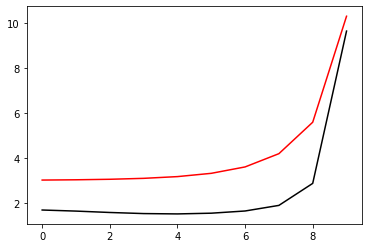

2200 54.00584775143967 -0.7173010708426332 1.0848837946087946
[1.68328775 1.63533522 1.57359487 1.52503868 1.50978114 1.54205312
 1.63993189 1.88862199 2.86728618 9.63782469]


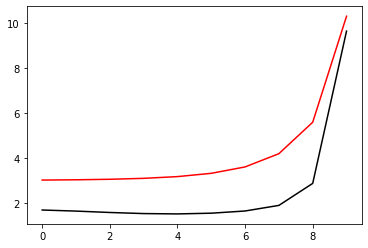

2400 54.005839966176275 -0.717231000891838 1.084959056513517
[1.6833454  1.63540802 1.57368114 1.52512084 1.50985069 1.54211604
 1.63999129 1.88867713 2.86733901 9.6378495 ]


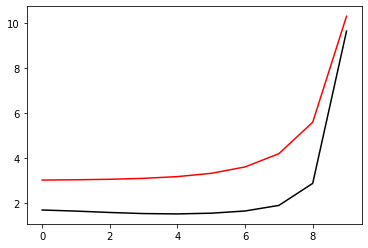

2600 54.00583996617516 -0.7172304759859035 1.0849582551377872
[1.68334738 1.63540181 1.57366775 1.52511564 1.50985736 1.54212474
 1.63999688 1.88867763 2.86733394 9.63786209]


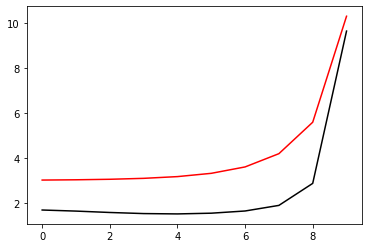

2800 54.00584000945992 -0.717229638793768 1.0849712865883883
[1.68347998 1.63549868 1.57367349 1.52505797 1.50977059 1.54203242
 1.63991481 1.88862512 2.86734141 9.63794421]


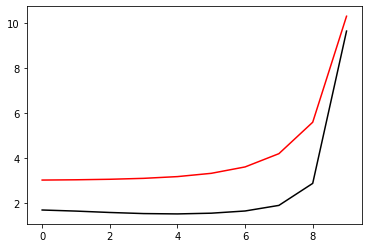

3000 54.005839966175955 -0.7172316274138834 1.0849599799271954
[1.68334916 1.6354075  1.57367854 1.52512585 1.5098617  1.54212603
 1.6399951  1.88866896 2.86731887 9.63784406]


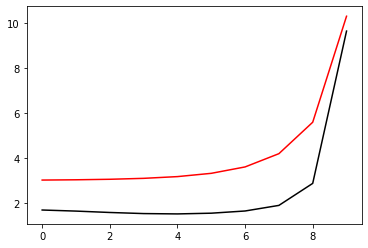

3200 54.00583996617535 -0.7172311133721208 1.084959205840907
[1.68334971 1.63540398 1.57366991 1.5251189  1.5098633  1.54213192
 1.63999992 1.8886701  2.86731472 9.63785998]


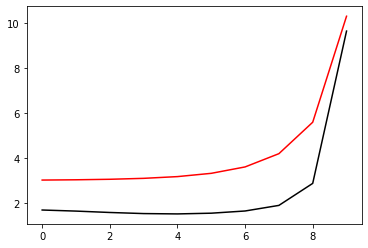

3400 54.00583996620145 -0.7172332936630349 1.0849622834172488
[1.6833514  1.63543164 1.57369977 1.52512386 1.50985148 1.54211661
 1.63998532 1.88865689 2.86730633 9.63783773]


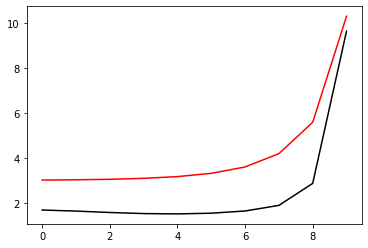

3600 54.00583996617597 -0.7172322052799103 1.0849608391089665
[1.683352   1.63540872 1.57367835 1.52512854 1.50986924 1.54213408
 1.63999917 1.88866284 2.86729775 9.6378428 ]


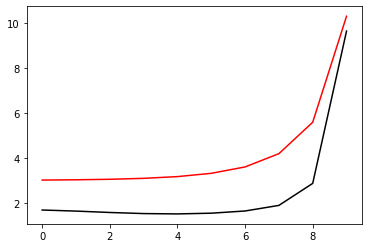

3800 54.0058399661822 -0.7172317519606113 1.0849599931026446
[1.6833517  1.63540594 1.57367198 1.52512172 1.50986794 1.54213794
 1.64000347 1.8886647  2.86729493 9.63785929]


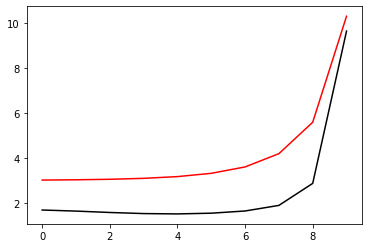

4000 54.00583996617803 -0.7172333890206819 1.0849626530198355
[1.68335189 1.63541898 1.57369591 1.52513571 1.50986672 1.54213104
 1.63999574 1.88865557 2.86728418 9.63782838]


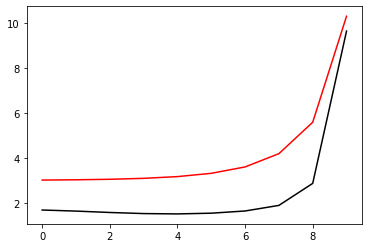

4200 54.00583996617606 -0.7172326731044686 1.0849615360601503
[1.68335405 1.6354101  1.57367904 1.52513031 1.50987412 1.54214032
 1.64000306 1.88865868 2.86727864 9.63784377]


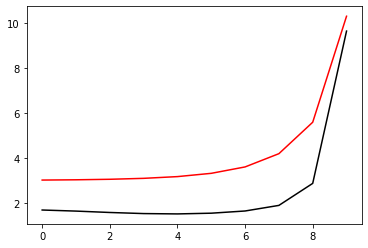

4400 54.00584092439309 -0.7172178158090765 1.0850022092213052
[1.68370097 1.63555755 1.57367196 1.52503328 1.50973819 1.54200678
 1.63991005 1.88865464 2.8674297  9.63822854]


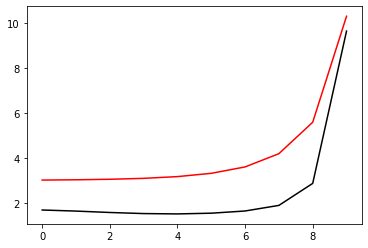

4600 54.005839966177234 -0.7172337580859207 1.084963163474709
[1.68335487 1.63541666 1.573692   1.52513967 1.50987493 1.54213885
 1.64000102 1.88865284 2.86726505 9.63782713]


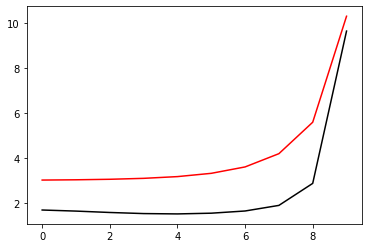

4800 54.00583996617621 -0.7172330840022558 1.084962148648702
[1.68335577 1.63541146 1.57368001 1.52513187 1.50987783 1.54214546
 1.64000664 1.88865567 2.86726146 9.63784473]


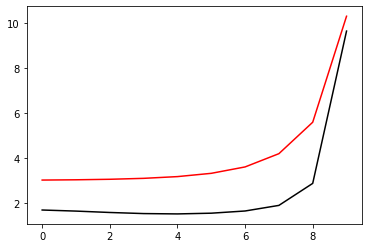

5000 54.00583997296978 -0.7172348923294017 1.0849708441862642
[1.68342268 1.63548557 1.57369461 1.52509488 1.50981795 1.54208319
 1.63995415 1.88862594 2.86727318 9.63789929]


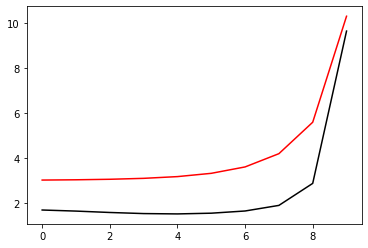

5200 54.005839966176985 -0.7172340154409674 1.0849635444576595
[1.68335704 1.63541617 1.57368929 1.52514062 1.50988043 1.54214497
 1.64000533 1.88865088 2.86724881 9.63782936]


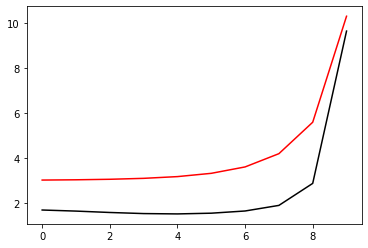

5400 54.0058399661763 -0.7172333700104996 1.0849625749445468
[1.68335703 1.6354124  1.57368054 1.52513265 1.50988026 1.54214956
 1.64000999 1.88865383 2.86724713 9.63784714]


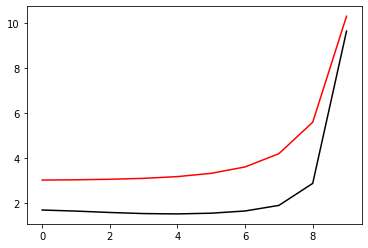

5600 54.00583996619804 -0.7172354059653726 1.0849654501694264
[1.68335795 1.63543896 1.57371039 1.52513779 1.50986802 1.5421337
 1.63999562 1.88864249 2.86724145 9.63782525]


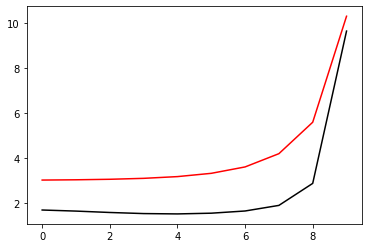

5800 54.00583996617694 -0.717234242006811 1.0849638799403105
[1.68335862 1.63541634 1.57368796 1.52514091 1.50988431 1.54214973
 1.64000867 1.88864931 2.86723522 9.63783174]


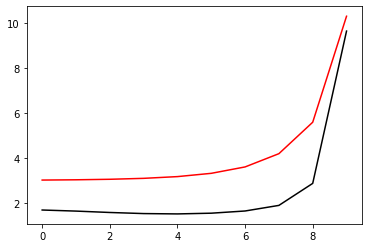

6000 54.00583996617646 -0.7172336190535654 1.0849629276484163
[1.68335804 1.63541322 1.57368111 1.52513339 1.50988214 1.5421528
 1.64001273 1.88865245 2.86723516 9.63784907]


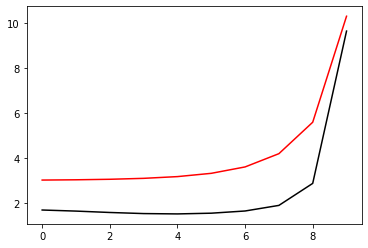

6200 54.005839966179195 -0.717235270232413 1.084965453663715
[1.68335766 1.63542706 1.57370589 1.52514638 1.50987911 1.5421442
 1.64000399 1.88864392 2.86722717 9.63781862]


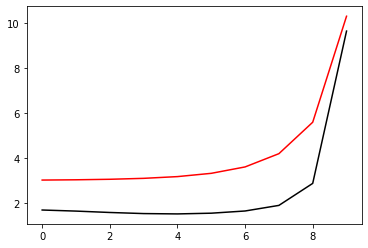

6400 54.005839966176985 -0.7172344382992403 1.0849641717518093
[1.68335976 1.63541677 1.57368754 1.52514107 1.5098868  1.54215344
 1.64001145 1.8886481  2.86722384 9.63783395]


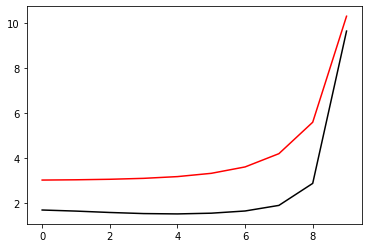

6600 54.00585586685956 -0.717140889341094 1.085083653825009
[1.68352874 1.63550016 1.57371875 1.52514613 1.50988986 1.54217435
 1.64006795 1.88876549 2.86743725 9.63819933]


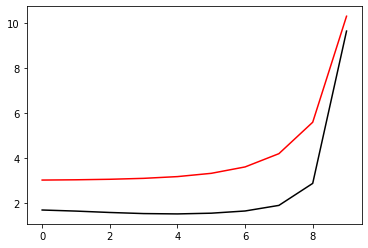

6800 54.00583996617886 -0.7172356299925231 1.0849659599232748
[1.68335965 1.63542565 1.57370486 1.5251508  1.50988469 1.54214873
 1.64000697 1.8886423  2.86721455 9.6378137 ]


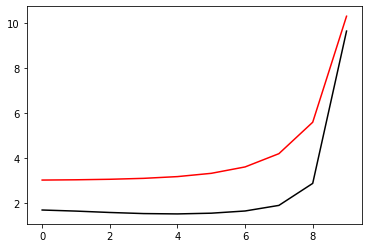

7000 54.005839966177206 -0.7172348159638555 1.0849647353746066
[1.68336112 1.63541812 1.57368901 1.52514314 1.5098899  1.54215666
 1.64001331 1.88864591 2.86721196 9.63783148]


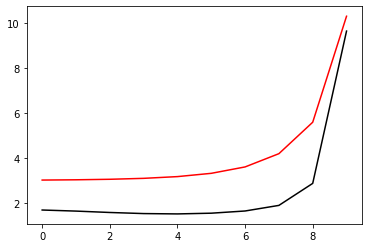

7200 54.005866129294944 -0.7171029152001068 1.0850897325415576
[1.68359574 1.63561389 1.57385926 1.52529869 1.51004219 1.5423136
 1.64017793 1.88882362 2.8674109  9.63807831]


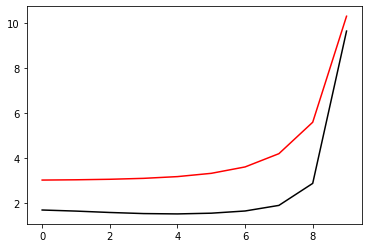

7400 54.005839966178875 -0.7172358274689065 1.0849662602279873
[1.68336047 1.6354263  1.57370533 1.52515157 1.50988644 1.54215123
 1.64000895 1.88864109 2.8672052  9.63781499]


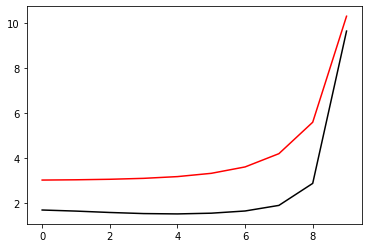

7600 54.00583996617732 -0.7172350126431947 1.0849650288225816
[1.68336185 1.63541883 1.57368973 1.52514404 1.50989133 1.5421587
 1.64001507 1.88864488 2.86720346 9.63783219]


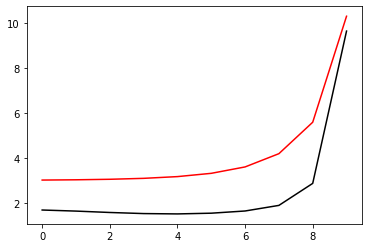

7800 54.0058417278094 -0.7172813713324092 1.0849526877955962
[1.68360237 1.63546306 1.5735884  1.52495947 1.50967327 1.54194894
 1.63985323 1.88858211 2.86730956 9.6381854 ]


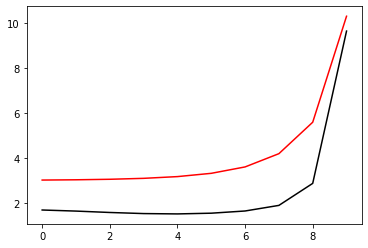

8000 54.00583996617842 -0.7172358364817828 1.084966269320507
[1.68336171 1.63542454 1.57370179 1.52515186 1.50988977 1.54215489
 1.64001189 1.88864111 2.86719747 9.63781744]


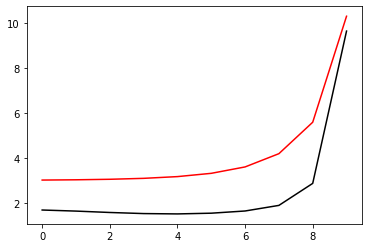

8200 54.0058399661773 -0.7172350617235851 1.0849651014408803
[1.68336231 1.63541889 1.57368921 1.52514352 1.50989202 1.54216067
 1.64001701 1.88864473 2.86719718 9.6378352 ]


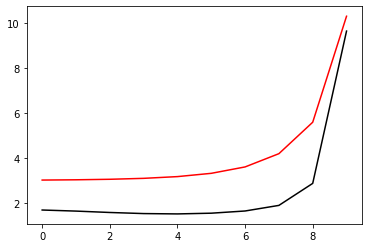

8400 54.00583997171605 -0.7172370140514941 1.0849734232271566
[1.68343308 1.63549533 1.57370364 1.52510483 1.50982961 1.5420956
 1.6399623  1.88861494 2.86721311 9.63789321]


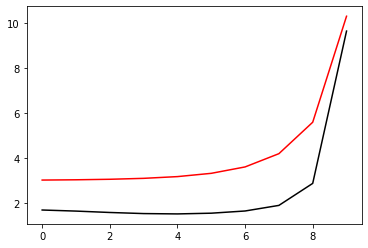

8600 54.00583996617807 -0.717235811290985 1.0849662257324346
[1.68336292 1.63542297 1.5736978  1.5251513  1.50989317 1.54215848
 1.64001453 1.88864119 2.86719083 9.63782037]


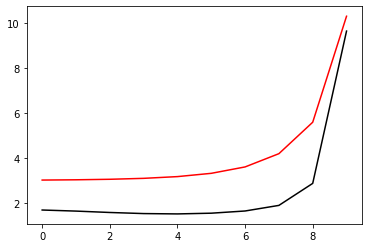

8800 54.00583996617729 -0.7172350754002118 1.0849651211987366
[1.68336266 1.63541882 1.57368851 1.52514275 1.50989247 1.54216249
 1.64001877 1.8886447  2.867192   9.63783847]


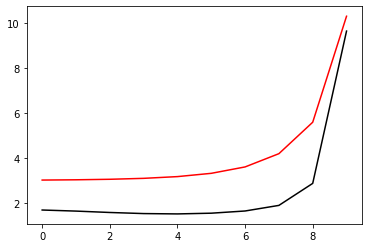

9000 54.00583996624243 -0.7172368120751188 1.084968302276464
[1.68336491 1.6354482  1.57371838 1.52514594 1.50987817 1.54214474
 1.6400029  1.88863313 2.86718896 9.63781844]


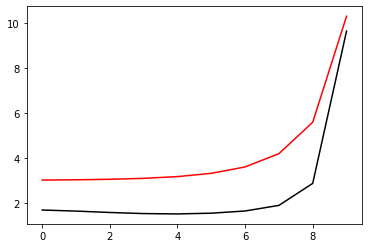

9200 54.00583996617795 -0.7172358146530099 1.0849662281728802
[1.68336379 1.6354223  1.57369542 1.52515022 1.50989538 1.54216154
 1.64001676 1.88864103 2.86718469 9.63782333]


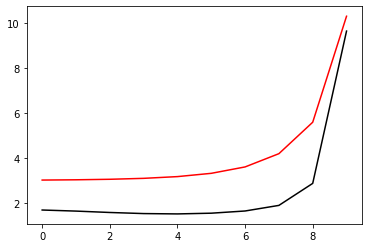

9400 54.00583996617752 -0.7172350875830725 1.0849651711197776
[1.68336299 1.63541885 1.57368809 1.5251422  1.50989278 1.54216409
 1.64002045 1.88864463 2.86718714 9.63784123]


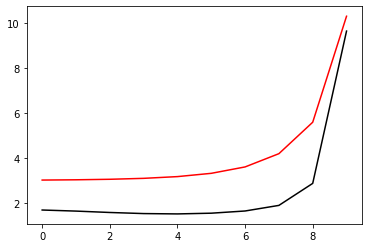

9600 54.00583996618021 -0.7172366510350998 1.0849674630500414
[1.68336237 1.63543164 1.5737115  1.52515451 1.50988954 1.54215542
 1.64001177 1.88863675 2.86718134 9.6378121 ]


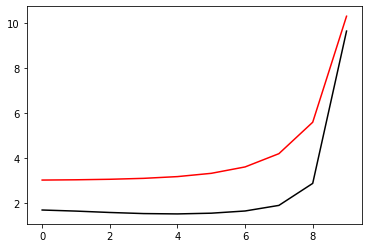

9800 54.00583996617778 -0.717235743176862 1.0849661198506604
[1.68336416 1.63542165 1.57369344 1.52514856 1.50989621 1.54216375
 1.64001865 1.88864124 2.86718042 9.63782803]


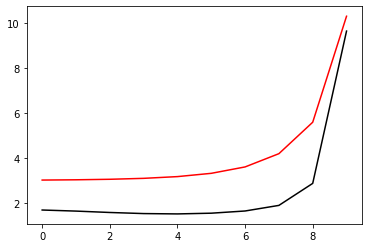

10000 54.00584070386819 -0.7172676302329047 1.0849609416444588
[1.6836236  1.63549842 1.57362251 1.52499116 1.50970106 1.54196983
 1.63986192 1.88856817 2.86725448 9.6381145 ]


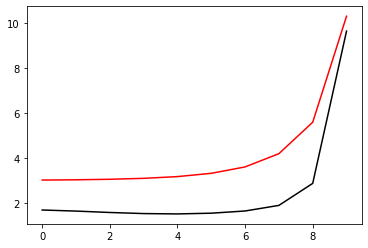

10200 54.005839966178755 -0.7172364420308075 1.084967171308033
[1.683364   1.63542649 1.57370378 1.52515532 1.50989482 1.54216033
 1.64001568 1.88863801 2.86717625 9.63781477]


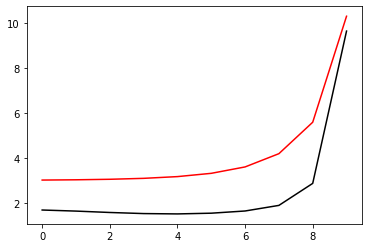

10400 54.00583996617766 -0.717235642755738 1.0849659688088906
[1.68336431 1.63542105 1.57369173 1.52514673 1.50989624 1.54216549
 1.64002045 1.88864175 2.86717723 9.6378329 ]


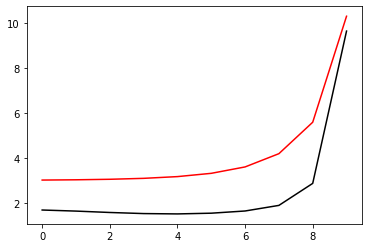

10600 54.00583996626562 -0.7172380843168155 1.0849703664827746
[1.68338999 1.63547434 1.5737159  1.52513027 1.50986047 1.54212723
 1.63998769 1.88862213 2.86718238 9.63784506]


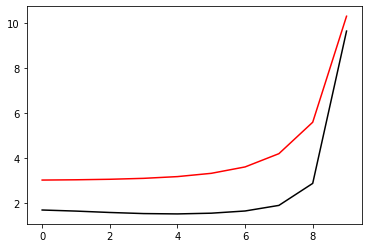

10800 54.00583996617833 -0.7172362910185505 1.0849669406190923
[1.68336491 1.63542444 1.5736989  1.52515367 1.50989763 1.54216352
 1.64001805 1.88863862 2.86717242 9.63781934]


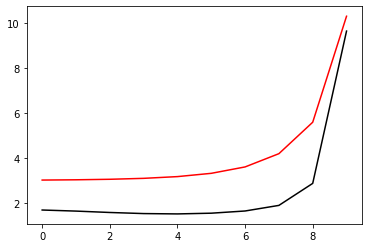

11000 54.005839966177554 -0.717235540424799 1.0849658152591826
[1.68336431 1.63542053 1.57369041 1.52514515 1.50989585 1.54216668
 1.64002191 1.88864229 2.86717496 9.63783748]


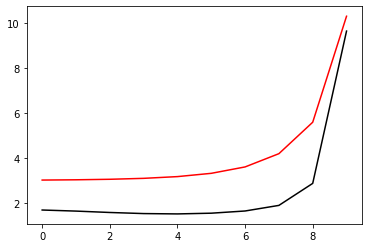

11200 54.00583996618602 -0.7172371270279749 1.0849683645497472
[1.68336341 1.63543894 1.57371748 1.52515425 1.50988831 1.54215481
 1.64001093 1.88863365 2.86717135 9.63781149]


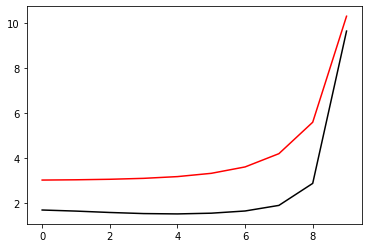

11400 54.00583996617811 -0.7172361684437986 1.0849667554902098
[1.68336529 1.63542341 1.57369615 1.52515167 1.50989868 1.54216569
 1.6400198  1.8886391  2.86716961 9.6378239 ]


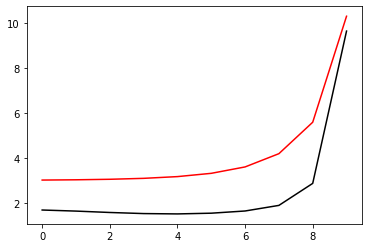

11600 54.00584036158059 -0.7172192685141995 1.0849818073093016
[1.68338088 1.63543659 1.57370581 1.5251602  1.50991154 1.54218368
 1.64003945 1.88865929 2.86718992 9.63785798]


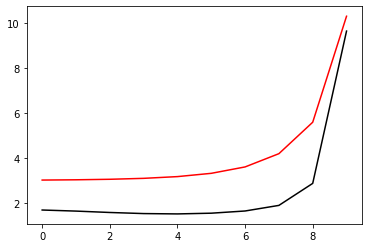

11800 54.005839966180076 -0.7172371363554819 1.0849682293180931
[1.6833644  1.63543206 1.57371276 1.5251591  1.5098946  1.54215972
 1.64001453 1.88863433 2.86716588 9.63780676]


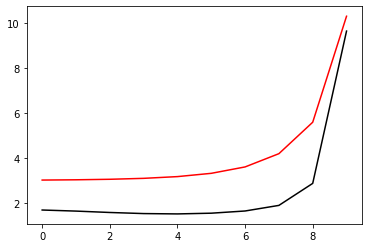

12000 54.00583996617813 -0.7172362439307471 1.0849668674869908
[1.68336582 1.63542352 1.57369574 1.52515159 1.50989998 1.54216743
 1.64002078 1.88863848 2.8671655  9.63782432]


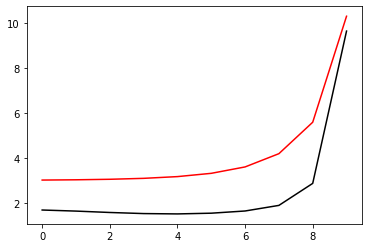

12200 54.005854367928244 -0.7171469378086319 1.085079544613654
[1.68354303 1.63551354 1.57373237 1.52516089 1.50990599 1.54219049
 1.64007888 1.88875729 2.86738128 9.63818789]


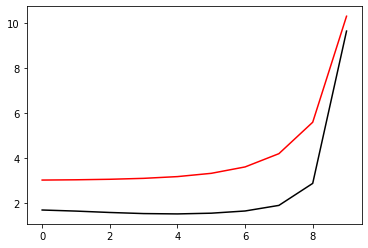

12400 54.0058399661797 -0.7172371237380636 1.0849681917578675
[1.68336498 1.6354308  1.57371071 1.52515935 1.5098963  1.54216163
 1.64001608 1.88863437 2.86716245 9.63780807]


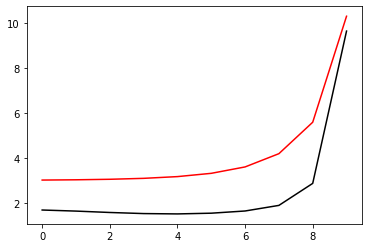

12600 54.005839966178144 -0.7172362517371147 1.0849668787732754
[1.68336601 1.63542347 1.57369537 1.52515121 1.50990024 1.54216835
 1.6400217  1.88863841 2.86716283 9.63782601]


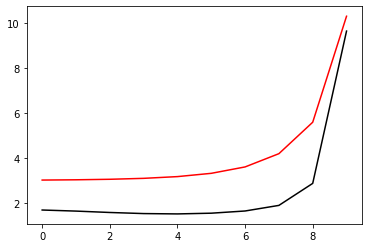

12800 54.00584103915504 -0.717219898768821 1.0850091786347997
[1.68372209 1.63557566 1.57368752 1.5250495  1.50975682 1.54202628
 1.63992114 1.88863054 2.86731773 9.63821358]


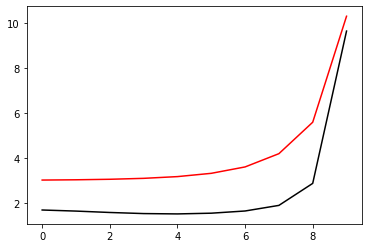

13000 54.00583996617935 -0.7172370571241315 1.0849680934370778
[1.68336565 1.6354292  1.57370776 1.5251593  1.50989831 1.54216359
 1.64001764 1.88863472 2.86715972 9.63780974]


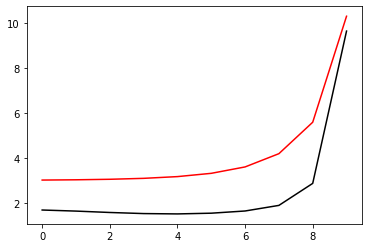

13200 54.005839966178065 -0.7172362198958605 1.084966830781024
[1.6833661  1.63542326 1.57369472 1.5251505  1.5099003  1.54216917
 1.64002257 1.88863858 2.86716096 9.63782821]


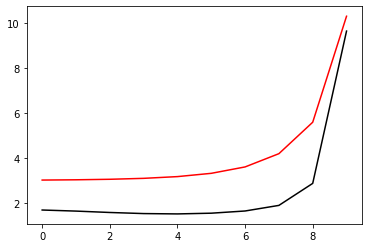

13400 54.005839971557926 -0.7172407288005972 1.0849796996870396
[1.6836011  1.63554872 1.57367631 1.52504    1.50974392 1.54200183
 1.63987293 1.88854132 2.86716418 9.63795918]


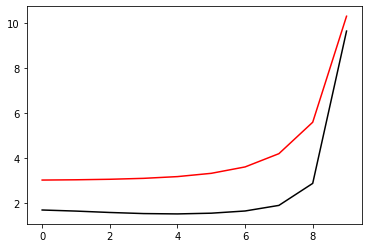

13600 54.005839966179465 -0.7172372344951297 1.084968354298393
[1.68336635 1.63542952 1.57370811 1.52516099 1.50990025 1.54216463
 1.64001792 1.88863375 2.86715597 9.63780665]


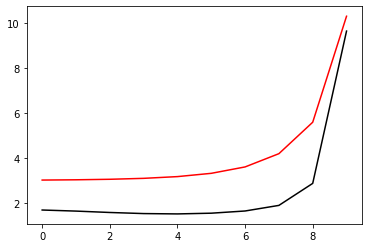

13800 54.005839966178215 -0.7172363938134073 1.084967090517276
[1.68336664 1.63542392 1.5736956  1.52515169 1.50990168 1.54217022
 1.64002281 1.88863746 2.86715708 9.63782598]


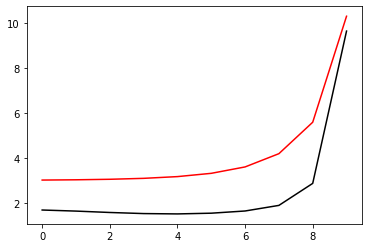

14000 54.005840565986155 -0.7172645062316854 1.0849608439429541
[1.68364363 1.63552693 1.57364302 1.52500515 1.50971007 1.54197333
 1.63985607 1.88854487 2.8671995  9.63805703]


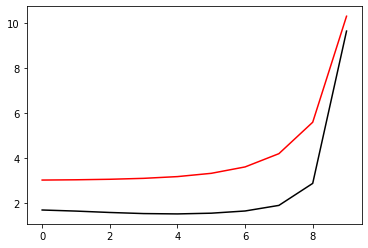

14200 54.00583996617938 -0.7172371826720948 1.0849682791003719
[1.68336632 1.63542935 1.57370758 1.52515999 1.5098999  1.54216537
 1.64001889 1.88863393 2.8671542  9.63780966]


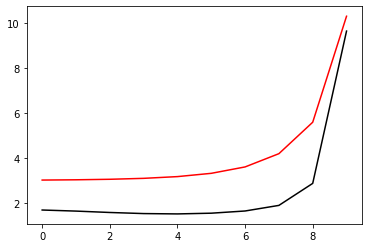

14400 54.005839966178165 -0.7172363462204827 1.0849670192471663
[1.68336658 1.63542371 1.57369515 1.52515107 1.50990128 1.5421705
 1.64002359 1.88863784 2.86715594 9.63782825]


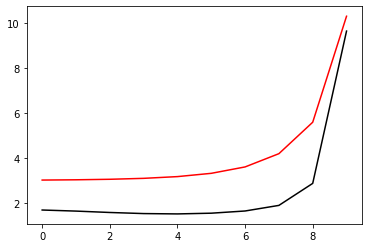

14600 54.00583997704004 -0.7172433486694803 1.084971772529872
[1.68346527 1.63550893 1.57369911 1.52509312 1.50981492 1.5420799
 1.63994534 1.88859117 2.86716828 9.63789928]


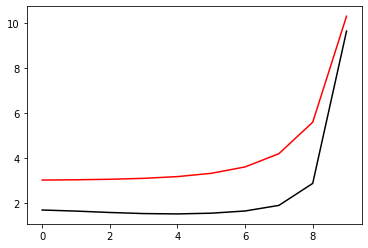

14800 54.005839966179074 -0.7172370794195833 1.084968120350043
[1.68336682 1.635428   1.57370458 1.52515916 1.50990152 1.54216697
 1.64002008 1.88863446 2.86715271 9.63781209]


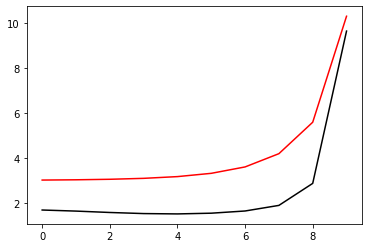

15000 54.00583996617808 -0.7172362719807074 1.0849669079690785
[1.68336653 1.63542335 1.57369431 1.52515009 1.50990099 1.54217103
 1.64002425 1.88863826 2.86715528 9.63783083]


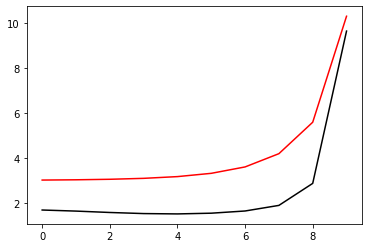

In [62]:
optimizer=tf.optimizers.Adam(learning_rate=0.0005)
for i in range (1, 15001):
    run()
    if i%200==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

200 54.005839966293316 -0.71722924783505 1.0849571285066473
[1.68341579 1.63542752 1.57363063 1.52504524 1.50978622 1.54207291
 1.63996859 1.88865813 2.86729619 9.63810979]


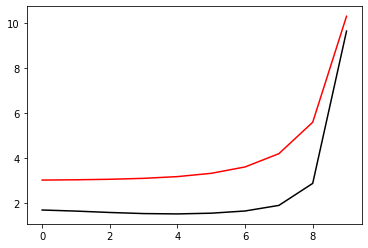

400 54.00583996617801 -0.7172277995667796 1.084954327183877
[1.68334352 1.63539949 1.57365215 1.52508454 1.5098298  1.54211705
 1.64000751 1.88868322 2.8672959  9.63802698]


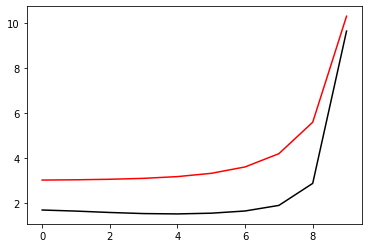

600 54.005839966175714 -0.717227734656424 1.0849541585527682
[1.68333906 1.63539151 1.57365195 1.52509261 1.50983702 1.54212183
 1.64001217 1.88868948 2.86730494 9.63799515]


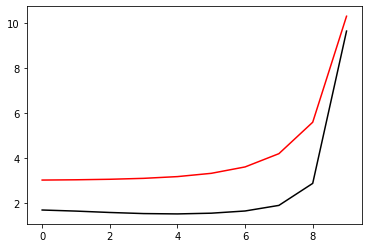

800 54.005839966175245 -0.7172278561155309 1.084954336058929
[1.68334012 1.63539101 1.57365099 1.52509395 1.50983877 1.54212132
 1.64001157 1.88869277 2.86731561 9.63797201]


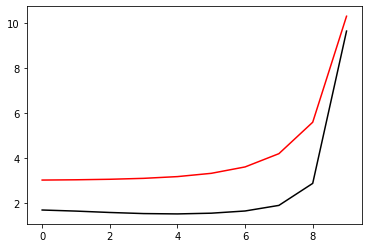

1000 54.00583996617493 -0.7172279721407925 1.0849545100980953
[1.68334088 1.6353915  1.57365115 1.52509433 1.50983931 1.54212044
 1.64001014 1.88869516 2.86732607 9.63795244]


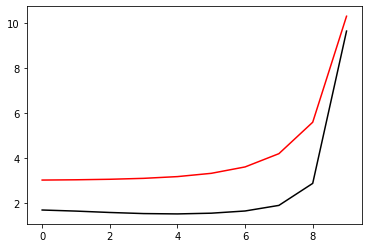

1200 54.00583996617474 -0.7172280558897701 1.0849546361855509
[1.68334132 1.63539196 1.57365159 1.52509469 1.5098394  1.54211951
 1.64000845 1.88869673 2.86733575 9.63793665]


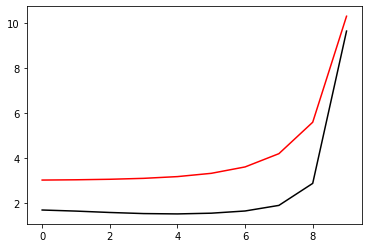

1400 54.00583996617465 -0.7172281008705192 1.0849547041921401
[1.68334153 1.63539226 1.57365196 1.52509501 1.50983935 1.54211857
 1.64000669 1.88869757 2.86734442 9.63792477]


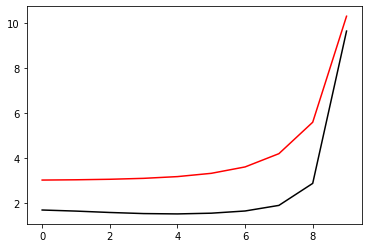

1600 54.005839966174584 -0.717228107565322 1.0849547147967549
[1.68334155 1.63539237 1.57365218 1.52509521 1.50983924 1.54211769
 1.64000499 1.8886978  2.86735205 9.63791645]


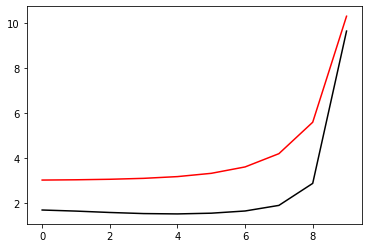

1800 54.00583996617908 -0.7172302613207268 1.0849579041633155
[1.68334201 1.63541272 1.57368215 1.52510865 1.50983526 1.54210569
 1.63999073 1.88868567 2.86734912 9.6378751 ]


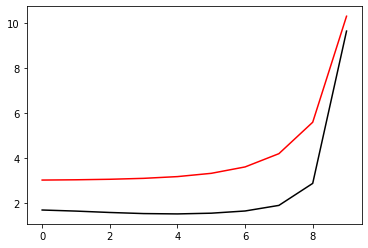

2000 54.00583996617495 -0.7172296798716445 1.0849570670315114
[1.68334475 1.63539907 1.57366445 1.52511037 1.50984937 1.54211803
 1.63999762 1.88868731 2.86734564 9.63787508]


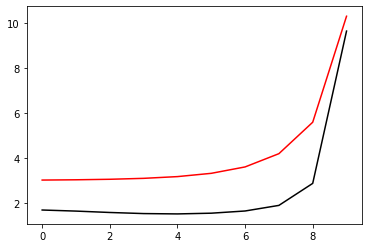

2200 54.00584042656006 -0.7172165303105653 1.0849806951421537
[1.68344664 1.63543964 1.57366712 1.52509407 1.50983174 1.54211021
 1.64000778 1.88873184 2.86745044 9.63807208]


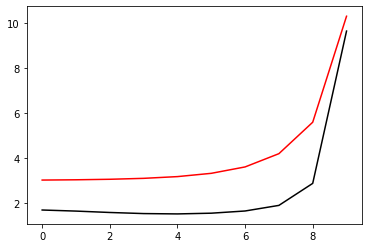

2400 54.005839966176225 -0.7172311249922886 1.0849592329794548
[1.68334603 1.63540802 1.573681   1.52512178 1.50985229 1.54211759
 1.63999225 1.88867624 2.86733462 9.63784855]


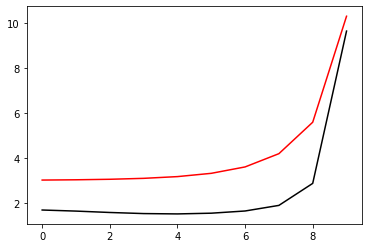

2600 54.005839966175195 -0.717230598819841 1.0849584384279325
[1.68334783 1.63540225 1.5736682  1.52511626 1.50985835 1.54212593
 1.63999762 1.88867675 2.86732982 9.63786161]


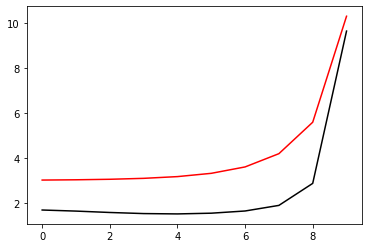

2800 54.00583998767302 -0.7172387087540875 1.0849619806659885
[1.68344603 1.63548441 1.5736718  1.52506127 1.50977706 1.54204043
 1.63992185 1.88862734 2.86733349 9.63792651]


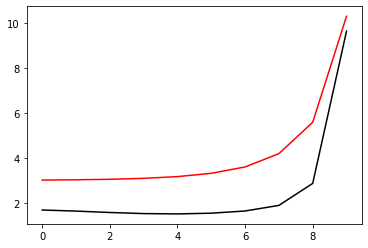

3000 54.00583996617603 -0.717231794835558 1.0849602292516929
[1.68334975 1.63540807 1.57367917 1.5251269  1.50986311 1.54212732
 1.6399958  1.88866792 2.86731421 9.63784242]


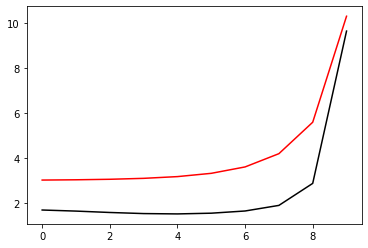

3200 54.005839966175394 -0.7172312718331005 1.0849594424434912
[1.68335023 1.63540457 1.57367066 1.52511986 1.50986448 1.54213312
 1.64000058 1.8886691  2.86731018 9.63785873]


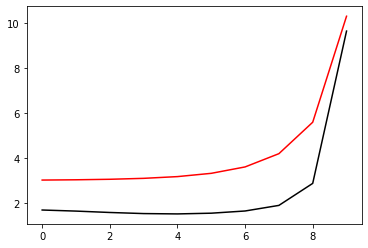

3400 54.005839966186684 -0.717233223479174 1.0849625970346017
[1.68335196 1.63543167 1.57369983 1.52512472 1.50985301 1.54211835
 1.63998658 1.88865643 2.86730212 9.63783745]


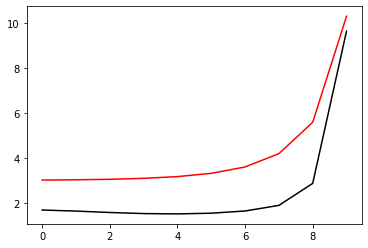

3600 54.00583996617601 -0.7172323076896933 1.0849609918468046
[1.6833524  1.63540907 1.57367866 1.52512898 1.50987007 1.5421352
 1.64       1.8886622  2.86729374 9.63784276]


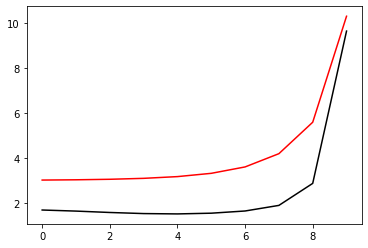

3800 54.005840001529485 -0.7172366221431952 1.0849553646533188
[1.68334742 1.63540163 1.57366768 1.5251175  1.50986391 1.54213412
 1.63999948 1.88865942 2.86728651 9.63785451]


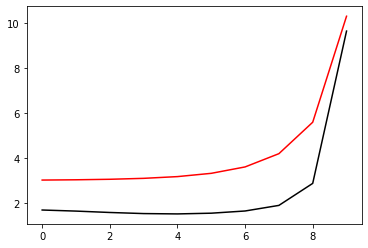

4000 54.00583996617758 -0.717233407661879 1.08496266324111
[1.68335255 1.63541754 1.57369406 1.52513653 1.5098688  1.54213307
 1.6399973  1.88865553 2.86728039 9.63782875]


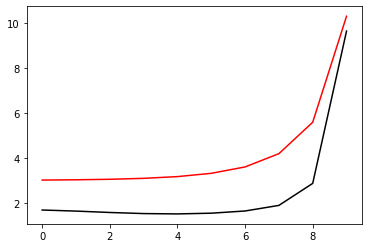

4200 54.0058399661761 -0.7172327135524852 1.0849615961124937
[1.68335433 1.63541019 1.57367886 1.5251302  1.50987465 1.54214137
 1.64000394 1.8886584  2.86727546 9.63784488]


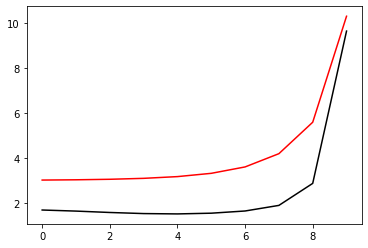

4400 54.00584006741946 -0.7172297359437806 1.0849796501333178
[1.68353119 1.63551249 1.57366765 1.52504544 1.50975494 1.54201433
 1.63989055 1.88858397 2.86727536 9.63794832]


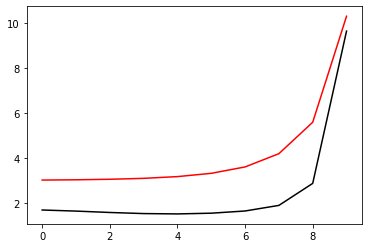

4600 54.005839966176936 -0.7172336347155793 1.0849629777264487
[1.68335535 1.63541521 1.57368882 1.52513854 1.50987635 1.54214076
 1.64000268 1.88865344 2.86726275 9.63783078]


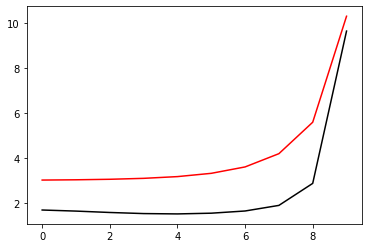

4800 54.00583996617611 -0.7172329963434155 1.0849620172594254
[1.68335571 1.63541104 1.57367903 1.52513068 1.50987741 1.54214612
 1.64000767 1.88865621 2.86726015 9.6378482 ]


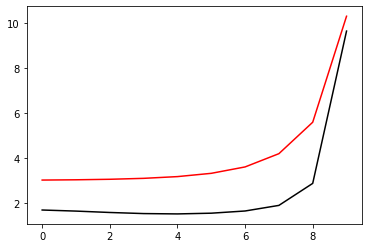

5000 54.005839966224336 -0.7172350777781202 1.0849648522263549
[1.68335813 1.63544042 1.57370717 1.52513212 1.50986235 1.54212818
 1.63999154 1.88864367 2.8672544  9.63783089]


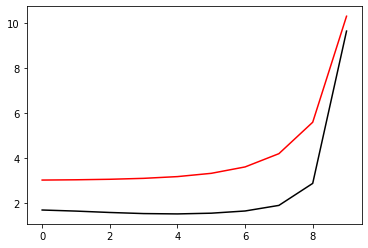

5200 54.00583996617671 -0.7172338081786949 1.0849632322356306
[1.68335721 1.63541472 1.57368591 1.5251382  1.50988106 1.54214663
 1.64000687 1.88865192 2.867248   9.6378348 ]


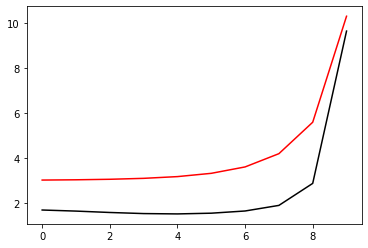

5400 54.00584001186784 -0.7172277010093402 1.0849678157562406
[1.68336223 1.63541718 1.57368465 1.52513637 1.50988463 1.54215528
 1.64001647 1.88866044 2.86725301 9.63785731]


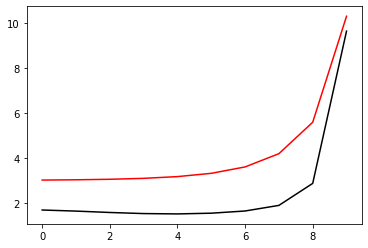

5600 54.00583996617816 -0.7172347026032833 1.0849645950782452
[1.68335699 1.63542208 1.57369954 1.52514427 1.50987882 1.5421438
 1.64000422 1.88864732 2.86723839 9.63782258]


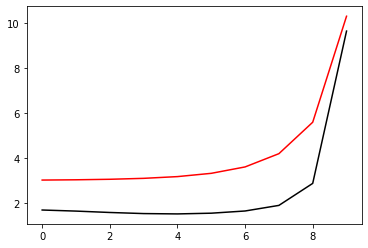

5800 54.005839966176644 -0.7172339492448945 1.0849634408886377
[1.68335845 1.6354148  1.5736845  1.52513741 1.50988372 1.54215123
 1.64001044 1.88865084 2.86723549 9.63783919]


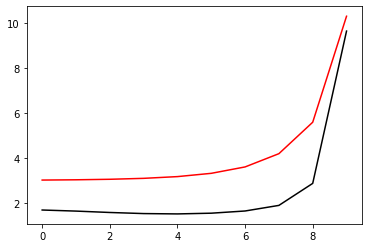

6000 54.00583996993768 -0.7172400582125732 1.084970234547567
[1.68347188 1.63550007 1.57368076 1.5250702  1.50978769 1.54205053
 1.63992183 1.8885942  2.86723843 9.63791398]


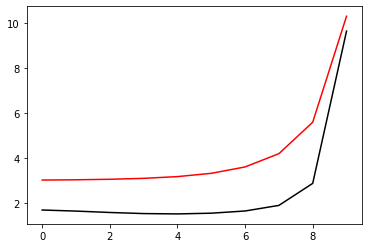

6200 54.00583996617753 -0.7172348276736343 1.0849647576666652
[1.68335941 1.63541951 1.57369396 1.52514571 1.50988547 1.54215011
 1.64000866 1.88864648 2.86722505 9.6378239 ]


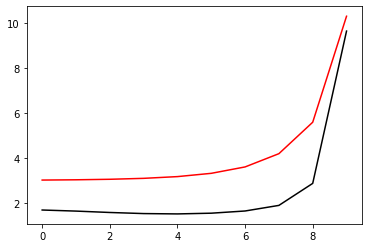

6400 54.00583996617673 -0.7172341307266016 1.0849637109121113
[1.68335946 1.63541529 1.57368428 1.52513739 1.50988566 1.54215488
 1.64001334 1.88864967 2.86722417 9.63784208]


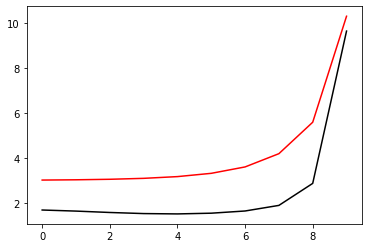

6600 54.005839966277385 -0.7172358555540258 1.0849670242554805
[1.68336397 1.63544834 1.57371362 1.52513774 1.50986866 1.54213482
 1.63999557 1.88863679 2.86722058 9.63782652]


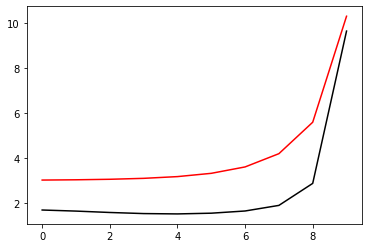

6800 54.00583996617735 -0.717234889398982 1.0849648468679758
[1.68336066 1.63541886 1.57369127 1.52514485 1.50988862 1.54215435
 1.64001186 1.88864587 2.8672148  9.63782822]


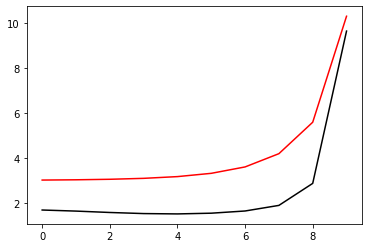

7000 54.005839966177064 -0.7172342068700439 1.0849638610263528
[1.68336007 1.63541555 1.57368403 1.52513707 1.5098865  1.54215734
 1.64001583 1.88864924 2.86721571 9.63784575]


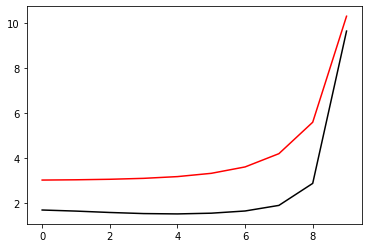

7200 54.005839966179636 -0.7172358296343322 1.084966237438267
[1.68335966 1.63542849 1.57370763 1.52514974 1.50988375 1.54214917
 1.64000743 1.88864106 2.86720826 9.63781596]


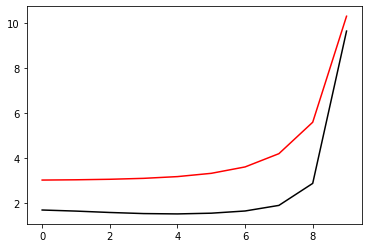

7400 54.0058399661773 -0.7172349611298652 1.0849649522128726
[1.68336157 1.63541871 1.5736898  1.52514397 1.50989064 1.54215778
 1.64001451 1.88864531 2.86720602 9.63783184]


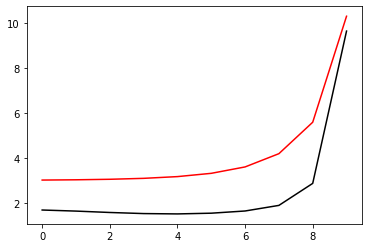

7600 54.00583997059331 -0.7172455341145287 1.084981951810388
[1.68362939 1.63550933 1.57363377 1.52500184 1.50971068 1.54197839
 1.6398708  1.88858247 2.8672856  9.6381192 ]


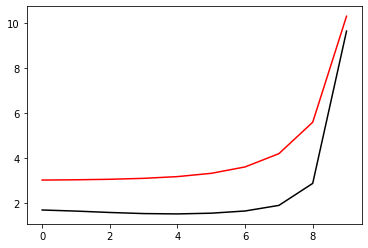

7800 54.0058399661783 -0.717235741283472 1.084966123495305
[1.68336169 1.63542381 1.57370046 1.52515124 1.5098899  1.54215501
 1.64001194 1.88864161 2.86719923 9.63781819]


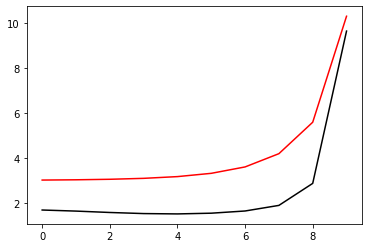

8000 54.00583996617725 -0.7172349760046104 1.084964973306375
[1.6833621  1.63541854 1.57368863 1.52514282 1.50989151 1.54216042
 1.6400169  1.88864517 2.86719906 9.63783622]


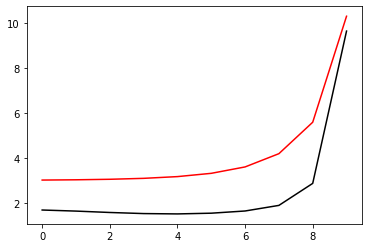

8200 54.00583996672915 -0.7172380573814778 1.0849684721806128
[1.68338178 1.63546662 1.57371184 1.52512774 1.50985802 1.54212459
 1.63998591 1.88862542 2.86720032 9.63784208]


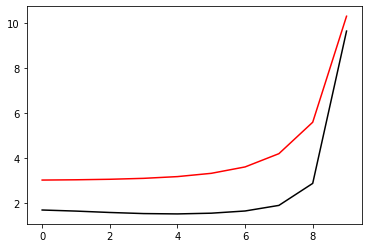

8400 54.005839966177874 -0.7172356493192157 1.0849659823551598
[1.6833629  1.63542194 1.57369561 1.5251497  1.50989329 1.54215911
 1.64001509 1.88864192 2.86719225 9.63782322]


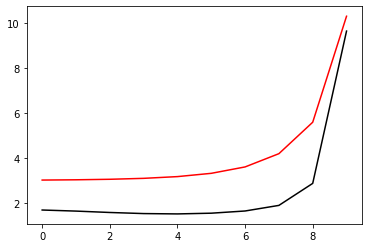

8600 54.00583996617715 -0.7172349328840053 1.084964909207545
[1.68336234 1.63541823 1.5736875  1.52514147 1.50989153 1.54216229
 1.64001903 1.88864546 2.86719396 9.63784111]


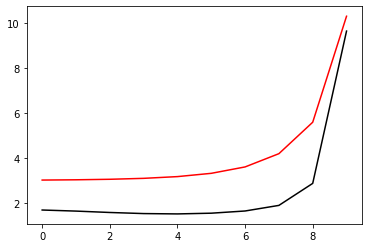

8800 54.00583996618107 -0.7172364897282975 1.0849673278002148
[1.68336159 1.63543287 1.57371224 1.52515265 1.50988702 1.54215298
 1.6400099  1.88863727 2.86718804 9.63781291]


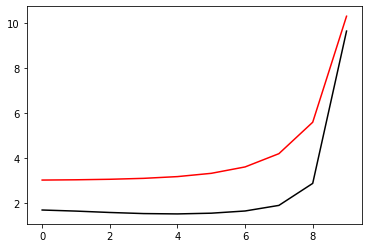

9000 54.005839966177696 -0.7172355962426111 1.0849659006968035
[1.68336359 1.63542115 1.57369299 1.52514789 1.50989498 1.54216221
 1.6400175  1.88864201 2.86718638 9.63782793]


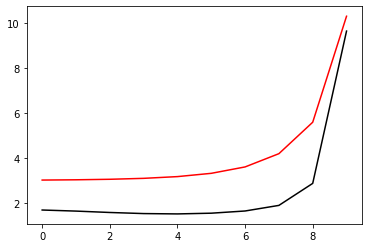

9200 54.00584157791247 -0.7172144393027765 1.0850184499956728
[1.68366881 1.63553593 1.573665   1.52503826 1.50975267 1.542027
 1.6399271  1.88864579 2.8673516  9.63822902]


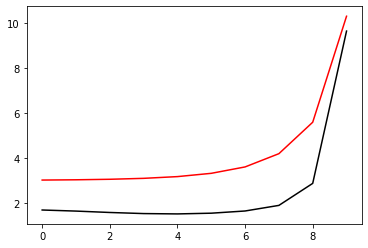

9400 54.00583996617871 -0.717236313582804 1.0849669801679904
[1.68336345 1.63542616 1.57370354 1.52515456 1.5098936  1.54215901
 1.64001467 1.88863863 2.86718139 9.63781492]


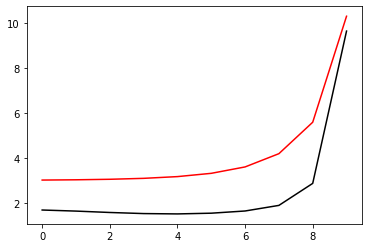

9600 54.00583996617756 -0.7172355154846078 1.0849657788500977
[1.68336386 1.63542058 1.5736912  1.52514606 1.50989531 1.54216437
 1.64001958 1.88864236 2.86718198 9.63783311]


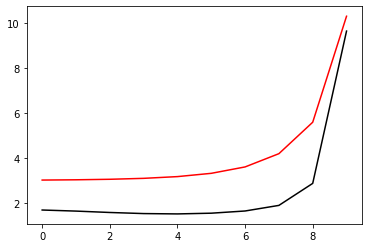

9800 54.00583996777074 -0.717239111923618 1.0849689242530864
[1.68338804 1.63547174 1.57371372 1.52512881 1.50985929 1.54212602
 1.63998656 1.88862194 2.86718526 9.63784368]


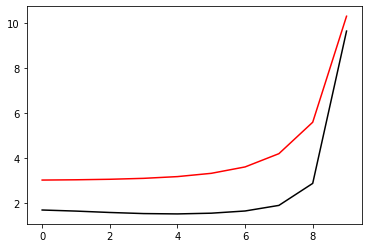

10000 54.005839966178264 -0.7172361572207866 1.0849667407271528
[1.68336453 1.6354239  1.57369812 1.52515275 1.50989679 1.54216278
 1.64001755 1.88863927 2.86717642 9.63782012]


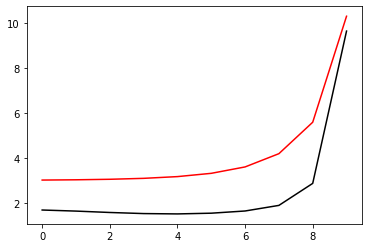

10200 54.005839966177476 -0.7172354129789973 1.0849656246177517
[1.68336391 1.63542004 1.57368977 1.52514433 1.50989494 1.54216585
 1.6400214  1.88864293 2.86717882 9.63783831]


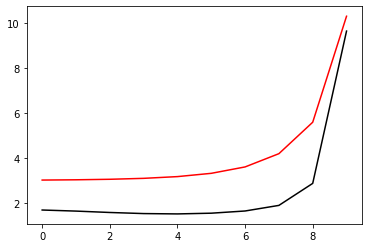

10400 54.00583996618141 -0.7172369582935115 1.0849680220513163
[1.68336294 1.63543552 1.5737151  1.52515483 1.50988937 1.54215559
 1.64001161 1.88863475 2.86717425 9.63781105]


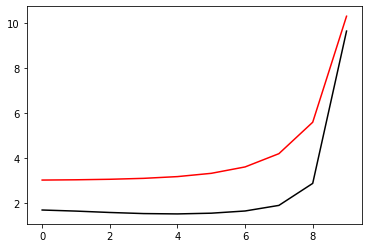

10600 54.00583996617801 -0.7172360240227681 1.084966539534489
[1.68336494 1.63542279 1.57369514 1.52515055 1.50989793 1.54216519
 1.6400195  1.88863977 2.86717304 9.63782546]


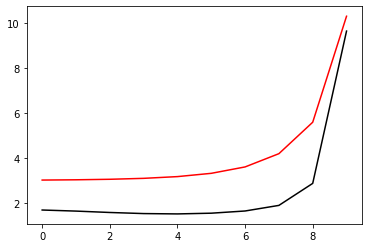

10800 54.0058405790577 -0.7172613128756778 1.084950781750799
[1.68360636 1.63552203 1.57370575 1.52511248 1.50984517 1.54212532
 1.64001808 1.88871163 2.86736553 9.6382014 ]


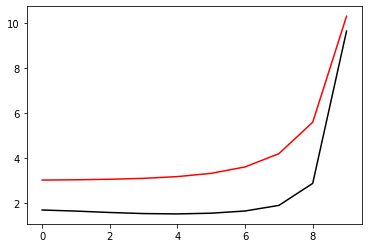

11000 54.00583996617957 -0.7172369311101578 1.0849679109477106
[1.68336432 1.63543005 1.57370989 1.52515842 1.50989496 1.54215993
 1.64001484 1.88863542 2.86716915 9.63780862]


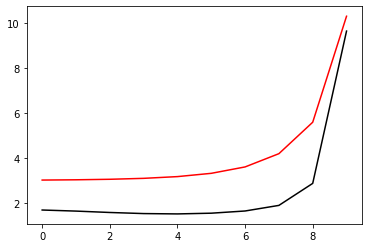

11200 54.005839966178016 -0.7172360707163076 1.0849666085354497
[1.68336539 1.6354228  1.57369458 1.52515022 1.50989897 1.54216683
 1.64002055 1.88863937 2.86716914 9.63782663]


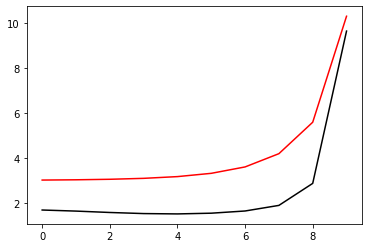

11400 54.005841293320145 -0.7172777173147464 1.084957680293548
[1.68362716 1.63548314 1.57360457 1.52497378 1.50968692 1.54196199
 1.63986346 1.88858229 2.86728383 9.63818889]


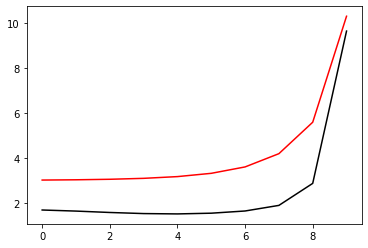

11600 54.005839966179174 -0.7172368510550836 1.084967784146292
[1.68336497 1.63542844 1.57370679 1.52515797 1.50989682 1.54216218
 1.64001672 1.88863576 2.8671658  9.63781142]


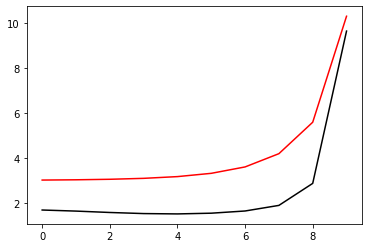

11800 54.00583996617792 -0.7172360229697431 1.0849665367176224
[1.68336546 1.63542252 1.57369377 1.52514929 1.50989889 1.54216778
 1.64002169 1.88863962 2.86716686 9.63782964]


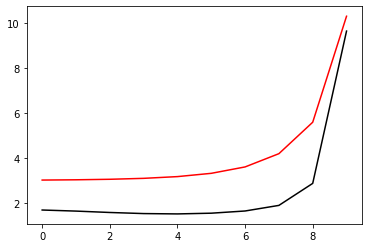

12000 54.00583996777273 -0.7172393381545207 1.084974647316043
[1.6834707  1.63551059 1.57370012 1.52509459 1.50981627 1.54208095
 1.63994687 1.88859578 2.86718104 9.63790415]


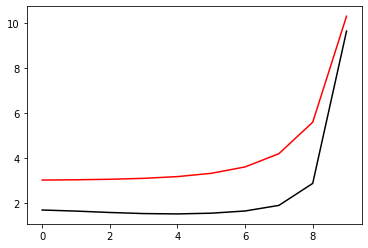

12200 54.00583996617878 -0.7172367227580736 1.0849675875034115
[1.68336576 1.63542658 1.5737026  1.52515683 1.50989918 1.54216479
 1.64001875 1.88863639 2.86716289 9.63781475]


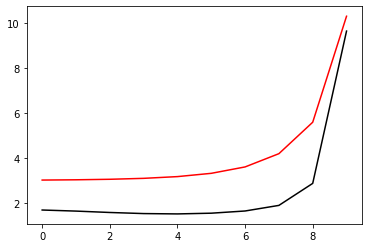

12400 54.00583996617783 -0.7172359344781913 1.0849664039676359
[1.68336546 1.63542207 1.57369263 1.52514795 1.50989857 1.54216874
 1.64002289 1.88864013 2.86716519 9.63783327]


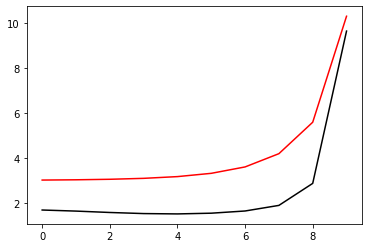

12600 54.00583996624287 -0.7172380407073639 1.0849692192705336
[1.68336955 1.63545513 1.57372131 1.52514696 1.50987988 1.54214689
 1.64000362 1.88862692 2.867164   9.63781785]


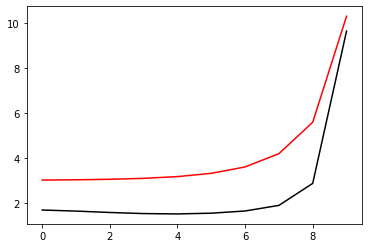

12800 54.005839966178456 -0.7172365422829905 1.0849673147487107
[1.68336612 1.6354251  1.57369902 1.52515461 1.50990037 1.54216684
 1.64002044 1.8886372  2.86716124 9.63781976]


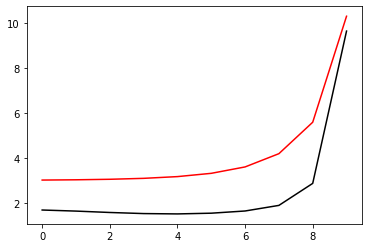

13000 54.00583996617776 -0.7172357843312647 1.08496619212362
[1.68336525 1.63542144 1.57369132 1.5251463  1.50989769 1.54216923
 1.64002397 1.88864101 2.86716484 9.63783771]


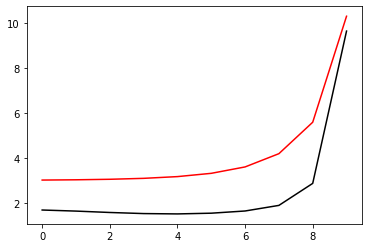

13200 54.005839966180886 -0.7172373092154819 1.0849685260110649
[1.6833646  1.63543463 1.57371501 1.52515829 1.50989411 1.54216037
 1.64001514 1.88863319 2.86715971 9.63780833]


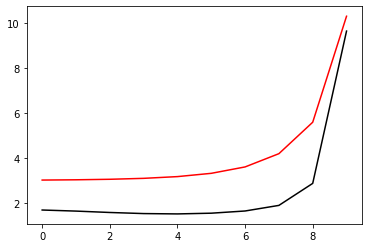

13400 54.00583996617822 -0.7172363919393362 1.0849670885474916
[1.6833663  1.63542411 1.5736965  1.5251524  1.50990079 1.5421686
 1.64002197 1.88863788 2.86715968 9.63782438]


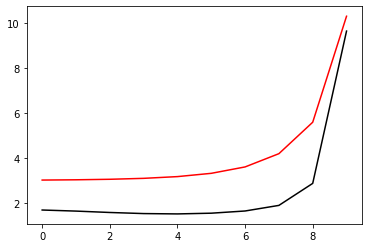

13600 54.005841107471 -0.7172186315732231 1.0850094600753457
[1.68370588 1.63557003 1.57368988 1.5250566  1.50976605 1.54203532
 1.63992775 1.8886314  2.8673074  9.63819337]


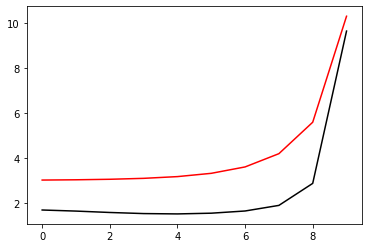

13800 54.00583996617928 -0.7172370746324287 1.0849681186910942
[1.68336597 1.63542902 1.57370712 1.52515916 1.50989903 1.54216464
 1.64001851 1.88863469 2.86715705 9.63781069]


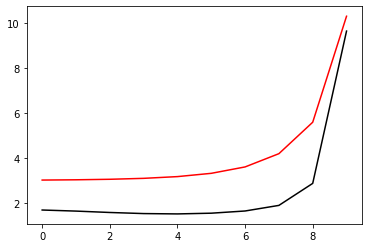

14000 54.005839966178094 -0.7172362407756907 1.084966861785037
[1.68336626 1.63542331 1.57369461 1.52515038 1.50990049 1.54216979
 1.64002324 1.88863857 2.86715875 9.63782914]


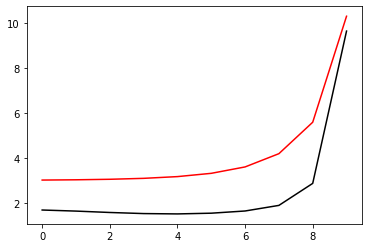

14200 54.00583997011441 -0.7172409621962517 1.0849704245472476
[1.68340561 1.63548321 1.57371166 1.52512186 1.50985133 1.54211844
 1.63997974 1.88861363 2.86716836 9.6378597 ]


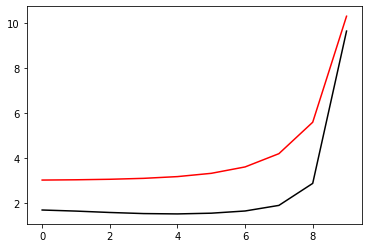

14400 54.00583996617879 -0.7172368389122113 1.0849677593100968
[1.68336658 1.63542663 1.57370188 1.52515705 1.50990114 1.5421672
 1.64002054 1.88863575 2.86715572 9.63781598]


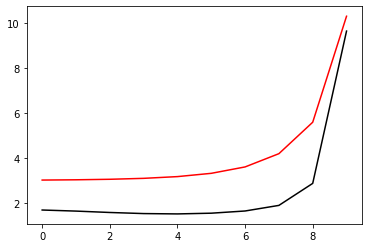

14600 54.00583996617793 -0.7172360562084464 1.084966585461154
[1.68336599 1.63542248 1.5736929  1.5251483  1.50989951 1.54217039
 1.64002435 1.88863956 2.86715892 9.63783433]


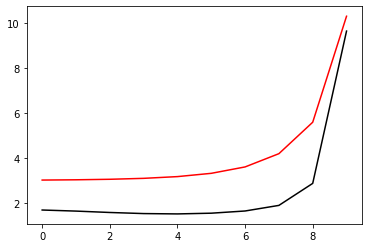

14800 54.00583996618648 -0.7172378081340097 1.08496913426322
[1.68336527 1.63544338 1.57372087 1.52515582 1.5098901  1.54215692
 1.64001208 1.88863034 2.86715621 9.63780946]


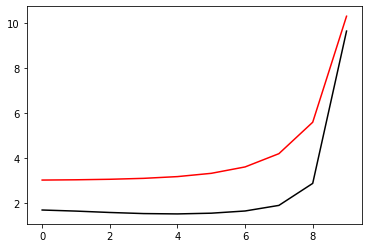

15000 54.00583996617852 -0.7172366698680244 1.0849675044254556
[1.68336686 1.63542536 1.57369876 1.52515483 1.50990204 1.54216904
 1.64002199 1.88863648 2.86715465 9.63782039]


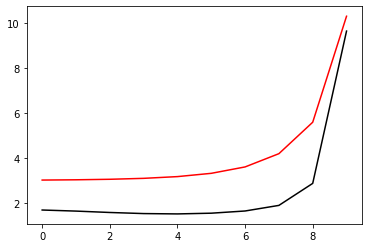

15200 54.00584002126067 -0.7172419564034114 1.0849603324521584
[1.68335992 1.63541598 1.57368576 1.5251408  1.50989265 1.54216478
 1.6400193  1.88863441 2.86715305 9.63783232]


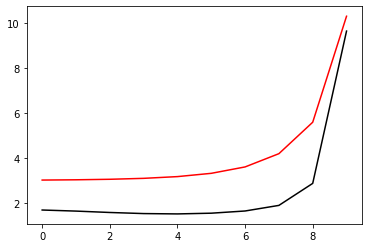

15400 54.00583996618008 -0.7172374103395642 1.0849686385737327
[1.68336572 1.63543261 1.57371286 1.52516034 1.50989756 1.5421635
 1.64001744 1.88863287 2.86715305 9.63780745]


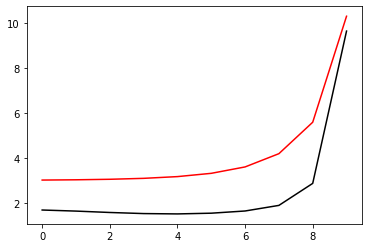

15600 54.005839966178335 -0.7172365164818523 1.0849672740970868
[1.68336688 1.63542449 1.57369664 1.52515276 1.50990202 1.54217035
 1.64002324 1.88863714 2.86715386 9.63782492]


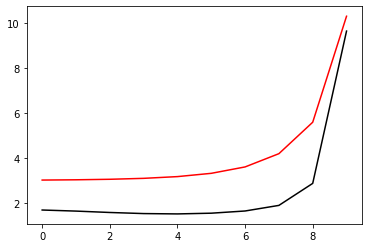

15800 54.005840254861944 -0.7172566329409191 1.0849648640000986
[1.6835983  1.6355248  1.57365462 1.52502247 1.50972875 1.54198835
 1.63986145 1.88853186 2.86715529 9.63796996]


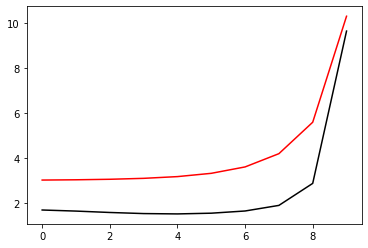

16000 54.00583996617928 -0.7172372032935388 1.0849683061661275
[1.68336665 1.6354291  1.57370687 1.52516007 1.50990079 1.54216626
 1.64001957 1.88863394 2.86715169 9.63781043]


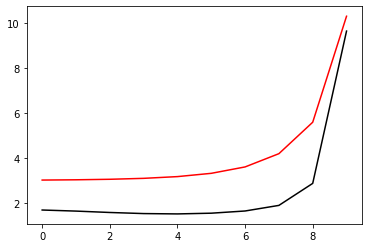

16200 54.00583996617817 -0.7172363722528489 1.0849670579636943
[1.68336674 1.63542378 1.5736951  1.52515104 1.50990154 1.54217106
 1.6400241  1.88863781 2.86715385 9.63782901]


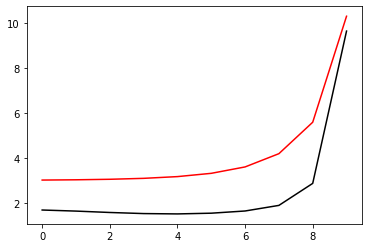

16400 54.005839966971635 -0.717239498716207 1.0849739336485509
[1.68342875 1.63549908 1.57371324 1.52511609 1.50984239 1.54210892
 1.63997184 1.8886094  2.86716982 9.63787775]


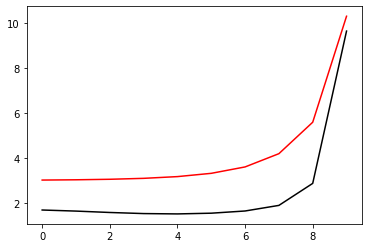

16600 54.0058399661791 -0.7172371491859484 1.0849682237699037
[1.68336723 1.63542808 1.57370438 1.52515951 1.50990255 1.54216793
 1.64002065 1.88863411 2.86714995 9.63781161]


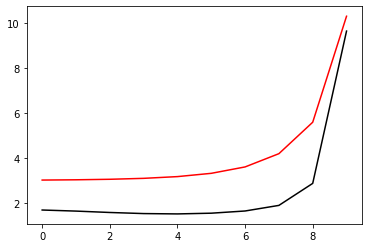

16800 54.00583996617813 -0.7172363424160446 1.0849670130678433
[1.6833668  1.6354236  1.57369456 1.52515041 1.50990155 1.54217175
 1.64002472 1.88863788 2.86715272 9.63783059]


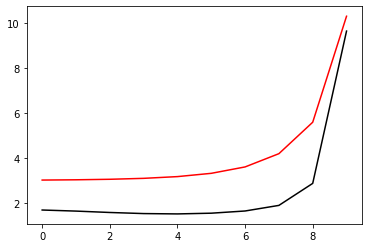

17000 54.00583996685342 -0.7172383449645358 1.0849719141781664
[1.68338879 1.63547709 1.57372344 1.52513802 1.50986815 1.54213492
 1.63999294 1.8886183  2.86715665 9.63783323]


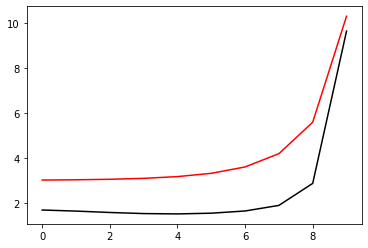

17200 54.005839966178996 -0.7172371132838792 1.0849681688056168
[1.68336747 1.63542763 1.57370318 1.52515892 1.50990326 1.54216888
 1.64002137 1.88863421 2.86714866 9.637813  ]


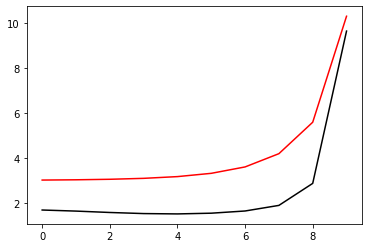

17400 54.00583996617813 -0.7172363188909006 1.0849669777450457
[1.68336682 1.63542348 1.57369422 1.52515    1.50990145 1.54217213
 1.64002519 1.888638   2.86715188 9.63783188]


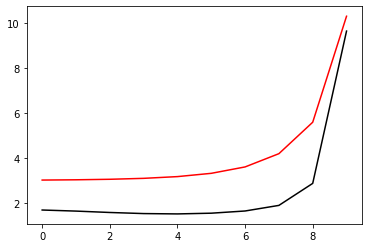

17600 54.005839966258755 -0.7172383033865246 1.0849706645541244
[1.68337349 1.63546163 1.5737251  1.52514793 1.50987997 1.54214689
 1.6400029  1.88862282 2.86715094 9.63781591]


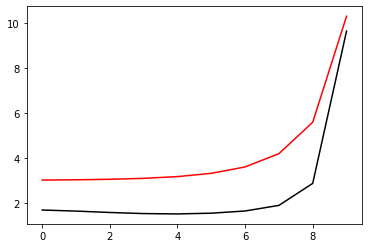

17800 54.0058399661789 -0.717237069180319 1.0849681021018076
[1.68336763 1.63542722 1.57370211 1.52515821 1.5099037  1.54216972
 1.64002205 1.88863438 2.86714756 9.63781463]


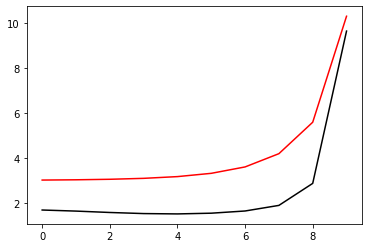

18000 54.005839966178094 -0.7172362844987101 1.0849669262067878
[1.68336679 1.63542332 1.57369384 1.52514951 1.50990124 1.54217243
 1.64002567 1.88863821 2.86715126 9.63783332]


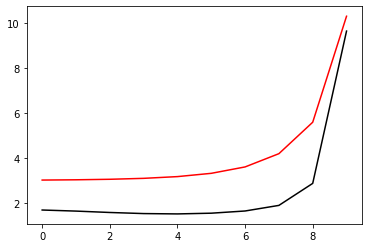

18200 54.00583996619649 -0.7172383042545458 1.0849698123164775
[1.68336698 1.6354492  1.57372456 1.52515564 1.50988882 1.54215562
 1.64001052 1.88862721 2.86714892 9.63780833]


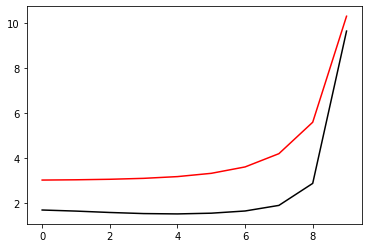

18400 54.00583996617883 -0.7172370197392831 1.0849680274347218
[1.68336776 1.63542682 1.57370106 1.52515746 1.5099041  1.5421705
 1.64002263 1.88863453 2.86714667 9.63781639]


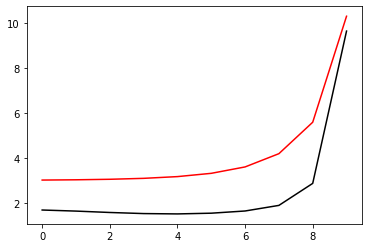

18600 54.005839966178044 -0.717236245234297 1.0849668674727853
[1.68336675 1.63542315 1.57369345 1.52514902 1.509901   1.54217267
 1.64002607 1.88863842 2.86715083 9.63783481]


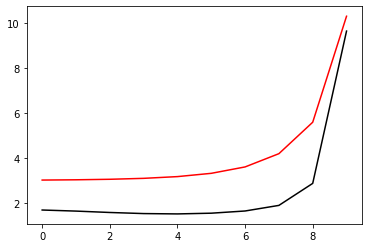

18800 54.00583996618205 -0.7172379643852665 1.084969477643507
[1.68336586 1.63544107 1.5737212  1.52515966 1.50989424 1.54216079
 1.64001488 1.88862943 2.86714688 9.63780525]


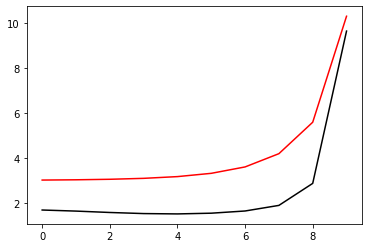

19000 54.005839966178705 -0.7172369279914171 1.0849678896230124
[1.68336778 1.63542628 1.57369976 1.52515625 1.50990412 1.54217124
 1.64002339 1.88863498 2.86714623 9.637819  ]


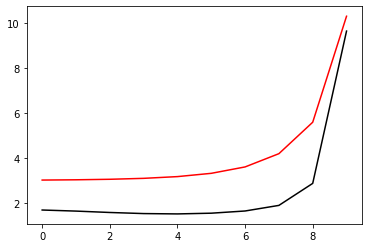

19200 54.00583996711839 -0.7172353764347612 1.0849675370902299
[1.68336737 1.6354236  1.57369361 1.52514898 1.5099012  1.54217352
 1.64002736 1.88863974 2.86715179 9.63783775]


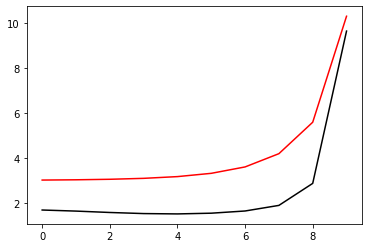

19400 54.005839966180574 -0.7172377282560654 1.0849690858271535
[1.68336628 1.6354346  1.57371559 1.52516187 1.50989846 1.54216444
 1.64001792 1.88863111 2.86714565 9.63780544]


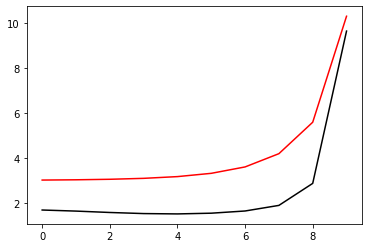

19600 54.00583996617855 -0.7172367930224898 1.084967687232869
[1.68336768 1.63542558 1.57369821 1.52515468 1.50990386 1.54217188
 1.64002409 1.88863561 2.86714645 9.63782251]


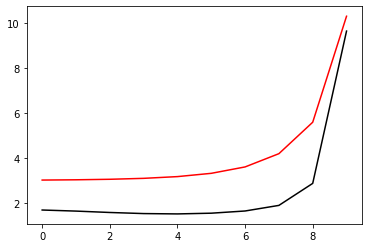

19800 54.005841603865846 -0.7172157273614672 1.085017730704915
[1.68372546 1.63557281 1.57369678 1.52506868 1.50978457 1.54206245
 1.63996603 1.88868308 2.86737344 9.63830799]


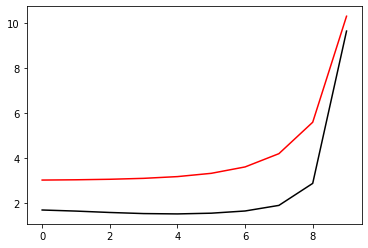

20000 54.00583996617977 -0.7172375464035731 1.0849688255522298
[1.68336713 1.63543127 1.57371049 1.52516208 1.50990139 1.54216696
 1.6400199  1.88863215 2.86714464 9.63780694]


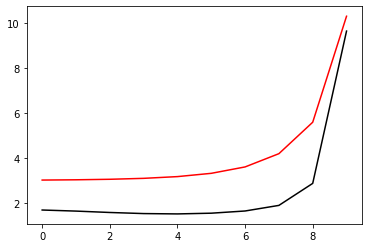

20200 54.005839966178435 -0.717236678776374 1.0849675159815817
[1.6833676  1.635425   1.57369692 1.52515326 1.50990353 1.54217252
 1.64002483 1.88863618 2.86714649 9.63782553]


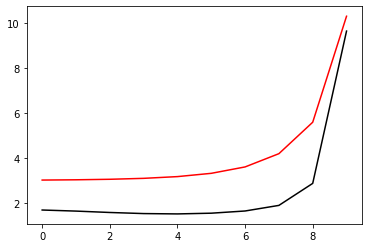

20400 54.0058400074443 -0.7172358784633905 1.0849804479691287
[1.68349767 1.63552155 1.57370094 1.52509191 1.50981173 1.54207536
 1.63994028 1.88858577 2.86716087 9.63791093]


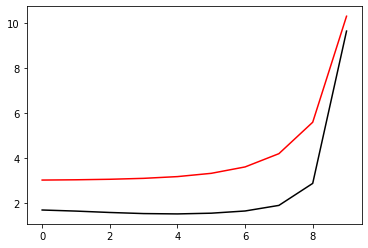

20600 54.00583996617923 -0.7172373077584346 1.084968460916709
[1.68336762 1.63542887 1.57370555 1.52516028 1.50990313 1.54216905
 1.64002165 1.88863331 2.8671444  9.6378115 ]


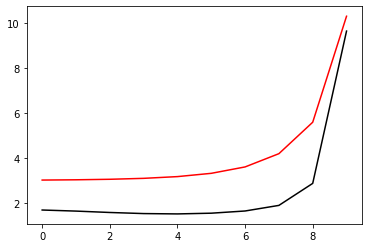

20800 54.005839966178236 -0.7172364870094416 1.0849672289661727
[1.68336728 1.63542416 1.57369524 1.52515124 1.50990249 1.54217286
 1.64002569 1.88863722 2.86714753 9.63783022]


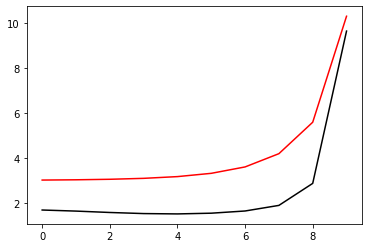

21000 54.005839966192916 -0.7172384347677606 1.084970162172884
[1.68337158 1.63545735 1.57372373 1.52515002 1.50988365 1.5421509
 1.64000635 1.88862419 2.86714715 9.63781515]


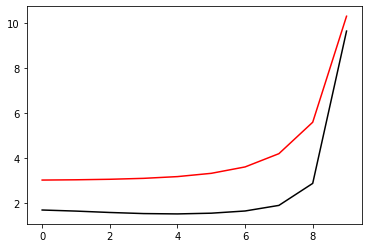

21200 54.00583996617881 -0.7172370450443756 1.0849680653940226
[1.68336779 1.63542699 1.57370136 1.52515756 1.50990395 1.54217067
 1.64002306 1.88863456 2.86714502 9.63781705]


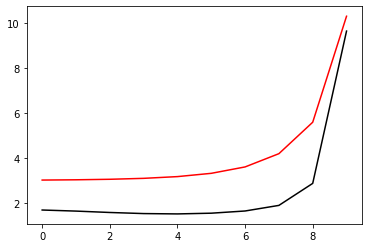

21400 54.00583996617806 -0.7172362634458013 1.0849669001871216
[1.68336683 1.63542323 1.57369353 1.52514909 1.50990108 1.54217286
 1.64002645 1.8886385  2.86714943 9.63783521]


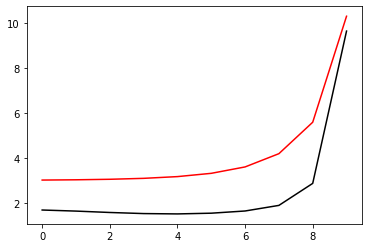

21600 54.00583996618128 -0.7172378856039587 1.0849693279382062
[1.68336607 1.63543756 1.57371865 1.52516126 1.50989685 1.5421631
 1.64001677 1.88863021 2.86714474 9.63780455]


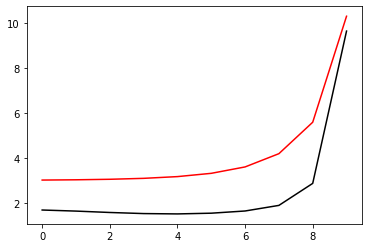

21800 54.005839966178655 -0.7172369009365673 1.0849678487750478
[1.68336787 1.63542608 1.57369915 1.52515569 1.50990429 1.54217187
 1.64002396 1.88863516 2.867145   9.63782048]


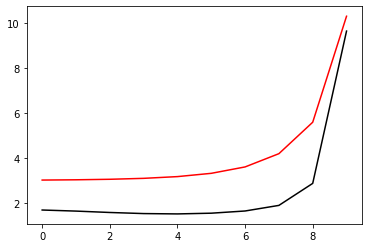

22000 54.005851917356836 -0.717332820214824 1.0848892584961263
[1.68341135 1.63537037 1.57358214 1.52500637 1.50974878 1.54203127
 1.63991719 1.88858933 2.86719796 9.63802282]


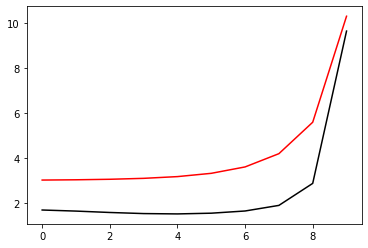

22200 54.00583996618006 -0.7172376586763496 1.0849689903355073
[1.68336696 1.63543254 1.5737126  1.52516242 1.50990066 1.54216639
 1.64001941 1.88863159 2.86714368 9.63780584]


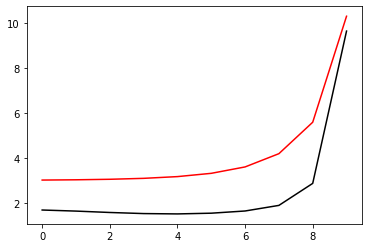

22400 54.00583996617851 -0.7172367650668394 1.0849676450721826
[1.68336778 1.63542538 1.5736976  1.52515406 1.50990397 1.5421726
 1.64002475 1.88863575 2.86714517 9.63782405]


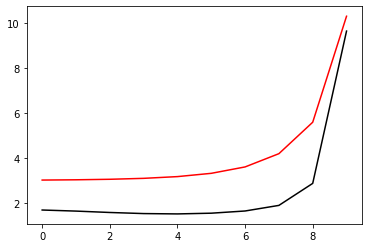

22600 54.005839971919464 -0.7172400596074927 1.0849786668491308
[1.68356887 1.63553385 1.57368185 1.52505874 1.50976984 1.54202979
 1.6398973  1.88855341 2.86714955 9.63793888]


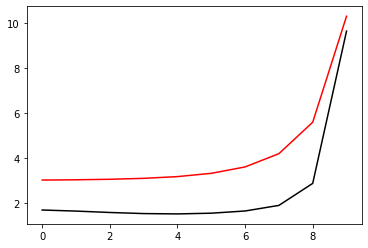

22800 54.00583996617933 -0.7172373541479086 1.0849685306507253
[1.68336748 1.63542935 1.57370662 1.52516067 1.50990266 1.54216859
 1.64002136 1.88863311 2.86714411 9.6378111 ]


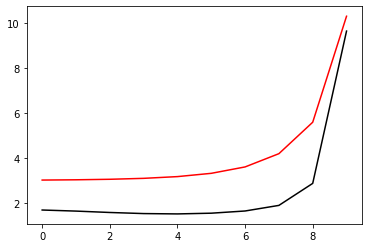

23000 54.00583996617826 -0.7172365242462863 1.084967284690721
[1.68336734 1.63542432 1.57369557 1.52515164 1.50990268 1.54217279
 1.64002558 1.88863706 2.86714706 9.63782957]


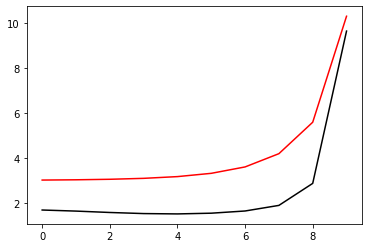

23200 54.005839967150145 -0.7172403772540301 1.0849715004464842
[1.68339564 1.63548359 1.5737222  1.52513237 1.50986087 1.54212733
 1.63998619 1.88861288 2.867152   9.63783919]


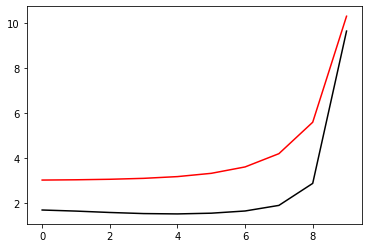

23400 54.00583996617928 -0.7172373946312738 1.0849685897607402
[1.68336811 1.63542887 1.57370525 1.5251611  1.50990474 1.54216978
 1.64002165 1.88863276 2.86714267 9.63780957]


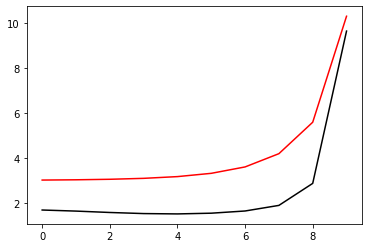

23600 54.005839966178314 -0.7172365799912845 1.0849673677897251
[1.68336758 1.63542449 1.57369567 1.52515186 1.50990333 1.5421735
 1.64002568 1.88863651 2.86714568 9.63782891]


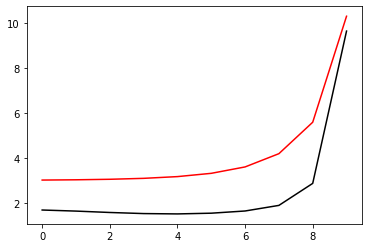

23800 54.00583996735186 -0.7172404016151226 1.084971385571991
[1.68339803 1.63548175 1.57371783 1.52512981 1.50985997 1.5421273
 1.63998646 1.88861338 2.86715291 9.63784648]


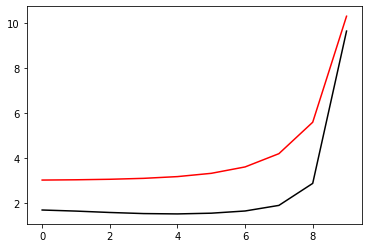

24000 54.00583996617912 -0.7172372577648641 1.084968384675389
[1.68336793 1.63542821 1.57370391 1.52515966 1.50990414 1.54217015
 1.64002241 1.88863342 2.8671431  9.63781314]


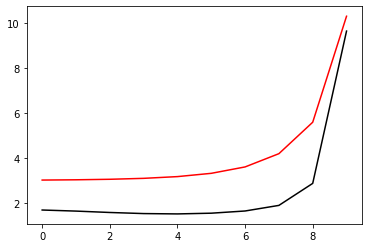

24200 54.00583996617822 -0.7172364551761911 1.0849671811876802
[1.68336728 1.63542399 1.57369482 1.52515074 1.50990239 1.54217328
 1.64002616 1.88863732 2.86714675 9.63783176]


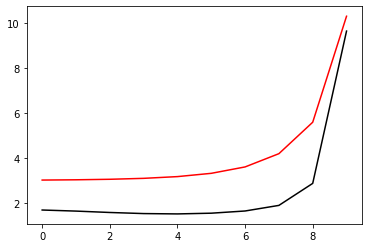

24400 54.00583996621361 -0.7172382345104771 1.0849702840071036
[1.68336909 1.63545335 1.57372502 1.52515381 1.50988733 1.54215449
 1.64000951 1.88862585 2.86714581 9.63781122]


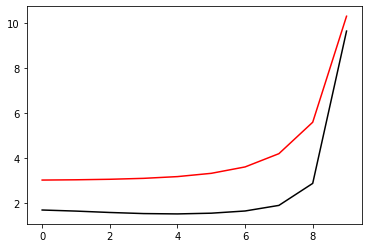

24600 54.005839966178904 -0.7172371053474271 1.08496815534256
[1.68336802 1.63542718 1.57370155 1.52515794 1.50990453 1.54217113
 1.64002325 1.8886342  2.86714345 9.63781634]


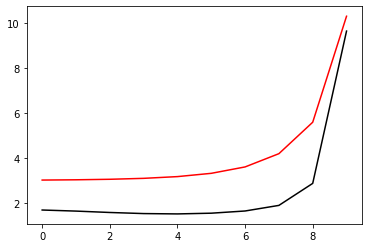

24800 54.005839966178115 -0.7172363254684063 1.0849669862108642
[1.68336702 1.63542345 1.57369382 1.52514946 1.50990153 1.54217328
 1.64002664 1.88863812 2.86714785 9.63783464]


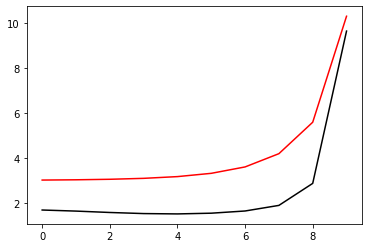

25000 54.00583996618158 -0.717237862206488 1.0849693494956256
[1.68336597 1.63543834 1.57371903 1.52516053 1.50989618 1.5421628
 1.64001665 1.8886301  2.86714441 9.63780625]


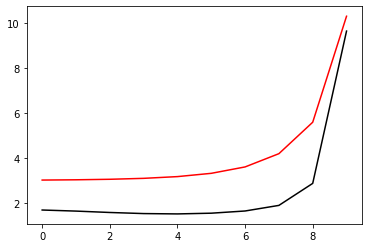

25200 54.00583996617865 -0.7172368886797111 1.084967830480094
[1.68336783 1.63542604 1.57369912 1.52515561 1.50990413 1.54217183
 1.64002409 1.88863526 2.86714473 9.6378212 ]


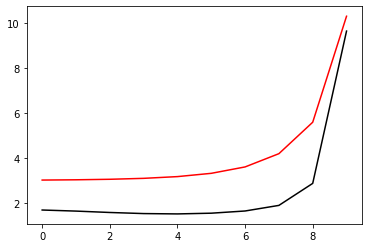

25400 54.00584440409597 -0.7172988929980563 1.0849222633872326
[1.68353631 1.63545579 1.57364223 1.52505173 1.50978728 1.5420699
 1.63996333 1.88865182 2.86728825 9.6381534 ]


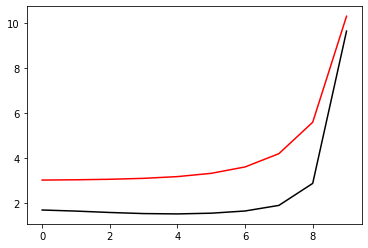

25600 54.00583996617998 -0.7172376177287666 1.0849689255703543
[1.68336692 1.6354322  1.5737121  1.52516225 1.50990065 1.54216637
 1.64001951 1.88863185 2.86714394 9.63780675]


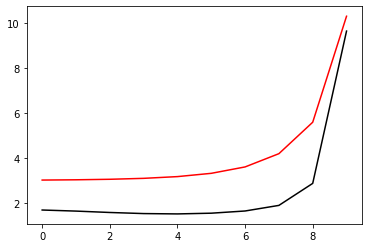

25800 54.00583996617847 -0.7172367303510377 1.084967593167235
[1.68336768 1.63542524 1.57369738 1.52515378 1.50990375 1.54217247
 1.64002476 1.888636   2.8671456  9.63782479]


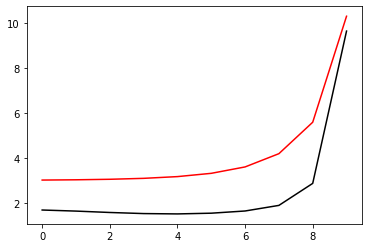

26000 54.00583999979832 -0.7172373947382747 1.0849819350179735
[1.68357696 1.6355392  1.57368375 1.52505847 1.50976845 1.54202809
 1.63989606 1.88855352 2.86715206 9.63794393]


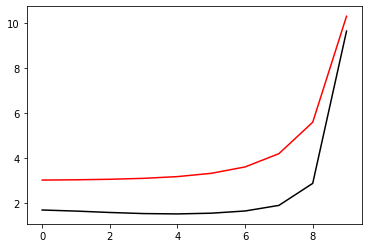

26200 54.00583996617946 -0.7172374180828287 1.0849686263856775
[1.68336758 1.63542969 1.57370727 1.52516122 1.50990283 1.54216851
 1.64002119 1.88863286 2.86714364 9.63780955]


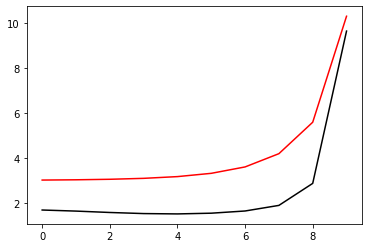

26400 54.00583996617831 -0.7172365811936523 1.0849673698292586
[1.68336748 1.63542455 1.57369595 1.52515211 1.50990306 1.54217293
 1.6400255  1.88863676 2.86714635 9.63782834]


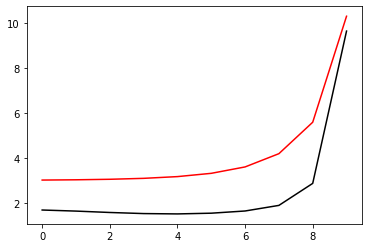

26600 54.00583996663111 -0.7172397368383876 1.0849711074894117
[1.68339269 1.63547772 1.57371969 1.52513466 1.50986577 1.54213296
 1.63999126 1.88861626 2.86715208 9.63783961]


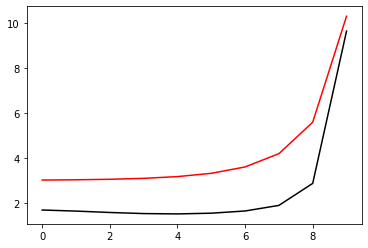

26800 54.00583996617901 -0.7172371842679127 1.0849682745409277
[1.68336784 1.63542782 1.57370316 1.52515899 1.50990393 1.54217015
 1.64002254 1.88863391 2.867144   9.63781434]


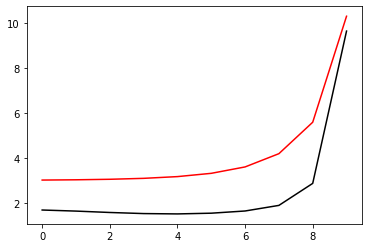

27000 54.005839966178144 -0.7172363874715425 1.084967079995967
[1.68336711 1.63542372 1.57369439 1.52515018 1.50990191 1.54217305
 1.64002619 1.8886378  2.86714787 9.63783284]


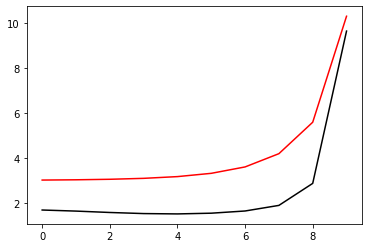

27200 54.00583996618425 -0.7172380645250108 1.0849695569478264
[1.68336612 1.63544312 1.57372152 1.52515816 1.50989325 1.54216028
 1.64001453 1.88862901 2.86714532 9.63780754]


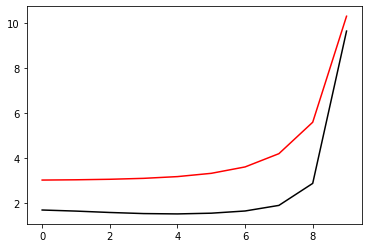

27400 54.00583996617872 -0.7172369518919197 1.0849679253246685
[1.68336787 1.63542639 1.57369988 1.52515631 1.50990417 1.54217154
 1.6400238  1.888635   2.86714462 9.63781951]


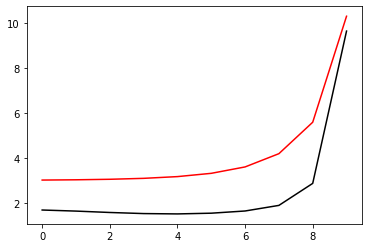

27600 54.005860975905755 -0.7171183937569243 1.0850815665736075
[1.68353394 1.63557336 1.57383303 1.52528223 1.5100314  1.54230341
 1.64015968 1.88877735 2.86729777 9.63799944]


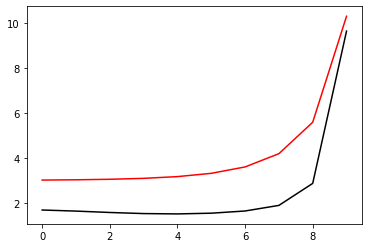

27800 54.00583996618009 -0.7172376519045371 1.0849689792356296
[1.68336679 1.63543281 1.573713   1.52516212 1.50990018 1.54216608
 1.64001926 1.88863165 2.86714391 9.63780647]


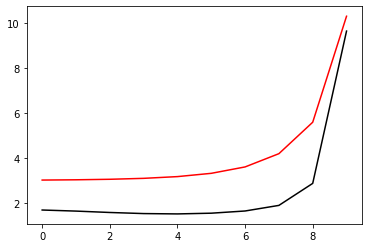

28000 54.00583996617849 -0.7172367522890036 1.0849676260222907
[1.68336772 1.63542534 1.57369758 1.525154   1.50990382 1.54217245
 1.64002471 1.88863588 2.86714541 9.6378243 ]


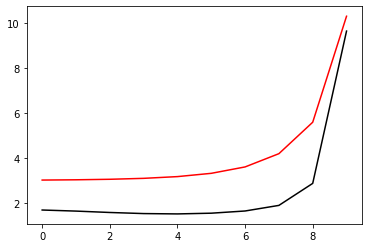

28200 54.00584015303886 -0.7172537765503969 1.0849674200733341
[1.68358341 1.6355277  1.57366228 1.52503185 1.50973904 1.54199812
 1.63986811 1.88853085 2.86713901 9.63794592]


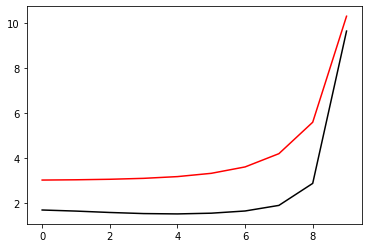

28400 54.00583996617955 -0.717237503224007 1.0849687554669198
[1.68336763 1.63543022 1.5737083  1.52516199 1.50990296 1.54216831
 1.64002083 1.88863236 2.86714302 9.63780791]


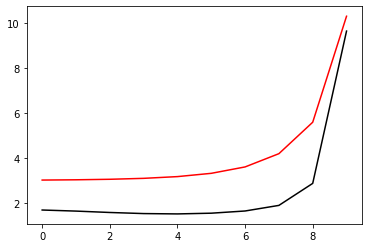

28600 54.0058399661784 -0.7172366567333892 1.0849674827632434
[1.68336766 1.63542486 1.57369647 1.52515278 1.50990359 1.54217309
 1.64002532 1.88863625 2.86714542 9.6378269 ]


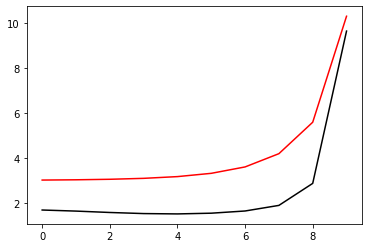

28800 54.005839966812594 -0.7172405070347175 1.0849755124895153
[1.68345507 1.63550885 1.57370593 1.52510236 1.50982581 1.54209161
 1.63995594 1.88859684 2.86716189 9.63789419]


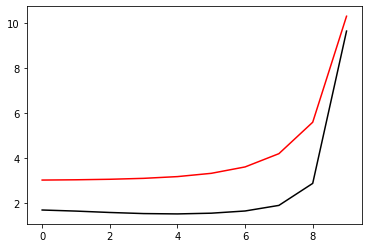

29000 54.00583996617936 -0.7172374366524518 1.0849686532967977
[1.68336798 1.63542935 1.57370631 1.52516138 1.50990407 1.54216944
 1.64002161 1.8886326  2.86714225 9.63780923]


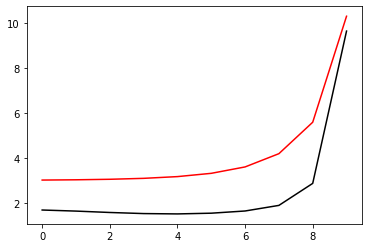

29200 54.00583996617833 -0.7172366100196342 1.0849674127407445
[1.68336763 1.63542463 1.57369594 1.52515215 1.50990342 1.54217346
 1.64002574 1.88863644 2.86714514 9.63782841]


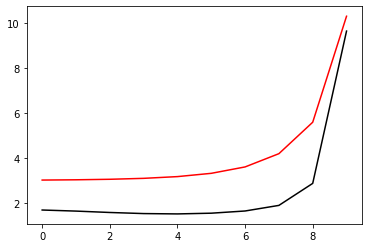

29400 54.005839966673804 -0.7172398042906954 1.0849711407737719
[1.68339352 1.63547844 1.57371979 1.52513441 1.50986547 1.54213276
 1.63999106 1.88861587 2.86715141 9.63784064]


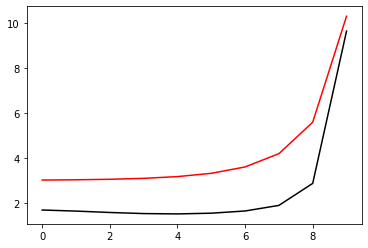

29600 54.00583996617902 -0.7172372105358231 1.0849683138196289
[1.68336791 1.63542793 1.57370332 1.52515917 1.50990409 1.54217034
 1.64002267 1.88863369 2.86714314 9.63781434]


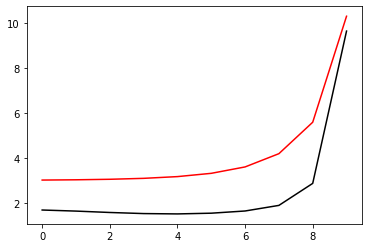

29800 54.005839966178165 -0.7172364132589567 1.0849671185065888
[1.68336719 1.63542382 1.57369452 1.52515035 1.50990209 1.54217324
 1.64002632 1.88863762 2.86714705 9.63783276]


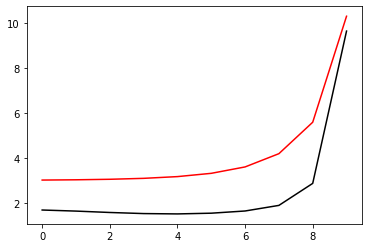

30000 54.00583996620345 -0.717238500573748 1.0849700525850712
[1.68336749 1.6354502  1.57372569 1.52515652 1.50988954 1.54215624
 1.64001085 1.88862633 2.86714459 9.63780693]


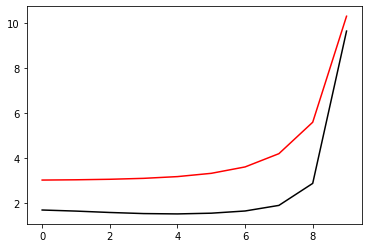

30200 54.00583996617895 -0.7172371769212503 1.0849682622360857
[1.68336823 1.63542744 1.57370191 1.5251585  1.50990516 1.54217143
 1.64002317 1.88863375 2.86714236 9.63781496]


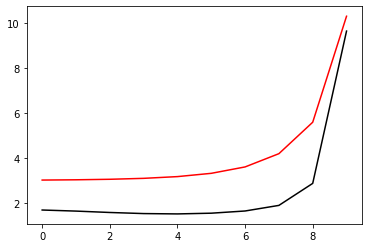

30400 54.005839966178144 -0.7172363930459736 1.084967088116957
[1.68336722 1.63542371 1.57369419 1.52514995 1.50990207 1.54217366
 1.64002663 1.88863763 2.8671466  9.6378336 ]


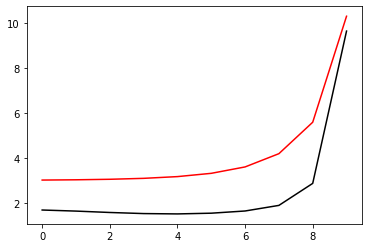

30600 54.005839966186244 -0.71723813457064 1.084969613943262
[1.68336615 1.63544283 1.57372222 1.52515926 1.50989384 1.54216066
 1.64001473 1.88862862 2.8671439  9.63780635]


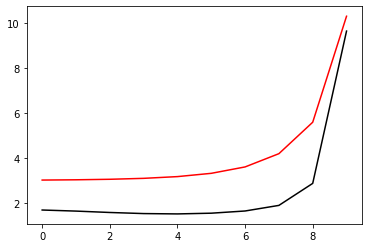

30800 54.00583996617878 -0.7172370181882454 1.0849680243858137
[1.68336803 1.63542665 1.5737003  1.52515686 1.50990465 1.54217179
 1.64002381 1.88863452 2.86714324 9.63781877]


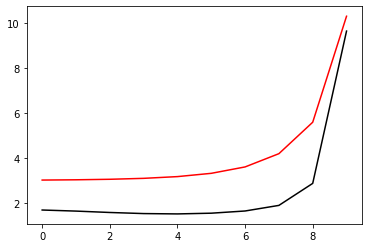

31000 54.005839966197165 -0.7172361384541153 1.084966988201122
[1.68336698 1.63542325 1.57369335 1.52514884 1.50990114 1.54217345
 1.64002711 1.88863864 2.86714829 9.63783673]


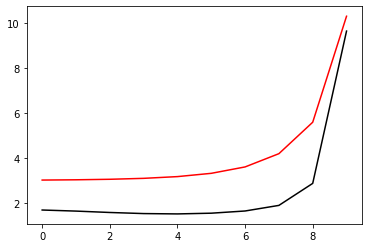

31200 54.005839966180915 -0.7172379019302544 1.0849693652920833
[1.68336646 1.63543629 1.57371778 1.52516256 1.50989835 1.54216427
 1.64001766 1.8886302  2.86714278 9.63780361]


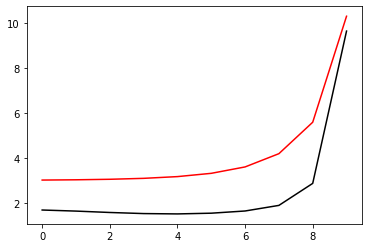

31400 54.00583996617871 -0.7172369469110119 1.0849679172877893
[1.68336807 1.63542621 1.57369924 1.52515589 1.50990477 1.54217241
 1.64002427 1.88863485 2.86714327 9.63782038]


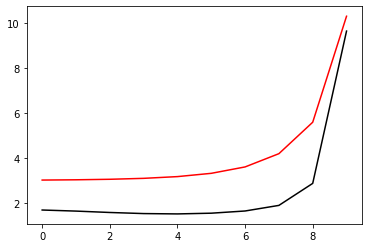

31600 54.00585214186543 -0.7171464583737952 1.0850549936147966
[1.68347852 1.63552742 1.57379282 1.52524546 1.50999658 1.54226912
 1.64012396 1.88873789 2.86725169 9.63794693]


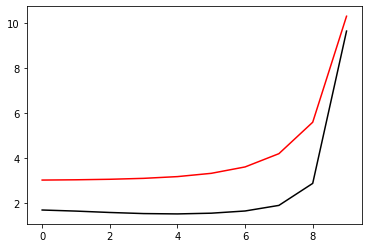

31800 54.00583996618044 -0.7172378152400809 1.084969220093522
[1.68336689 1.63543407 1.57371505 1.52516316 1.50990013 1.54216574
 1.64001882 1.88863078 2.86714224 9.63780394]


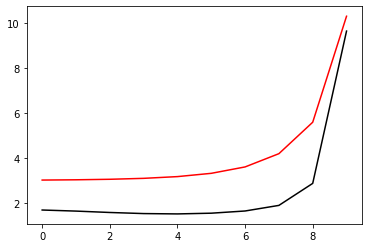

32000 54.00583996617862 -0.717236893976205 1.084967837882676
[1.68336805 1.63542593 1.57369858 1.52515522 1.5099047  1.54217276
 1.64002461 1.88863507 2.86714325 9.6378218 ]


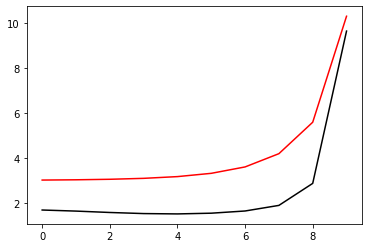

32200 54.00584330400217 -0.7172035980039979 1.0850380285043986
[1.68366169 1.63552926 1.57367545 1.52506246 1.50978902 1.54207467
 1.6399837  1.88870377 2.8673937  9.63833467]


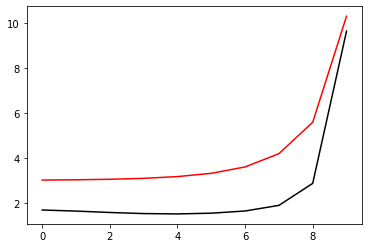

32400 54.0058399661799 -0.7172376458027022 1.0849689754534346
[1.6833673  1.63543191 1.57371145 1.52516256 1.5099016  1.54216732
 1.64002018 1.88863164 2.86714203 9.63780639]


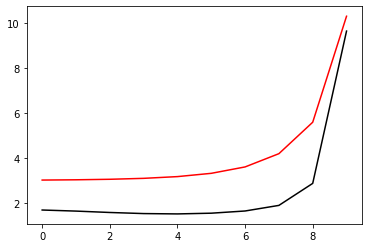

32600 54.0058399661785 -0.7172367692007369 1.084967651067477
[1.68336787 1.63542536 1.57369742 1.52515387 1.50990411 1.54217304
 1.64002518 1.88863573 2.8671439  9.63782482]


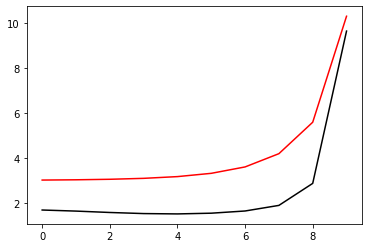

32800 54.00583997928016 -0.7172443348603371 1.0849731796762598
[1.68352763 1.63552368 1.57368583 1.52506889 1.50978386 1.5420453
 1.63991107 1.88856094 2.86714463 9.63791493]


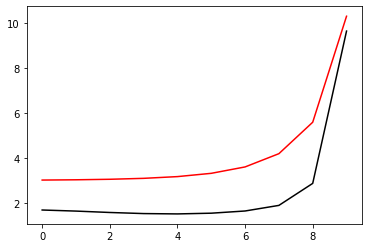

33000 54.005839966179344 -0.7172373962179802 1.0849685940744975
[1.68336773 1.63542939 1.57370652 1.52516093 1.50990325 1.54216912
 1.64002172 1.88863292 2.86714252 9.6378107 ]


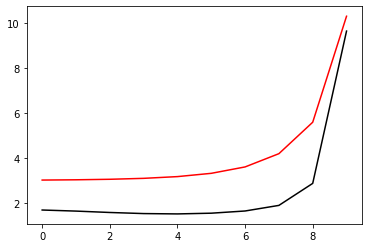

33200 54.0058399661783 -0.717236567769543 1.0849673496471564
[1.6833675  1.63542448 1.57369574 1.52515185 1.50990301 1.54217319
 1.64002585 1.88863684 2.86714557 9.63782934]


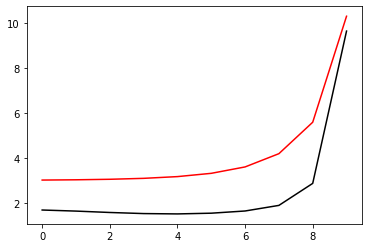

33400 54.00583996627293 -0.7172386559872046 1.0849712803293154
[1.68338139 1.63546948 1.57372357 1.52514303 1.50987504 1.54214208
 1.63999865 1.88861932 2.86714711 9.63782439]


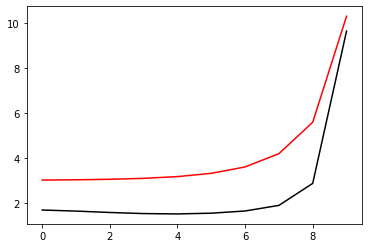

33600 54.00583996617902 -0.7172372114996187 1.0849683147929876
[1.68336804 1.63542782 1.57370295 1.52515905 1.50990447 1.5421707
 1.64002285 1.88863374 2.86714266 9.63781427]


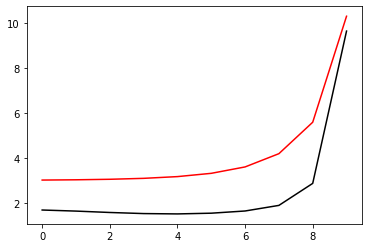

33800 54.00583996617819 -0.717236416444393 1.0849671232041083
[1.68336723 1.63542382 1.57369446 1.52515028 1.50990214 1.54217341
 1.64002645 1.88863763 2.86714667 9.63783286]


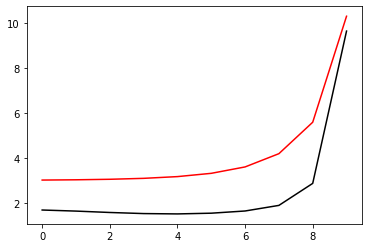

34000 54.00583996618304 -0.7172381129365674 1.0849696705939398
[1.68336627 1.63544328 1.57372205 1.52515879 1.50989369 1.5421606
 1.64001467 1.88862865 2.86714387 9.63780661]


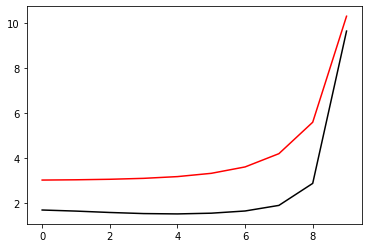

34200 54.00583996617875 -0.7172370153964885 1.084968020197508
[1.68336805 1.63542663 1.57370024 1.52515677 1.50990462 1.54217187
 1.64002392 1.88863461 2.86714314 9.63781879]


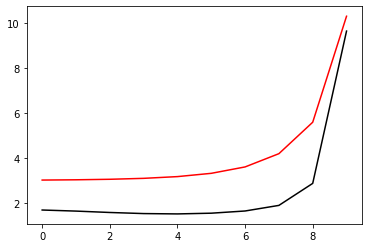

34400 54.005840129652434 -0.7172258439334256 1.0849772534362279
[1.6833774  1.63543361 1.57370365 1.52515908 1.50991139 1.54218378
 1.64003752 1.88864909 2.86715865 9.6378473 ]


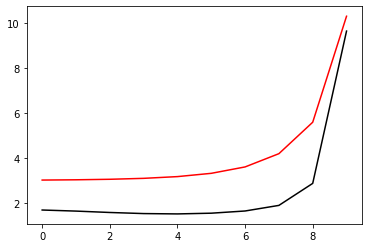

34600 54.005839966180375 -0.7172377482194572 1.0849691433064186
[1.68336678 1.63543392 1.57371459 1.52516244 1.50989984 1.54216582
 1.64001899 1.88863109 2.86714266 9.63780541]


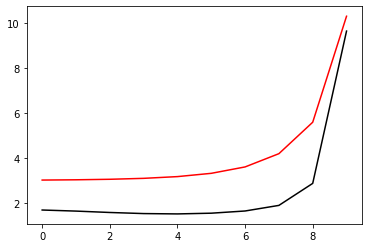

34800 54.00583996617856 -0.7172368376948631 1.0849677537384277
[1.68336792 1.6354257  1.5736982  1.52515472 1.5099043  1.54217266
 1.64002474 1.88863543 2.86714387 9.63782298]


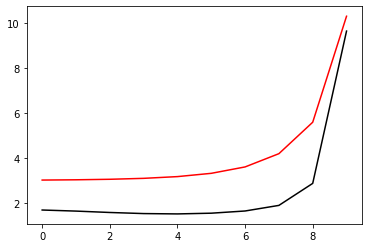

35000 54.00584020379388 -0.717232631500835 1.0849933441011346
[1.68368635 1.63556554 1.5736809  1.52504306 1.50974817 1.54201162
 1.63989439 1.88858097 2.86722744 9.63809914]


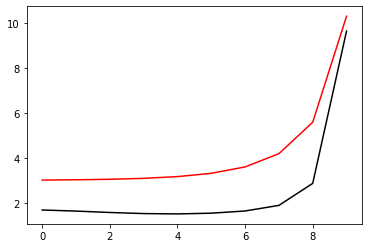

35200 54.005839966179686 -0.717237577278441 1.084968866066901
[1.6833676  1.63543087 1.57370951 1.52516235 1.50990264 1.54216814
 1.64002074 1.88863201 2.86714195 9.63780715]


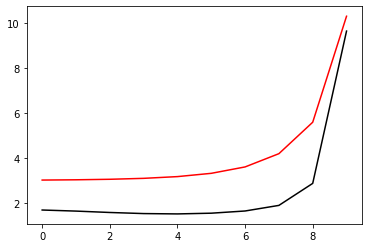

35400 54.00583996617846 -0.7172367179260558 1.0849675742632487
[1.68336781 1.63542512 1.5736969  1.52515329 1.50990392 1.54217323
 1.64002539 1.88863597 2.8671442  9.63782602]


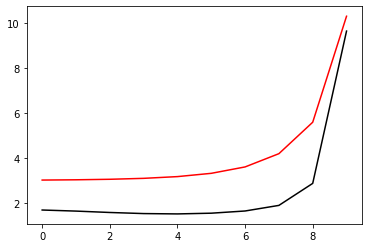

35600 54.005839975539175 -0.7172384998633113 1.0849772770849824
[1.68346677 1.63551269 1.57370572 1.52510159 1.50982459 1.54209
 1.63995443 1.88859606 2.86716241 9.63790075]


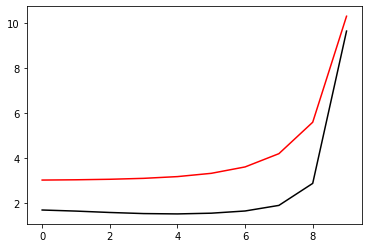

35800 54.00583996617929 -0.7172373692749339 1.0849685527177855
[1.68336785 1.63542904 1.57370574 1.52516075 1.50990373 1.54216947
 1.64002188 1.88863298 2.86714246 9.63781114]


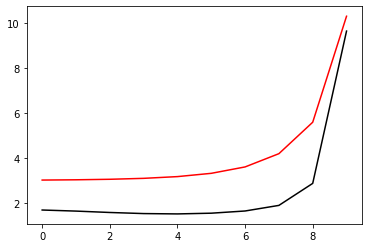

36000 54.0058399661783 -0.7172365491552947 1.0849673217551763
[1.68336748 1.63542439 1.57369554 1.52515164 1.50990297 1.54217329
 1.64002591 1.88863687 2.86714566 9.63782985]


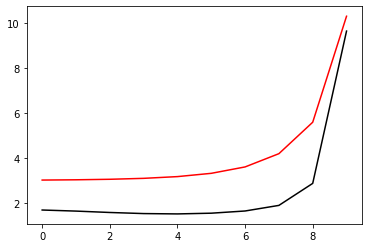

36200 54.00583996661793 -0.7172383781031415 1.0849716257904853
[1.68338196 1.6354706  1.57372452 1.52514328 1.50987489 1.5421419
 1.63999854 1.8886194  2.8671476  9.63782456]


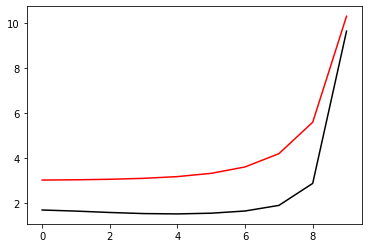

36400 54.00583996617906 -0.717237233156208 1.0849683473058338
[1.68336806 1.63542794 1.57370321 1.5251593  1.50990452 1.54217059
 1.64002272 1.88863363 2.86714265 9.63781371]


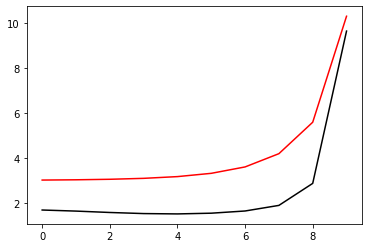

36600 54.00583996617816 -0.7172364370286767 1.0849671539958
[1.68336727 1.63542391 1.57369461 1.52515048 1.50990229 1.54217342
 1.64002636 1.88863749 2.86714653 9.63783237]


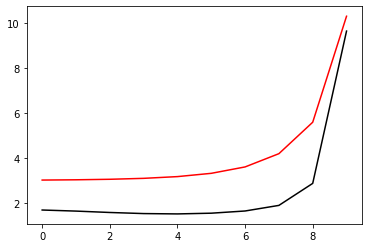

36800 54.005839966219554 -0.7172383285899161 1.0849704555561897
[1.68336891 1.63545374 1.57372664 1.52515499 1.50988758 1.54215438
 1.64000933 1.88862557 2.86714514 9.637809  ]


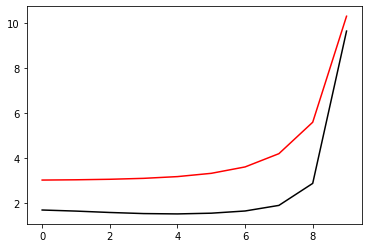

37000 54.005839966178975 -0.7172372040755018 1.0849683030473627
[1.68336822 1.63542761 1.57370233 1.52515884 1.5099051  1.54217121
 1.64002301 1.88863367 2.8671423  9.63781436]


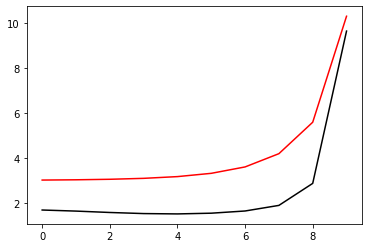

37200 54.00583996617818 -0.71723641779195 1.0849671251478687
[1.68336727 1.63542381 1.57369438 1.5251502  1.50990223 1.54217364
 1.64002653 1.88863752 2.86714639 9.63783304]


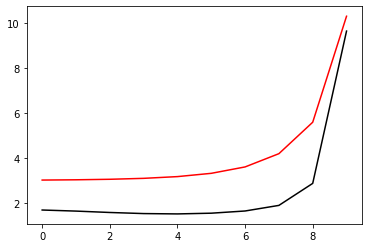

37400 54.00583996619241 -0.7172381018342656 1.084969901226209
[1.68336674 1.63544658 1.57372355 1.52515725 1.50989146 1.54215858
 1.64001311 1.88862797 2.86714493 9.63780866]


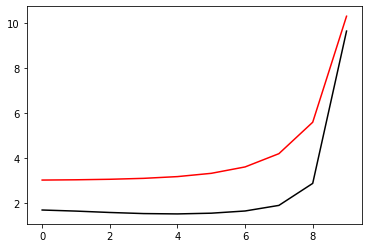

37600 54.005839966178776 -0.7172370383370901 1.0849680547837017
[1.68336798 1.6354268  1.57370072 1.52515719 1.50990449 1.54217146
 1.64002361 1.88863451 2.86714347 9.63781814]


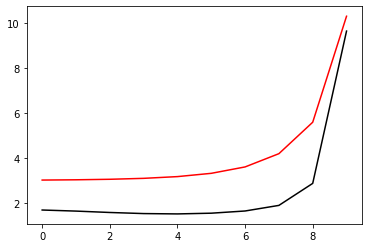

37800 54.00583996617816 -0.7172362593591021 1.0849669096708359
[1.6833669  1.63542322 1.57369341 1.52514894 1.50990114 1.54217325
 1.64002686 1.88863849 2.86714825 9.63783606]


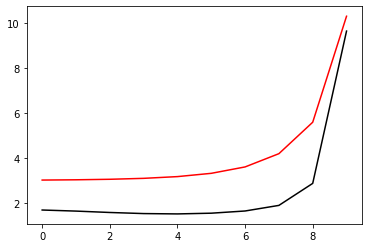

38000 54.005839966181384 -0.7172378594218589 1.0849693426825935
[1.68336619 1.63543705 1.57371832 1.52516168 1.50989731 1.54216354
 1.64001722 1.88863031 2.86714381 9.63780487]


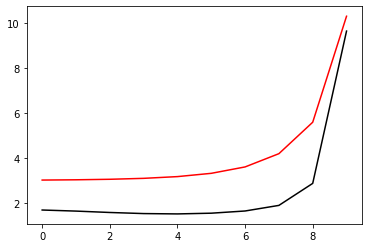

38200 54.005839966178655 -0.7172369089790627 1.0849678607150928
[1.68336792 1.63542609 1.57369913 1.5251557  1.50990439 1.54217204
 1.64002414 1.88863515 2.86714423 9.63782085]


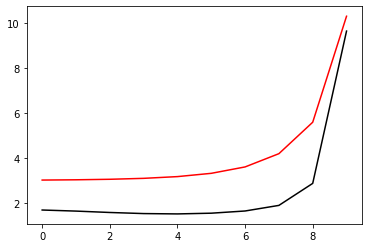

38400 54.00584280812286 -0.7172858697655349 1.0849351615187366
[1.68338994 1.63538128 1.57361309 1.52504871 1.50979603 1.54207759
 1.63995625 1.88861315 2.86719576 9.63798554]


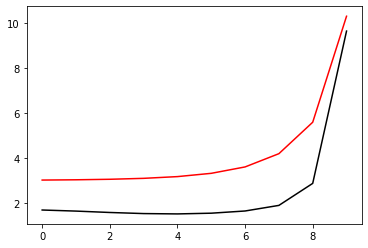

38600 54.00583996618006 -0.71723766224793 1.084968993811225
[1.68336694 1.63543265 1.57371274 1.52516232 1.50990052 1.54216638
 1.64001951 1.88863163 2.86714329 9.63780621]


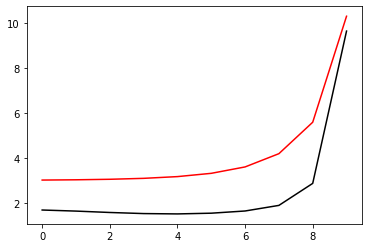

38800 54.005839966178485 -0.7172367670360917 1.0849676480152182
[1.68336778 1.63542539 1.57369761 1.52515406 1.50990395 1.54217262
 1.64002485 1.88863582 2.86714485 9.63782422]


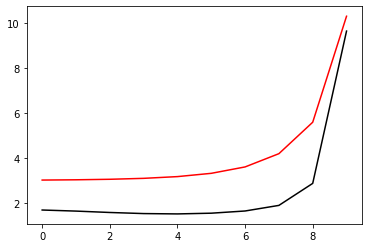

39000 54.00584015851872 -0.7172536059371424 1.0849664410373037
[1.68357809 1.63552735 1.57366602 1.52503791 1.50974626 1.54200551
 1.63987457 1.88853493 2.86713866 9.63794061]


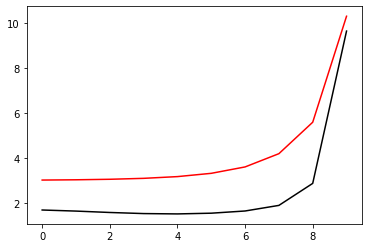

39200 54.00583996617947 -0.7172374675866972 1.0849687009778544
[1.68336765 1.63542997 1.57370775 1.52516157 1.50990297 1.54216859
 1.64002118 1.88863259 2.86714279 9.63780886]


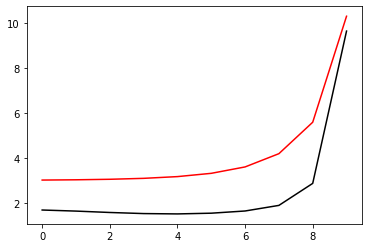

39400 54.00583996617835 -0.7172366256418328 1.0849674362474018
[1.68336761 1.63542473 1.57369621 1.52515245 1.50990337 1.54217312
 1.64002555 1.88863649 2.86714542 9.63782774]


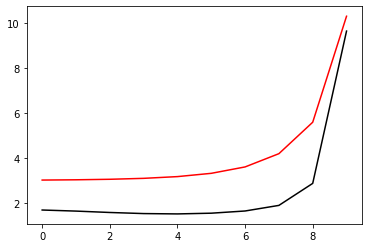

39600 54.005839967552824 -0.7172388413493693 1.084973453085306
[1.68340856 1.63548889 1.5737191  1.52512895 1.50985828 1.54212532
 1.63998527 1.88861426 2.86715711 9.637856  ]


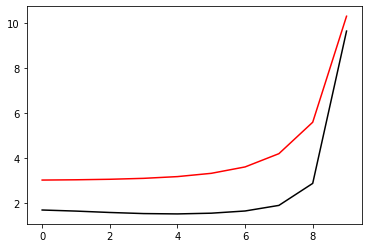

39800 54.005839966179146 -0.7172373098198064 1.0849684625194018
[1.68336803 1.63542847 1.57370438 1.52516008 1.50990431 1.54217018
 1.64002235 1.88863325 2.86714245 9.63781203]


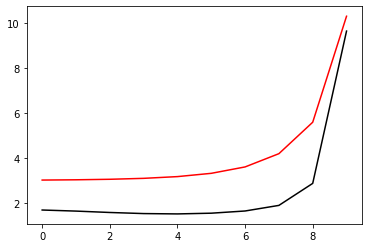

40000 54.00583996617824 -0.7172365005492864 1.084967249001877
[1.68336741 1.63542417 1.57369509 1.52515108 1.5099027  1.54217345
 1.64002616 1.88863711 2.86714597 9.63783093]


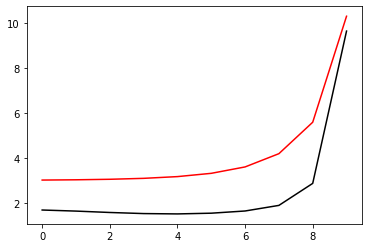

40200 54.005839966251564 -0.717238613501486 1.0849699973225706
[1.68336953 1.63545408 1.57372473 1.52515313 1.50988677 1.54215394
 1.64000886 1.88862508 2.86714474 9.63781118]


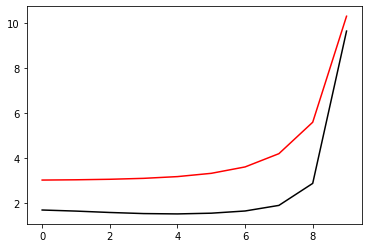

40400 54.00583996617889 -0.7172371318279084 1.084968194931627
[1.6833681  1.63542729 1.57370168 1.52515808 1.5099047  1.54217134
 1.64002338 1.88863405 2.86714268 9.63781612]


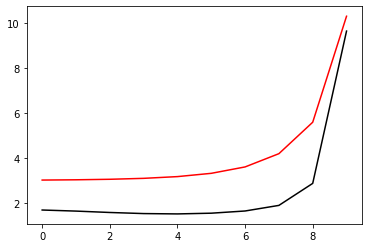

40600 54.005839966178094 -0.7172363499628146 1.0849670211317506
[1.6833671  1.63542354 1.57369392 1.5251496  1.5099017  1.54217347
 1.64002676 1.88863798 2.86714712 9.63783448]


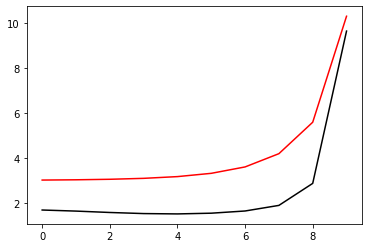

40800 54.00583996618135 -0.7172378968925793 1.0849693897330932
[1.68336624 1.63543786 1.57371869 1.52516113 1.50989707 1.54216361
 1.64001719 1.88862999 2.86714302 9.63780523]


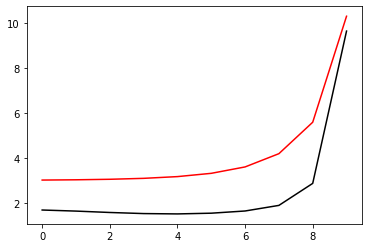

41000 54.00583996617866 -0.7172369278503962 1.0849678888966552
[1.68336799 1.63542617 1.57369921 1.52515576 1.50990448 1.54217227
 1.64002436 1.88863502 2.86714345 9.63782087]


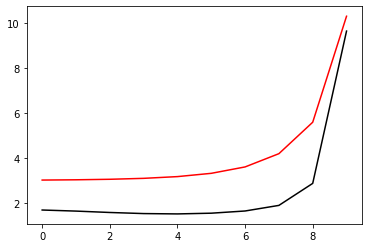

41200 54.00584009279313 -0.7172396435405828 1.0849940307049872
[1.68365145 1.63552207 1.57367144 1.52505973 1.50978582 1.54206931
 1.63997452 1.88868829 2.86736821 9.63829512]


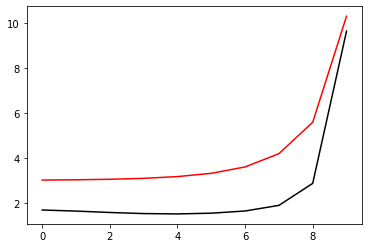

41400 54.005839966179785 -0.7172375700651267 1.0849688577741763
[1.68336718 1.63543145 1.57371067 1.52516199 1.50990143 1.54216731
 1.64002027 1.88863204 2.86714287 9.63780793]


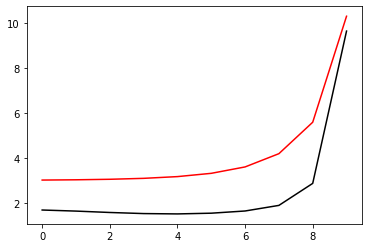

41600 54.00583996617844 -0.7172366992339092 1.0849675464748056
[1.68336768 1.63542508 1.57369697 1.52515332 1.50990365 1.54217282
 1.64002519 1.88863614 2.86714498 9.63782612]


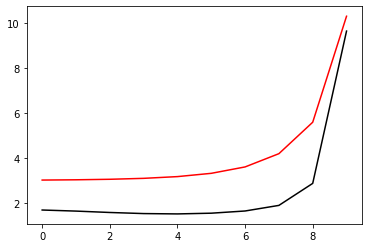

41800 54.00583998829423 -0.7172371605822466 1.0849785539769476
[1.68347303 1.63551609 1.57370725 1.52510245 1.50982494 1.54208996
 1.63995437 1.88859644 2.86716378 9.63790277]


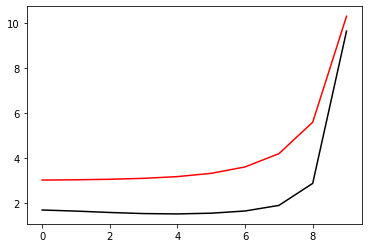

42000 54.0058399661793 -0.7172373821083268 1.0849685721410207
[1.68336789 1.6354291  1.57370583 1.52516083 1.5099038  1.54216949
 1.64002184 1.88863296 2.86714249 9.63781059]


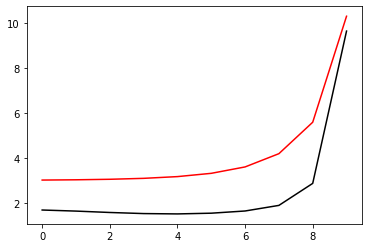

42200 54.00583996617829 -0.7172365589493891 1.0849673363993653
[1.68336751 1.63542443 1.5736956  1.52515171 1.50990303 1.54217333
 1.64002589 1.88863683 2.86714563 9.63782951]


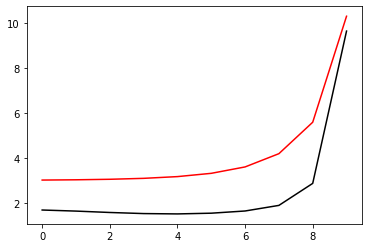

42400 54.00583996641309 -0.7172390247395218 1.0849703079164206
[1.68337568 1.63546337 1.5737232  1.52514561 1.50987842 1.54214564
 1.64000162 1.88862076 2.8671458  9.63781932]


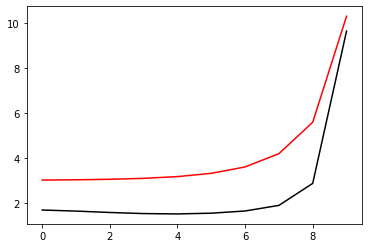

42600 54.00583996617895 -0.717237139137359 1.0849682063269106
[1.68336794 1.63542745 1.57370224 1.52515839 1.50990426 1.54217073
 1.640023   1.88863408 2.86714341 9.63781577]


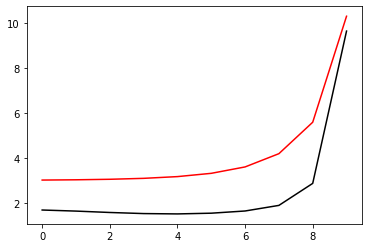

42800 54.00583996617811 -0.7172363519865373 1.0849670268898535
[1.68336706 1.63542356 1.57369405 1.52514976 1.50990169 1.54217321
 1.6400265  1.888638   2.86714765 9.63783405]


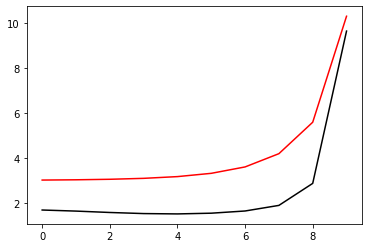

43000 54.005839966185206 -0.7172382253186845 1.0849697790192783
[1.68336628 1.63544369 1.57372346 1.52515991 1.50989372 1.5421601
 1.64001412 1.88862821 2.86714379 9.63780395]


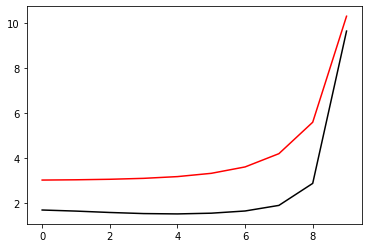

43200 54.00583996617888 -0.7172371008845445 1.0849681481284774
[1.68336821 1.63542701 1.57370095 1.52515763 1.50990512 1.5421718
 1.64002352 1.88863412 2.86714268 9.63781665]


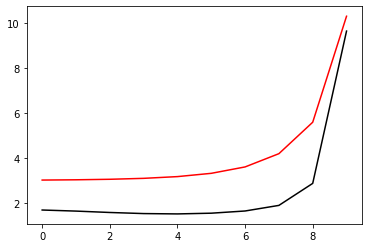

43400 54.00583996617811 -0.7172363285742023 1.0849669860690514
[1.68336707 1.63542343 1.5736937  1.52514933 1.5099016  1.54217359
 1.64002684 1.88863804 2.86714727 9.63783503]


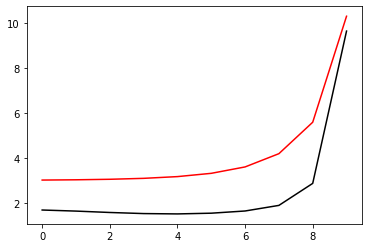

43600 54.005839966181554 -0.7172378678842468 1.0849692724004203
[1.68336611 1.63543715 1.57371801 1.52516102 1.5098971  1.5421637
 1.64001735 1.88863024 2.86714353 9.63780609]


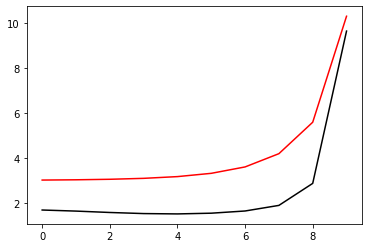

43800 54.00583996617862 -0.7172368822987591 1.0849678207830273
[1.68336787 1.63542598 1.57369891 1.52515541 1.50990421 1.54217212
 1.64002435 1.88863524 2.86714417 9.63782174]


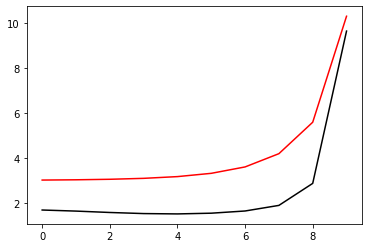

44000 54.00584218580775 -0.7172860934605145 1.0849431275923185
[1.68363813 1.63550231 1.57364925 1.52503597 1.50976112 1.54204425
 1.6399496  1.88866403 2.86734518 9.63827362]


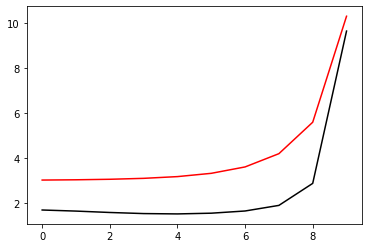

44200 54.00583996617999 -0.7172376619770032 1.0849689997575451
[1.6833672  1.63543215 1.57371196 1.52516271 1.50990135 1.54216691
 1.64001981 1.88863162 2.86714264 9.63780574]


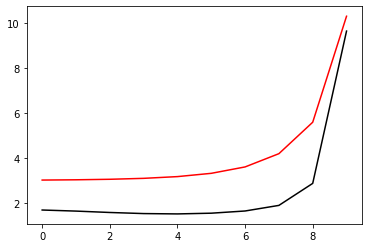

44400 54.0058399661785 -0.7172367792020788 1.0849676660928937
[1.68336786 1.63542542 1.57369757 1.52515405 1.50990414 1.54217287
 1.64002495 1.8886357  2.86714431 9.63782422]


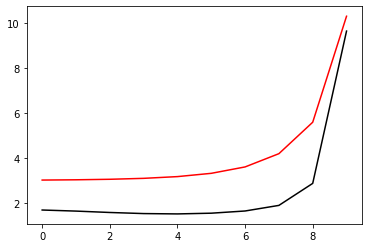

44600 54.00583997096812 -0.7172435598267094 1.0849754757743237
[1.68356906 1.63553227 1.57367826 1.52505391 1.5097644  1.54202422
 1.63989194 1.88854859 2.86714546 9.63793744]


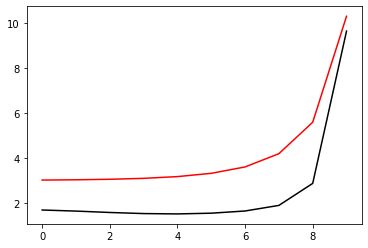

44800 54.00583996617938 -0.7172374009010151 1.0849686011166721
[1.68336757 1.63542958 1.57370703 1.52516104 1.50990284 1.54216867
 1.64002138 1.88863288 2.8671432  9.63781049]


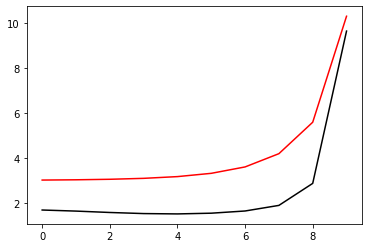

45000 54.00583996617833 -0.717236567815333 1.0849673497902075
[1.68336746 1.63542449 1.57369583 1.52515197 1.50990298 1.54217298
 1.64002564 1.88863683 2.8671461  9.63782902]


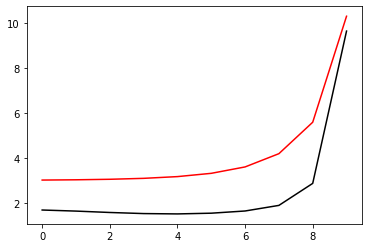

45200 54.00583996714466 -0.7172397620143746 1.0849704381012928
[1.68338573 1.63547266 1.57372101 1.5251384  1.50987011 1.54213727
 1.6399947  1.88861748 2.86714917 9.63783128]


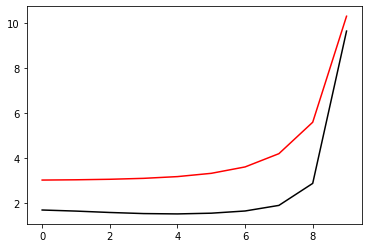

45400 54.005839966178975 -0.717237161882457 1.0849682408395371
[1.68336784 1.63542767 1.57370283 1.52515876 1.50990398 1.54217028
 1.64002267 1.88863403 2.86714392 9.63781498]


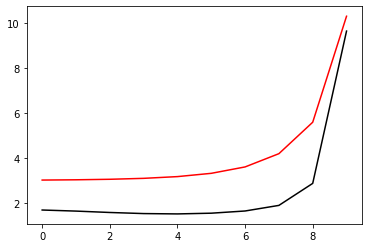

45600 54.00583996617816 -0.7172363690919369 1.0849670525233772
[1.68336707 1.63542364 1.57369425 1.52515    1.50990179 1.54217305
 1.64002628 1.88863793 2.86714792 9.63783334]


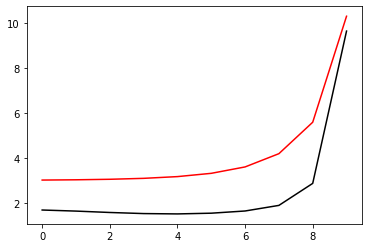

45800 54.00583996618412 -0.7172380688347196 1.0849695569644342
[1.68336611 1.63544265 1.57372162 1.52515875 1.50989369 1.54216058
 1.64001476 1.88862907 2.86714499 9.63780673]


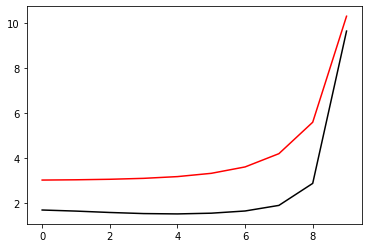

46000 54.005839966178726 -0.717236967838614 1.0849679491319262
[1.68336792 1.63542644 1.57369996 1.52515644 1.50990431 1.5421716
 1.64002379 1.88863492 2.86714434 9.63781922]


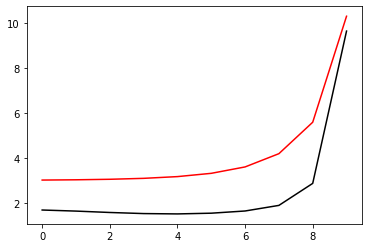

46200 54.00584380989627 -0.7172866435377384 1.084915893747193
[1.68332412 1.63537781 1.57364628 1.52510074 1.50985253 1.54212483
 1.63997897 1.88859164 2.86710333 9.637793  ]


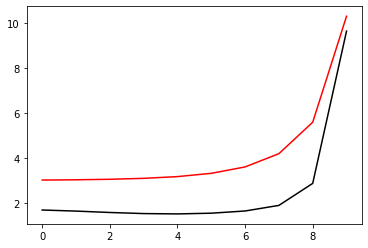

46400 54.005839966180126 -0.7172376600041152 1.0849689930729236
[1.68336677 1.635433   1.57371323 1.52516202 1.50990003 1.54216605
 1.64001926 1.8886316  2.86714374 9.63780655]


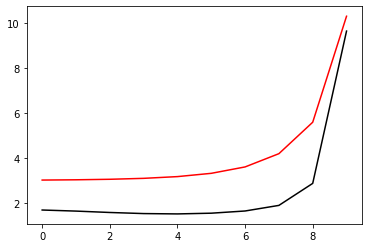

46600 54.005839966178506 -0.7172367577523564 1.0849676341977321
[1.68336773 1.63542537 1.57369762 1.52515404 1.50990383 1.54217247
 1.64002476 1.88863587 2.86714522 9.63782427]


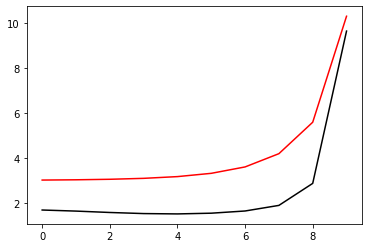

46800 54.00584000663078 -0.7172370495314324 1.0849824729761433
[1.68358392 1.63554281 1.57368481 1.52505803 1.50976711 1.54202637
 1.63989453 1.88855279 2.86715288 9.63794744]


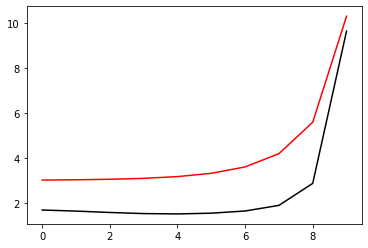

47000 54.00583996617949 -0.7172374740352654 1.0849687107766484
[1.68336768 1.63542997 1.57370775 1.52516168 1.50990308 1.54216859
 1.6400211  1.88863253 2.86714289 9.63780856]


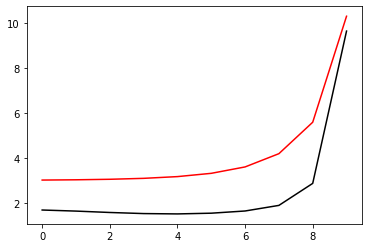

47200 54.00583996617835 -0.7172366318406996 1.0849674455114233
[1.68336762 1.63542475 1.57369625 1.52515251 1.50990343 1.54217314
 1.64002548 1.88863642 2.86714547 9.63782754]


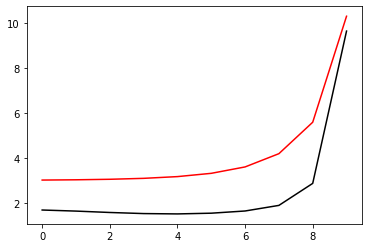

47400 54.00583996841192 -0.7172410489297116 1.0849715380054092
[1.68340894 1.63548772 1.5737153  1.52512429 1.50985338 1.54212051
 1.63998099 1.88861121 2.86715635 9.63785846]


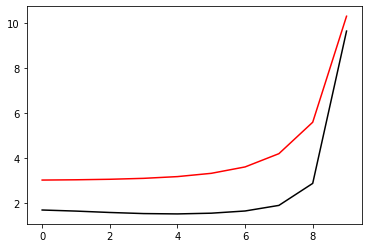

47600 54.00583996617915 -0.7172372783624864 1.0849684156735915
[1.6833679  1.63542836 1.57370428 1.52515991 1.50990405 1.54216994
 1.64002222 1.88863338 2.86714314 9.63781265]


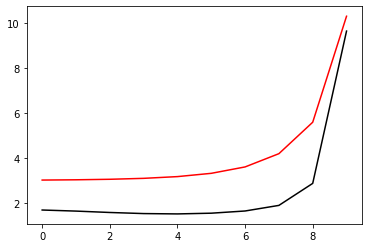

47800 54.0058399661782 -0.7172364715060375 1.0849672056247708
[1.68336731 1.63542406 1.57369496 1.52515092 1.50990249 1.54217324
 1.64002605 1.88863726 2.86714668 9.63783133]


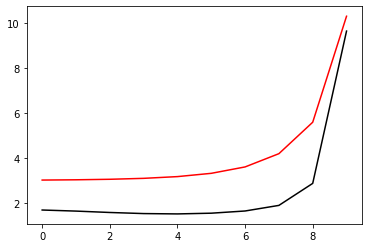

48000 54.0058399662365 -0.7172384753175197 1.0849698491948545
[1.68336839 1.63545156 1.5737236  1.52515363 1.50988789 1.54215521
 1.64001008 1.88862609 2.86714535 9.63781123]


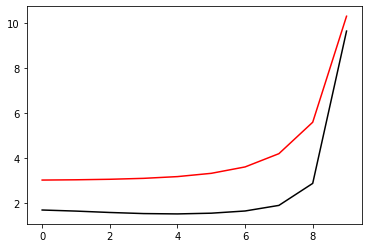

48200 54.005839966178826 -0.7172370546627264 1.0849680794178727
[1.68336796 1.63542693 1.57370104 1.52515739 1.50990434 1.54217127
 1.6400235  1.88863447 2.8671437  9.63781752]


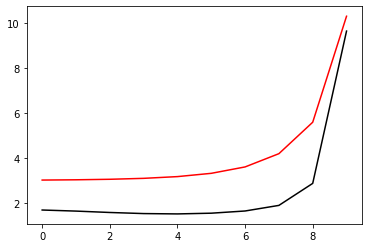

48400 54.00583996617811 -0.7172362720780082 1.0849669212622475
[1.68336691 1.63542326 1.5736935  1.52514904 1.50990118 1.54217319
 1.64002679 1.88863845 2.86714835 9.63783564]


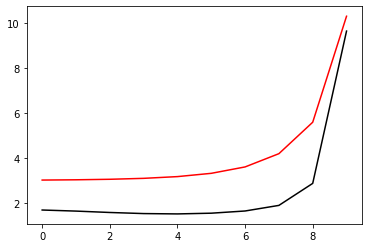

48600 54.00583996618162 -0.7172380555832879 1.084969584219769
[1.68336634 1.63543854 1.57372036 1.52516261 1.50989725 1.54216299
 1.64001641 1.88862932 2.86714272 9.63780165]


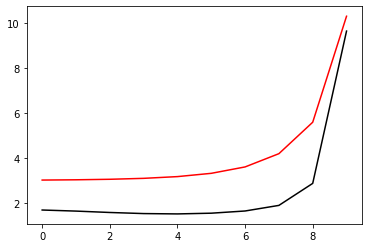

48800 54.00583996617878 -0.7172370537578406 1.0849680772380588
[1.68336825 1.6354267  1.57370018 1.52515696 1.50990529 1.54217231
 1.64002386 1.88863426 2.86714254 9.63781787]


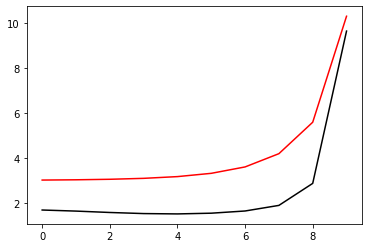

49000 54.0058399661785 -0.7172362705306027 1.0849669458690314
[1.68336701 1.63542328 1.5736934  1.52514893 1.50990135 1.5421737
 1.64002708 1.88863824 2.86714744 9.63783609]


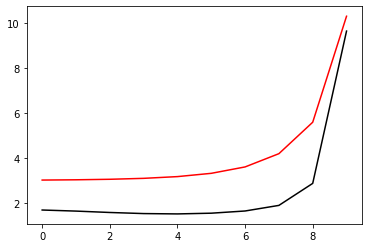

49200 54.00583996618125 -0.7172379488359062 1.0849694552687565
[1.68336631 1.63543745 1.5737191  1.52516238 1.50989757 1.54216357
 1.64001703 1.88862972 2.86714276 9.63780368]


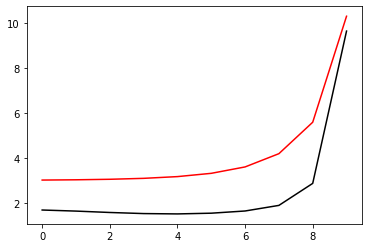

49400 54.00583996617875 -0.7172369831269808 1.084967971542462
[1.6833681  1.63542639 1.57369963 1.52515632 1.50990491 1.54217229
 1.64002408 1.88863459 2.86714301 9.63781974]


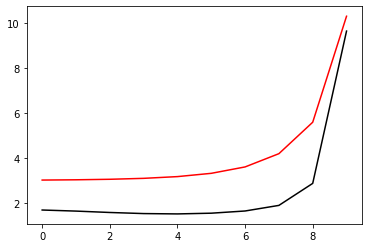

49600 54.00583997336802 -0.7172384058768456 1.0849646529232753
[1.68336469 1.63542087 1.57369084 1.52514625 1.5098987  1.54217129
 1.64002501 1.88863645 2.86714602 9.63783527]


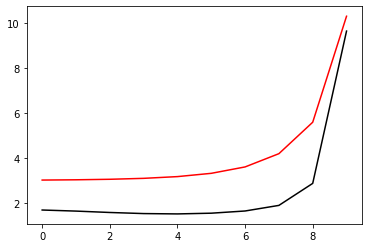

49800 54.00583996618059 -0.717237794222207 1.0849691863028097
[1.68336656 1.63543464 1.57371571 1.52516243 1.50989913 1.54216512
 1.64001846 1.88863078 2.86714296 9.63780533]


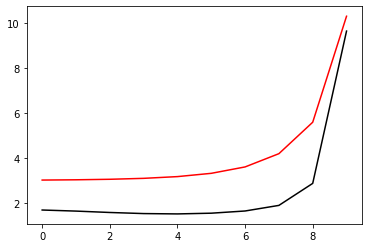

50000 54.00583996617858 -0.7172368614511898 1.0849677893689593
[1.68336792 1.63542583 1.57369851 1.52515507 1.50990436 1.54217245
 1.64002452 1.88863527 2.86714396 9.63782239]


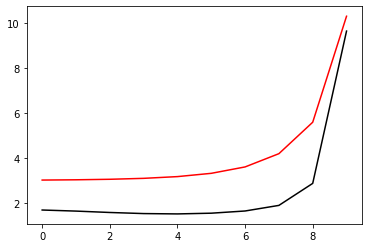

50200 54.00584572314798 -0.7171826089039887 1.0850381340717854
[1.68362163 1.6355556  1.57375193 1.52516727 1.50990588 1.54218916
 1.64008031 1.8887629  2.86738879 9.63824116]


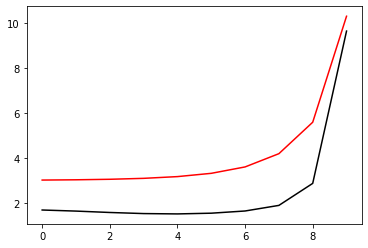

50400 54.00583996618072 -0.7172379601123703 1.0849694460397643
[1.68336699 1.63543491 1.57371685 1.52516483 1.50990039 1.542165
 1.64001788 1.88863    2.86714187 9.63780056]


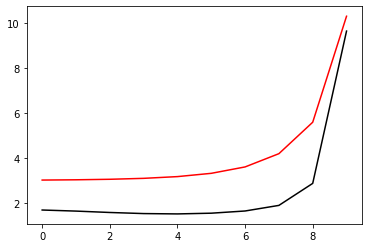

50600 54.00583996617877 -0.717237028919247 1.084968039719742
[1.68336832 1.6354265  1.57369963 1.52515655 1.50990561 1.54217278
 1.640024   1.88863421 2.86714224 9.63781878]


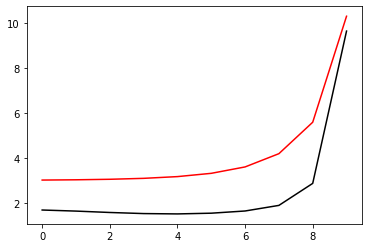

50800 54.005839966178094 -0.717236266638095 1.0849669129972763
[1.68336699 1.6354232  1.57369323 1.52514873 1.5099013  1.54217384
 1.64002717 1.88863819 2.8671473  9.63783673]


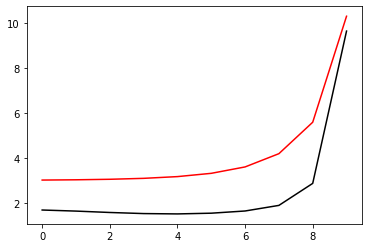

51000 54.005839966181334 -0.7172379419056152 1.0849694545916273
[1.68336627 1.63543773 1.57371916 1.52516194 1.50989729 1.5421636
 1.64001714 1.88862968 2.86714253 9.63780428]


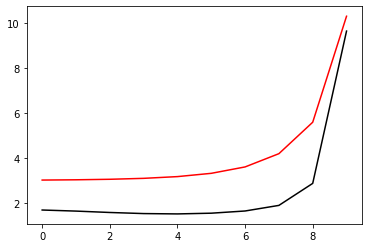

51200 54.00583996617871 -0.7172369753128294 1.0849679598585698
[1.68336809 1.63542636 1.57369956 1.52515621 1.50990481 1.54217234
 1.64002425 1.88863465 2.86714284 9.63782007]


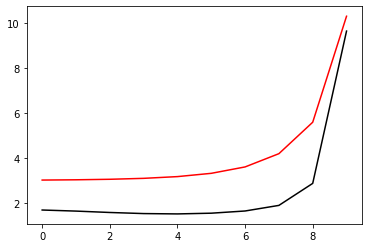

51400 54.00584151567794 -0.7172682434148074 1.0849346106633417
[1.68333802 1.63539316 1.57366248 1.52511748 1.50986974 1.54214236
 1.63999629 1.88860798 2.86711788 9.63780822]


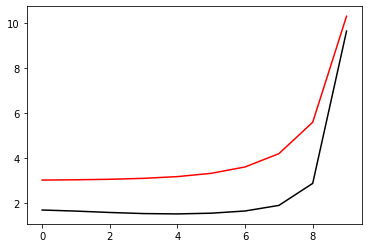

51600 54.00583996618021 -0.7172377009784057 1.0849690569364747
[1.68336681 1.63543334 1.57371372 1.52516216 1.50989999 1.54216614
 1.6400194  1.88863136 2.86714266 9.63780645]


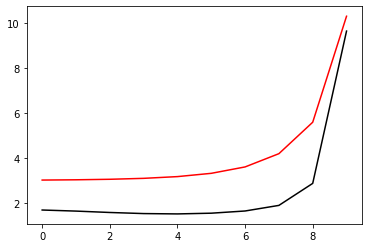

51800 54.00583996617853 -0.7172367957250383 1.084967690942953
[1.68336784 1.63542552 1.57369786 1.52515431 1.50990405 1.54217266
 1.64002493 1.88863568 2.86714414 9.63782398]


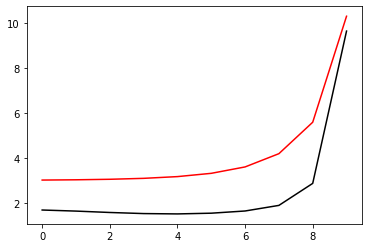

52000 54.00584002743096 -0.7172486568427406 1.084971633203116
[1.68357367 1.63552501 1.57366753 1.52504211 1.50975198 1.54201192
 1.63988103 1.88854058 2.86714225 9.63794336]


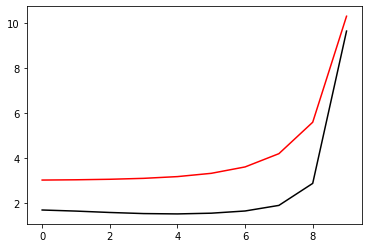

52200 54.00583996617939 -0.7172373963054024 1.084968593725297
[1.68336756 1.63542958 1.57370701 1.52516093 1.50990276 1.5421687
 1.64002147 1.88863296 2.86714308 9.6378107 ]


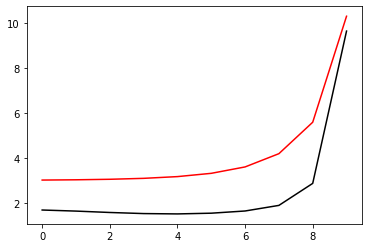

52400 54.005839966178314 -0.7172365621300986 1.0849673412904464
[1.68336745 1.63542447 1.57369578 1.5251519  1.50990292 1.54217298
 1.64002571 1.88863692 2.86714603 9.63782919]


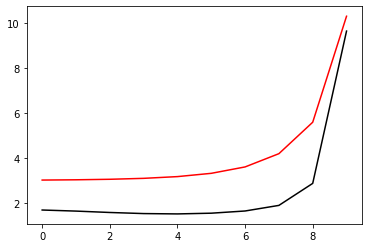

52600 54.00583996650452 -0.7172392329089474 1.0849704800157218
[1.68338003 1.63546772 1.57372217 1.52514225 1.50987462 1.54214177
 1.63999842 1.88861926 2.86714728 9.63782448]


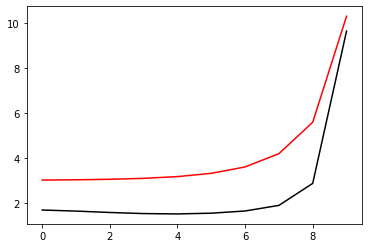

52800 54.00583996617897 -0.7172371422413811 1.0849682111714676
[1.68336788 1.63542752 1.57370246 1.52515851 1.50990408 1.54217048
 1.64002284 1.88863414 2.86714379 9.63781547]


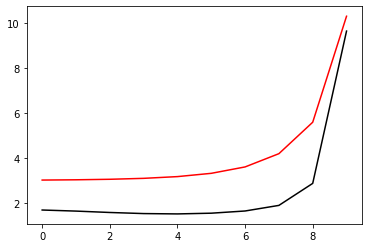

53000 54.00583996617812 -0.7172363524845001 1.0849670275962608
[1.68336704 1.63542357 1.5736941  1.52514982 1.50990168 1.54217309
 1.64002639 1.88863805 2.86714793 9.6378338 ]


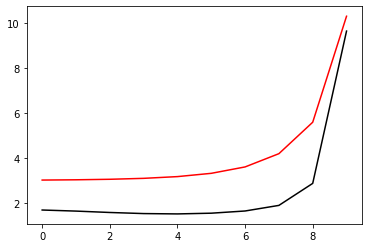

53200 54.005839966182144 -0.717237983459339 1.0849694815389643
[1.68336592 1.63544093 1.57372087 1.5251596  1.50989461 1.54216131
 1.64001538 1.88862947 2.8671449  9.6378064 ]


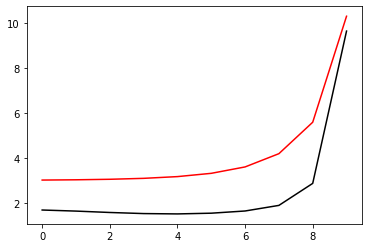

53400 54.00583996617868 -0.7172369391266532 1.0849679061112152
[1.68336787 1.6354263  1.57369969 1.52515619 1.50990425 1.54217161
 1.6400238  1.88863504 2.86714462 9.6378199 ]


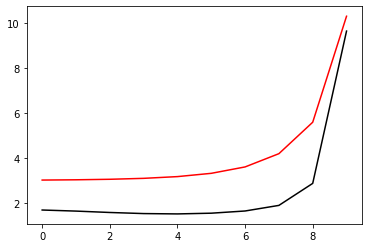

53600 54.00584060853061 -0.7172567971407359 1.0849460670759092
[1.68334743 1.63540318 1.57367288 1.52512807 1.50988029 1.54215276
 1.64000676 1.88861898 2.86712985 9.63781804]


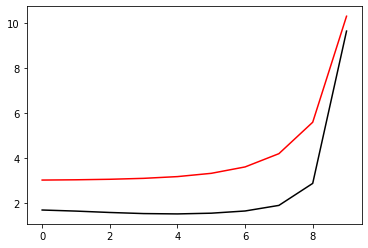

53800 54.00583996618037 -0.717237738194222 1.0849691172478784
[1.6833666  1.63543394 1.57371486 1.52516255 1.50989947 1.54216518
 1.64001848 1.88863118 2.86714403 9.63780514]


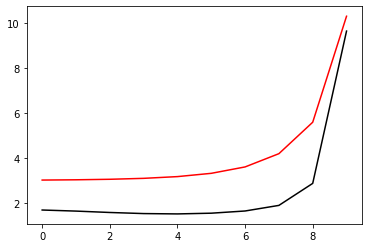

54000 54.005839966178556 -0.7172368222636205 1.0849677307841925
[1.68336782 1.63542566 1.57369823 1.52515477 1.50990418 1.54217228
 1.64002435 1.88863551 2.86714506 9.63782264]


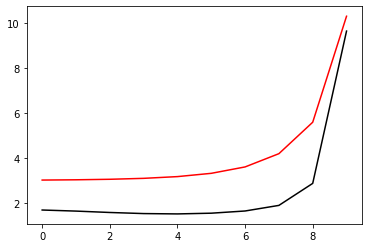

54200 54.00584211791383 -0.7172861728439398 1.0849463894365874
[1.68366511 1.63550944 1.57363212 1.52500337 1.50971905 1.5419971
 1.63990108 1.88861869 2.86730941 9.63824762]


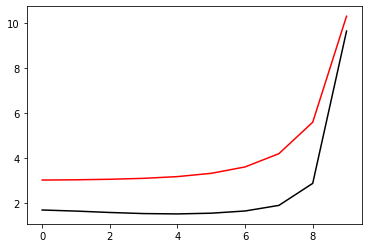

54400 54.00583996617977 -0.7172375558827075 1.0849688338181982
[1.68336712 1.63543134 1.57371061 1.52516212 1.50990133 1.54216695
 1.64001998 1.88863217 2.86714404 9.63780737]


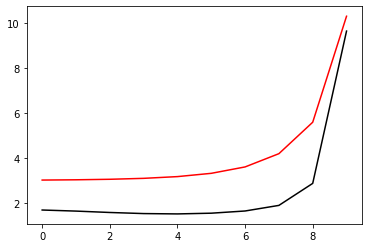

54600 54.005839966178456 -0.7172366868448115 1.0849675280297522
[1.68336762 1.63542504 1.57369697 1.52515332 1.50990357 1.54217256
 1.64002491 1.88863621 2.86714597 9.63782572]


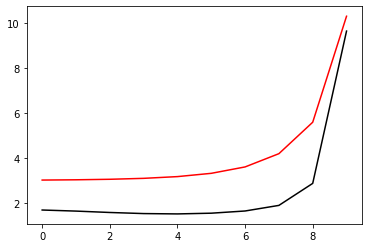

54800 54.00583998322014 -0.7172382948880361 1.0849793391371771
[1.68354964 1.63553712 1.57369187 1.52507063 1.50978319 1.54204378
 1.63991035 1.88856326 2.86715318 9.63792856]


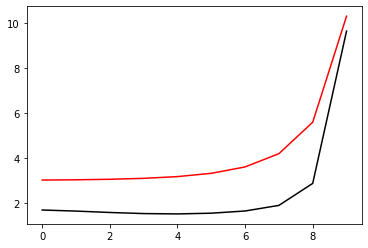

55000 54.00583996617939 -0.7172373930138741 1.084968590103294
[1.68336754 1.63542953 1.57370701 1.52516115 1.50990282 1.54216837
 1.6400211  1.88863299 2.86714419 9.63780982]


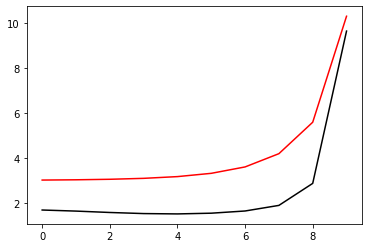

55200 54.00583996617832 -0.7172365617471425 1.0849673407791132
[1.68336742 1.63542448 1.57369585 1.525152   1.50990295 1.54217278
 1.64002538 1.88863686 2.8671469  9.63782855]


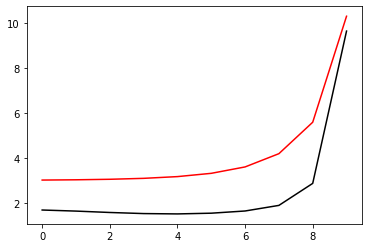

55400 54.00583996713086 -0.7172402500710632 1.084971392690766
[1.68339953 1.63548133 1.57371617 1.52512867 1.50985918 1.54212659
 1.63998621 1.88861418 2.86715526 9.63784982]


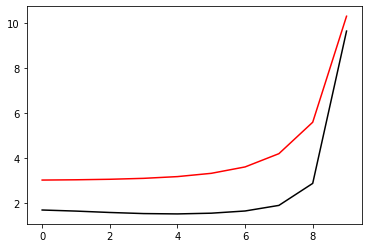

55600 54.00583996617899 -0.7172371608979324 1.0849682397858817
[1.6833677  1.6354278  1.57370324 1.52515888 1.50990354 1.54216979
 1.64002239 1.88863412 2.86714487 9.63781447]


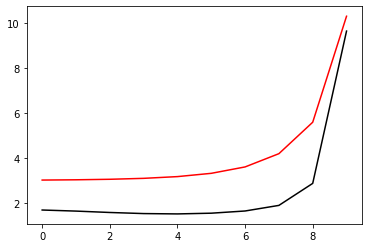

55800 54.00583996617814 -0.7172363643920285 1.084967045579583
[1.68336702 1.63542364 1.57369431 1.52515007 1.5099017  1.54217279
 1.64002606 1.888638   2.86714867 9.63783288]


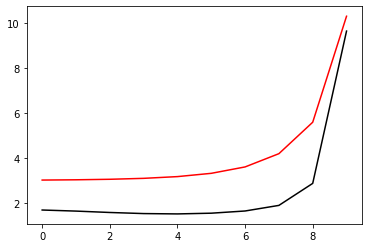

56000 54.00583996619285 -0.7172381494830897 1.0849695696478987
[1.68336627 1.63544465 1.57372227 1.52515744 1.50989212 1.54215912
 1.64001359 1.8886287  2.86714625 9.63780794]


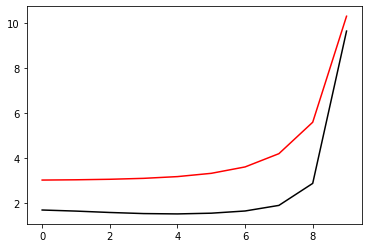

56200 54.00583996617874 -0.7172369614202414 1.0849679397356138
[1.68336782 1.63542646 1.57370012 1.52515653 1.5099041  1.54217125
 1.64002353 1.88863499 2.86714517 9.63781888]


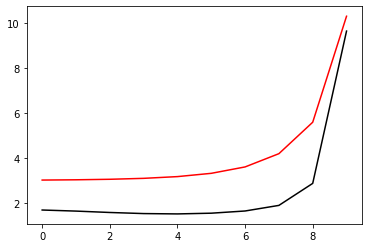

56400 54.005840009814726 -0.717241568589933 1.0849614100415175
[1.68336147 1.63541767 1.57368769 1.52514307 1.50989526 1.54216754
 1.64002141 1.88863364 2.86714471 9.63783154]


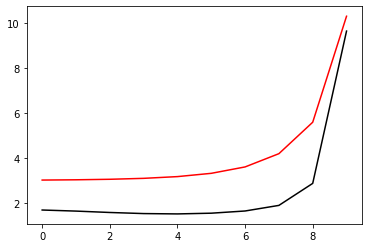

56600 54.005839966180304 -0.7172376882018899 1.0849690462859019
[1.68336655 1.63543375 1.57371436 1.52516197 1.50989932 1.54216533
 1.64001866 1.88863143 2.86714455 9.63780597]


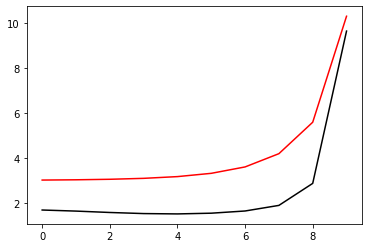

56800 54.0058399661785 -0.7172367762096236 1.0849676619293778
[1.68336772 1.63542547 1.5736979  1.52515435 1.50990386 1.54217221
 1.64002447 1.88863578 2.86714571 9.63782342]


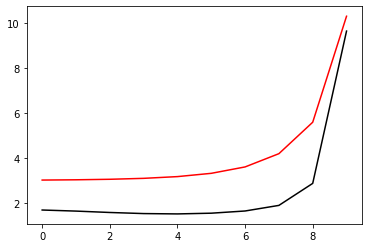

KeyboardInterrupt: 

In [63]:
optimizer=tf.optimizers.Adam(learning_rate=0.0005)
for i in range (1, 60001):
    run()
    if i%200==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

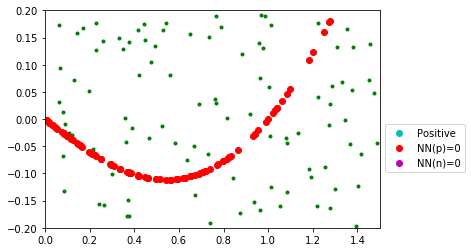

In [54]:
[Positive0, Positive1]=NN_func_01(h, Positive)
[Negative0, Negative1]=NN_func_01(h, Negative)

x_data1=[v[0] for v in Positive0]
y_data1=[v[1] for v in Positive0]
x_data2=[v[0] for v in Positive1]
y_data2=[v[1] for v in Positive1]
x_data3=[v[0] for v in Negative0]
y_data3=[v[1] for v in Negative0]
x_data4=[v[0] for v in Negative1]
y_data4=[v[1] for v in Negative1]
plt.plot(x_data4, y_data4, 'g.')
plt.plot(x_data2, y_data2, 'co', label='Positive')
plt.plot(x_data1, y_data1, 'ro', label='NN(p)=0')
plt.plot(x_data3, y_data3, 'mo', label='NN(n)=0')
plt.xlim(0.0, 1.5)
plt.ylim(-0.2, 0.2)
plt.legend(bbox_to_anchor=(1, 0.5))
plt.show()